# Mod 4 Project - Gina Durante

## Overview

The Module 4 Project in the Flatiron School Data Science Version 2 Curriculum is meant to provide students with experience in working with time series data--in this case, monthly housing values from 04/01/1996 to 03/01/2018 for over 14,000 ZIP Codes in the U.S.  Skill sets required to complete this project include dataframe manipulation, data cleaning, data visualization, and time series analysis, and other areas (e.g., using github, Jupyter notebooks for data science projects, and writing and posting a blog).  

## Project topic

The project asks the student to identify the 5 "best" ZIP codes for investment, as defined by the student, and develop support for these recommendations to a hypothetical client (e.g., a real estate investment trust).  The student must develop a methodology for evaluating ZIP codes as potential investment targets and support these findings through a technical Jupyter notebook, a non-technical PowerPoint presentation, and a blog post.  

## My focus:  Sacramento metro area

Because the investment group is located in Sacramento, and because the Sacramento area has experience steady group over the last few decades (fueled in part by skyrocketing costs in the SF Bay Area, prompting some businesses to launch or relocate here), I focused most of my efforts on the Sacramento metro area.  Because I have lived here for a number of years, I have some knowledge of the region, which has provided some helpful insights informing the analysis.

### Sacramento metro area (counties)

<center><img src='images/Sac_metro_counties_map.png' height=80% width=80%>

### Sacramento metro area (cities)

<center><img src='images/Sac_metro_cities_map.png' height=80% width=80%>

## Methodology, in brief

### Visualization of values by city and/or ZIP code, as well as of predictions of model

I developed iterative functions to visualize values by city within a metro area and across zip codes within cities in a metro area, using lists and dictionaries to iterate through the geographic areas of interest.  Using this approach, I identified 19 ZIP codes in the Sacramento region of possible interest.  Time series analysis of these 19 ZIP codes suggested 11 finalist ZIP codes to explore further.  From those, I selected 5 that I thought provided good (potentially great) returns, while limiting downside risk.  

### Consideration of predicted values, worst- and best-case scenarios, and other factors in the selection process

While the predicted returns over the forecast time horizon were of primary concern, I also took into account the worst-case scenario returns, the best-case scenario returns, the population in the ZIP code, the geographic location of the ZIP code, and personal knowledge of the area to inform my decision-making process.  More information is provided in the "Decision-making process" section of the "Recommended ZIP codes" section at the end of this notebook.


### County representation in finalist and top 5 selected ZIP codes

One of those ZIP codes was in El Dorado County, and the other four were in Placer County.  While there may be promising ZIP codes in both Sacramento and Yolo Counties, Sacramento City ZIP codes that I analyzed were not as competitive as those of Placer County.  I only analyzed one ZIP code in Yolo County (95616 in Davis), though others looked similar in terms of their pattern and trends.  It would probably be worthwhile to analyze one of the two ZIP codes in West Sacramento, as West Sac is an area that has been on the upswing for several years.  


## Possible future directions

Beyond analysis of at least one more ZIP code in the Sacramento area, I've identified several other possible future directions for this work:
- While time limitations prevented a broader evaluation of investment opportunities across the country, the functions I developed allow visualizations of broader swaths of the data (e.g., values by metro area, values by city within a metro area, values by zip codes and cities within a metro area).  
  - Creating visualizations at various geographic levels was very useful for identifying patterns that could signify promising investment opportunities.  
  - From this effort, I identified some geographic areas, such as the Dallas-Fort Worth and the Pittsburg metro areas, that could be worthwhile to explore in future efforts.  
- It could be interesting and potentially valuable to do some backtesting on the model to see how well it predicts the last 24 months for which we have data (May 2016 through April 2018).
- Analyzing shorter time frames (e.g., 2013-2018)
- Scaling investment by population size 
- Construct a basket of investments (e.g., $10M, weighted by ZIP population?)

## A few words on the notebook that follows...

The notebook below is what I used for performing my analyses and arriving at results.  Thus, it is technical and includes all code.  It will most likely be revised over time, so individuals interested in this work should check back periodically.  At the very end of this notebook is a table (small dataframe) that summarizes my analyses.  

# Step 1: Load the Data/Filtering for Chosen Zipcodes

In [1]:
import numpy as np
import pandas as pd
import matplotlib 
import matplotlib.pyplot as plt
import matplotlib as mpl
%matplotlib inline
import seaborn as sn

In [2]:
pd.set_option("display.max_rows", 1000)

In [3]:
pd.get_option("display.max_rows")

1000

In [4]:
df = pd.read_csv('zillow_data.csv')

In [5]:
df.head()

,RegionID,RegionName,City,State,Metro,CountyName,SizeRank,1996-04,1996-05,1996-06,...,2017-07,2017-08,2017-09,2017-10,2017-11,2017-12,2018-01,2018-02,2018-03,2018-04
0,84654,60657,Chicago,IL,Chicago,Cook,1,334200.0,335400.0,336500.0,...,1005500,1007500,1007800,1009600,1013300,1018700,1024400,1030700,1033800,1030600
1,90668,75070,McKinney,TX,Dallas-Fort Worth,Collin,2,235700.0,236900.0,236700.0,...,308000,310000,312500,314100,315000,316600,318100,319600,321100,321800
2,91982,77494,Katy,TX,Houston,Harris,3,210400.0,212200.0,212200.0,...,321000,320600,320200,320400,320800,321200,321200,323000,326900,329900
3,84616,60614,Chicago,IL,Chicago,Cook,4,498100.0,500900.0,503100.0,...,1289800,1287700,1287400,1291500,1296600,1299000,1302700,1306400,1308500,1307000
4,93144,79936,El Paso,TX,El Paso,El Paso,5,77300.0,77300.0,77300.0,...,119100,119400,120000,120300,120300,120300,120300,120500,121000,121500


In [6]:
df.loc[df.RegionName == 95616]     # also acceptable:  df.loc[df['RegionName'] == 95616]


,RegionID,RegionName,City,State,Metro,CountyName,SizeRank,1996-04,1996-05,1996-06,...,2017-07,2017-08,2017-09,2017-10,2017-11,2017-12,2018-01,2018-02,2018-03,2018-04
954,98312,95616,Davis,CA,Sacramento,Yolo,955,202500.0,202500.0,202500.0,...,683600,682800,679400,674400,677200,687700,696700,697500,695000,692300


# Step 2: Data Preprocessing

## Convert time data type to datetime format

In [7]:
def get_datetimes(df):
    return pd.to_datetime(df.columns.values[7:], format='%Y-%m', errors = 'raise')

In [8]:
get_datetimes(df)

DatetimeIndex(['1996-04-01', '1996-05-01', '1996-06-01', '1996-07-01',
               '1996-08-01', '1996-09-01', '1996-10-01', '1996-11-01',
               '1996-12-01', '1997-01-01',
               ...
               '2017-07-01', '2017-08-01', '2017-09-01', '2017-10-01',
               '2017-11-01', '2017-12-01', '2018-01-01', '2018-02-01',
               '2018-03-01', '2018-04-01'],
              dtype='datetime64[ns]', length=265, freq=None)

## Fix problem with ZIP codes beginning with '0'

I have surmised that RegionName is the ZIP code for each entry.  RegionName values with only 4 digits represent ZIP codes that actually begin with '0'.  So that I can work with ZIP codes in the data set, I will need to add that zero onto every 4-digit RegionName value.  Once that's completed, I'll rename this column "ZipCode".  

In [9]:
df.head(7)

,RegionID,RegionName,City,State,Metro,CountyName,SizeRank,1996-04,1996-05,1996-06,...,2017-07,2017-08,2017-09,2017-10,2017-11,2017-12,2018-01,2018-02,2018-03,2018-04
0,84654,60657,Chicago,IL,Chicago,Cook,1,334200.0,335400.0,336500.0,...,1005500,1007500,1007800,1009600,1013300,1018700,1024400,1030700,1033800,1030600
1,90668,75070,McKinney,TX,Dallas-Fort Worth,Collin,2,235700.0,236900.0,236700.0,...,308000,310000,312500,314100,315000,316600,318100,319600,321100,321800
2,91982,77494,Katy,TX,Houston,Harris,3,210400.0,212200.0,212200.0,...,321000,320600,320200,320400,320800,321200,321200,323000,326900,329900
3,84616,60614,Chicago,IL,Chicago,Cook,4,498100.0,500900.0,503100.0,...,1289800,1287700,1287400,1291500,1296600,1299000,1302700,1306400,1308500,1307000
4,93144,79936,El Paso,TX,El Paso,El Paso,5,77300.0,77300.0,77300.0,...,119100,119400,120000,120300,120300,120300,120300,120500,121000,121500
5,91733,77084,Houston,TX,Houston,Harris,6,95000.0,95200.0,95400.0,...,157900,158700,160200,161900,162800,162800,162800,162900,163500,164300
6,61807,10467,New York,NY,New York,Bronx,7,152900.0,152700.0,152600.0,...,394400,400000,407300,411600,413200,414300,413900,411400,413200,417900


In [10]:
# df.RegionName.sort_values().head(10)

df.sort_values(by="RegionName").head(7)

,RegionID,RegionName,City,State,Metro,CountyName,SizeRank,1996-04,1996-05,1996-06,...,2017-07,2017-08,2017-09,2017-10,2017-11,2017-12,2018-01,2018-02,2018-03,2018-04
5850,58196,1001,Agawam,MA,Springfield,Hampden,5851,113100.0,112800.0,112600.0,...,213900,215700,218200,220100,221100,221700,221700,221700,222700,223600
4199,58197,1002,Amherst,MA,Springfield,Hampshire,4200,161000.0,160100.0,159300.0,...,333700,334800,336700,338900,340400,342000,344500,347400,350600,353300
11213,58200,1005,Barre,MA,Worcester,Worcester,11214,103100.0,103400.0,103600.0,...,205600,206800,208800,210400,211300,213300,215600,217900,219500,220700
6850,58201,1007,Belchertown,MA,Springfield,Hampshire,6851,133400.0,132700.0,132000.0,...,266100,266300,267000,267500,268000,268100,268100,268800,270000,270600
14547,58202,1008,Blandford,MA,Springfield,Hampden,14548,117500.0,117300.0,117100.0,...,202400,202900,205900,208500,207500,205400,204500,206800,210900,214200
11702,58204,1010,Brimfield,MA,Springfield,Hampden,11703,115800.0,115700.0,115500.0,...,246400,247500,249100,248800,245400,243800,244600,246700,248800,250900
14475,58205,1011,Chester,MA,Springfield,Hampden,14476,87000.0,87000.0,87100.0,...,160200,156700,156600,157700,155400,151400,150100,150100,149500,149100


In [11]:
df['RegionName'] = df.RegionName.astype(str)
df['RegionName'].dtype


dtype('O')

In [12]:
df.rename(columns={'RegionName': 'Zip'}, inplace=True)
df.columns
df.head()

,RegionID,Zip,City,State,Metro,CountyName,SizeRank,1996-04,1996-05,1996-06,...,2017-07,2017-08,2017-09,2017-10,2017-11,2017-12,2018-01,2018-02,2018-03,2018-04
0,84654,60657,Chicago,IL,Chicago,Cook,1,334200.0,335400.0,336500.0,...,1005500,1007500,1007800,1009600,1013300,1018700,1024400,1030700,1033800,1030600
1,90668,75070,McKinney,TX,Dallas-Fort Worth,Collin,2,235700.0,236900.0,236700.0,...,308000,310000,312500,314100,315000,316600,318100,319600,321100,321800
2,91982,77494,Katy,TX,Houston,Harris,3,210400.0,212200.0,212200.0,...,321000,320600,320200,320400,320800,321200,321200,323000,326900,329900
3,84616,60614,Chicago,IL,Chicago,Cook,4,498100.0,500900.0,503100.0,...,1289800,1287700,1287400,1291500,1296600,1299000,1302700,1306400,1308500,1307000
4,93144,79936,El Paso,TX,El Paso,El Paso,5,77300.0,77300.0,77300.0,...,119100,119400,120000,120300,120300,120300,120300,120500,121000,121500


In [13]:
zips = []

for i in df['Zip']:
    if len(i) < 5:
        i = '0' + i
        zips.append(i)
    else:
        zips.append(i)

zips
df['Zip'] = pd.Series(zips)
df.sort_values(by='Zip').head()
# df.head()

,RegionID,Zip,City,State,Metro,CountyName,SizeRank,1996-04,1996-05,1996-06,...,2017-07,2017-08,2017-09,2017-10,2017-11,2017-12,2018-01,2018-02,2018-03,2018-04
5850,58196,01001,Agawam,MA,Springfield,Hampden,5851,113100.0,112800.0,112600.0,...,213900,215700,218200,220100,221100,221700,221700,221700,222700,223600
4199,58197,01002,Amherst,MA,Springfield,Hampshire,4200,161000.0,160100.0,159300.0,...,333700,334800,336700,338900,340400,342000,344500,347400,350600,353300
11213,58200,01005,Barre,MA,Worcester,Worcester,11214,103100.0,103400.0,103600.0,...,205600,206800,208800,210400,211300,213300,215600,217900,219500,220700
6850,58201,01007,Belchertown,MA,Springfield,Hampshire,6851,133400.0,132700.0,132000.0,...,266100,266300,267000,267500,268000,268100,268100,268800,270000,270600
14547,58202,01008,Blandford,MA,Springfield,Hampden,14548,117500.0,117300.0,117100.0,...,202400,202900,205900,208500,207500,205400,204500,206800,210900,214200


## Creating US dataframe (df_melt) using melt function

In [14]:
def melt_data(df):
    melted = pd.melt(df, id_vars=['RegionID', 'Zip', 'City', 'State', 'Metro', 'CountyName', 'SizeRank'], var_name='time')
    melted['time'] = pd.to_datetime(melted['time'], infer_datetime_format=False)
    melted = melted.dropna(subset=['value'])
    return melted   

In [15]:
df_melt = melt_data(df)


In [16]:
df_melt.head()

,RegionID,Zip,City,State,Metro,CountyName,SizeRank,time,value
0,84654,60657,Chicago,IL,Chicago,Cook,1,1996-04-01,334200.0
1,90668,75070,McKinney,TX,Dallas-Fort Worth,Collin,2,1996-04-01,235700.0
2,91982,77494,Katy,TX,Houston,Harris,3,1996-04-01,210400.0
3,84616,60614,Chicago,IL,Chicago,Cook,4,1996-04-01,498100.0
4,93144,79936,El Paso,TX,El Paso,El Paso,5,1996-04-01,77300.0


In [17]:
df_melt.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 3744704 entries, 0 to 3901594
Data columns (total 9 columns):
RegionID      int64
Zip           object
City          object
State         object
Metro         object
CountyName    object
SizeRank      int64
time          datetime64[ns]
value         float64
dtypes: datetime64[ns](1), float64(1), int64(2), object(5)
memory usage: 285.7+ MB


In [18]:
df_melt.set_index('time')

,RegionID,Zip,City,State,Metro,CountyName,SizeRank,value
time,,,,,,,,
1996-04-01,84654,60657,Chicago,IL,Chicago,Cook,1,334200.0
1996-04-01,90668,75070,McKinney,TX,Dallas-Fort Worth,Collin,2,235700.0
1996-04-01,91982,77494,Katy,TX,Houston,Harris,3,210400.0
1996-04-01,84616,60614,Chicago,IL,Chicago,Cook,4,498100.0
1996-04-01,93144,79936,El Paso,TX,El Paso,El Paso,5,77300.0
...,...,...,...,...,...,...,...,...
2018-04-01,58333,01338,Ashfield,MA,Greenfield Town,Franklin,14719,209300.0
2018-04-01,59107,03293,Woodstock,NH,Claremont,Grafton,14720,225800.0
2018-04-01,75672,40404,Berea,KY,Richmond,Madison,14721,133400.0


In [19]:
## Dropping RegionID:

df_melt.drop('RegionID', axis=1, inplace=True)

In [20]:
df_melt.head()

,Zip,City,State,Metro,CountyName,SizeRank,time,value
0,60657,Chicago,IL,Chicago,Cook,1,1996-04-01,334200.0
1,75070,McKinney,TX,Dallas-Fort Worth,Collin,2,1996-04-01,235700.0
2,77494,Katy,TX,Houston,Harris,3,1996-04-01,210400.0
3,60614,Chicago,IL,Chicago,Cook,4,1996-04-01,498100.0
4,79936,El Paso,TX,El Paso,El Paso,5,1996-04-01,77300.0


Dataframe is sorted by SizeRank by default.

In [21]:
df_melt.isna().sum()

Zip                0
City               0
State              0
Metro         236023
CountyName         0
SizeRank           0
time               0
value              0
dtype: int64

In [22]:
df_melt['Metro'].fillna('Missing', inplace=True)
df_melt.isna().sum()

Zip           0
City          0
State         0
Metro         0
CountyName    0
SizeRank      0
time          0
value         0
dtype: int64

In [23]:
# Sorting by zip code, then time

df_melt.sort_values(by=['Zip', 'time'])

,Zip,City,State,Metro,CountyName,SizeRank,time,value
5850,01001,Agawam,MA,Springfield,Hampden,5851,1996-04-01,113100.0
20573,01001,Agawam,MA,Springfield,Hampden,5851,1996-05-01,112800.0
35296,01001,Agawam,MA,Springfield,Hampden,5851,1996-06-01,112600.0
50019,01001,Agawam,MA,Springfield,Hampden,5851,1996-07-01,112300.0
64742,01001,Agawam,MA,Springfield,Hampden,5851,1996-08-01,112100.0
...,...,...,...,...,...,...,...,...
3835273,99901,Ketchikan,AK,Ketchikan,Ketchikan Gateway,7294,2017-12-01,291900.0
3849996,99901,Ketchikan,AK,Ketchikan,Ketchikan Gateway,7294,2018-01-01,294200.0
3864719,99901,Ketchikan,AK,Ketchikan,Ketchikan Gateway,7294,2018-02-01,297500.0
3879442,99901,Ketchikan,AK,Ketchikan,Ketchikan Gateway,7294,2018-03-01,302100.0


Note that a few zip codes are missing; these rows were eliminated when Zip codes with NaN values in the 'value' column were dropped.

In [24]:
df_melt.nunique()

Zip           14723
City           7554
State            51
Metro           702
CountyName     1212
SizeRank      14723
time            265
value         24372
dtype: int64

### Creating new column, MetroState, to address duplicate metro names in different states (e.g., Aberdeen in multiple states)

In [25]:
df_melt['MetroState'] = df_melt['Metro'] + ' ' + df_melt['State']

In [26]:
df_melt.head()

,Zip,City,State,Metro,CountyName,SizeRank,time,value,MetroState
0,60657,Chicago,IL,Chicago,Cook,1,1996-04-01,334200.0,Chicago IL
1,75070,McKinney,TX,Dallas-Fort Worth,Collin,2,1996-04-01,235700.0,Dallas-Fort Worth TX
2,77494,Katy,TX,Houston,Harris,3,1996-04-01,210400.0,Houston TX
3,60614,Chicago,IL,Chicago,Cook,4,1996-04-01,498100.0,Chicago IL
4,79936,El Paso,TX,El Paso,El Paso,5,1996-04-01,77300.0,El Paso TX


# Step 3A:  Exploratory Data Analysis--Creating dataframes of values by different geographic units

## Creating US dataframes 

### Creating df_metro (US metro df) with monthly values by Zip

In [27]:
df_melt.set_index('time', inplace=True)

In [28]:
df_melt.head()

,Zip,City,State,Metro,CountyName,SizeRank,value,MetroState
time,,,,,,,,
1996-04-01,60657,Chicago,IL,Chicago,Cook,1,334200.0,Chicago IL
1996-04-01,75070,McKinney,TX,Dallas-Fort Worth,Collin,2,235700.0,Dallas-Fort Worth TX
1996-04-01,77494,Katy,TX,Houston,Harris,3,210400.0,Houston TX
1996-04-01,60614,Chicago,IL,Chicago,Cook,4,498100.0,Chicago IL
1996-04-01,79936,El Paso,TX,El Paso,El Paso,5,77300.0,El Paso TX


Note:  the dataframe is sorted by zipcode SizeRank by default.  

In [29]:
df_metro = df_melt.groupby(['Metro', 'MetroState', 'CountyName', 'City', 'Zip', 'time']).mean().reset_index()


In [30]:
df_metro.head(10)

,Metro,MetroState,CountyName,City,Zip,time,SizeRank,value
0,Aberdeen,Aberdeen WA,Grays Harbor,Aberdeen,98520,1996-04-01,5029,86600.0
1,Aberdeen,Aberdeen WA,Grays Harbor,Aberdeen,98520,1996-05-01,5029,86300.0
2,Aberdeen,Aberdeen WA,Grays Harbor,Aberdeen,98520,1996-06-01,5029,86100.0
3,Aberdeen,Aberdeen WA,Grays Harbor,Aberdeen,98520,1996-07-01,5029,85900.0
4,Aberdeen,Aberdeen WA,Grays Harbor,Aberdeen,98520,1996-08-01,5029,85700.0
5,Aberdeen,Aberdeen WA,Grays Harbor,Aberdeen,98520,1996-09-01,5029,85600.0
6,Aberdeen,Aberdeen WA,Grays Harbor,Aberdeen,98520,1996-10-01,5029,85600.0
7,Aberdeen,Aberdeen WA,Grays Harbor,Aberdeen,98520,1996-11-01,5029,85700.0
8,Aberdeen,Aberdeen WA,Grays Harbor,Aberdeen,98520,1996-12-01,5029,85800.0
9,Aberdeen,Aberdeen WA,Grays Harbor,Aberdeen,98520,1997-01-01,5029,85900.0


In [31]:
df_metro.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3744704 entries, 0 to 3744703
Data columns (total 8 columns):
Metro         object
MetroState    object
CountyName    object
City          object
Zip           object
time          datetime64[ns]
SizeRank      int64
value         float64
dtypes: datetime64[ns](1), float64(1), int64(1), object(5)
memory usage: 228.6+ MB


In [32]:
df_metro.set_index('time', inplace=True)

In [33]:
df_metro.head()

,Metro,MetroState,CountyName,City,Zip,SizeRank,value
time,,,,,,,
1996-04-01,Aberdeen,Aberdeen WA,Grays Harbor,Aberdeen,98520,5029,86600.0
1996-05-01,Aberdeen,Aberdeen WA,Grays Harbor,Aberdeen,98520,5029,86300.0
1996-06-01,Aberdeen,Aberdeen WA,Grays Harbor,Aberdeen,98520,5029,86100.0
1996-07-01,Aberdeen,Aberdeen WA,Grays Harbor,Aberdeen,98520,5029,85900.0
1996-08-01,Aberdeen,Aberdeen WA,Grays Harbor,Aberdeen,98520,5029,85700.0


In [34]:
df_metro.nunique()

Metro           702
MetroState      865
CountyName     1212
City           7554
Zip           14723
SizeRank      14723
value         24372
dtype: int64

### Creating df_metro_cities (US Metros df with *City* mean values)

In [35]:
df_metro_cities = df_metro.groupby(['MetroState', 'CountyName', 'City', 'time']).mean().reset_index()

In [36]:
df_metro_cities.head(10)

,MetroState,CountyName,City,time,SizeRank,value
0,Aberdeen WA,Grays Harbor,Aberdeen,1996-04-01,5029.0,86600.0
1,Aberdeen WA,Grays Harbor,Aberdeen,1996-05-01,5029.0,86300.0
2,Aberdeen WA,Grays Harbor,Aberdeen,1996-06-01,5029.0,86100.0
3,Aberdeen WA,Grays Harbor,Aberdeen,1996-07-01,5029.0,85900.0
4,Aberdeen WA,Grays Harbor,Aberdeen,1996-08-01,5029.0,85700.0
5,Aberdeen WA,Grays Harbor,Aberdeen,1996-09-01,5029.0,85600.0
6,Aberdeen WA,Grays Harbor,Aberdeen,1996-10-01,5029.0,85600.0
7,Aberdeen WA,Grays Harbor,Aberdeen,1996-11-01,5029.0,85700.0
8,Aberdeen WA,Grays Harbor,Aberdeen,1996-12-01,5029.0,85800.0
9,Aberdeen WA,Grays Harbor,Aberdeen,1997-01-01,5029.0,85900.0


In [37]:
df_metro_cities.set_index('time', inplace=True)

In [38]:
df_metro_cities.drop('SizeRank', axis=1, inplace=True)

In [39]:
df_metro_cities.head()

,MetroState,CountyName,City,value
time,,,,
1996-04-01,Aberdeen WA,Grays Harbor,Aberdeen,86600.0
1996-05-01,Aberdeen WA,Grays Harbor,Aberdeen,86300.0
1996-06-01,Aberdeen WA,Grays Harbor,Aberdeen,86100.0
1996-07-01,Aberdeen WA,Grays Harbor,Aberdeen,85900.0
1996-08-01,Aberdeen WA,Grays Harbor,Aberdeen,85700.0


In [40]:
df_metro_cities.nunique()

MetroState      865
CountyName     1212
City           7554
value         83532
dtype: int64

### Creating df_metro_values (US Metros df with *Metro* mean values)

In [41]:
df_metro_values = df_melt.groupby(['MetroState', 'State', 'time']).mean().reset_index()

In [42]:
df_metro_values.head()

,MetroState,State,time,SizeRank,value
0,Aberdeen WA,WA,1996-04-01,10259.5,95910.0
1,Aberdeen WA,WA,1996-05-01,10259.5,95840.0
2,Aberdeen WA,WA,1996-06-01,10259.5,95800.0
3,Aberdeen WA,WA,1996-07-01,10259.5,95760.0
4,Aberdeen WA,WA,1996-08-01,10259.5,95710.0


In [43]:
df_metro_values = df_metro_values.set_index('time')

In [44]:
df_metro_values.drop('SizeRank', axis=1, inplace=True)

In [45]:
df_metro_values.head()

,MetroState,State,value
time,,,
1996-04-01,Aberdeen WA,WA,95910.0
1996-05-01,Aberdeen WA,WA,95840.0
1996-06-01,Aberdeen WA,WA,95800.0
1996-07-01,Aberdeen WA,WA,95760.0
1996-08-01,Aberdeen WA,WA,95710.0


In [46]:
df_metro_values.MetroState.value_counts().head()

Springfield MA       265
Fredericksburg TX    265
Port Angeles WA      265
Show Low AZ          265
Grand Island NE      265
Name: MetroState, dtype: int64

In [47]:
df_metro_values.nunique()

MetroState       865
State             51
value         101543
dtype: int64

In [48]:
df_metro_values.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 218935 entries, 1996-04-01 to 2018-04-01
Data columns (total 3 columns):
MetroState    218935 non-null object
State         218935 non-null object
value         218935 non-null float64
dtypes: float64(1), object(2)
memory usage: 6.7+ MB


## df_geog:  Function for creating a dataframe based on particular geographic unit (e.g., MetroState area, City, CountyName)

In [49]:
def df_geog(df, col, geog):
    
    '''Creates subset dataframe containing just the geographic unit 
    (e.g., 'MetroState' == 'Sacramento CA', 'City' == 'Davis', etc.) of interest.  
    It is necessary to set df equal to a dataframe with the appropriate geographic grouping: 
    e.g., to plot values by city in a metro aree, df = df_metro_cities, col = 'MetroState',
    geog = 'Sacramento CA' (or metro area of interest). 
    '''
    df_metro_cities_geog = df.loc[df[col] == geog]
    return df_metro_cities_geog


## Creating Sacramento Metro dataframes

### df_sac:  Sac Metro dataframe, values by Zip code

In [50]:
# df_sac = df_melt.loc[df_melt.Metro == 'Sacramento']  # use if function below throws an error

df_sac = df_geog(df=df_metro, col = 'MetroState', geog = 'Sacramento CA')

In [51]:
df_sac

,Metro,MetroState,CountyName,City,Zip,SizeRank,value
time,,,,,,,
1996-04-01,Sacramento,Sacramento CA,El Dorado,Camino,95709,10422,141500.0
1996-05-01,Sacramento,Sacramento CA,El Dorado,Camino,95709,10422,141500.0
1996-06-01,Sacramento,Sacramento CA,El Dorado,Camino,95709,10422,141500.0
1996-07-01,Sacramento,Sacramento CA,El Dorado,Camino,95709,10422,141500.0
1996-08-01,Sacramento,Sacramento CA,El Dorado,Camino,95709,10422,141600.0
...,...,...,...,...,...,...,...
2017-12-01,Sacramento,Sacramento CA,Yolo,Woodland,95776,5094,391100.0
2018-01-01,Sacramento,Sacramento CA,Yolo,Woodland,95776,5094,397800.0
2018-02-01,Sacramento,Sacramento CA,Yolo,Woodland,95776,5094,401000.0


### df_sac_cities:  Sacramento, CA metro area values by city

In [52]:
# Example:  Sacramento CA 

df_sac_cities = df_geog(df=df_metro_cities, col = 'MetroState', geog = 'Sacramento CA')

In [53]:
df_sac_cities.head()

,MetroState,CountyName,City,value
time,,,,
1996-04-01,Sacramento CA,El Dorado,Camino,141500.0
1996-05-01,Sacramento CA,El Dorado,Camino,141500.0
1996-06-01,Sacramento CA,El Dorado,Camino,141500.0
1996-07-01,Sacramento CA,El Dorado,Camino,141500.0
1996-08-01,Sacramento CA,El Dorado,Camino,141600.0


# Step 3B:  Creating lists and dictionaries for iterating through dataframes

## Function to print first n number of items in a dictionary


In [54]:
# function to print first n number of items in a dictionary

def print_first_n(dictionary, n):
    return {k: dictionary[k] for k in list(dictionary)[:n]}

## Search metro area by str.contains

In [55]:
# df_metro_values[df_metro_values['MetroState'].str.contains('New York', regex=False)]


## Creating Sacramento Metro dataframes, lists, and dictionaries

### df_sac:  Sac Metro dataframe, values by Zip code

In [56]:
# df_sac = df_melt.loc[df_melt.Metro == 'Sacramento']  # use if function below throws an error

df_sac = df_geog(df=df_metro, col = 'MetroState', geog = 'Sacramento CA')

In [57]:
df_sac

,Metro,MetroState,CountyName,City,Zip,SizeRank,value
time,,,,,,,
1996-04-01,Sacramento,Sacramento CA,El Dorado,Camino,95709,10422,141500.0
1996-05-01,Sacramento,Sacramento CA,El Dorado,Camino,95709,10422,141500.0
1996-06-01,Sacramento,Sacramento CA,El Dorado,Camino,95709,10422,141500.0
1996-07-01,Sacramento,Sacramento CA,El Dorado,Camino,95709,10422,141500.0
1996-08-01,Sacramento,Sacramento CA,El Dorado,Camino,95709,10422,141600.0
...,...,...,...,...,...,...,...
2017-12-01,Sacramento,Sacramento CA,Yolo,Woodland,95776,5094,391100.0
2018-01-01,Sacramento,Sacramento CA,Yolo,Woodland,95776,5094,397800.0
2018-02-01,Sacramento,Sacramento CA,Yolo,Woodland,95776,5094,401000.0


### df_sac_cities:  Sacramento, CA metro area values by city

In [58]:
# Example:  Sacramento CA 

df_sac_cities = df_geog(df=df_metro_cities, col = 'MetroState', geog = 'Sacramento CA')

In [59]:
df_sac_cities.head()

,MetroState,CountyName,City,value
time,,,,
1996-04-01,Sacramento CA,El Dorado,Camino,141500.0
1996-05-01,Sacramento CA,El Dorado,Camino,141500.0
1996-06-01,Sacramento CA,El Dorado,Camino,141500.0
1996-07-01,Sacramento CA,El Dorado,Camino,141500.0
1996-08-01,Sacramento CA,El Dorado,Camino,141600.0


### Creating sac_metro_cities list from df_sac

In [60]:
sac_metro_cities = list(set(df_sac.City))
sac_metro_cities[:5]

['Georgetown', 'Pollock Pines', 'Pilot Hill', 'Elk Grove', 'Tahoe City']

In [61]:
sac_metro_cities.sort()
sac_metro_cities[:5]


['Applegate', 'Arden-Arcade', 'Auburn', 'Camino', 'Carmichael']

### Creating sac_metro_zips list from zips in Sac Metro area

In [62]:
sac_metro_zips = list(set(df_sac.Zip))
sac_metro_zips[:5]

['95765', '95632', '95695', '95664', '95831']

### Creating dict_zips_cities dictionary to graph zips by city

In [63]:
df_sac_one_val = df_sac.groupby(['CountyName', 'City', 'Zip']).mean().reset_index()

In [64]:
df_sac_one_val.sort_values(by=['Zip']).head()

#### Seeking to create the dictionary showing just the unique zip code instance rather than repeating it for each row of data) 

,CountyName,City,Zip,SizeRank,value
17,Placer,Auburn,95602,6185,348386.415094
18,Placer,Auburn,95603,3614,311752.830189
87,Yolo,West Sacramento,95605,7483,160125.283019
41,Sacramento,Carmichael,95608,127,286006.415094
42,Sacramento,Citrus Heights,95610,1058,235864.150943


In [266]:
from collections import defaultdict

dict_sac_zips_cities = defaultdict(list)

for idx,row in df_sac_one_val.iterrows():
    dict_sac_zips_cities[row['City']].append(row['Zip'])
    
print(dict_sac_zips_cities)

defaultdict(<class 'list'>, {'Camino': ['95709'], 'Cool': ['95614'], 'Diamond Springs': ['95619'], 'El Dorado': ['95623'], 'El Dorado Hills': ['95762'], 'Garden Valley': ['95633'], 'Georgetown': ['95634'], 'Pilot Hill': ['95664'], 'Placerville': ['95667'], 'Pollock Pines': ['95726'], 'Rescue': ['95672'], 'Shingle Springs': ['95682'], 'Somerset': ['95636', '95684'], 'South Lake Tahoe': ['96150'], 'Tahoma': ['96142'], 'Applegate': ['95703'], 'Auburn': ['95602', '95603'], 'Carnelian Bay': ['96140'], 'Colfax': ['95713'], 'Foresthill': ['95631'], 'Granite Bay': ['95746'], 'Homewood': ['96141'], 'Kings Beach': ['96143'], 'Lincoln': ['95648'], 'Loomis': ['95650'], 'Meadow Vista': ['95722'], 'Newcastle': ['95658'], 'Penryn': ['95663'], 'Rocklin': ['95677', '95765'], 'Roseville': ['95661', '95678', '95747'], 'Tahoe City': ['96145', '96146'], 'Tahoe Vista': ['96148'], 'Arden-Arcade': ['95821', '95825', '95864'], 'Carmichael': ['95608'], 'Citrus Heights': ['95610', '95621'], 'Elk Grove': ['95624'

In [274]:
# od = collections.OrderedDict(sorted(d.items()))

from collections import OrderedDict

# Create Ordered dictionary of cities and zip codes

ordict_sac_zips_cities = OrderedDict(sorted(dict_sac_zips_cities.items()))
                                     
type(ordict_sac_zips_cities)


collections.OrderedDict

In [283]:
ordict_sac_zips_cities

OrderedDict([('Applegate', ['95703']),
             ('Arden-Arcade', ['95821', '95825', '95864']),
             ('Auburn', ['95602', '95603']),
             ('Camino', ['95709']),
             ('Carmichael', ['95608']),
             ('Carnelian Bay', ['96140']),
             ('Citrus Heights', ['95610', '95621']),
             ('Colfax', ['95713']),
             ('Cool', ['95614']),
             ('Davis', ['95616', '95618']),
             ('Diamond Springs', ['95619']),
             ('El Dorado', ['95623']),
             ('El Dorado Hills', ['95762']),
             ('Elk Grove', ['95624', '95757', '95758']),
             ('Elverta', ['95626']),
             ('Esparto', ['95627']),
             ('Fair Oaks', ['95628']),
             ('Florin', ['95828']),
             ('Folsom', ['95630']),
             ('Foresthill', ['95631']),
             ('Galt', ['95632']),
             ('Garden Valley', ['95633']),
             ('Georgetown', ['95634']),
             ('Granite Bay', ['95746']),
 

In [286]:
dict_sac_zips_cities = dict(sorted(ordict_sac_zips_cities.items()))
# dict_sac_zips_cities

In [281]:
import itertools

dict(itertools.islice(dict_sac_zips_cities.items(), 6))


{'Applegate': ['95703'],
 'Arden-Arcade': ['95821', '95825', '95864'],
 'Auburn': ['95602', '95603'],
 'Camino': ['95709'],
 'Carmichael': ['95608'],
 'Carnelian Bay': ['96140']}

In [ ]:
dict(itertools.islice(dict_sac_zips_cities.items(), 6))

In [ ]:
# the dictionary
dict_sac_zips_cities

# the subset of keys I'm interested in
l = (x)

>>>{key:d[key] for key in set(l) & set(d)}
{1: 2, 5: 6}

### Function to return slice of an ordered dictionary (this one sorted by city name)

In [284]:
def return_slice(dictionary, m, n):
    slice = {k: dictionary[k] for k in list(dictionary)[m:n]}
    return slice

In [290]:
dict_0_6 = return_slice(dict_sac_zips_cities, 0, 6)
dict_0_6

{'Applegate': ['95703'],
 'Arden-Arcade': ['95821', '95825', '95864'],
 'Auburn': ['95602', '95603'],
 'Camino': ['95709'],
 'Carmichael': ['95608'],
 'Carnelian Bay': ['96140']}

In [292]:
dict_6_12 = return_slice(dict_sac_zips_cities, 6, 12)
dict_6_12

{'Citrus Heights': ['95610', '95621'],
 'Colfax': ['95713'],
 'Cool': ['95614'],
 'Davis': ['95616', '95618'],
 'Diamond Springs': ['95619'],
 'El Dorado': ['95623']}

In [293]:
dict_12_18 = return_slice(dict_sac_zips_cities, 12, 18)
dict_12_18

{'El Dorado Hills': ['95762'],
 'Elk Grove': ['95624', '95757', '95758'],
 'Elverta': ['95626'],
 'Esparto': ['95627'],
 'Fair Oaks': ['95628'],
 'Florin': ['95828']}

In [294]:
dict_18_24 = return_slice(dict_sac_zips_cities, 18, 24)
dict_18_24

{'Folsom': ['95630'],
 'Foresthill': ['95631'],
 'Galt': ['95632'],
 'Garden Valley': ['95633'],
 'Georgetown': ['95634'],
 'Granite Bay': ['95746']}

In [295]:
dict_24_30 = return_slice(dict_sac_zips_cities, 24, 30)
dict_24_30

{'Herald': ['95638'],
 'Homewood': ['96141'],
 'Kings Beach': ['96143'],
 'Lincoln': ['95648'],
 'Loomis': ['95650'],
 'Mather Air Force Base': ['95655']}

In [296]:
dict_30_36 = return_slice(dict_sac_zips_cities, 30, 36)
dict_30_36

{'Meadow Vista': ['95722'],
 'Newcastle': ['95658'],
 'Orangevale': ['95662'],
 'Penryn': ['95663'],
 'Pilot Hill': ['95664'],
 'Placerville': ['95667']}

In [297]:
dict_36_42 = return_slice(dict_sac_zips_cities, 36, 42)
dict_36_42

{'Pollock Pines': ['95726'],
 'Rancho Cordova': ['95670', '95742', '95827'],
 'Rescue': ['95672'],
 'Rio Linda': ['95673'],
 'Rocklin': ['95677', '95765'],
 'Rosemont': ['95826']}

In [298]:
dict_42_48 = return_slice(dict_sac_zips_cities, 42, 48)
dict_42_48

{'Roseville': ['95661', '95678', '95747'],
 'Sacramento': ['95660',
  '95811',
  '95815',
  '95816',
  '95817',
  '95818',
  '95819',
  '95820',
  '95822',
  '95823',
  '95824',
  '95829',
  '95831',
  '95832',
  '95833',
  '95834',
  '95835',
  '95838',
  '95841',
  '95842',
  '95843'],
 'Shingle Springs': ['95682'],
 'Sloughhouse': ['95683'],
 'Somerset': ['95636', '95684'],
 'South Lake Tahoe': ['96150']}

In [299]:
dict_48_54 = return_slice(dict_sac_zips_cities, 48, 54)
dict_48_54

{'Tahoe City': ['96145', '96146'],
 'Tahoe Vista': ['96148'],
 'Tahoma': ['96142'],
 'Walnut Grove': ['95690'],
 'West Sacramento': ['95605', '95691'],
 'Wilton': ['95693']}

In [300]:
dict_54_56 = return_slice(dict_sac_zips_cities, 54, 56)
dict_54_56

{'Winters': ['95694'], 'Woodland': ['95695', '95776']}

# Step 3C: Visualizations

## Plotting function:  plot_single_geog function (plots a single geographic unit)

In [184]:
# Be sure to use df with appropriate value grouping (e.g., metro, city, zip)

def plot_single_geog(df, col = 'value', col2 = 'MetroState', metunit = 'Sacramento CA', figsize=(12, 6), fontsize1=12, fontsize2=16):
    
    ''' Plots housing values for individual geographic unit, e.g., MetroState, City, County.  
    Be sure to use the appropriate dataframe for the selected grouping (df_metro_cities for 
    cities in a metro area, for example).  Specify nrows, ncols, and figsize to match size of list.
    '''
    
    ts = df[col].loc[df[col2] == metunit]
    ax = ts.plot(figsize=figsize, title = metunit, fontsize=fontsize2, label = 'Raw Price')

    max_ = ts.loc['2004':'2010'].idxmax()  
    crash = '01-2009'
    min_ = ts.loc[crash:].idxmin()
    val_2003 = ts.loc['2003-01-01']

    ax.axvline(max_, label='Max Price', color = 'green', ls=':')
    ax.axvline(crash, label = 'Housing Index Drops', color='red', ls=':')
    ax.axvline(min_, label=f'Min Price Post Crash {min_}', color = 'black')
    ax.axhline(val_2003, label='2003-01-01 value', color = 'blue', ls='-.', alpha=0.15)

    ax.legend(loc='upper left', fontsize=fontsize1)

# plot_ts_metros(df_metro_values, metros, col='value', x = (12, 8), nrows = 1, ncols = 1, legend=True, set_ylim = False, ylim = 1500000)
    
# plot_ts(df_melt, col='value', zipcodes=['95616'])

## Plotting function:   plot_ts_cities (plot values by city)

In [150]:
# Adapted from James Irving's study group:
    
def plot_ts_cities(df, cities, col='value', figsize = (18, 100), fontsize1=12, fontsize2=16, nrows=30, ncols=2, 
                   legend=True, set_ylim = False, ylim = 1400000):
    
    '''Plots housing values by city within a metro area.  Need to use dataframe 
    with values by CITY for just that METRO (specify .loc in arguments that 
    column 'MetroState' == METRO). Need LIST of CITIES within that METRO area.  
    Specify nrows, ncols, and figsize to match size of dataset.
    '''
    
    fig = plt.figure(figsize=figsize)
    
    for i, city in enumerate(cities, start=1):
        ax = fig.add_subplot(nrows, ncols, i)
        
        ts = df[col].loc[df['City'] == city]
        ts.plot(fontsize=fontsize1, ax=ax)
        plt.title(city, fontsize=fontsize2)

        try:
            max_ = ts.loc['2004':'2011'].idxmax() 
        except:
            continue
        crash = '01-2009'
        min_ = ts.loc[crash:].idxmin()
        try:
            val_2003 = ts.loc['2003-01-01']
        except:
            continue

        ax.axvline(max_, label=f'Max price during bubble', color = 'orange', ls=':')
        ax.axvline(crash, label = 'Housing Index Drops', color='black')
        ax.axvline(min_, label=f'Min price post-crash', color = 'red', ls=':')
       
        try:
            ax.axhline(val_2003, label='Value on 2003-01-01', color = 'blue', ls='-.', alpha=0.15)
        except:
            continue
            
        if set_ylim:
            ax.set_ylim(ylim)
        if legend:
            ax.legend(loc="upper left", fontsize=fontsize1)
            
        fig.tight_layout()
    
    return fig, ax


(<Figure size 1296x8640 with 56 Axes>,
 <matplotlib.axes._subplots.AxesSubplot at 0x1acdefc3c8>)

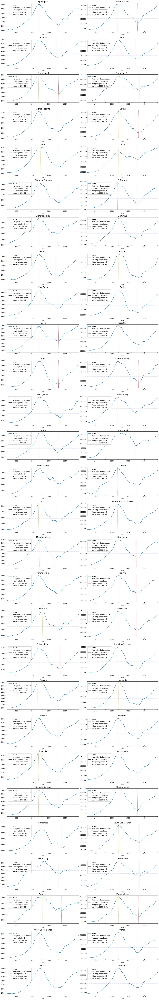

In [151]:
plot_ts_cities(df_sac_cities, sac_metro_cities, col='value', figsize=(18, 120))


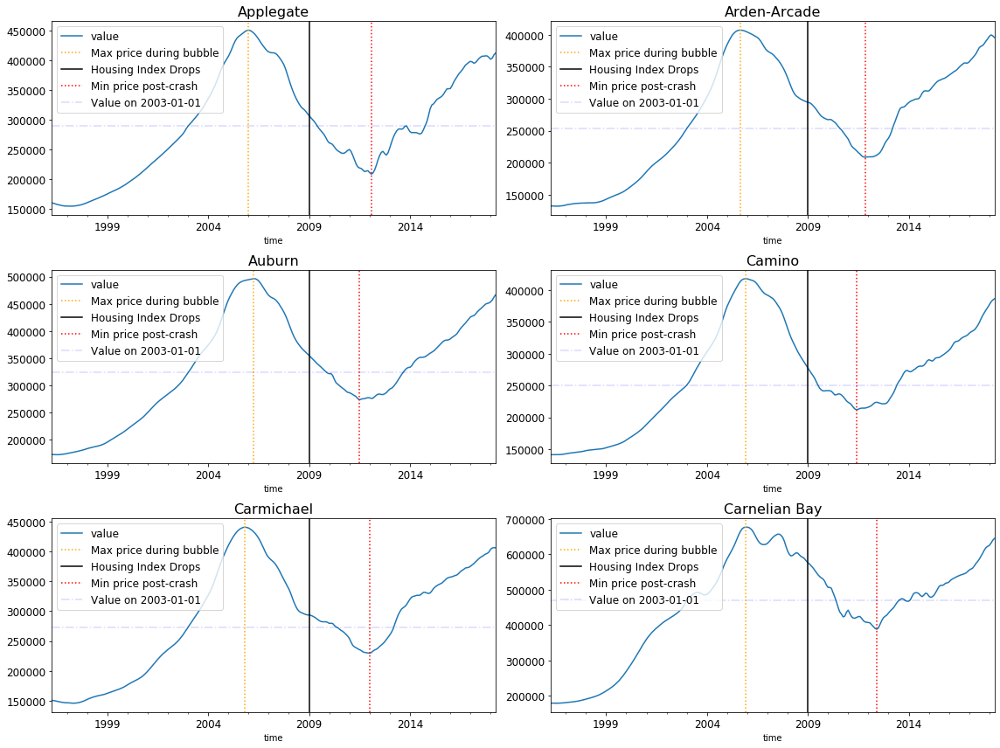

In [206]:
plot_ts_cities(df_sac_cities, sac_metro_cities[:6], nrows = 3, ncols = 2, figsize=(16,12), col='value', legend=True);

(<Figure size 1152x864 with 6 Axes>,
 <matplotlib.axes._subplots.AxesSubplot at 0x1aecbe7c18>)

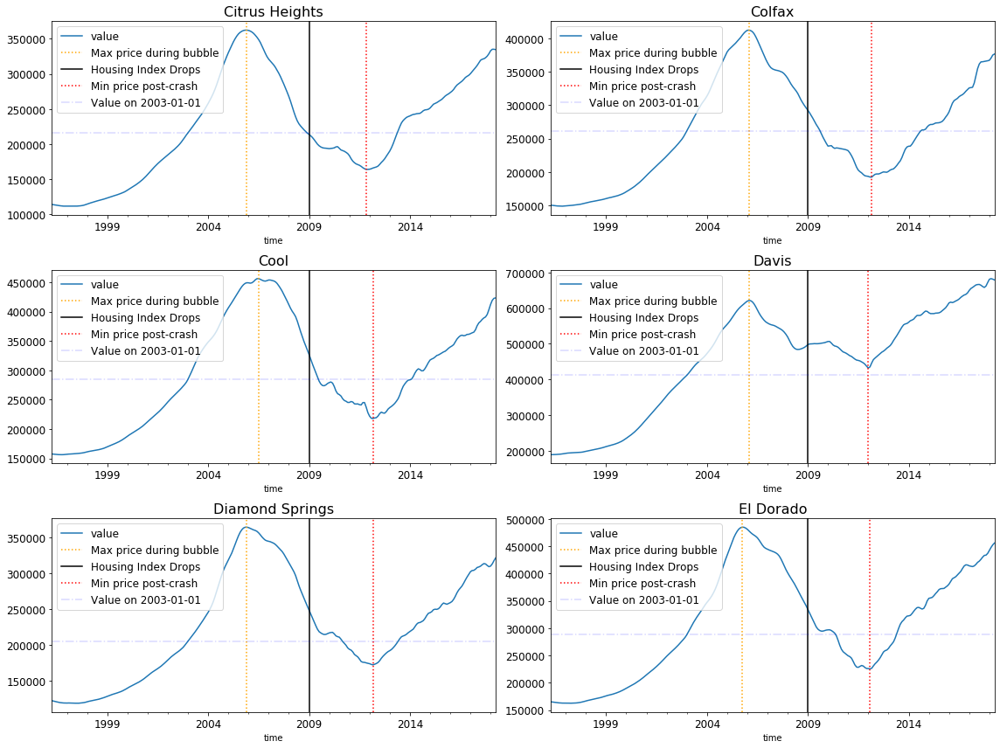

In [207]:
plot_ts_cities(df_sac_cities, sac_metro_cities[6:12], nrows = 3, ncols = 2, figsize=(16,12), col='value', legend=True)

(<Figure size 1152x864 with 6 Axes>,
 <matplotlib.axes._subplots.AxesSubplot at 0x1aecb6f7b8>)

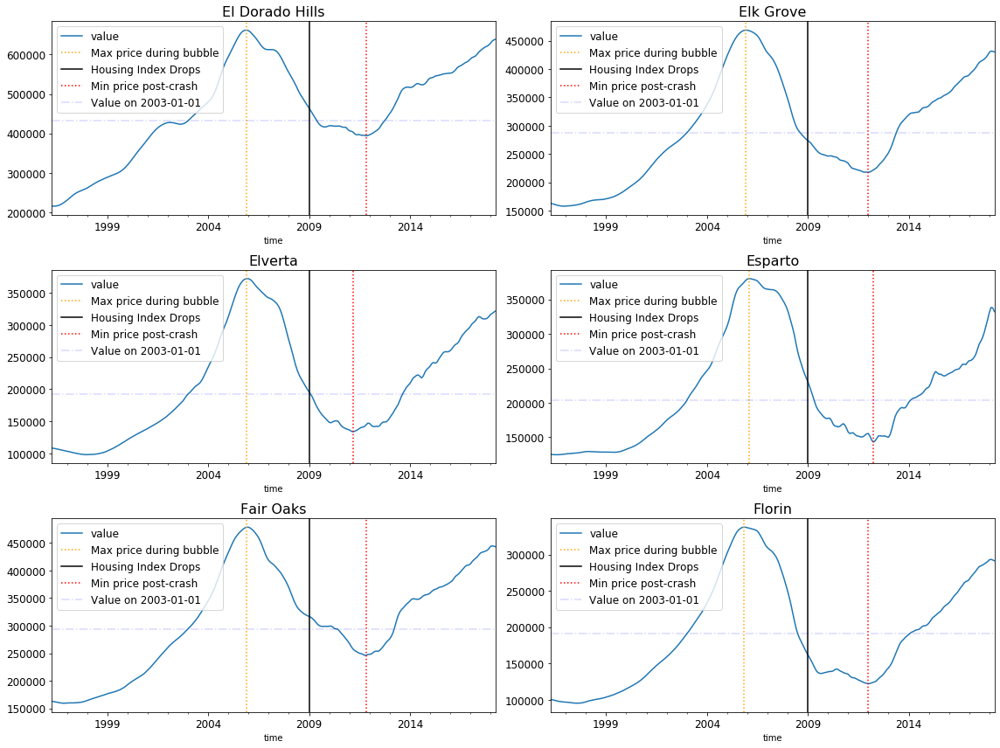

In [208]:
plot_ts_cities(df_sac_cities, sac_metro_cities[12:18], nrows = 3, ncols = 2, figsize=(16,12), col='value', legend=True)

(<Figure size 1152x864 with 6 Axes>,
 <matplotlib.axes._subplots.AxesSubplot at 0x1ae942a518>)

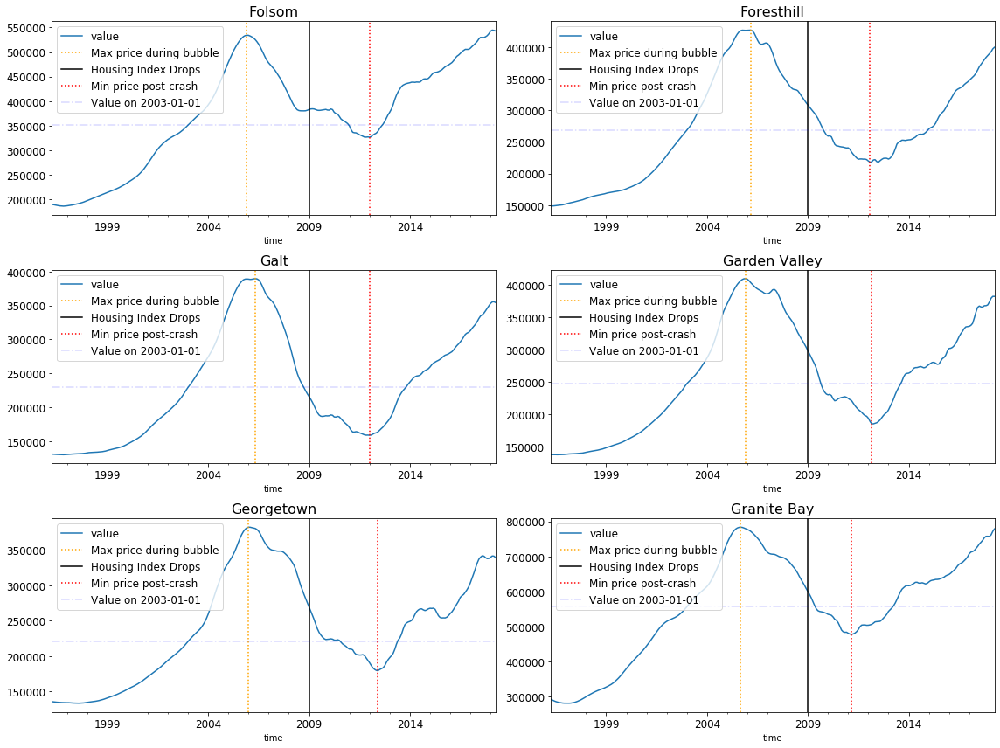

In [209]:
plot_ts_cities(df_sac_cities, sac_metro_cities[18:24], nrows = 3, ncols = 2, figsize=(16,12), col='value', legend=True)

(<Figure size 1152x864 with 6 Axes>,
 <matplotlib.axes._subplots.AxesSubplot at 0x1aecc92b00>)

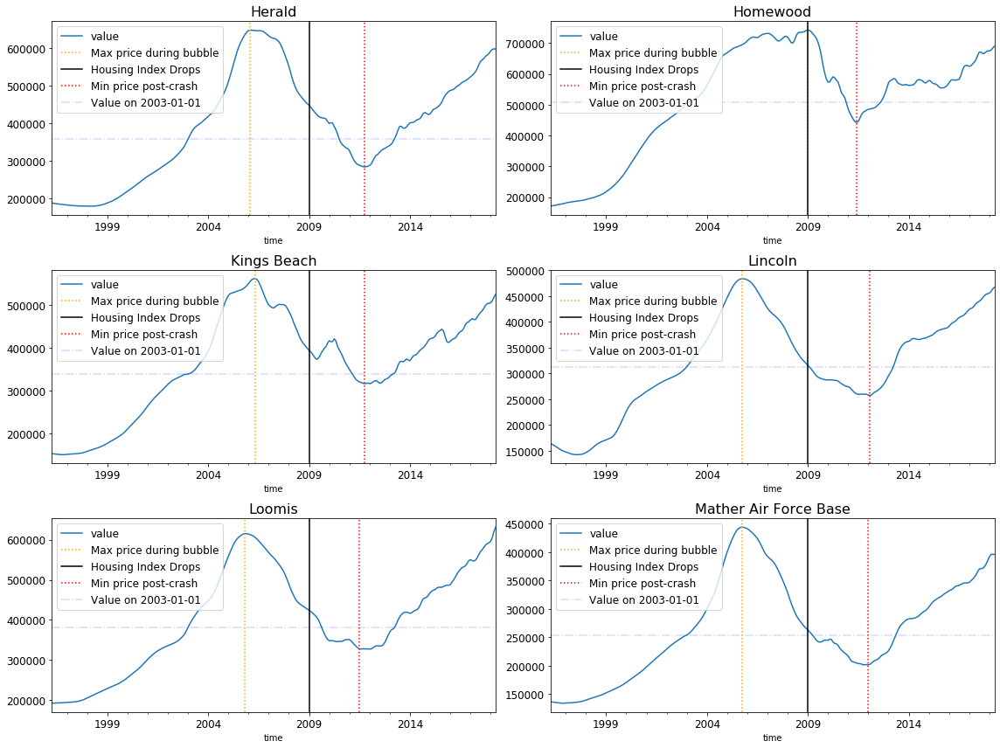

In [210]:
plot_ts_cities(df_sac_cities, sac_metro_cities[24:30], nrows = 3, ncols = 2, figsize=(16,12), col='value', legend=True)

(<Figure size 1152x864 with 6 Axes>,
 <matplotlib.axes._subplots.AxesSubplot at 0x1abb9340b8>)

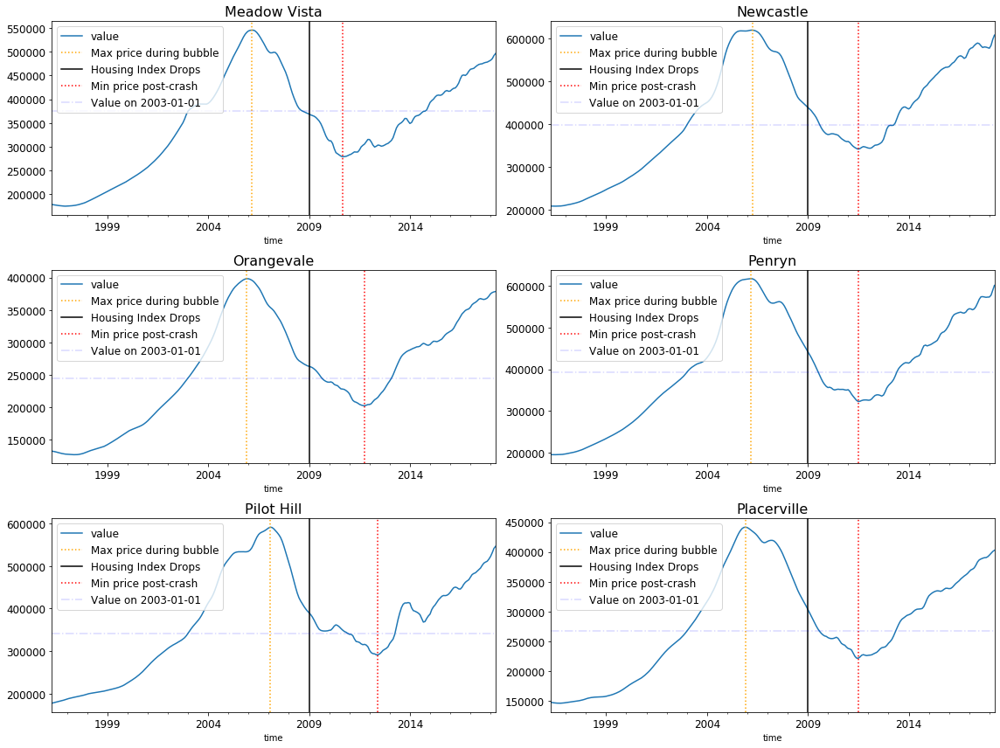

In [211]:
plot_ts_cities(df_sac_cities, sac_metro_cities[30:36], nrows = 3, ncols = 2, figsize=(16,12), col='value', legend=True)

(<Figure size 1152x864 with 6 Axes>,
 <matplotlib.axes._subplots.AxesSubplot at 0x1ac44a4748>)

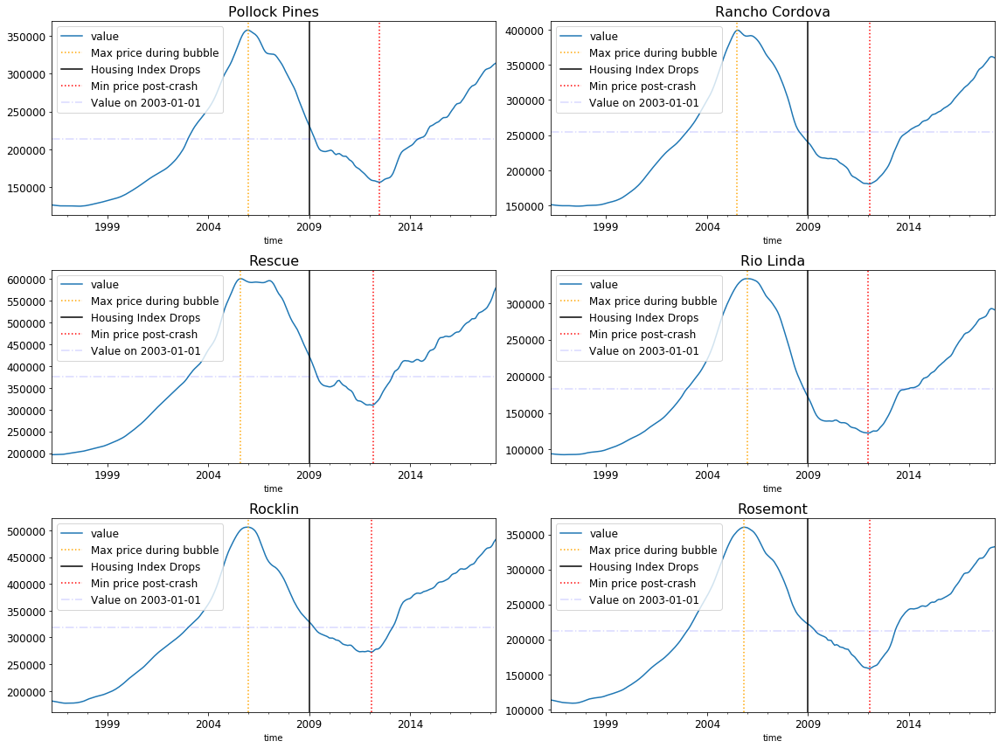

In [212]:
plot_ts_cities(df_sac_cities, sac_metro_cities[36:42], nrows = 3, ncols = 2, figsize=(16,12), col='value', legend=True)

(<Figure size 1152x864 with 6 Axes>,
 <matplotlib.axes._subplots.AxesSubplot at 0x1ac4d72eb8>)

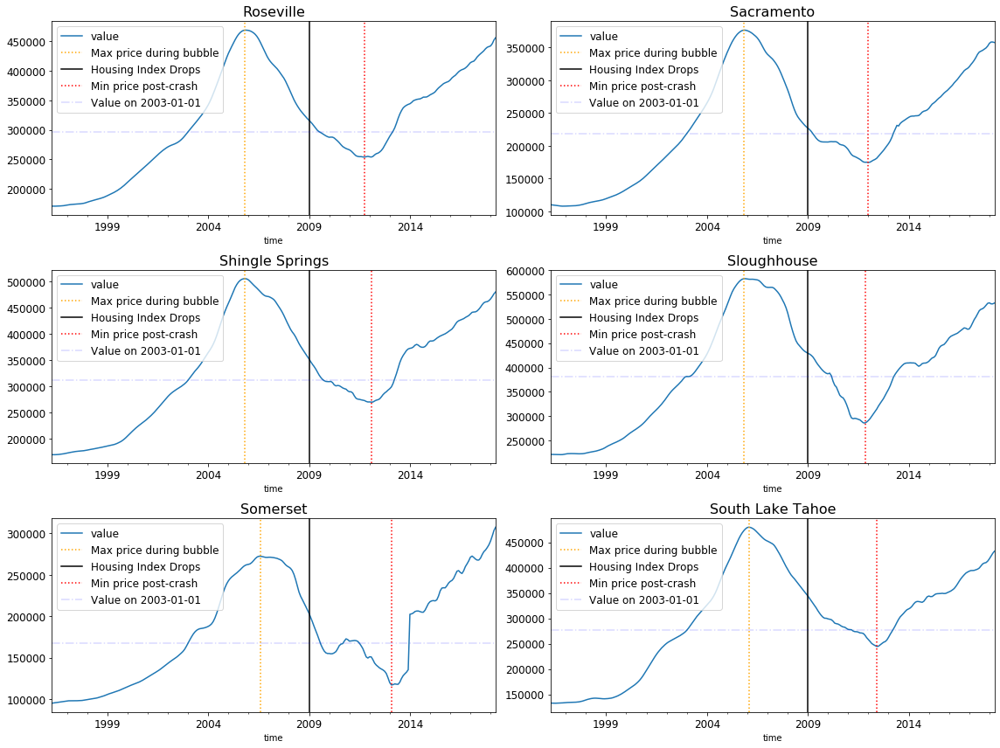

In [213]:
plot_ts_cities(df_sac_cities, sac_metro_cities[42:48], nrows = 3, ncols = 2, figsize=(16,12), col='value', legend=True)

(<Figure size 1152x864 with 6 Axes>,
 <matplotlib.axes._subplots.AxesSubplot at 0x1ac5166240>)

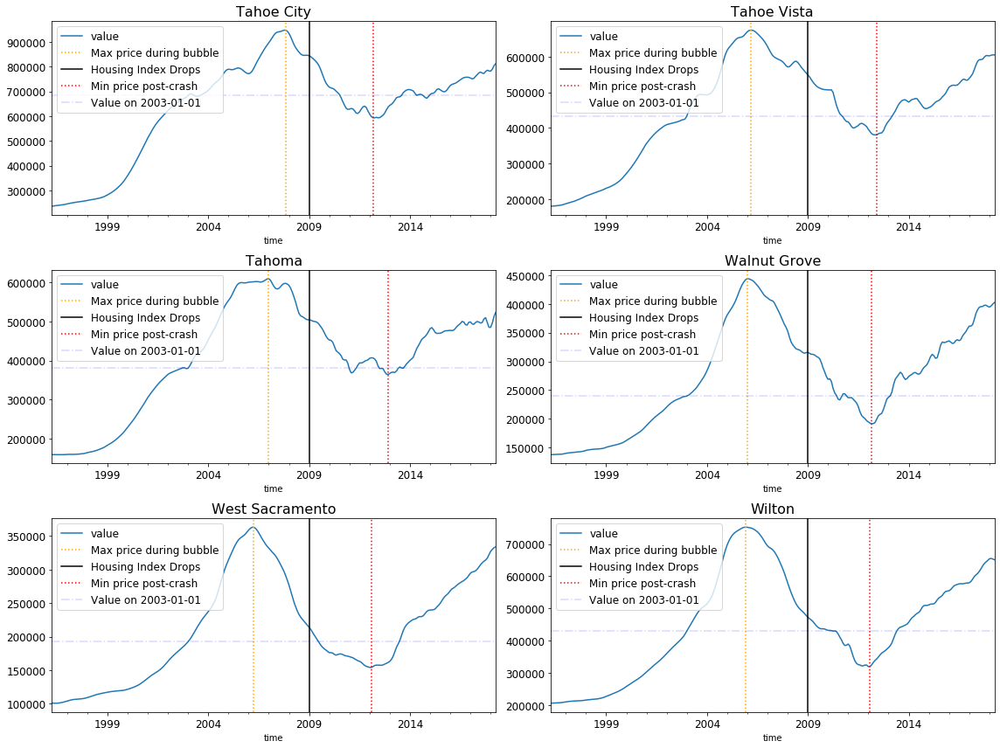

In [214]:
plot_ts_cities(df_sac_cities, sac_metro_cities[48:54], nrows = 3, ncols = 2, figsize=(16,12), col='value', legend=True)

(<Figure size 1152x864 with 2 Axes>,
 <matplotlib.axes._subplots.AxesSubplot at 0x1ac5033b38>)

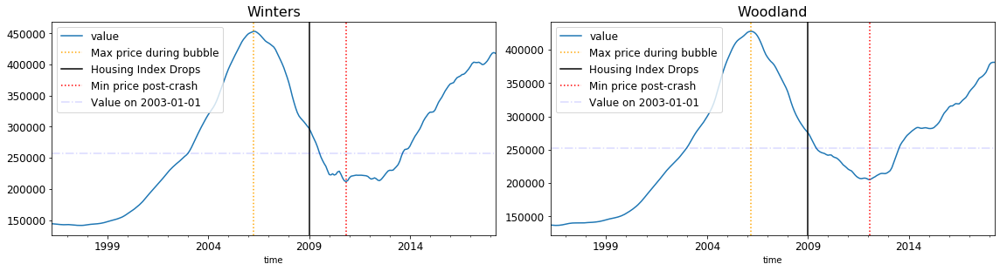

In [215]:
plot_ts_cities(df_sac_cities, sac_metro_cities[54:56], nrows = 3, ncols = 2, figsize=(16,12), col='value', legend=True)

## Plotting function:  plot_ts_zips (plots individual zip codes in a list provided to the function)

In [304]:
# Adapted from James Irving's study group:
    
def plot_ts_zips(df, zipcodes, col='value', figsize = (12, 6), fontsize1=12, fontsize2=16, nrows=1, ncols=1, 
                 legend=True, set_ylim = False, ylim = 800000):
        
    ''' Plots multiple zip codes in a single axes/figure.  For each zip code, marks dates of:
    1) maximum value reached during the housing bubble; 2) minimum value after the crash;
    3) absolute minimum across entire time horizon (e.g., 1996 if you go back that far);
    4) absolute minimum across entire time horizon (may or may not be the height of the bubble);
    5) date when the national housing index (Case-Schiller) dropped.  
    ''' 

    fig = plt.figure(figsize=figsize)
    
    for i, zc in enumerate(zipcodes, start=1):
        ax = fig.add_subplot(nrows, ncols, i)
        
        ts = df[col].loc[df['Zip'] == zc]
        ts.plot(ax=ax, fontsize=fontsize1)
        plt.title(zc, fontsize=fontsize2)
        
        try: 
            max_ = ts.loc['2004':'2011'].idxmax()  
        except:
            continue

        crash = '01-2009'
        min_ = ts.loc[crash:].idxmin()
        val_2003 = ts.loc['2003-01-01']

        ax.axvline(max_, label=f'Max price during bubble', color = 'orange', ls=':')
        ax.axvline(crash, label = 'Housing Index Drops', color='black')
        ax.axvline(min_, label=f'Min price post-crash', color = 'red', ls=':')
        ax.axhline(val_2003, label='Value on 2003-01-01', color = 'blue', ls='-.', alpha=0.15)
        if set_ylim:
            ax.set_ylim(ylim)
        if legend:
            ax.legend(loc='upper left', fontsize=fontsize1)
    
        fig.tight_layout()
    
    return fig, ax


## Plotting function:  plot_ts_zips_by_city (plot of each city with values by zip codes in a metro area)

In [306]:
# Function below adapted from James Irving's study group:
    
def plot_ts_zips_by_city(df, dict_zips_cities, col='value', figsize = (18, 100), fontsize1=12, fontsize2=16, 
                         nrows=30, ncols=2, legend=True, set_ylim = False, ylim = 1400000):
        
    '''Plots values for zip codes by city within a metro area.  Need to use dataframe 
    with values by ZIP code and CITY for just that METRO (or specify .loc in arguments that 
    column 'MetroState' == METRO). Need DICTIONARY of ZIPS by CITY within that METRO area.  
    Specify nrows, ncols, and figsize to match size of dataset.
    '''

    fig = plt.figure(figsize=figsize)
    
    for i, key in enumerate(sorted(dict_zips_cities.keys()), start=1):
        ax = fig.add_subplot(nrows, ncols, i)
        for val in dict_zips_cities[key]:
            ts = df[col].loc[df['Zip'] == val]
            try: 
                max_ = ts.loc['2004':'2011'].idxmax()  
            except:
                continue
            
            crash = '01-2009'
            min_ = ts.loc[crash:].idxmin()
            ts.plot(ax=ax, fontsize=fontsize1)   
            plt.title(key, fontsize=fontsize2)

            ax.axvline(max_, label = val, color = 'orange', ls=':')               
            ax.axvline(crash, color='black')                         # no labels
            ax.axvline(min_, color = 'red', ls=':')
            ax.axvline('2003-01-01', color = 'blue', ls='-.', alpha=0.15)   # for label, insert the following:  label='2003-01-01'
            
            if set_ylim:
                ax.set_ylim(ylim)
            if legend:
                ax.legend(loc="upper left", fontsize=fontsize1)
    
        fig.tight_layout()
    
    return fig, ax

#  Ignore code below unless labels for each vertical line are desired

#  ax.axvline(max_, label=f'Max Price: {max_}', color = 'orange', ls=':')              # contains labels
#  ax.axvline(crash, label = 'Housing Index Drops', color='black')                     # contains labels
#  ax.axvline(min_, label=f'Min Price Post Crash: {min_}', color = 'red', ls=':')      # contains labels
#  ax.axhline(min_val, label=f'Min Price Post Crash: {min_}', color = 'red', ls='-.', alpha=0.15)  # can't get this to work on multiple zip plots 
#  ax.axvline(max_all, label=f'All time series max {max_all}', color = 'green', ls=':')  # contains labels
#  ax.axvline(min_all, label=f'All time series min: {min_all}', color = 'red', ls=':')   # contains labels
#  ax.axhline(ts.loc['2003-01-01'], label='2003-01-01 value', color = 'blue', ls='-.', alpha=0.15)  # can't get this to work on multiple zip plots 



## Plotting Sacramento values by zip code, grouped by city or within a city

### Plots of zip codes in City of Sacramento

In [218]:
df_sacto_city_zips = df_sac.loc[df_sac['City'] == 'Sacramento']
df_sacto_city_zips.head()

,Metro,MetroState,CountyName,City,Zip,SizeRank,value
time,,,,,,,
1996-04-01,Sacramento,Sacramento CA,Sacramento,Sacramento,95660,3515,73200.0
1996-05-01,Sacramento,Sacramento CA,Sacramento,Sacramento,95660,3515,72500.0
1996-06-01,Sacramento,Sacramento CA,Sacramento,Sacramento,95660,3515,71900.0
1996-07-01,Sacramento,Sacramento CA,Sacramento,Sacramento,95660,3515,71300.0
1996-08-01,Sacramento,Sacramento CA,Sacramento,Sacramento,95660,3515,70700.0


In [219]:
df_sacto_city_zips['Zip'].value_counts()

95835    265
95831    265
95841    265
95811    265
95660    265
95842    265
95817    265
95820    265
95834    265
95824    265
95823    265
95832    265
95843    265
95818    265
95829    265
95838    265
95819    265
95822    265
95816    265
95833    265
95815     58
Name: Zip, dtype: int64

In [220]:
sacto_zips = list(set(df_sacto_city_zips['Zip']))
len(sacto_zips)

21

In [221]:
ts = df_sacto_city_zips['value'].loc[df_sacto_city_zips['Zip'] == '95823']
ts.head()

time
1996-04-01    91500.0
1996-05-01    90800.0
1996-06-01    90000.0
1996-07-01    89200.0
1996-08-01    88400.0
Name: value, dtype: float64

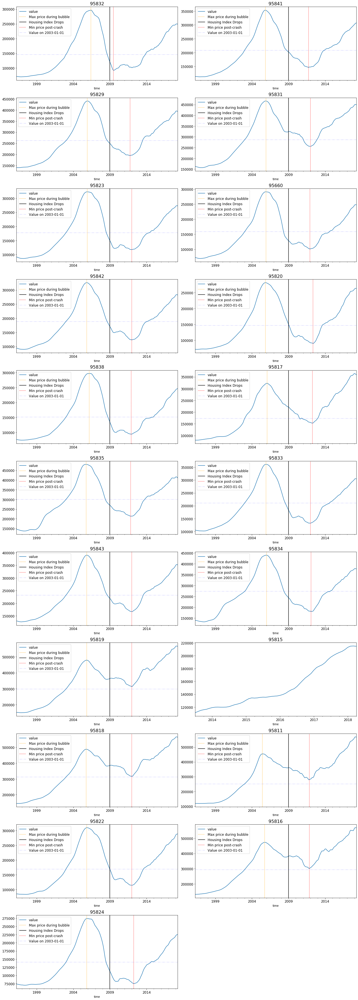

In [305]:
fig, ax = plot_ts_zips(df_sac, sacto_zips, nrows=11, ncols=2, figsize=(18, 50), legend=True)


### Plotting cities and zip codes within Sacramento Metro area 

/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/ipykernel_launcher.py:38: UserWarning: Tight layout not applied. tight_layout cannot make axes height small enough to accommodate all axes decorations


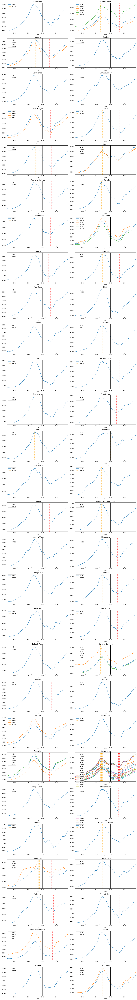

In [307]:
fig, ax = plot_ts_zips_by_city(df_sac, dict_sac_zips_cities, figsize=(18, 140), nrows=30, ncols=2, legend=True)


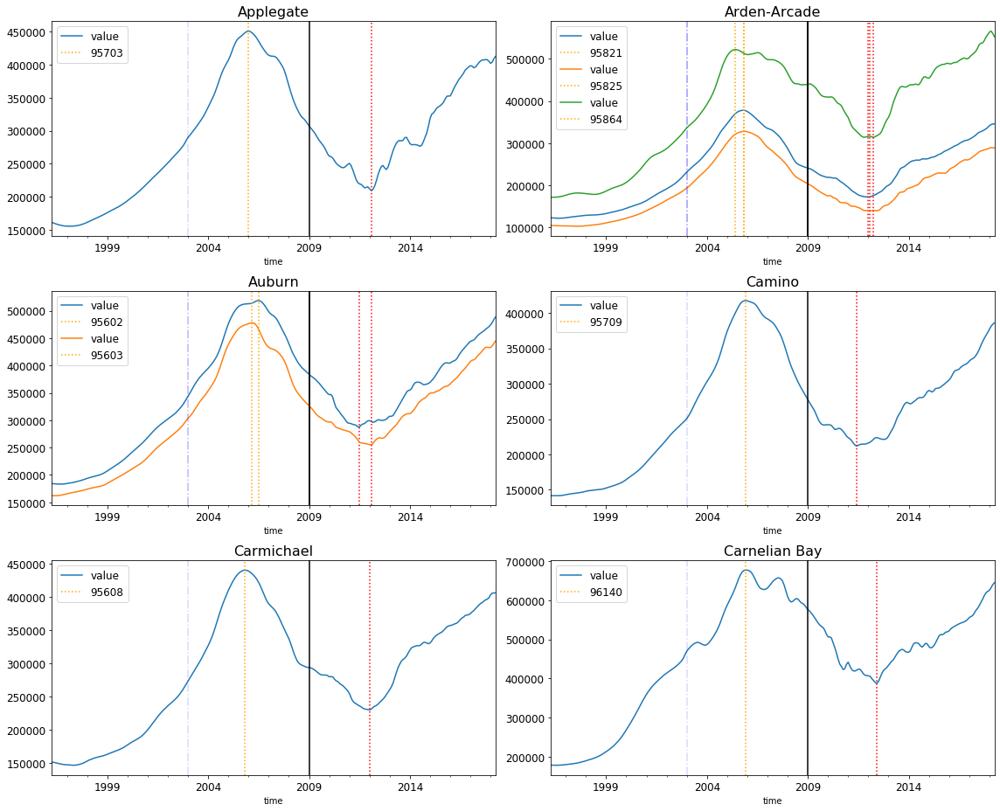

In [311]:
fig, ax = plot_ts_zips_by_city(df_sac, dict_0_6, figsize=(16, 13), nrows=3, ncols=2, legend=True)


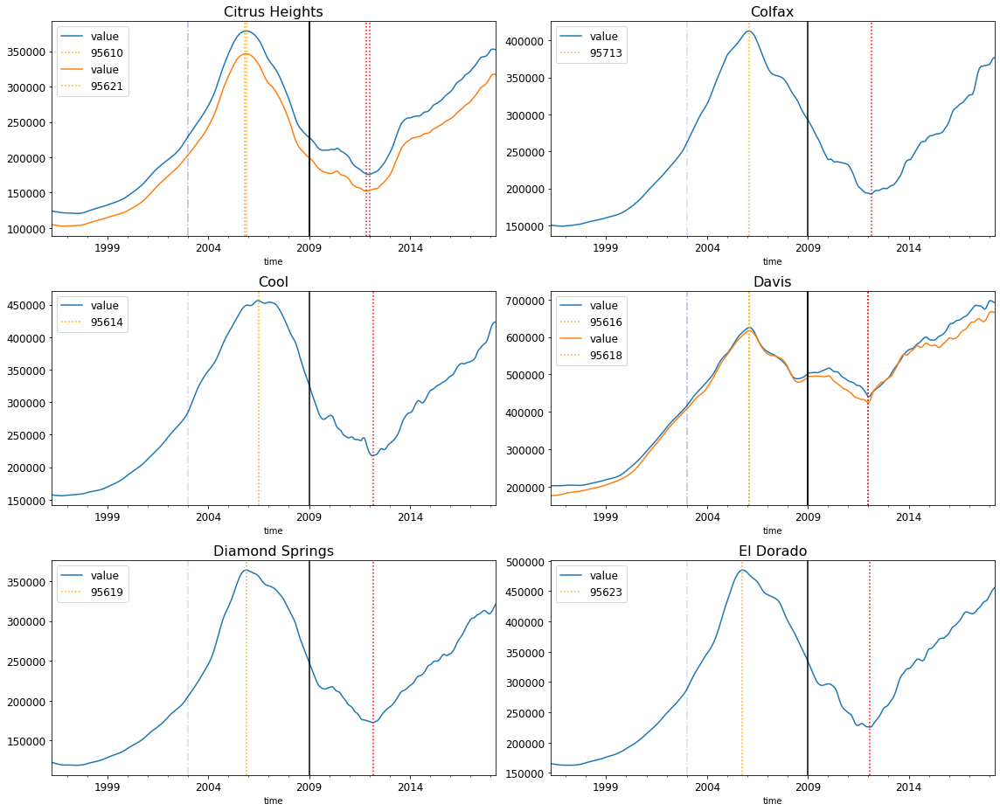

In [312]:
fig, ax = plot_ts_zips_by_city(df_sac, dict_6_12, figsize=(16, 13), nrows=3, ncols=2, legend=True)

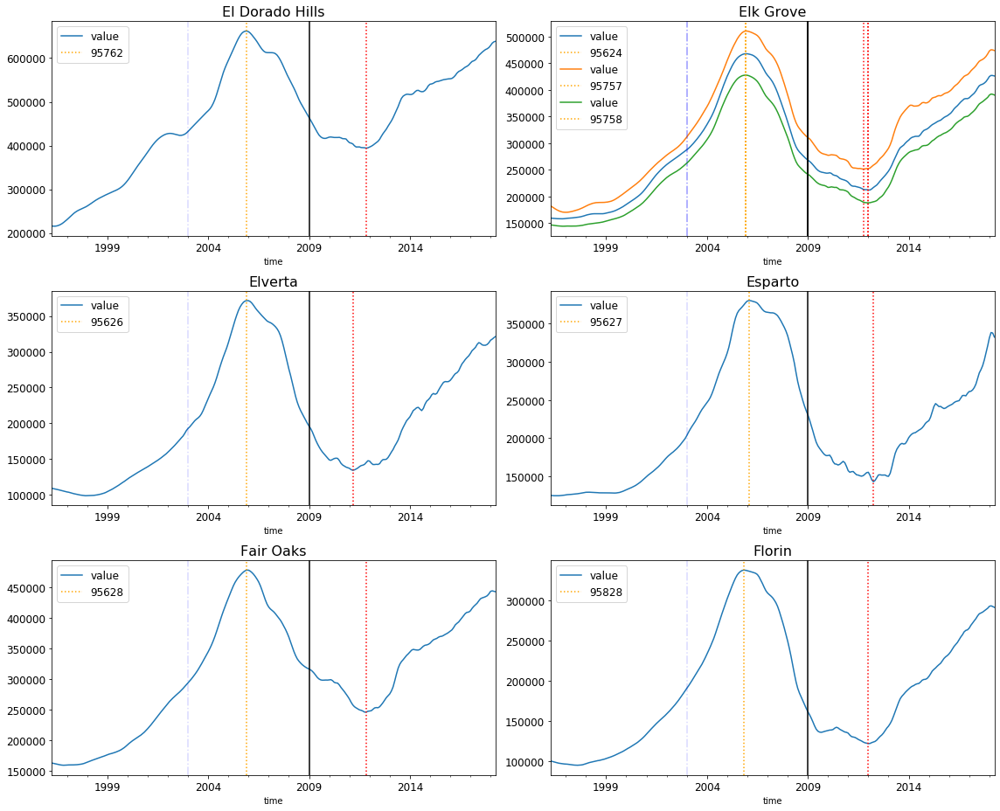

In [313]:
fig, ax = plot_ts_zips_by_city(df_sac, dict_12_18, figsize=(16, 13), nrows=3, ncols=2, legend=True)

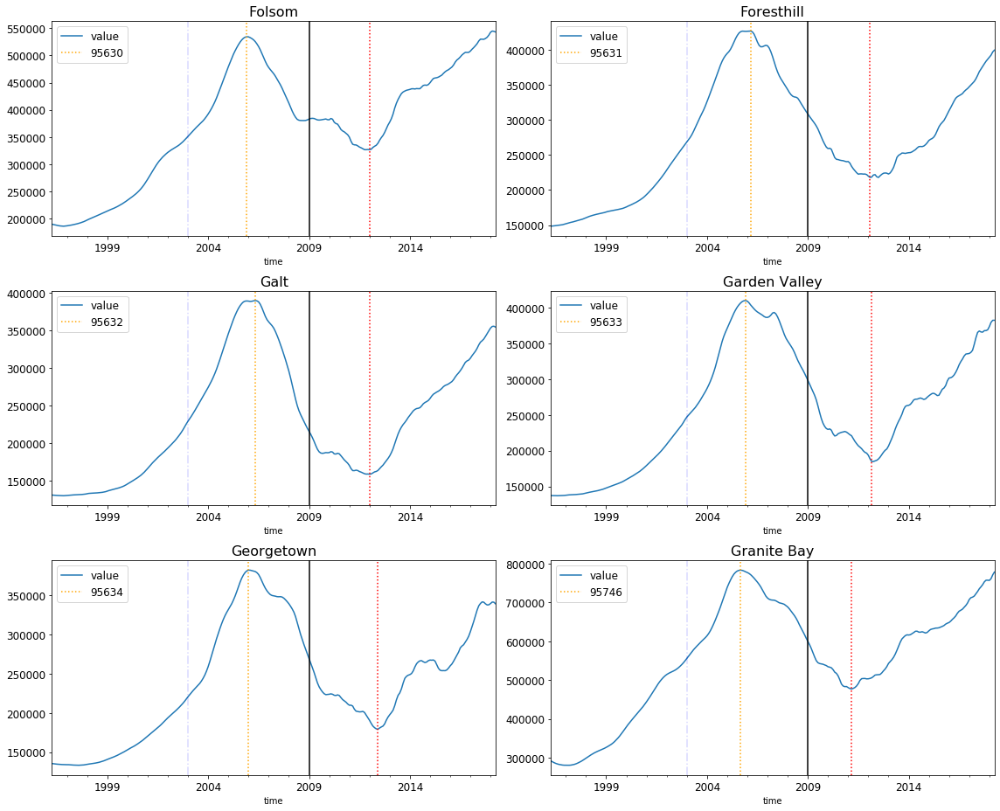

In [314]:
fig, ax = plot_ts_zips_by_city(df_sac, dict_18_24, figsize=(16, 13), nrows=3, ncols=2, legend=True)

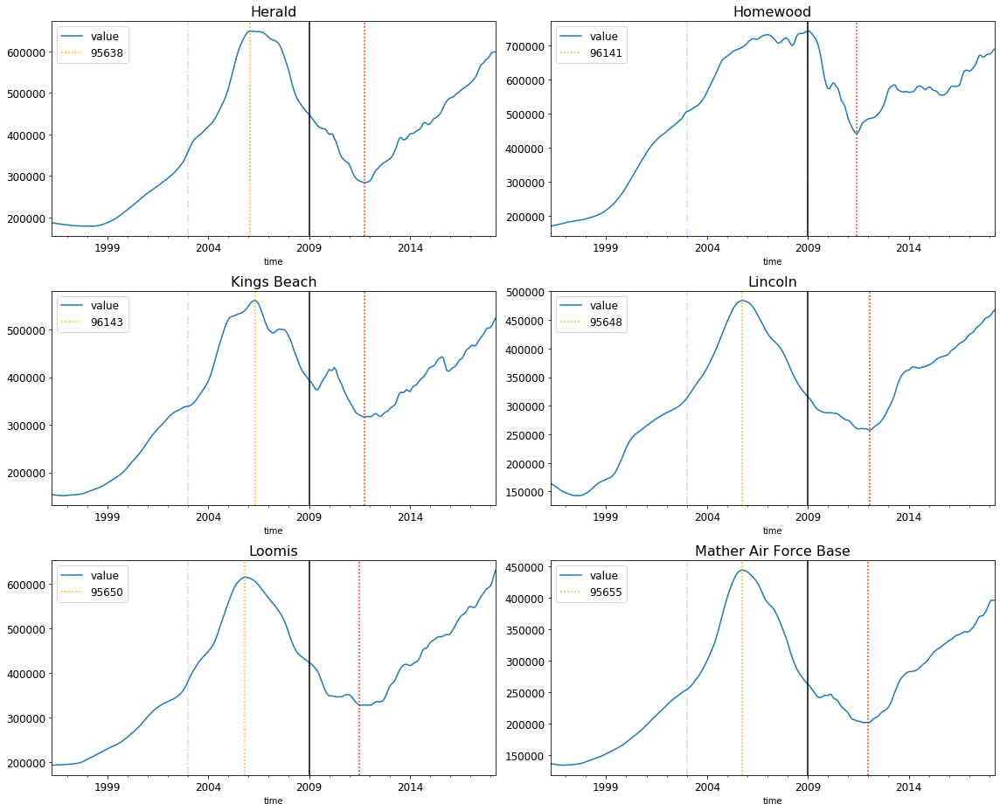

In [315]:
fig, ax = plot_ts_zips_by_city(df_sac, dict_24_30, figsize=(16, 13), nrows=3, ncols=2, legend=True)

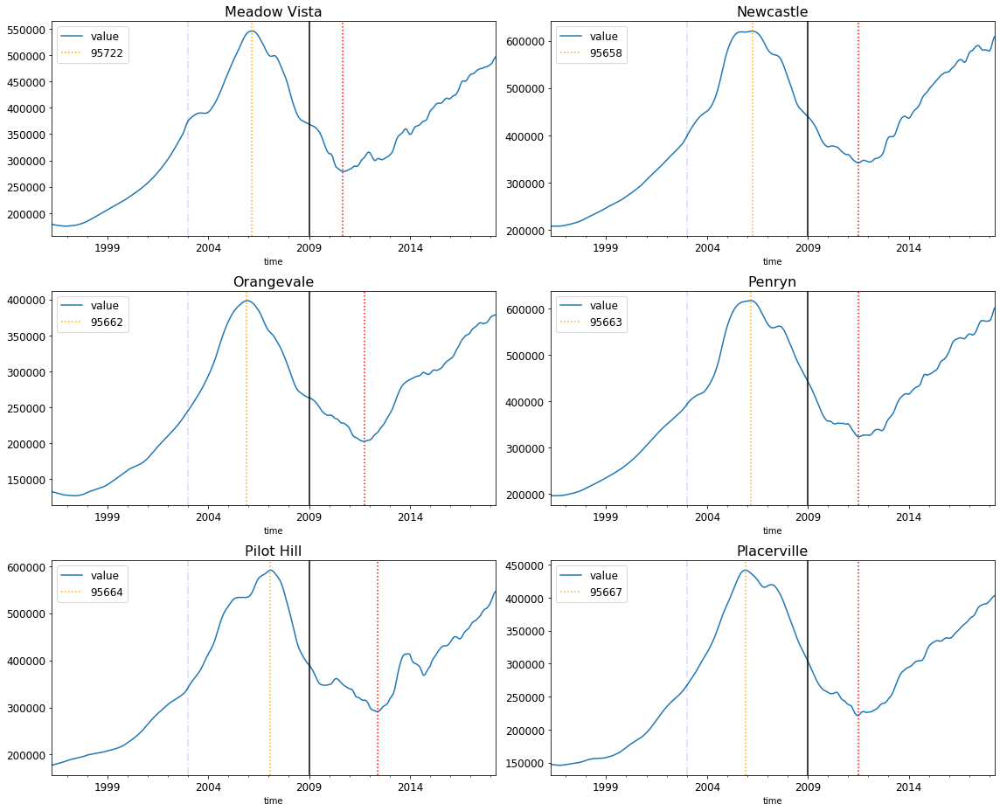

In [316]:
fig, ax = plot_ts_zips_by_city(df_sac, dict_30_36, figsize=(16, 13), nrows=3, ncols=2, legend=True)

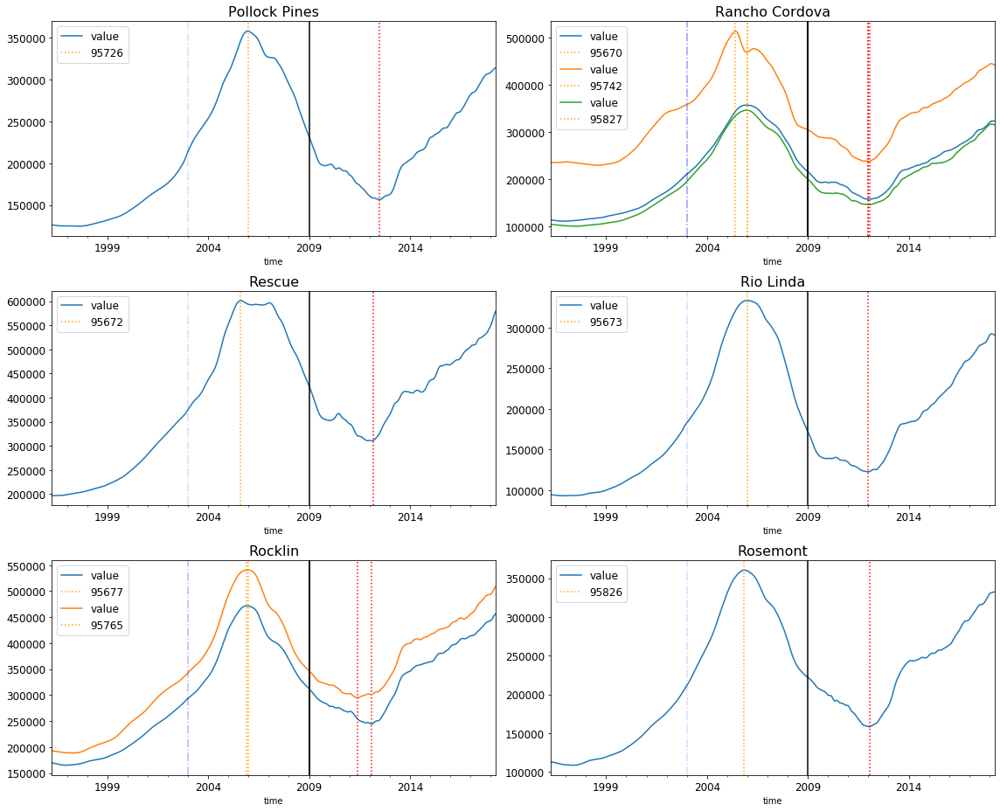

In [317]:
fig, ax = plot_ts_zips_by_city(df_sac, dict_36_42, figsize=(16, 13), nrows=3, ncols=2, legend=True)

/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/ipykernel_launcher.py:38: UserWarning: Tight layout not applied. tight_layout cannot make axes height small enough to accommodate all axes decorations


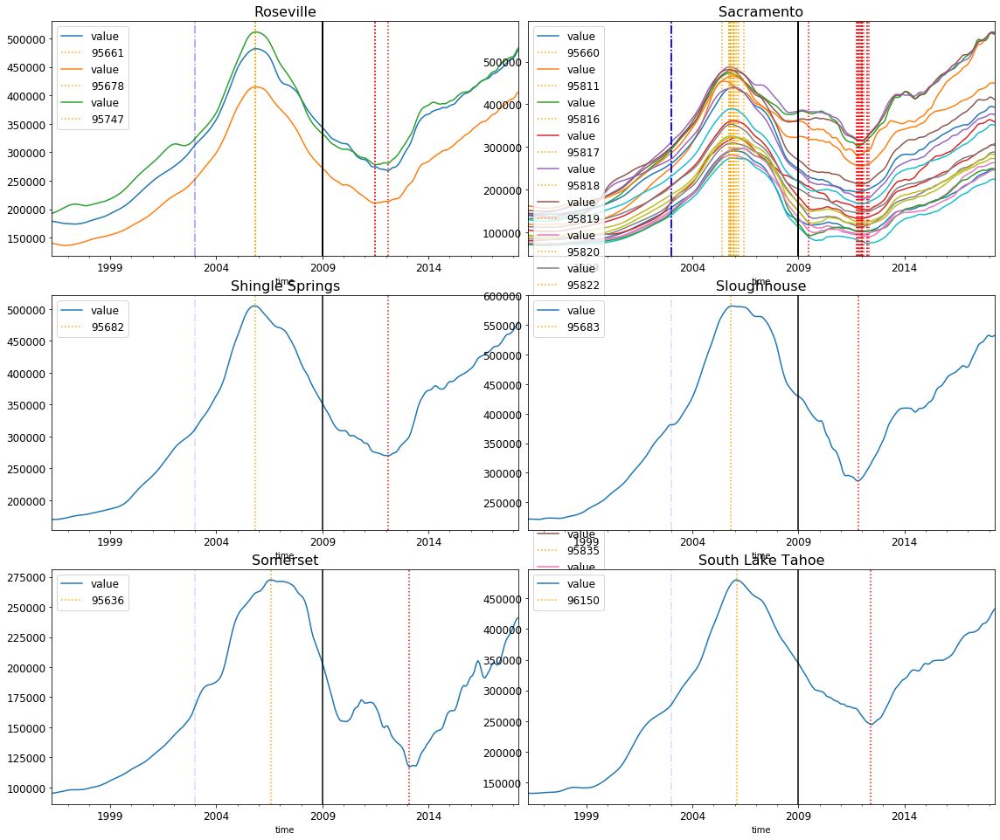

In [318]:
fig, ax = plot_ts_zips_by_city(df_sac, dict_42_48, figsize=(16, 13), nrows=3, ncols=2, legend=True)

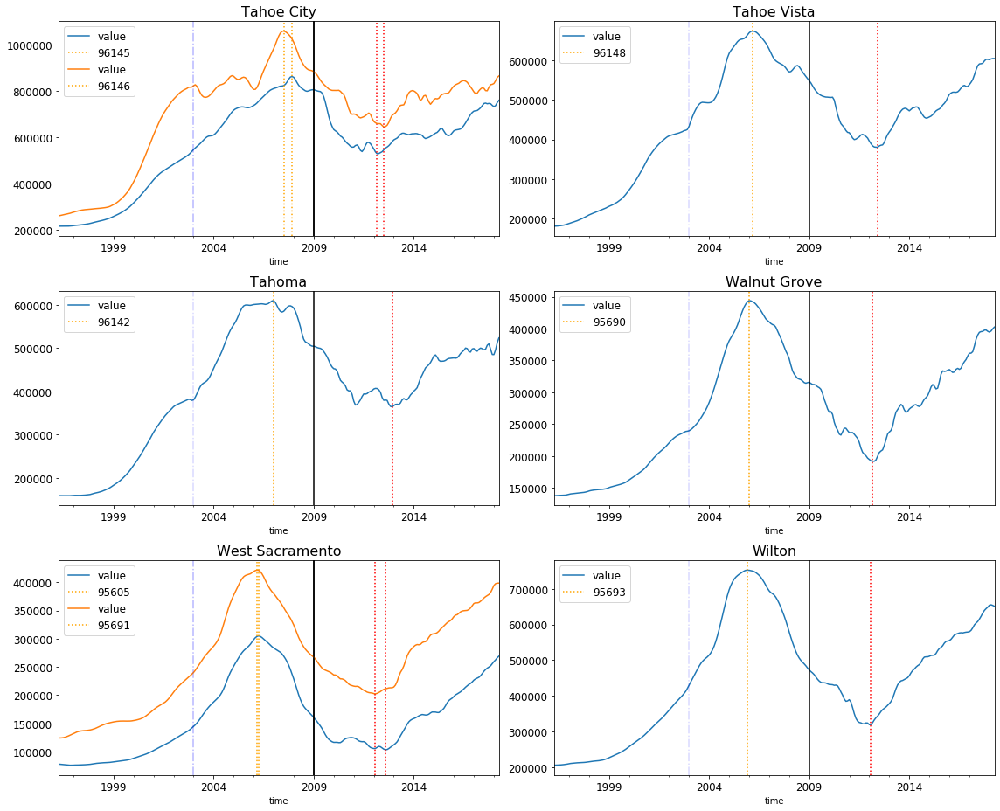

In [319]:
fig, ax = plot_ts_zips_by_city(df_sac, dict_48_54, figsize=(16, 13), nrows=3, ncols=2, legend=True)

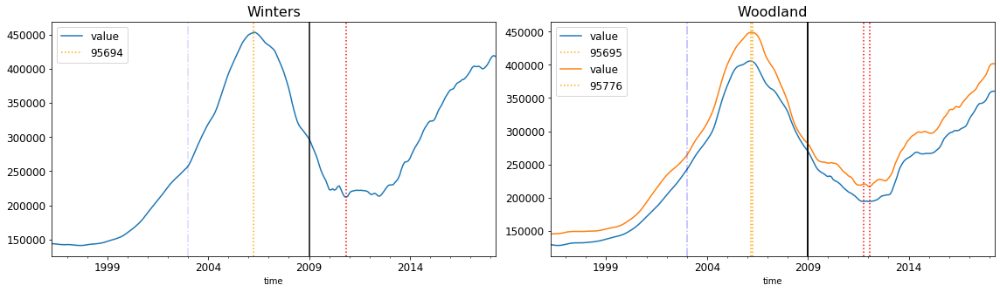

In [320]:
fig, ax = plot_ts_zips_by_city(df_sac, dict_54_56, figsize=(16, 13), nrows=3, ncols=2, legend=True)

In [322]:
sacto_zips

['95832',
 '95841',
 '95829',
 '95831',
 '95823',
 '95660',
 '95842',
 '95820',
 '95838',
 '95817',
 '95835',
 '95833',
 '95843',
 '95834',
 '95819',
 '95815',
 '95818',
 '95811',
 '95822',
 '95816',
 '95824']

## Boxplots

### Plotting function:  city_zips_boxplot (boxplots of zip codes in a city)

In [540]:
def city_zips_boxplot(df, city_zips, nrows, ncols, figsize=(18, 30)):
    
    '''Plots boxplots of each zipcode within a city.  Need to use dataframe with values by ZIP 
    for just that CITY (or specify .loc in arguments that column 'City' == CITY in question).
    Need LIST of ZIP codes for that particular CITY.  Need to specify nrows, ncols, and figsize.
    '''
    
    fig = plt.figure(figsize=figsize)
    
    for i, zc in enumerate(city_zips, start=1):
        ax = fig.add_subplot(nrows, ncols, i)
        ts = df.loc[df['Zip'] == zc]
        ts.boxplot(column = 'value', ax = ax)
        ax.set_title(f'{zc}')
        fig.tight_layout()


### Plotting function:  metro_zips_boxplot (boxplots by zip in metro area)

In [541]:
def metro_zips_boxplot(df, metro_zips, nrows, ncols, figsize=(18, 100)):
    
    '''Plots boxplots of each zipcode within a city.  Need to use dataframe with values by ZIP 
    for just that METRO area (or specify .loc in arguments that column 'MetroState' == METRO).
    Need a LIST of ZIP codes within that METRO area.  Need to specify nrows, ncols, and figsize.
    '''
    
    fig = plt.figure(figsize=figsize)
    
    for i, zc in enumerate(metro_zips, start=1):
        ax = fig.add_subplot(nrows, ncols, i)
        ts = df.loc[df['Zip'] == zc]
        ts.boxplot(column = 'value', ax = ax)
        ax.set_title(f'{zc}')
        fig.tight_layout()


### Plotting function:  metro_cities_boxplot (boxplots by city in metro area)

In [542]:
def metro_cities_boxplot(df, metro_cities, nrows, ncols, figsize=(18, 30)):
    
    '''Plots boxplots of each city within a metro area.  Need to use dataframe with values 
    by CITY for just that METRO (or specify .loc in arguments that column 'MetroState' == METRO.
    Need LIST of CITIES within a particular metro area.  Need to specify nrows, ncols, and figsize.
    '''
    
    fig = plt.figure(figsize=figsize)
    
    for i, city in enumerate(metro_cities, start=1):
        ax = fig.add_subplot(nrows, ncols, i)
        ts = df.loc[df['City'] == city]
        ts.boxplot(column = 'value', ax = ax)
        ax.set_title(f'{city}')
        fig.tight_layout()


### Plotting function:  metro_cities_zips_boxplot (boxplots by city and zip code in metro area)

In [543]:
def metro_cities_zips_boxplot(df, dict_metro_cities_zips, nrows, ncols, figsize=(18, 40)):
    
    '''Plots boxplots of all zip codes in each city within a metro area.  Need to use dataframe 
    with values by ZIP code and CITY for just that METRO (or specify .loc in arguments that 
    column 'MetroState' == METRO). Need DICTIONARY of ZIPS by CITY within that METRO area.  
    Need to specify nrows, ncols, and figsize.
    '''
    
    fig = plt.figure(figsize=figsize)
    
    for i, (city, zc) in enumerate(dict_metro_cities_zips.copy().items(), start=1):
        ax = fig.add_subplot(nrows, ncols, i)
        ax.set_title(f'{city}')
        for i, zc in enumerate(dict_metro_cities_zips.copy()[city], start=1):
            ts = df.loc[df['Zip'] == zc]
            ts.boxplot(column = 'value', ax = ax)
            ax.set_title(f'{city}')
            fig.tight_layout()


### Plotting boxplots for each city in Sacto Metro region

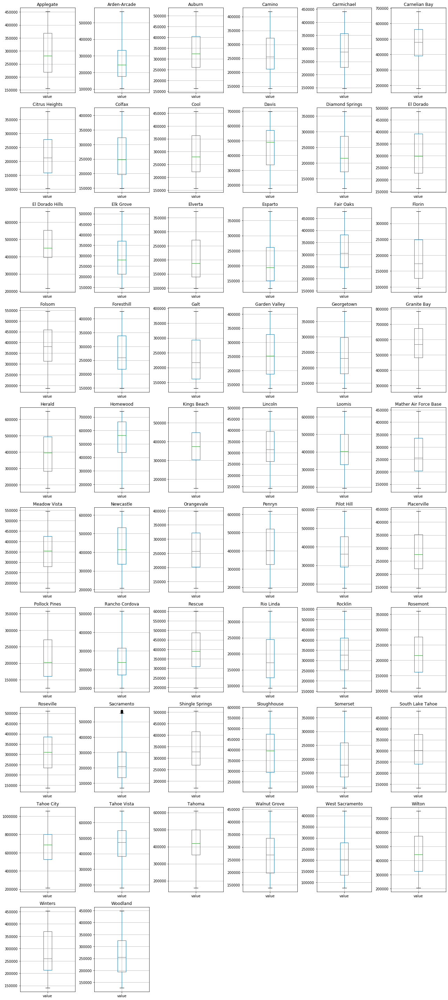

In [544]:
metro_cities_boxplot(df_sac, sac_metro_cities, nrows=10, ncols=6, figsize=(18, 40))


### Plotting boxplots for each zip in Sacramento metro region

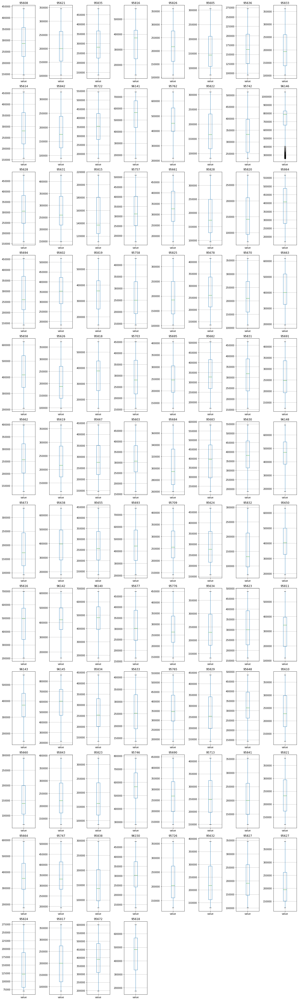

In [545]:
metro_zips_boxplot(df_sac, sac_metro_zips, nrows = 12, ncols=8, figsize=(18, 60))


### Plotting function:  Boxplots (by city and zip code in metro area)

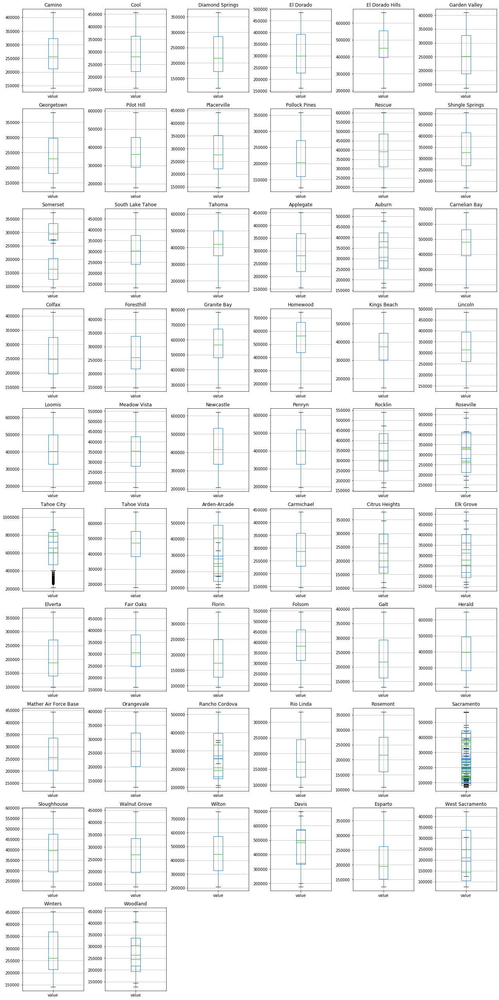

In [395]:
metro_cities_zips_boxplot(df_sac, dict_sac_zips_cities, nrows=14, ncols=6, figsize=(18, 50))


In [396]:
df_sac_city = df_sac.loc[df_sac['City'] == 'Sacramento']

df_sac_city.head()

,Metro,MetroState,CountyName,City,Zip,SizeRank,value
time,,,,,,,
1996-04-01,Sacramento,Sacramento CA,Sacramento,Sacramento,95660,3515,73200.0
1996-05-01,Sacramento,Sacramento CA,Sacramento,Sacramento,95660,3515,72500.0
1996-06-01,Sacramento,Sacramento CA,Sacramento,Sacramento,95660,3515,71900.0
1996-07-01,Sacramento,Sacramento CA,Sacramento,Sacramento,95660,3515,71300.0
1996-08-01,Sacramento,Sacramento CA,Sacramento,Sacramento,95660,3515,70700.0


In [397]:
sacto_zips = list(set(df_sac_city['Zip']))
len(sacto_zips)


21

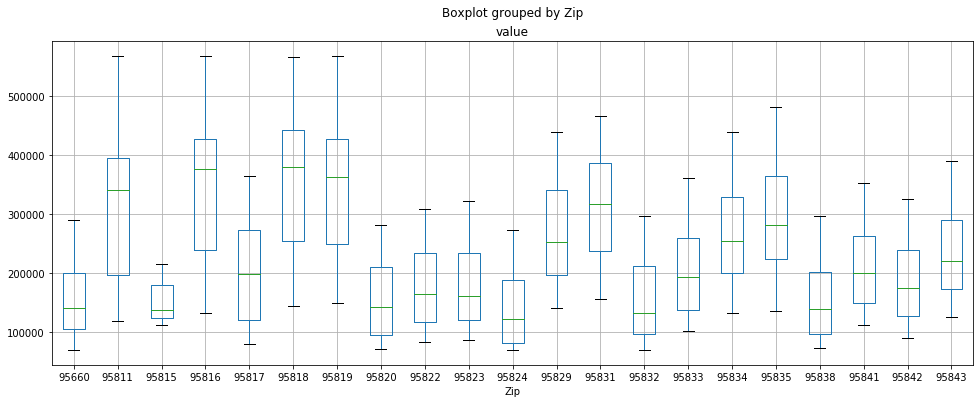

In [398]:
df_sac_city.boxplot(by='Zip', column = 'value', figsize=(16, 6))


### Violin plot for Sacramento city zip codes

In [399]:
import seaborn as sns


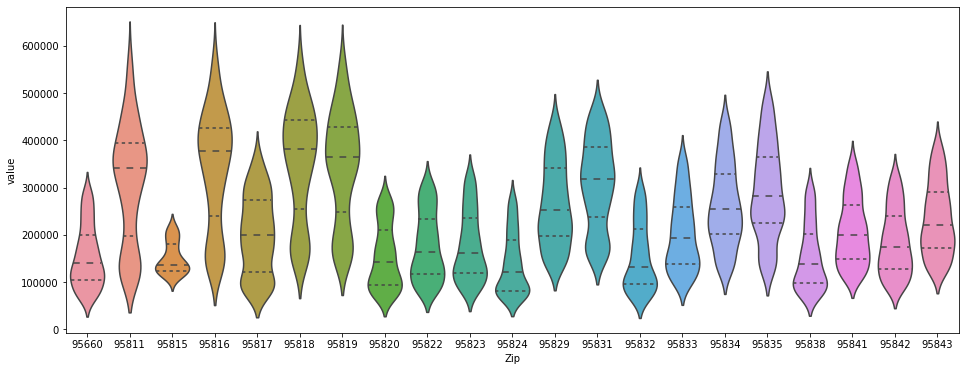

In [400]:
# got figure size  modification example from https://exceptionshub.com/how-do-i-change-the-figure-size-for-a-seaborn-plot.html

# fig, ax = plt.subplots()
# fig.set_size_inches(16, 6)
# sns.violinplot(x="Zip", y="value", data=df_44, scale="count", inner="stick", ax=ax)

fig, ax = plt.subplots()
fig.set_size_inches(16, 6)
sns.violinplot(x="Zip", y="value", data=df_sac_city, scale="width", inner="quartile", ax=ax)

In [401]:
df_sac_city_1996_1999 = df_sac_city.loc['1996-04-01':'1999-12-01']
df_sac_city_1996_1999.tail()

,Metro,MetroState,CountyName,City,Zip,SizeRank,value
time,,,,,,,
1999-08-01,Sacramento,Sacramento CA,Sacramento,Sacramento,95843,2123,146400.0
1999-09-01,Sacramento,Sacramento CA,Sacramento,Sacramento,95843,2123,147600.0
1999-10-01,Sacramento,Sacramento CA,Sacramento,Sacramento,95843,2123,149000.0
1999-11-01,Sacramento,Sacramento CA,Sacramento,Sacramento,95843,2123,150300.0
1999-12-01,Sacramento,Sacramento CA,Sacramento,Sacramento,95843,2123,151800.0


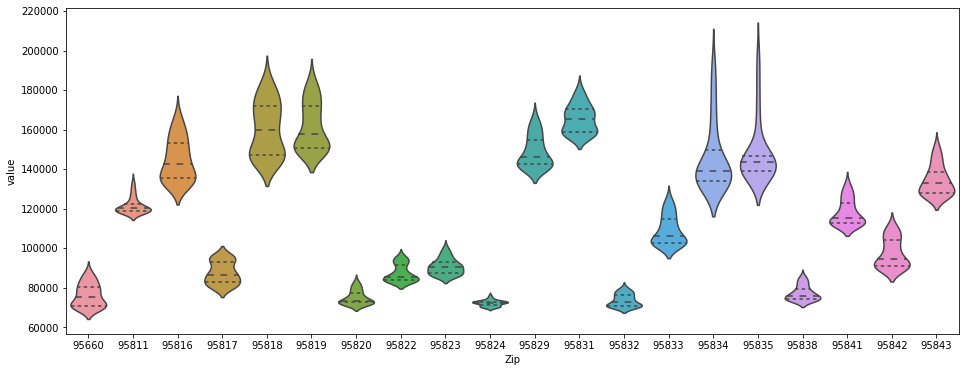

In [402]:
fig, ax = plt.subplots()
fig.set_size_inches(16, 6)
sns.violinplot(x="Zip", y="value", data=df_sac_city_1996_1999, scale="width", inner="quartile", ax=ax)

In [403]:
df_sac_city_2000_2003 = df_sac_city.loc['2000-01-01':'2003-12-01']
df_sac_city_2000_2003.head()

,Metro,MetroState,CountyName,City,Zip,SizeRank,value
time,,,,,,,
2000-01-01,Sacramento,Sacramento CA,Sacramento,Sacramento,95660,3515,89100.0
2000-02-01,Sacramento,Sacramento CA,Sacramento,Sacramento,95660,3515,90100.0
2000-03-01,Sacramento,Sacramento CA,Sacramento,Sacramento,95660,3515,91200.0
2000-04-01,Sacramento,Sacramento CA,Sacramento,Sacramento,95660,3515,92200.0
2000-05-01,Sacramento,Sacramento CA,Sacramento,Sacramento,95660,3515,93300.0


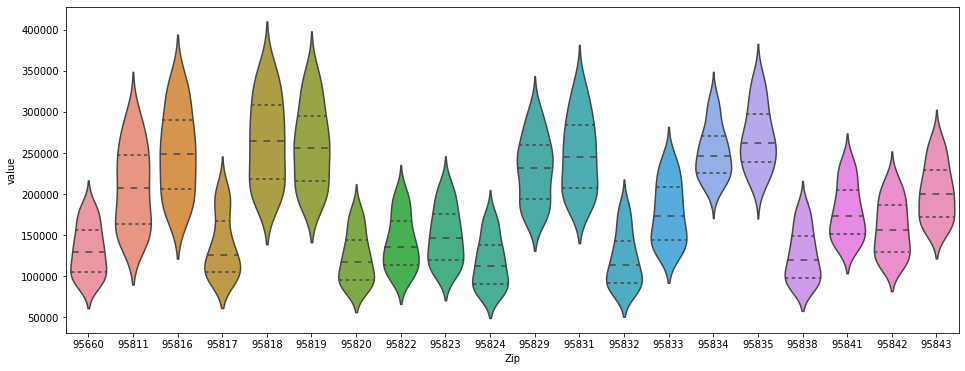

In [404]:
fig, ax = plt.subplots()
fig.set_size_inches(16, 6)
sns.violinplot(x="Zip", y="value", data=df_sac_city_2000_2003, scale="width", inner="quartile", ax=ax)

In [405]:
df_sac_city_2004_2006 = df_sac_city.loc['2004-01-01':'2006-12-01']
df_sac_city_2004_2006.head()

,Metro,MetroState,CountyName,City,Zip,SizeRank,value
time,,,,,,,
2004-01-01,Sacramento,Sacramento CA,Sacramento,Sacramento,95660,3515,191900.0
2004-02-01,Sacramento,Sacramento CA,Sacramento,Sacramento,95660,3515,195700.0
2004-03-01,Sacramento,Sacramento CA,Sacramento,Sacramento,95660,3515,200200.0
2004-04-01,Sacramento,Sacramento CA,Sacramento,Sacramento,95660,3515,205300.0
2004-05-01,Sacramento,Sacramento CA,Sacramento,Sacramento,95660,3515,211100.0


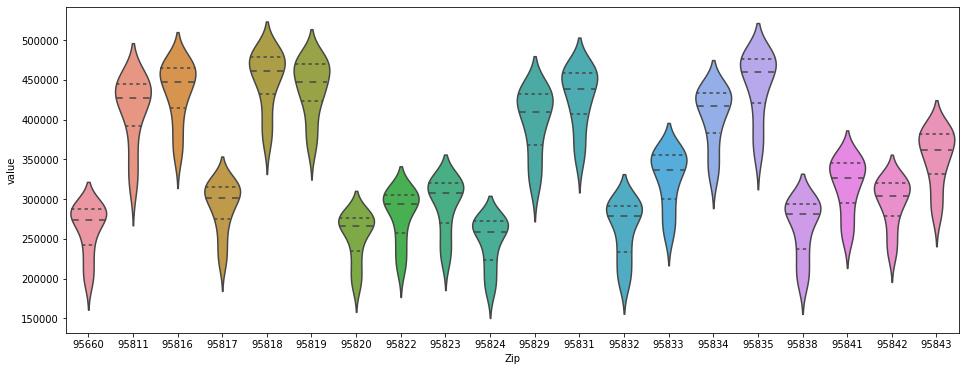

In [406]:
fig, ax = plt.subplots()
fig.set_size_inches(16, 6)
sns.violinplot(x="Zip", y="value", data=df_sac_city_2004_2006, scale="width", inner="quartile", ax=ax)

In [407]:
df_sac_city_2007_2012 = df_sac_city.loc['2007-01-01':'2012-12-01']
df_sac_city_2007_2012.head()

,Metro,MetroState,CountyName,City,Zip,SizeRank,value
time,,,,,,,
2007-01-01,Sacramento,Sacramento CA,Sacramento,Sacramento,95660,3515,264800.0
2007-02-01,Sacramento,Sacramento CA,Sacramento,Sacramento,95660,3515,263000.0
2007-03-01,Sacramento,Sacramento CA,Sacramento,Sacramento,95660,3515,261000.0
2007-04-01,Sacramento,Sacramento CA,Sacramento,Sacramento,95660,3515,258400.0
2007-05-01,Sacramento,Sacramento CA,Sacramento,Sacramento,95660,3515,254800.0


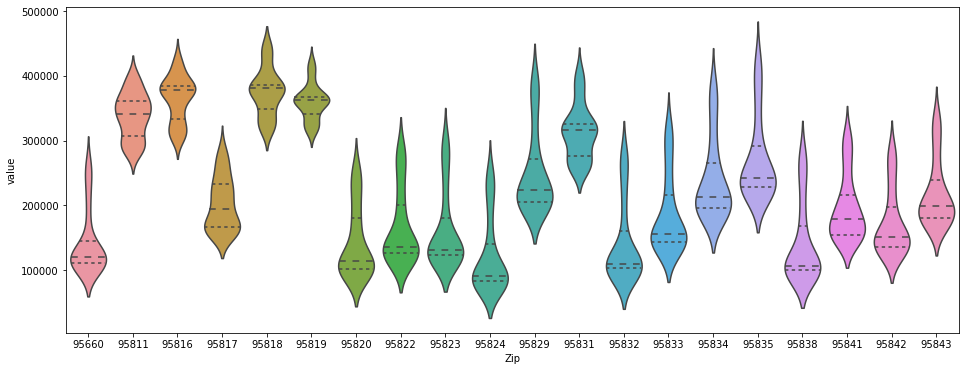

In [408]:
fig, ax = plt.subplots()
fig.set_size_inches(16, 6)
sns.violinplot(x="Zip", y="value", data=df_sac_city_2007_2012, scale="width", inner="quartile", ax=ax)

In [409]:
df_sac_city_2013_2018 = df_sac_city.loc['2013-01-01':'2018']
df_sac_city_2013_2018.tail()

,Metro,MetroState,CountyName,City,Zip,SizeRank,value
time,,,,,,,
2017-12-01,Sacramento,Sacramento CA,Sacramento,Sacramento,95843,2123,345600.0
2018-01-01,Sacramento,Sacramento CA,Sacramento,Sacramento,95843,2123,350100.0
2018-02-01,Sacramento,Sacramento CA,Sacramento,Sacramento,95843,2123,352500.0
2018-03-01,Sacramento,Sacramento CA,Sacramento,Sacramento,95843,2123,352400.0
2018-04-01,Sacramento,Sacramento CA,Sacramento,Sacramento,95843,2123,351400.0


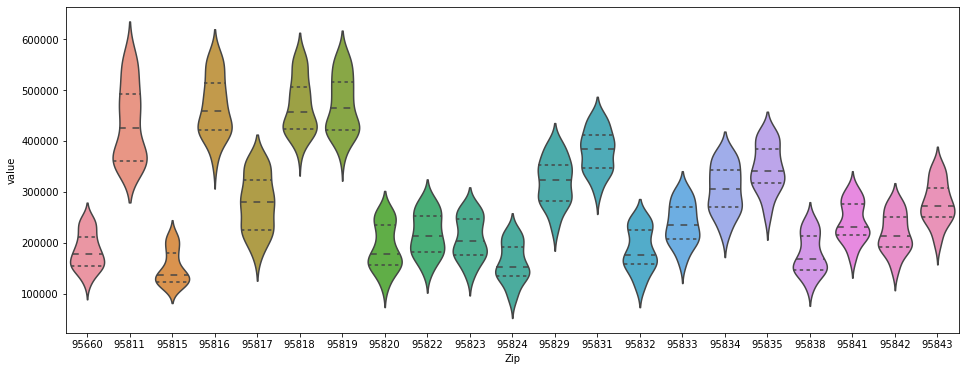

In [410]:
fig, ax = plt.subplots()
fig.set_size_inches(16, 6)
sns.violinplot(x="Zip", y="value", data=df_sac_city_2013_2018, scale="width", inner="quartile", ax=ax)

## Visualizations for Davis, CA (ZIP 95616)

In [973]:
ts_95616 = df_melt.loc[df_melt['Zip'] == '95616']

In [974]:
ts_95616.head()

,Zip,City,State,Metro,CountyName,SizeRank,value,MetroState
time,,,,,,,,
1996-04-01,95616,Davis,CA,Sacramento,Yolo,955,202500.0,Sacramento CA
1996-05-01,95616,Davis,CA,Sacramento,Yolo,955,202500.0,Sacramento CA
1996-06-01,95616,Davis,CA,Sacramento,Yolo,955,202500.0,Sacramento CA
1996-07-01,95616,Davis,CA,Sacramento,Yolo,955,202500.0,Sacramento CA
1996-08-01,95616,Davis,CA,Sacramento,Yolo,955,202500.0,Sacramento CA


In [975]:
ts_95616 = ts_95616.resample('MS').asfreq()

In [976]:
ts_95616.head()

,Zip,City,State,Metro,CountyName,SizeRank,value,MetroState
time,,,,,,,,
1996-04-01,95616,Davis,CA,Sacramento,Yolo,955,202500.0,Sacramento CA
1996-05-01,95616,Davis,CA,Sacramento,Yolo,955,202500.0,Sacramento CA
1996-06-01,95616,Davis,CA,Sacramento,Yolo,955,202500.0,Sacramento CA
1996-07-01,95616,Davis,CA,Sacramento,Yolo,955,202500.0,Sacramento CA
1996-08-01,95616,Davis,CA,Sacramento,Yolo,955,202500.0,Sacramento CA


### Line plot for Davis, CA, marking height of market bubble, drop of housing index on national level, and min for Davis post crash

(<Figure size 864x432 with 1 Axes>,
 <matplotlib.axes._subplots.AxesSubplot at 0x1a839d0ba8>)

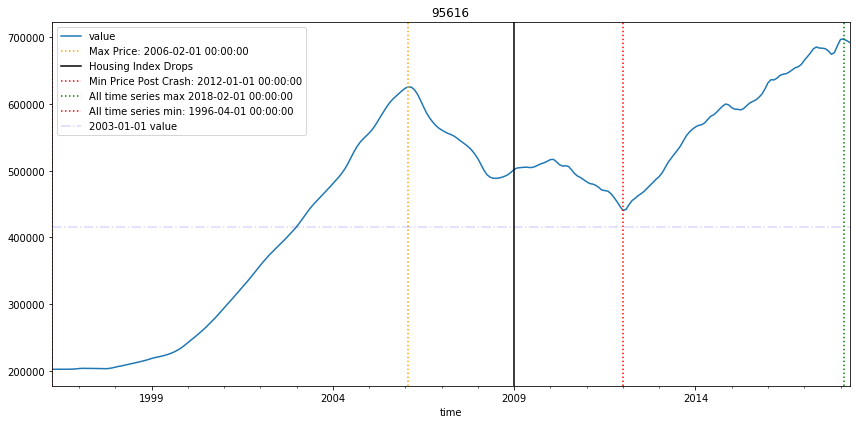

In [977]:
plot_ts_zips(df_melt, col='value', zipcodes=['95616'])

### Creating ACF and PACF plots

In [384]:
from statsmodels.tsa.seasonal import seasonal_decompose
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
from pandas.plotting import autocorrelation_plot, lag_plot

In [978]:
ts_95616.head(3)

,Zip,City,State,Metro,CountyName,SizeRank,value,MetroState
time,,,,,,,,
1996-04-01,95616,Davis,CA,Sacramento,Yolo,955,202500.0,Sacramento CA
1996-05-01,95616,Davis,CA,Sacramento,Yolo,955,202500.0,Sacramento CA
1996-06-01,95616,Davis,CA,Sacramento,Yolo,955,202500.0,Sacramento CA


In [979]:
ts_95616.tail(3)

,Zip,City,State,Metro,CountyName,SizeRank,value,MetroState
time,,,,,,,,
2018-02-01,95616,Davis,CA,Sacramento,Yolo,955,697500.0,Sacramento CA
2018-03-01,95616,Davis,CA,Sacramento,Yolo,955,695000.0,Sacramento CA
2018-04-01,95616,Davis,CA,Sacramento,Yolo,955,692300.0,Sacramento CA


In [980]:
ts_95616_values = ts_95616.value

In [399]:
def plot_acf_pacf(ts, figsize=(10,6), lags=15):
    
    ''' Plots both ACF and PACF for given times series (ts).  Time series needs to be a Series 
    (not DataFrame) of values.  Can modify figsize and number of lags if desired.'''

    fig, ax = plt.subplots(nrows=2, figsize=figsize)
    plot_acf(ts, ax=ax[0], lags=lags)
    plot_pacf(ts, ax=ax[1], lags=lags)
    plt.tight_layout()
    
    for a in ax:
        a.xaxis.set_major_locator(mpl.ticker.MaxNLocator(min_n_ticks=lags, integer=True))
        a.xaxis.grid()
    

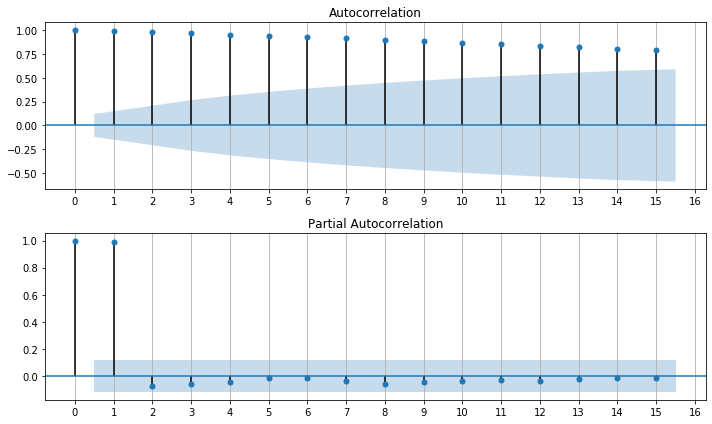

In [982]:
plot_acf_pacf(ts_95616_values)

### Seasonal Decomposition

In [400]:
# from James Irving's study group
# plot seasonal decomposition

def plot_seasonal_decomp(ts):
    decomp = seasonal_decompose(ts)
    ts_seasonal = decomp.seasonal

    ax = ts_seasonal.plot()
    fig = ax.get_figure()
    fig.set_size_inches(18,6)

    min_ = ts_seasonal.idxmin()
    max_ = ts_seasonal.idxmax()
    max_2 = ts_seasonal.loc[min_:].idxmax()
    min_2 = ts_seasonal.loc[max_2:].idxmin()


    ax.axvline(min_, label=min_, c='orange')
    ax.axvline(max_, c='orange', ls=':')
    ax.axvline(min_2, c='orange')
    ax.axvline(max_2, c='orange', ls=':')

    period = min_2 - min_ 
    ax.set_title(f'Season Length = {period}')
    
    return fig, ax

# Seasonality isn't much of a factor... maybe 0.1% in recent years from the lowest point in the year to the highest 

(<Figure size 1296x432 with 1 Axes>,
 <matplotlib.axes._subplots.AxesSubplot at 0x1a60a69400>)

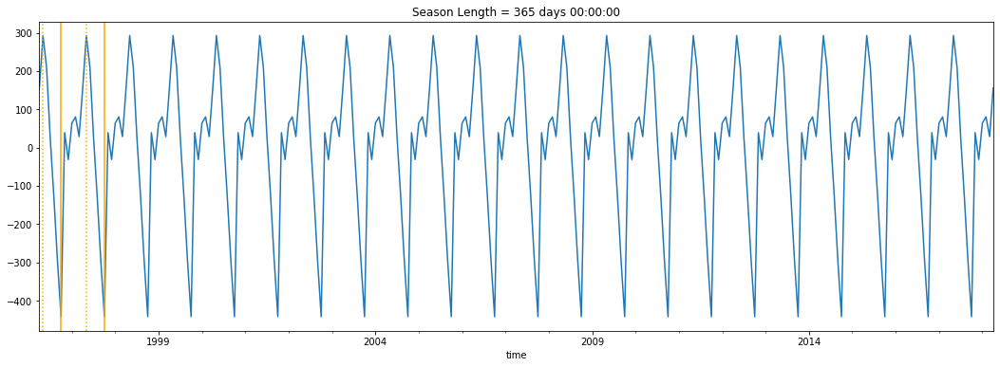

In [983]:
plot_seasonal_decomp(ts_95616_values)

# Step 4:  ARIMA Modeling

In [984]:
print(type(ts_95616))
ts_95616.head()  # check ts; should be a series with time as index and values

<class 'pandas.core.frame.DataFrame'>


,Zip,City,State,Metro,CountyName,SizeRank,value,MetroState
time,,,,,,,,
1996-04-01,95616,Davis,CA,Sacramento,Yolo,955,202500.0,Sacramento CA
1996-05-01,95616,Davis,CA,Sacramento,Yolo,955,202500.0,Sacramento CA
1996-06-01,95616,Davis,CA,Sacramento,Yolo,955,202500.0,Sacramento CA
1996-07-01,95616,Davis,CA,Sacramento,Yolo,955,202500.0,Sacramento CA
1996-08-01,95616,Davis,CA,Sacramento,Yolo,955,202500.0,Sacramento CA


## Creating p, d, q, and m values for running ARIMA model

In [560]:
import itertools

p_range = [0, 1, 2, 4, 8, 10]
q_range = range(0, 3)
d_range = range(1, 3)
m_range = (0, 6, 12)

pdq = list(itertools.product(p_range, d_range, q_range))
print(pdq)
print()
PDQM = list(itertools.product(p_range, d_range, q_range, m_range))
print(PDQM[:20])

[(0, 1, 0), (0, 1, 1), (0, 1, 2), (0, 2, 0), (0, 2, 1), (0, 2, 2), (1, 1, 0), (1, 1, 1), (1, 1, 2), (1, 2, 0), (1, 2, 1), (1, 2, 2), (2, 1, 0), (2, 1, 1), (2, 1, 2), (2, 2, 0), (2, 2, 1), (2, 2, 2), (4, 1, 0), (4, 1, 1), (4, 1, 2), (4, 2, 0), (4, 2, 1), (4, 2, 2), (8, 1, 0), (8, 1, 1), (8, 1, 2), (8, 2, 0), (8, 2, 1), (8, 2, 2), (10, 1, 0), (10, 1, 1), (10, 1, 2), (10, 2, 0), (10, 2, 1), (10, 2, 2)]

[(0, 1, 0, 0), (0, 1, 0, 6), (0, 1, 0, 12), (0, 1, 1, 0), (0, 1, 1, 6), (0, 1, 1, 12), (0, 1, 2, 0), (0, 1, 2, 6), (0, 1, 2, 12), (0, 2, 0, 0), (0, 2, 0, 6), (0, 2, 0, 12), (0, 2, 1, 0), (0, 2, 1, 6), (0, 2, 1, 12), (0, 2, 2, 0), (0, 2, 2, 6), (0, 2, 2, 12), (1, 1, 0, 0), (1, 1, 0, 6)]


## Setting up functions for running ARIMA models

In [985]:
ts_95616 = df_melt['value'].loc[df_melt['Zip'] == '95616']

In [986]:
ts_95616.head()

time
1996-04-01    202500.0
1996-05-01    202500.0
1996-06-01    202500.0
1996-07-01    202500.0
1996-08-01    202500.0
Name: value, dtype: float64

In [385]:
import warnings
from statsmodels.tsa.arima_model import ARIMA
import statsmodels.api as sm
from sklearn.metrics import mean_squared_error


In [386]:
def arima_predict_error(X, arima_order):
    train_size = int(len(X) * .85)
    train, test = X[0:train_size], X[train_size:]
    predictions = list()
    history = [x for x in train]
    for t in range(len(test)):
        model = ARIMA(history, order = arima_order)
        model_fit = model.fit(disp=0)
        y_hat = model_fit.forecast()[0]
        predictions.append(y_hat)
        history.append(test[t])
    error = mean_squared_error(test, predictions)
    return error

def eval_arima_models(data, p_values, d_values, q_values):
    data = data.astype('float32')
    best_score, best_cfg = float("inf"), None
    for p in p_values:
        for d in d_values:
            for q in q_values:
                order = (p,d,q)
                try:
                    mse = arima_predict_error(data, order)
                    if mse < best_score:
                        best_score, best_cfg = mse, order
                    print('ARIMA%s MSE=%.3f' % (order,mse))
                except:
                    continue
    print('Best ARIMA%s MSE=%.3f' % (best_cfg, best_score))


## Function to find best p,d,q parameters for ARIMA model

In [387]:
# evaluate parameters
p_values = [0, 1, 2, 4, 8, 10]
d_values = range(0, 3)
q_values = range(0, 3)
warnings.filterwarnings("ignore")


In [987]:
# eval_arima_models(ts_95616.values, p_values, d_values, q_values)    

# Step 5: Interpreting Results

## Create ARIMA model for ZIP 95616 and show summary results table

In [388]:
# Define function

def arima_zipcode(ts, order):
    model = ARIMA(ts.values, order = order)
    model_fit = model.fit(disp=0)
    print(model_fit.summary())
    return model_fit

In [989]:
model_fit_davis = arima_zipcode(ts_95616_values, order = (1,1,1))

                             ARIMA Model Results                              
Dep. Variable:                    D.y   No. Observations:                  264
Model:                 ARIMA(1, 1, 1)   Log Likelihood               -2269.949
Method:                       css-mle   S.D. of innovations           1305.102
Date:                Tue, 10 Mar 2020   AIC                           4547.898
Time:                        21:53:31   BIC                           4562.202
Sample:                             1   HQIC                          4553.646
                                                                              
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const       1713.0323    855.569      2.002      0.046      36.148    3389.917
ar.L1.D.y      0.8449      0.033     25.440      0.000       0.780       0.910
ma.L1.D.y      0.6877      0.037     18.769      0.0

## Create forecast model

In [389]:
# Define function

def forecast(model_fit, months=24, confint=2):
    forecast = model_fit.forecast(months)
    actual_forecast = forecast[0]
    std_error = forecast[1]
    forecast_confint = forecast[confint]
    return actual_forecast, std_error, forecast_confint   

In [1045]:
actual_forecast_95616, std_error_95616, forecast_confint_95616 = forecast(model_fit_davis)

In [1046]:
actual_forecast_95616, std_error_95616, forecast_confint_95616  # note standard error balloons the further 
                                              # into the future we go

(array([689440.26912232, 687289.96735245, 685739.03221065, 684694.47656599,
        684077.739527  , 683822.44832141, 683872.52740303, 684180.60091615,
        684706.64300537, 685416.83751948, 686282.6146235 , 687279.83687305,
        688388.11156289, 689590.20975949, 690871.57546606, 692219.91093698,
        693624.82632743, 695077.54369728, 696570.64693639, 698097.8704872 ,
        699653.9208453 , 701234.32575283, 702835.30678844, 704453.6717238 ]),
 array([ 1305.10193226,  3553.5690106 ,  6130.12709299,  8878.61440768,
        11705.97201953, 14553.91891713, 17384.91806098, 20174.6464616 ,
        22907.55269741, 25574.05704629, 28168.70475162, 30688.90867599,
        33134.07394938, 35504.9790438 , 37803.33360297, 40031.46058193,
        42192.06715445, 44288.07973834, 46322.5257245 , 48298.44942573,
        50218.85318959, 52086.65704579, 53904.67199895, 55675.58334159]),
 array([[686882.31633894, 691998.22190571],
        [680325.10007509, 694254.8346298 ],
        [673724.2038

## Create dataframe to hold these values and join to existing dataframe

In [392]:
# Define function

def forecast_df(actual_forecast, forecast_confint, col = 'time', 
                daterange = pd.date_range(start='2018-05-01', end='2020-04-01', freq='MS')):
    df_forecast = pd.DataFrame({col: daterange})
    df_forecast['forecast'] = actual_forecast
    df_forecast['forecast_lower'] = forecast_confint[:, 0]
    df_forecast['forecast_upper'] = forecast_confint[:, 1]
    df_forecast.set_index('time', inplace=True)
    return df_forecast

In [1048]:
df_forecast_95616 = forecast_df(actual_forecast_95616, forecast_confint_95616)

## Create df_new with historical and forecasted values

In [393]:
def concat_values_forecast(ts, df_forecast):
    df_new = pd.concat([ts, df_forecast])
    df_new = df_new.rename(columns = {0: 'value'})
    return df_new

In [1050]:
df_new_95616 = concat_values_forecast(ts_95616, df_forecast_95616)

In [1051]:
df_new_95616

,value,forecast,forecast_lower,forecast_upper
time,,,,
1996-04-01,202500.0,NaN,NaN,NaN
1996-05-01,202500.0,NaN,NaN,NaN
1996-06-01,202500.0,NaN,NaN,NaN
1996-07-01,202500.0,NaN,NaN,NaN
1996-08-01,202500.0,NaN,NaN,NaN
1996-09-01,202500.0,NaN,NaN,NaN
1996-10-01,202600.0,NaN,NaN,NaN
1996-11-01,202800.0,NaN,NaN,NaN
1996-12-01,203100.0,NaN,NaN,NaN


## Plot forecast results

In [394]:
# Define function

def plot_forecast(df, figsize=(12,8), geog='95616'):
    fig = plt.figure(figsize=figsize)
    plt.plot(df['value'], label='Raw Data')
    plt.plot(df['forecast'], label='Forecast')
    plt.fill_between(df.index, df['forecast_lower'], df['forecast_upper'], color='k', alpha = 0.2, 
                 label='Confidence Interval')
    plt.legend(loc = 'upper left')
    plt.title(f'Forecast for {geog}')


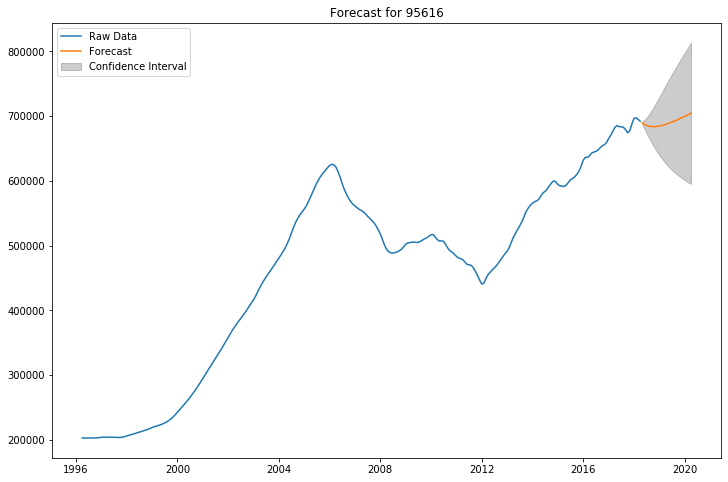

In [1052]:
plot_forecast(df_new_95616)

## Figure out percent change in home values

In [395]:
# Define functions

def forecast_values(df=df, date = '2020-04-01'):
    forecasted_price = df.loc[date, 'forecast']
    forecasted_lower = df.loc[date, 'forecast_lower']
    forecasted_upper = df.loc[date, 'forecast_upper']    
    return forecasted_price, forecasted_lower, forecasted_upper

In [1053]:
forecasted_price_95616, forecasted_lower_95616, forecasted_upper_95616 = forecast_values(df_new_95616)

In [1055]:
forecasted_price_95616, forecasted_lower_95616, forecasted_upper_95616

(704453.6717237971, 595331.5335560273, 813575.8098915669)

In [396]:
def last_value(df, date = '2018-04-01'):
    last_value = df.loc[date, 'value']
    return last_value


In [1063]:
last_value_95616 = last_value(df_new_95616)

In [1064]:
last_value_95616

692300.0

## Compute and print predicted, best, and worst case scenarios

In [397]:
def pred_best_worst(pred, low, high, last, date='April 1, 2020'):
    pred_pct_change = (((pred - last) / last) * 100)
    print(f'By the model prediction, I would expect to see a {round(pred_pct_change, 3)}% change in price by April 1, 2020.')
    lower_pct_change = ((low - last) / last) * 100
    print(f'At the lower bound of the confidence interval, I would expect to see a {round(lower_pct_change, 3)}% change in price by April 1, 2020.')
    upper_pct_change = ((high - last) / last) * 100
    print(f'At the upper bound of the confidence interval, I would expect to see a {round(upper_pct_change, 3)}% change in price by April 1, 2020.')
    return round(pred_pct_change, 3), round(lower_pct_change, 3), round(upper_pct_change, 3)
        

In [1577]:
davis_95616_pred, davis_95616_lower, davis_95616_upper = pred_best_worst(pred=forecasted_price_95616, low=forecasted_lower_95616, high=forecasted_upper_95616, last=last_value_95616, date='April 1, 2020')


By the model prediction, I would expect to see a 1.756% change in price by April 1, 2020.
At the lower bound of the confidence interval, I would expect to see a -14.007% change in price by April 1, 2020.
At the upper bound of the confidence interval, I would expect to see a 17.518% change in price by April 1, 2020.


In [1578]:
davis_95616_pred, davis_95616_lower, davis_95616_upper

(1.756, -14.007, 17.518)

## Recommendation--Zip code 95616:   would not recommend

By the model prediction, I would expect to see a 1.756% change in price by April 1, 2020
At the lower bound of the confidence interval, I would expect to see a -14.007% change in price by April 1, 2020
At the upper bound of the confidence interval, I would expect to see a 17.518% change in price by April 1, 2020


# SacMetro: 95619 (Diamond Springs) -- Good potential investment candidate

In [1068]:
geog_area = '95619'

In [1069]:
ts_95619 = df_sac.loc[df_sac['Zip'] == geog_area]  # ts for all of the following functions should have only one zipcode
ts_95619.head()


,Metro,MetroState,CountyName,City,Zip,SizeRank,value
time,,,,,,,
1996-04-01,Sacramento,Sacramento CA,El Dorado,Diamond Springs,95619,9888,122400.0
1996-05-01,Sacramento,Sacramento CA,El Dorado,Diamond Springs,95619,9888,121800.0
1996-06-01,Sacramento,Sacramento CA,El Dorado,Diamond Springs,95619,9888,121200.0
1996-07-01,Sacramento,Sacramento CA,El Dorado,Diamond Springs,95619,9888,120700.0
1996-08-01,Sacramento,Sacramento CA,El Dorado,Diamond Springs,95619,9888,120200.0


In [1070]:
# ts.head()

ts_95619.head()

,Metro,MetroState,CountyName,City,Zip,SizeRank,value
time,,,,,,,
1996-04-01,Sacramento,Sacramento CA,El Dorado,Diamond Springs,95619,9888,122400.0
1996-05-01,Sacramento,Sacramento CA,El Dorado,Diamond Springs,95619,9888,121800.0
1996-06-01,Sacramento,Sacramento CA,El Dorado,Diamond Springs,95619,9888,121200.0
1996-07-01,Sacramento,Sacramento CA,El Dorado,Diamond Springs,95619,9888,120700.0
1996-08-01,Sacramento,Sacramento CA,El Dorado,Diamond Springs,95619,9888,120200.0


In [1071]:
# ts = ts.value

ts_95619_values = ts_95619.value

In [1072]:
# ts.head()

ts_95619_values.head()

time
1996-04-01    122400.0
1996-05-01    121800.0
1996-06-01    121200.0
1996-07-01    120700.0
1996-08-01    120200.0
Name: value, dtype: float64

### Visualizations

#### plot_ts:  Plot zip code(s) of interest over time, with market highs and lows

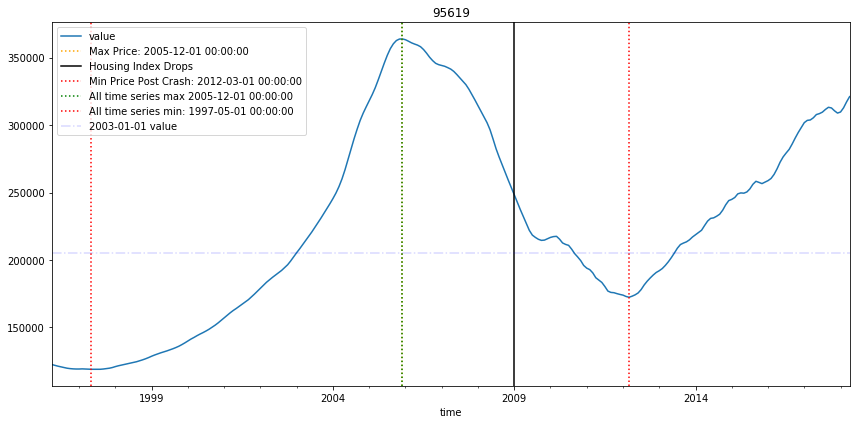

In [1026]:
# fig, ax = plot_ts(df_melt, zipcodes=['95616', '92008', '90035', '90025', '60625', '57701'])  # enter desired zip code(s)

fig, ax = plot_ts_zips(df_melt, zipcodes=['95619'])  # enter desired zip code(s)

#### Boxplot of zip code

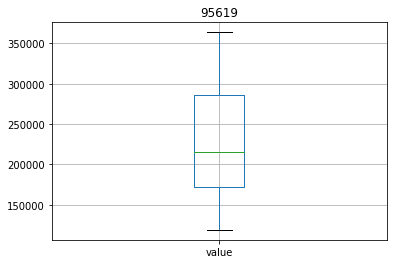

In [1027]:
ts_95619.boxplot(column = 'value')
plt.title('95619');


### Plot ACF and PACF for ts dataframe

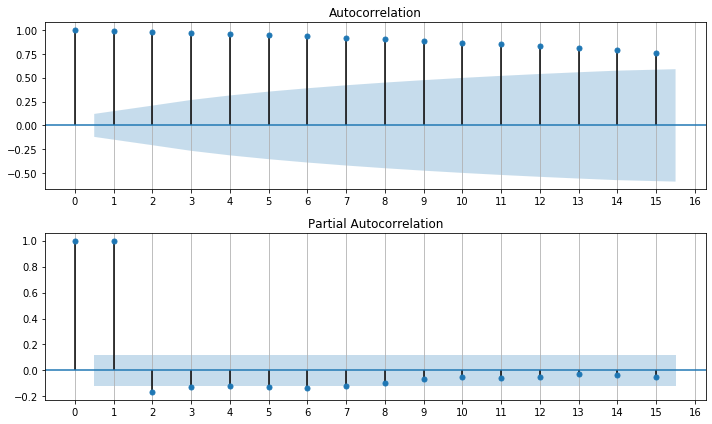

In [1028]:
# plot_acf_pacf(ts, figsize=(10,6), lags=15)  # note that ts must only contain values and time as index

plot_acf_pacf(ts_95619_values, figsize=(10,6), lags=15)

### Plot seasonal decomposition for ts dataframe

(<Figure size 1296x432 with 1 Axes>,
 <matplotlib.axes._subplots.AxesSubplot at 0x1a9cef68d0>)

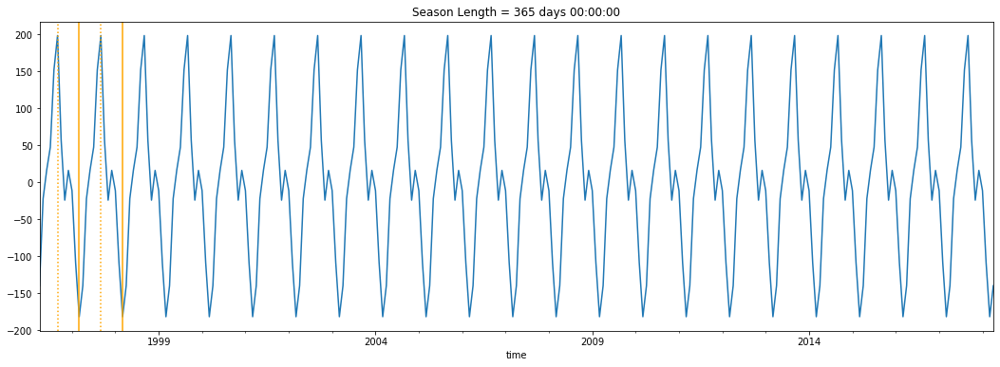

In [1029]:
# plot_seasonal_decomp(ts)

plot_seasonal_decomp(ts_95619_values)

# Seasonality does not appear to be a significant factor in this zip code.

## ARIMA model parameters and optimization

### Generate list of (p,d,q) and (p,d,q,m) values

In [1030]:
p_values = [0, 1, 2, 4, 6, 8]
d_values = range(0, 3)
q_values = range(0, 3)
warnings.filterwarnings("ignore")

### Run ARIMA model on ts dataframe with list of p,d,q values 

In [1031]:
# eval_arima_models(ts, p_values, d_values, q_values)  # don't run this until you have some time, since it take time
# note that ts must only contain values and time as index

# eval_arima_models(ts_95619_values, p_values, d_values, q_values)  # don't run this until you have some time, since it takes time


### Generate model fit summary

In [1032]:
# model_fit = arima_zipcode(ts, order = None)   # change order = tuple to correspond to the best MSE produced by previous function

# Best ARIMA(2, 1, 2) MSE=1084744.932

model_fit_95619 = arima_zipcode(ts_95619_values, order = (2,1,2))


                             ARIMA Model Results                              
Dep. Variable:                    D.y   No. Observations:                  264
Model:                 ARIMA(2, 1, 2)   Log Likelihood               -2074.470
Method:                       css-mle   S.D. of innovations            619.869
Date:                Tue, 10 Mar 2020   AIC                           4160.940
Time:                        21:58:37   BIC                           4182.396
Sample:                             1   HQIC                          4169.562
                                                                              
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const        752.6516    701.630      1.073      0.284    -622.518    2127.821
ar.L1.D.y      0.2992      0.066      4.505      0.000       0.169       0.429
ar.L2.D.y      0.5239      0.066      7.935      0.0

## ARIMA modeling results:  predictions and visualization

### Produce forecasts from ARIMA model fit

In [1073]:
def forecast(model_fit, months=24, confint=2):
    '''From Helper_functions python file'''
    forecast = model_fit.forecast(months)
    actual_forecast = forecast[0]
    std_error = forecast[1]
    forecast_confint = forecast[confint]
    return actual_forecast, std_error, forecast_confint   

actual_forecast_95619, std_error_95619, forecast_confint_95619 = forecast(model_fit_95619)

# actual_forecast, forecast_confint = forecast(model_fit_dallas, months=24, confint=2)

In [1074]:
actual_forecast_95619, std_error_95619, forecast_confint_95619

(array([323941.32620535, 326351.73163503, 328694.63587584, 330791.58258218,
        332779.57686675, 334606.11508162, 336327.26638031, 337932.29916728,
        339447.37759531, 340874.70738836, 342228.65602492, 343514.67770993,
        344741.9314927 , 345916.01516284, 347043.40200352, 348128.9614733 ,
        349177.54185762, 350193.14485435, 351179.50777767, 352139.84530868,
        353077.07724948, 353993.76136674, 354892.19262083, 355774.39767053]),
 array([  619.86884619,  1859.8092769 ,  3470.71847751,  5203.08945879,
         7062.73332149,  8976.76432596, 10933.02684515, 12902.24077475,
        14873.9231942 , 16834.41378929, 18776.86014438, 20694.47468014,
        22583.31862073, 24440.08329009, 26262.81684727, 28050.13209546,
        29801.35319487, 31516.20165156, 33194.79198111, 34837.49107208,
        36444.88458762, 38017.70607071, 39556.80570851, 41063.1111798 ]),
 array([[322726.40559167, 325156.24681903],
        [322706.57243419, 329996.89083587],
        [321892.1526

### Create dataframe to hold forecast results

In [1075]:
# df_forecast = forecast_df(col = 'time', daterange = pd.date_range(start='2018-05-01', end='2020-04-01', freq='MS'), 
#                 actual_forecast=actual_forecast, forecast_confint = forecast_confint)

df_forecast_95619 = forecast_df(actual_forecast_95619, forecast_confint_95619, col = 'time', daterange = pd.date_range(start='2018-05-01', end='2020-04-01', freq='MS'))


### Create new dataframe concatenating historic values and forecast results

In [1077]:
# df_new = concat_values_forecast(ts, df_forecast)

df_new_95619 = concat_values_forecast(ts_95619_values, df_forecast_95619)

In [1078]:
df_new_95619.head()

,value,forecast,forecast_lower,forecast_upper
time,,,,
1996-04-01,122400.0,NaN,NaN,NaN
1996-05-01,121800.0,NaN,NaN,NaN
1996-06-01,121200.0,NaN,NaN,NaN
1996-07-01,120700.0,NaN,NaN,NaN
1996-08-01,120200.0,NaN,NaN,NaN


In [1079]:
df_new_95619.tail()

,value,forecast,forecast_lower,forecast_upper
time,,,,
2019-12-01,NaN,352139.845309,283859.617496,420420.073122
2020-01-01,NaN,353077.077249,281646.416037,424507.738462
2020-02-01,NaN,353993.761367,279480.426693,428507.096040
2020-03-01,NaN,354892.192621,277362.278089,432422.107153
2020-04-01,NaN,355774.397671,275292.178665,436256.616676


### Calculate predicted, lower bound, and upper bound forecasted prices

In [1080]:
forecasted_price_95619, forecasted_lower_95619, forecasted_upper_95619 = forecast_values(df_new_95619)

In [1081]:
forecasted_price_95619, forecasted_lower_95619, forecasted_upper_95619  # predicted, best-case, and worst-case prices in 2020

(355774.39767052844, 275292.17866495845, 436256.61667609843)

In [1082]:
last_value_95619 = df_new_95619['value'].loc['2018-04-01']

In [1083]:
last_value_95619

321100.0

### Plot forecast with confidence intervals

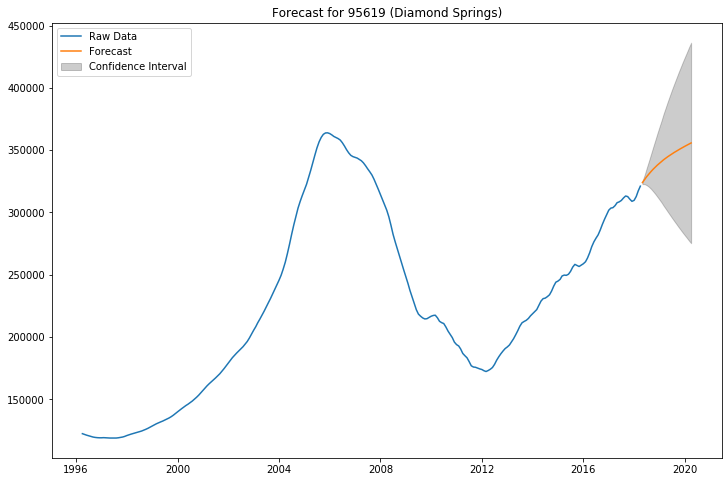

In [1084]:
# plot_forecast(df = df_new, figsize=(12,8), geog=None)

plot_forecast(df_new_95619, figsize=(12,8), geog='95619 (Diamond Springs)')

### Print summary of predicted, worst-case, and best-case scenarios

In [1085]:
diamond_springs_95619_pred, diamond_springs_95619_low, diamond_springs_95619_high = pred_best_worst(pred=forecasted_price_95619, low=forecasted_lower_95619, high=forecasted_upper_95619, last=last_value_95619, date='April 1, 2020')
diamond_springs_95619_pred, diamond_springs_95619_low, diamond_springs_95619_high

By the model prediction, I would expect to see a 10.799% change in price by April 1, 2020.
At the lower bound of the confidence interval, I would expect to see a -14.266% change in price by April 1, 2020.
At the upper bound of the confidence interval, I would expect to see a 35.863% change in price by April 1, 2020.


(10.799, -14.266, 35.863)

## Recommendation--Zip code 95619:  potential investment candidate

By the model prediction, I would expect to see a 10.799% change in price by April 1, 2020.
At the lower bound of the confidence interval, I would expect to see a -14.266% change in price by April 1, 2020.
At the upper bound of the confidence interval, I would expect to see a 35.863% change in price by April 1, 2020.



# SacMetro: 95864 (Arden-Arcade) -- Don't invest

In [1143]:
geog_area = '95864'

### Create dataframe containing values for just this geographic unit

In [1144]:
# df_geog = df_geog(df=df_metro_cities, col = 'MetroState', geog = 'New York NY')

ts_95864 = df_sac.loc[df_sac['Zip'] == geog_area]  # ts for all of the following functions should have only one zipcode
ts_95864.head()


,Metro,MetroState,CountyName,City,Zip,SizeRank,value
time,,,,,,,
1996-04-01,Sacramento,Sacramento CA,Sacramento,Arden-Arcade,95864,4500,171200.0
1996-05-01,Sacramento,Sacramento CA,Sacramento,Arden-Arcade,95864,4500,171200.0
1996-06-01,Sacramento,Sacramento CA,Sacramento,Arden-Arcade,95864,4500,171300.0
1996-07-01,Sacramento,Sacramento CA,Sacramento,Arden-Arcade,95864,4500,171500.0
1996-08-01,Sacramento,Sacramento CA,Sacramento,Arden-Arcade,95864,4500,171800.0


In [1145]:
# ts.head()

ts_95864.tail()

,Metro,MetroState,CountyName,City,Zip,SizeRank,value
time,,,,,,,
2017-12-01,Sacramento,Sacramento CA,Sacramento,Arden-Arcade,95864,4500,557500.0
2018-01-01,Sacramento,Sacramento CA,Sacramento,Arden-Arcade,95864,4500,563300.0
2018-02-01,Sacramento,Sacramento CA,Sacramento,Arden-Arcade,95864,4500,566100.0
2018-03-01,Sacramento,Sacramento CA,Sacramento,Arden-Arcade,95864,4500,560800.0
2018-04-01,Sacramento,Sacramento CA,Sacramento,Arden-Arcade,95864,4500,552700.0


In [1146]:
# ts = ts.value

ts_95864_values = ts_95864.value

In [1147]:
# ts.head()

ts_95864_values.head()

time
1996-04-01    171200.0
1996-05-01    171200.0
1996-06-01    171300.0
1996-07-01    171500.0
1996-08-01    171800.0
Name: value, dtype: float64

### Visualizations

#### plot_ts:  Plot zip code(s) of interest over time, with market highs and lows

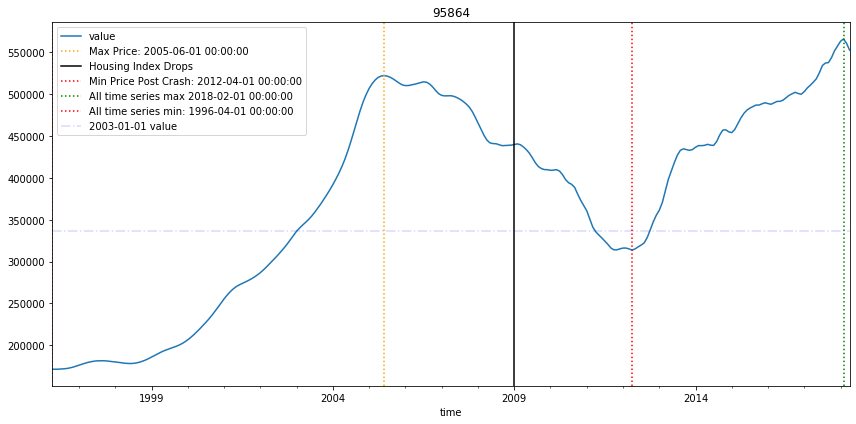

In [614]:
# fig, ax = plot_ts(df_melt, zipcodes=['95616', '92008', '90035', '90025', '60625', '57701'])  # enter desired zip code(s)

fig, ax = plot_ts_zips(df_melt, zipcodes=['95864'])  # enter desired zip code(s)

#### Boxplot of zip codes by city in a metro area

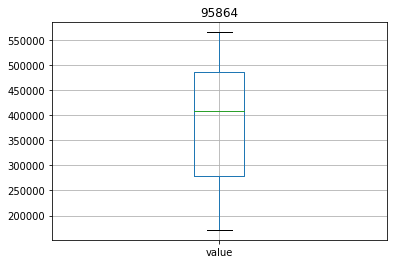

In [1148]:
ts_95864.boxplot(column = 'value')
plt.title('95864');


### Plot ACF and PACF for ts dataframe

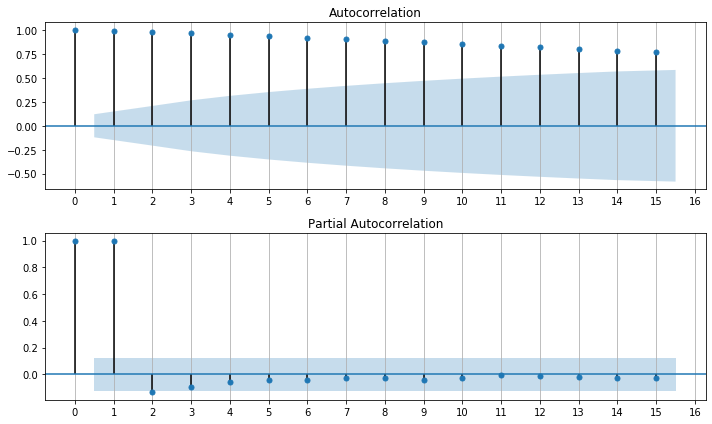

In [616]:
# note that ts must only contain values and time as index

# plot_acf_pacf(ts, figsize=(10,6), lags=15)  # note that ts must only contain values and time as index

plot_acf_pacf(ts_95864_values, figsize=(10,6), lags=15)

### Plot seasonal decomposition for ts dataframe

(<Figure size 1296x432 with 1 Axes>,
 <matplotlib.axes._subplots.AxesSubplot at 0x1cbe436278>)

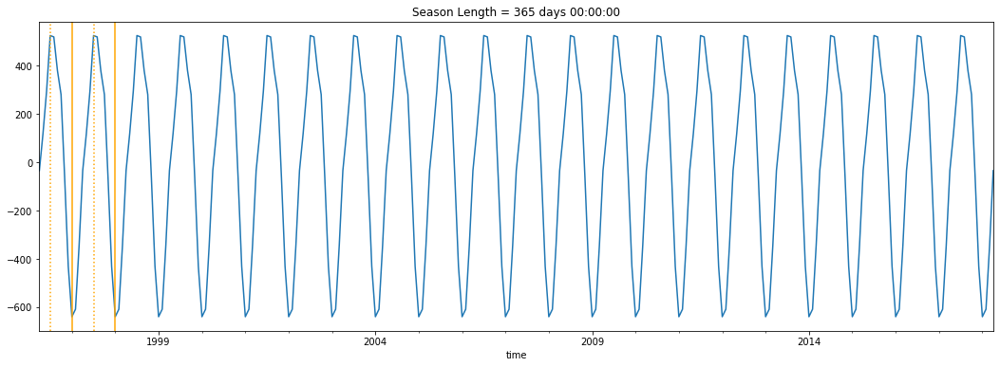

In [617]:
# plot_seasonal_decomp(ts)

plot_seasonal_decomp(ts_95864_values)


## ARIMA model parameters and optimization

### Run ARIMA model on ts dataframe with list of p,d,q values 

In [618]:
p_values = [0, 1, 2, 4, 6, 8]
d_values = range(0, 3)
q_values = range(0, 3)
warnings.filterwarnings("ignore")

In [619]:
# eval_arima_models(ts, p_values, d_values, q_values)  # don't run this until you have some time, since it take time
# note that ts must only contain values and time as index

# eval_arima_models(ts_95864_values, p_values, d_values, q_values)  # don't run this until you have some time, since it take time

### Generate model fit summary

In [1149]:
# model_fit = arima_zipcode(ts, order = None)   # change order = tuple to correspond to the best MSE produced by previous function

# Best ARIMA(4, 1, 1) MSE=1137443.820

model_fit_95864 = arima_zipcode(ts_95864_values, order = (4,1,1))

                             ARIMA Model Results                              
Dep. Variable:                    D.y   No. Observations:                  264
Model:                 ARIMA(4, 1, 1)   Log Likelihood               -2242.232
Method:                       css-mle   S.D. of innovations           1173.238
Date:                Tue, 10 Mar 2020   AIC                           4498.464
Time:                        22:16:25   BIC                           4523.496
Sample:                             1   HQIC                          4508.522
                                                                              
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const       1180.4908   1063.273      1.110      0.268    -903.485    3264.467
ar.L1.D.y      1.4022      0.137     10.261      0.000       1.134       1.670
ar.L2.D.y     -0.9589      0.220     -4.362      0.0

## ARIMA modeling results:  predictions and visualization

### Produce forecasts from ARIMA model fit

In [1150]:
actual_forecast_95864, std_error_95864, forecast_confint_95864 = forecast(model_fit_95864)

# actual_forecast, forecast_confint = forecast(model_fit_dallas, months=24, confint=2)

In [1151]:
actual_forecast_95864, std_error_95864, forecast_confint_95864

(array([547564.43427103, 544451.44278531, 540865.14774281, 536988.3419876 ,
        533956.63933575, 531767.45312849, 529842.18395616, 528057.22318399,
        526610.90741252, 525536.27227744, 524704.17823615, 524046.4043252 ,
        523580.20101898, 523308.64704516, 523197.24044099, 523216.40740941,
        523356.94211458, 523612.09551429, 523968.14047727, 524411.23568958,
        524932.36086998, 525524.58251239, 526180.31396717, 526892.10307147]),
 array([ 1173.23844655,  3406.68581889,  5978.41104793,  8550.6792402 ,
        11203.51463305, 14015.74199013, 16921.4538382 , 19835.67899011,
        22737.80642414, 25633.00227572, 28511.56061768, 31356.26904523,
        34158.56557334, 36916.86733898, 39629.10935372, 42291.9789304 ,
        44903.53430771, 47463.56169155, 49972.29386903, 52429.92178872,
        54836.93329256, 57194.24733327, 59502.99434541, 61764.3589506 ]),
 array([[545264.9291705 , 549863.93937155],
        [537774.46127364, 551128.42429698],
        [529147.6774

### Create dataframe to hold forecast results

In [1152]:
# df_forecast = forecast_df(col = 'time', daterange = pd.date_range(start='2018-05-01', end='2020-04-01', freq='MS'), 
#                 actual_forecast=actual_forecast, forecast_confint = forecast_confint)

df_forecast_95864 = forecast_df(actual_forecast_95864, forecast_confint_95864, col = 'time', daterange = pd.date_range(start='2018-05-01', end='2020-04-01', freq='MS'))


### Create new dataframe concatenating historic values and forecast results

In [1153]:
# df_new = concat_values_forecast(ts, df_forecast)

df_new_95864 = concat_values_forecast(ts_95864_values, df_forecast_95864)

In [1154]:
df_new_95864

,value,forecast,forecast_lower,forecast_upper
time,,,,
1996-04-01,171200.0,NaN,NaN,NaN
1996-05-01,171200.0,NaN,NaN,NaN
1996-06-01,171300.0,NaN,NaN,NaN
1996-07-01,171500.0,NaN,NaN,NaN
1996-08-01,171800.0,NaN,NaN,NaN
1996-09-01,172200.0,NaN,NaN,NaN
1996-10-01,172900.0,NaN,NaN,NaN
1996-11-01,173800.0,NaN,NaN,NaN
1996-12-01,175000.0,NaN,NaN,NaN


### Calculate predicted, lower bound, and upper bound forecasted prices

In [1155]:
forecasted_price_95864, forecasted_lower_95864, forecasted_upper_95864 = forecast_values(df_new_95864)

In [1156]:
forecasted_price_95864, forecasted_lower_95864, forecasted_upper_95864  # predicted, best-case, and worst-case prices in 2020

(526892.1030714705, 405836.1840000962, 647948.0221428449)

In [1157]:
last_value_95864 = df_new_95864['value'].loc['2018-04-01']

In [1158]:
last_value_95864

552700.0

### Plot forecast with confidence intervals

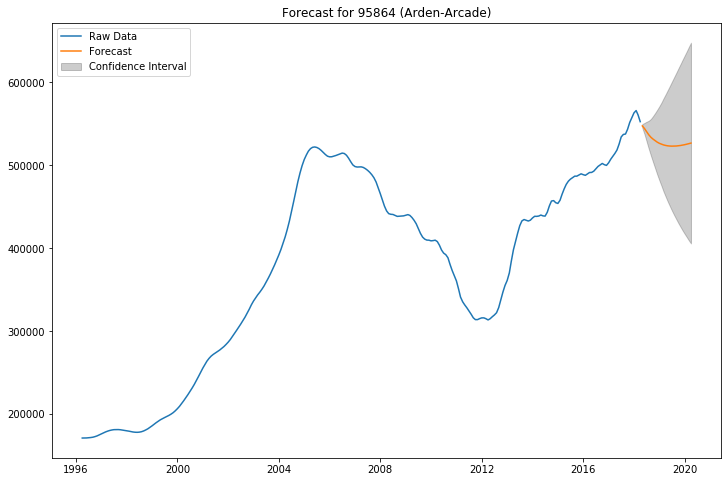

In [1159]:
# plot_forecast(df = df_new, figsize=(12,8), geog=None)

plot_forecast(df_new_95864, figsize=(12,8), geog='95864 (Arden-Arcade)')

### Print summary of predicted, worst-case, and best-case scenarios

In [1160]:
arden_95864_pred, arden_95864_low, arden_95864_high  = pred_best_worst(pred=forecasted_price_95864, low=forecasted_lower_95864, high=forecasted_upper_95864, last=last_value_95864, date='April 1, 2020')
arden_95864_pred, arden_95864_low, arden_95864_high

By the model prediction, I would expect to see a -4.669% change in price by April 1, 2020.
At the lower bound of the confidence interval, I would expect to see a -26.572% change in price by April 1, 2020.
At the upper bound of the confidence interval, I would expect to see a 17.233% change in price by April 1, 2020.


(-4.669, -26.572, 17.233)

## Recommendation for ZIP code 95864:  Don't invest

By the model prediction, I would expect to see a -4.669% change in price by April 1, 2020. 
At the lower bound of the confidence interval, I would expect to see a -26.572% change in price by April 1, 2020.
At the upper bound of the confidence interval, I would expect to see a 17.233% change in price by April 1, 2020.

# SacMetro:  95831 (Sacramento) -- Don't invest; lots of downside risk

In [1187]:
geog_area = '95831'

### Create dataframe containing values for just this geographic unit

In [1190]:
ts_95831 = df_sac.loc[df_sac['Zip'] == geog_area]  # ts for all of the following functions should have only one zipcode
ts_95831.head()


,Metro,MetroState,CountyName,City,Zip,SizeRank,value
time,,,,,,,
1996-04-01,Sacramento,Sacramento CA,Sacramento,Sacramento,95831,922,162600.0
1996-05-01,Sacramento,Sacramento CA,Sacramento,Sacramento,95831,922,162000.0
1996-06-01,Sacramento,Sacramento CA,Sacramento,Sacramento,95831,922,161200.0
1996-07-01,Sacramento,Sacramento CA,Sacramento,Sacramento,95831,922,160400.0
1996-08-01,Sacramento,Sacramento CA,Sacramento,Sacramento,95831,922,159500.0


In [1191]:
# ts.head()

ts_95831.head()

,Metro,MetroState,CountyName,City,Zip,SizeRank,value
time,,,,,,,
1996-04-01,Sacramento,Sacramento CA,Sacramento,Sacramento,95831,922,162600.0
1996-05-01,Sacramento,Sacramento CA,Sacramento,Sacramento,95831,922,162000.0
1996-06-01,Sacramento,Sacramento CA,Sacramento,Sacramento,95831,922,161200.0
1996-07-01,Sacramento,Sacramento CA,Sacramento,Sacramento,95831,922,160400.0
1996-08-01,Sacramento,Sacramento CA,Sacramento,Sacramento,95831,922,159500.0


In [1192]:
# ts = ts.value

ts_95831_values = ts_95831.value

In [1193]:
# ts.head()

ts_95831_values.head()

time
1996-04-01    162600.0
1996-05-01    162000.0
1996-06-01    161200.0
1996-07-01    160400.0
1996-08-01    159500.0
Name: value, dtype: float64

### Visualizations

#### plot_ts:  Plot zip code(s) of interest over time, with market highs and lows

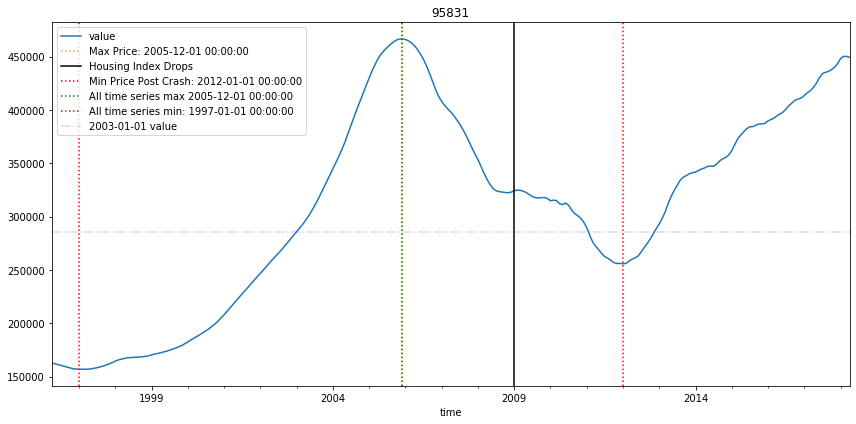

In [1194]:
# fig, ax = plot_ts(df_melt, zipcodes=['95616', '92008', '90035', '90025', '60625', '57701'])  # enter desired zip code(s)

fig, ax = plot_ts_zips(df_melt, zipcodes=['95831'])  # enter desired zip code(s)

#### Boxplot of zip code

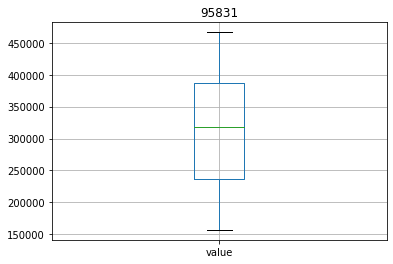

In [1167]:
# # note--check for SizeRank column and drop if needed
ts_95831.boxplot(column = 'value')
plt.title('95831');

### Plot ACF and PACF for ts dataframe

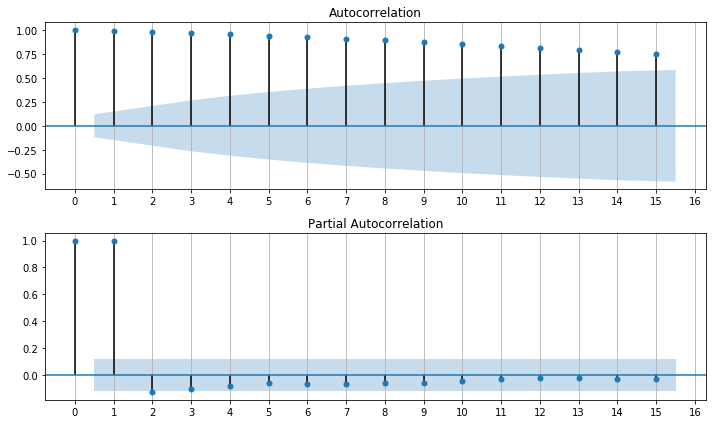

In [639]:
# plot_acf_pacf(ts, figsize=(10,6), lags=15)  # note that ts must only contain values and time as index

plot_acf_pacf(ts_95831_values, figsize=(10,6), lags=15)

### Plot seasonal decomposition for ts dataframe

(<Figure size 1296x432 with 1 Axes>,
 <matplotlib.axes._subplots.AxesSubplot at 0x1cbf70f2e8>)

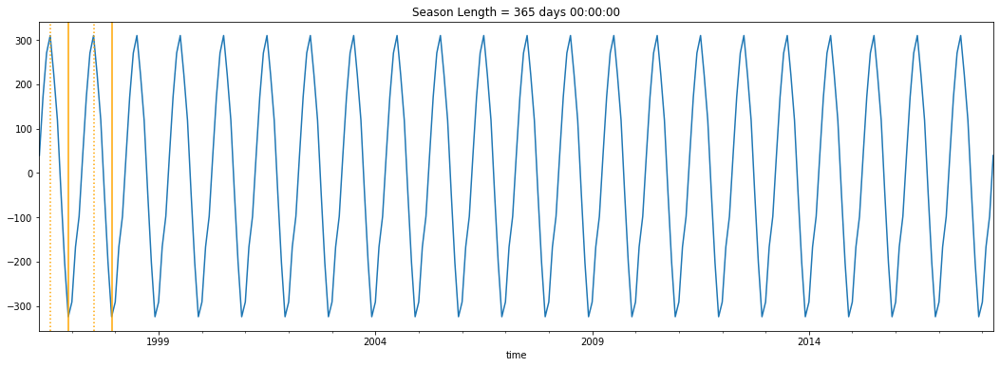

In [640]:
# plot_seasonal_decomp(ts)

plot_seasonal_decomp(ts_95831_values)

# Seasonality does not appear to be a significant factor in this zip code.

## ARIMA model parameters and optimization

### Generate list of (p,d,q) and (p,d,q,m) values

In [642]:
p_values = [0, 1, 2, 4, 6, 8]
d_values = range(0, 3)
q_values = range(0, 3)
warnings.filterwarnings("ignore")

### Run ARIMA model on ts dataframe with list of p,d,q values 

In [643]:
# eval_arima_models(ts, p_values, d_values, q_values)  # don't run this until you have some time, since it take time
# note that ts must only contain values and time as index

# eval_arima_models(ts_95831_values, p_values, d_values, q_values)  # don't run this until you have some time, since it takes time


### Generate model fit summary

In [1195]:
# model_fit = arima_zipcode(ts, order = None)   # change order = tuple to correspond to the best MSE produced by previous function

# Best ARIMA(6, 0, 2) MSE=955633.913

model_fit_95831 = arima_zipcode(ts_95831_values, order = (6,0,2))


                              ARMA Model Results                              
Dep. Variable:                      y   No. Observations:                  265
Model:                     ARMA(6, 2)   Log Likelihood               -2114.435
Method:                       css-mle   S.D. of innovations            686.860
Date:                Tue, 10 Mar 2020   AIC                           4248.869
Time:                        22:20:40   BIC                           4284.667
Sample:                             0   HQIC                          4263.252
                                                                              
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const       3.083e+05   3.71e+04      8.301      0.000    2.35e+05    3.81e+05
ar.L1.y        1.0718      0.099     10.815      0.000       0.878       1.266
ar.L2.y        0.2689      0.161      1.673      0.0

## ARIMA modeling results:  predictions and visualization

### Produce forecasts from ARIMA model fit

In [1196]:
actual_forecast_95831, std_error_95831, forecast_confint_95831 = forecast(model_fit_95831)

# actual_forecast, forecast_confint = forecast(model_fit_dallas, months=24, confint=2)

In [1197]:
actual_forecast_95831, std_error_95831, forecast_confint_95831

(array([448055.34904689, 446258.99142394, 444732.62966351, 442890.63817301,
        440908.86992911, 438846.29448965, 436698.00177897, 434394.61635692,
        432023.067973  , 429562.86789984, 427010.79839512, 424381.93182731,
        421688.50688566, 418926.14678419, 416105.66229123, 413234.19815818,
        410315.6151534 , 407355.44807063, 404360.56518167, 401335.54054039,
        398285.54159044, 395216.0085917 , 392131.8146654 , 389037.60616711]),
 array([  686.85952291,  1875.56400598,  3204.22890452,  4589.2614006 ,
         6189.42312157,  7902.40759175,  9684.86935222, 11550.90646994,
        13488.12564267, 15468.93716926, 17491.51695423, 19548.38628106,
        21627.70353003, 23722.80706226, 25828.54833246, 27937.77680785,
        30044.97454656, 32145.57941499, 34234.83275574, 36308.41148665,
        38362.63161821, 40393.96734777, 42399.16808204, 44375.3514589 ]),
 array([[446709.12911954, 449401.56897424],
        [442582.95352153, 449935.02932635],
        [438452.4564

### Create dataframe to hold forecast results

In [1198]:
# df_forecast = forecast_df(col = 'time', daterange = pd.date_range(start='2018-05-01', end='2020-04-01', freq='MS'), 
#                 actual_forecast=actual_forecast, forecast_confint = forecast_confint)

df_forecast_95831 = forecast_df(actual_forecast_95831, forecast_confint_95831, col = 'time', daterange = pd.date_range(start='2018-05-01', end='2020-04-01', freq='MS'))


### Create new dataframe concatenating historic values and forecast results

In [1199]:
# df_new = concat_values_forecast(ts, df_forecast)

df_new_95831 = concat_values_forecast(ts_95831_values, df_forecast_95831)

In [1200]:
df_new_95831

,value,forecast,forecast_lower,forecast_upper
time,,,,
1996-04-01,162600.0,NaN,NaN,NaN
1996-05-01,162000.0,NaN,NaN,NaN
1996-06-01,161200.0,NaN,NaN,NaN
1996-07-01,160400.0,NaN,NaN,NaN
1996-08-01,159500.0,NaN,NaN,NaN
1996-09-01,158700.0,NaN,NaN,NaN
1996-10-01,158000.0,NaN,NaN,NaN
1996-11-01,157300.0,NaN,NaN,NaN
1996-12-01,157000.0,NaN,NaN,NaN


### Calculate predicted, lower bound, and upper bound forecasted prices

In [1201]:
forecasted_price_95831, forecasted_lower_95831, forecasted_upper_95831 = forecast_values(df_new_95831)

In [1202]:
forecasted_price_95831, forecasted_lower_95831, forecasted_upper_95831  # predicted, best-case, and worst-case prices in 2020


(389037.6061671091, 302063.51550636766, 476011.69682785054)

In [1203]:
last_value_95831 = df_new_95831['value'].loc['2018-04-01']

In [1204]:
last_value_95831

449300.0

### Plot forecast with confidence intervals

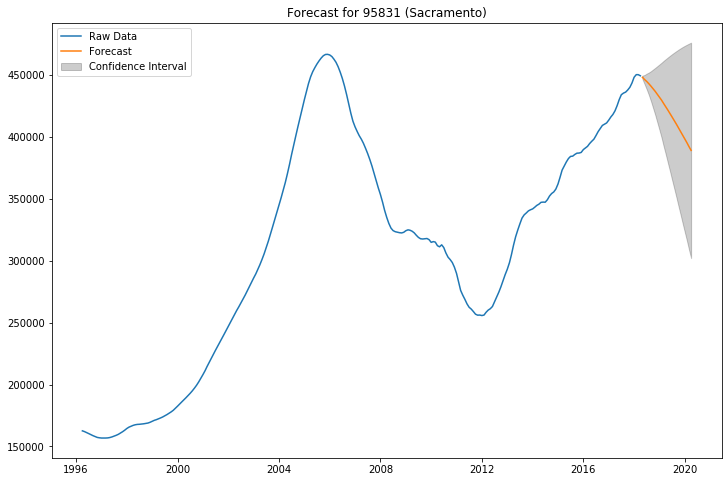

In [1205]:
# plot_forecast(df = df_new, figsize=(12,8), geog=None)

plot_forecast(df_new_95831, figsize=(12,8), geog='95831 (Sacramento)')

### Print summary of predicted, worst-case, and best-case scenarios

In [1206]:
sac_pocket_95831_pred, sac_pocket_95831_low, sac_pocket_95831_high = pred_best_worst(pred=forecasted_price_95831, low=forecasted_lower_95831, high=forecasted_upper_95831, last=last_value_95831, date='April 1, 2020')
sac_pocket_95831_pred, sac_pocket_95831_low, sac_pocket_95831_high

By the model prediction, I would expect to see a -13.413% change in price by April 1, 2020.
At the lower bound of the confidence interval, I would expect to see a -32.77% change in price by April 1, 2020.
At the upper bound of the confidence interval, I would expect to see a 5.945% change in price by April 1, 2020.


(-13.413, -32.77, 5.945)

## Zip code 95831:  don't invest; lots of downside risk

By the model prediction, I would expect to see a -13.413% change in price by April 1, 2020.
At the lower bound of the confidence interval, I would expect to see a -32.77% change in price by April 1, 2020.
At the upper bound of the confidence interval, I would expect to see a 5.945% change in price by April 1, 2020.

# SacMetro:  96142 (Tahoma) -- Potentially solid gains

In [1207]:
geog_area = '96142'

In [1208]:
ts_96142 = df_sac.loc[df_sac['Zip'] == geog_area]  # ts for all of the following functions should have only one zipcode
ts_96142.head()


,Metro,MetroState,CountyName,City,Zip,SizeRank,value
time,,,,,,,
1996-04-01,Sacramento,Sacramento CA,El Dorado,Tahoma,96142,14472,159000.0
1996-05-01,Sacramento,Sacramento CA,El Dorado,Tahoma,96142,14472,158900.0
1996-06-01,Sacramento,Sacramento CA,El Dorado,Tahoma,96142,14472,158900.0
1996-07-01,Sacramento,Sacramento CA,El Dorado,Tahoma,96142,14472,158900.0
1996-08-01,Sacramento,Sacramento CA,El Dorado,Tahoma,96142,14472,158900.0


In [1209]:
# ts.head()

ts_96142.head()

,Metro,MetroState,CountyName,City,Zip,SizeRank,value
time,,,,,,,
1996-04-01,Sacramento,Sacramento CA,El Dorado,Tahoma,96142,14472,159000.0
1996-05-01,Sacramento,Sacramento CA,El Dorado,Tahoma,96142,14472,158900.0
1996-06-01,Sacramento,Sacramento CA,El Dorado,Tahoma,96142,14472,158900.0
1996-07-01,Sacramento,Sacramento CA,El Dorado,Tahoma,96142,14472,158900.0
1996-08-01,Sacramento,Sacramento CA,El Dorado,Tahoma,96142,14472,158900.0


In [1210]:
# ts = ts.value

ts_96142_values = ts_96142.value

In [1211]:
# ts.head()

ts_96142_values.head()

time
1996-04-01    159000.0
1996-05-01    158900.0
1996-06-01    158900.0
1996-07-01    158900.0
1996-08-01    158900.0
Name: value, dtype: float64

In [1212]:
ts_96142_values.tail()

time
2017-12-01    485300.0
2018-01-01    485100.0
2018-02-01    496200.0
2018-03-01    512800.0
2018-04-01    523600.0
Name: value, dtype: float64

### Visualizations

#### plot_ts:  Plot zip code(s) of interest over time, with market highs and lows

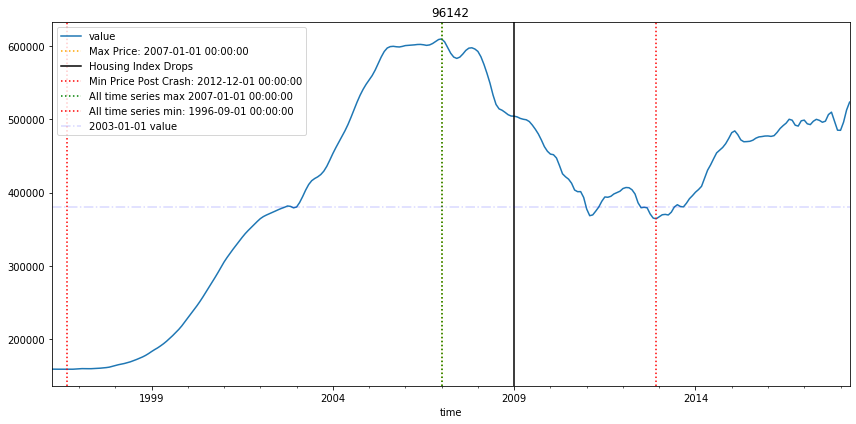

In [1213]:
# fig, ax = plot_ts(df_melt, zipcodes=['95616', '92008', '90035', '90025', '60625', '57701'])  # enter desired zip code(s)

fig, ax = plot_ts_zips(df_melt, zipcodes=['96142'])  # enter desired zip code(s)

In [663]:
ts_96142

,Metro,MetroState,CountyName,City,Zip,SizeRank,value
time,,,,,,,
1996-04-01,Sacramento,Sacramento CA,El Dorado,Tahoma,96142,14472,159000.0
1996-05-01,Sacramento,Sacramento CA,El Dorado,Tahoma,96142,14472,158900.0
1996-06-01,Sacramento,Sacramento CA,El Dorado,Tahoma,96142,14472,158900.0
1996-07-01,Sacramento,Sacramento CA,El Dorado,Tahoma,96142,14472,158900.0
1996-08-01,Sacramento,Sacramento CA,El Dorado,Tahoma,96142,14472,158900.0
1996-09-01,Sacramento,Sacramento CA,El Dorado,Tahoma,96142,14472,158800.0
1996-10-01,Sacramento,Sacramento CA,El Dorado,Tahoma,96142,14472,158800.0
1996-11-01,Sacramento,Sacramento CA,El Dorado,Tahoma,96142,14472,158900.0
1996-12-01,Sacramento,Sacramento CA,El Dorado,Tahoma,96142,14472,159200.0


#### Boxplot of zip code

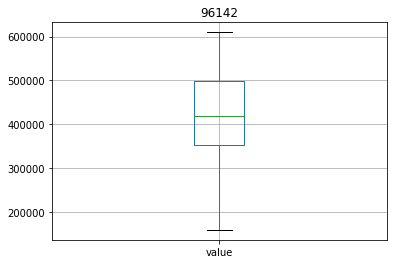

In [664]:
ts_96142.boxplot(column = 'value')
plt.title('96142');

### Plot ACF and PACF for ts dataframe

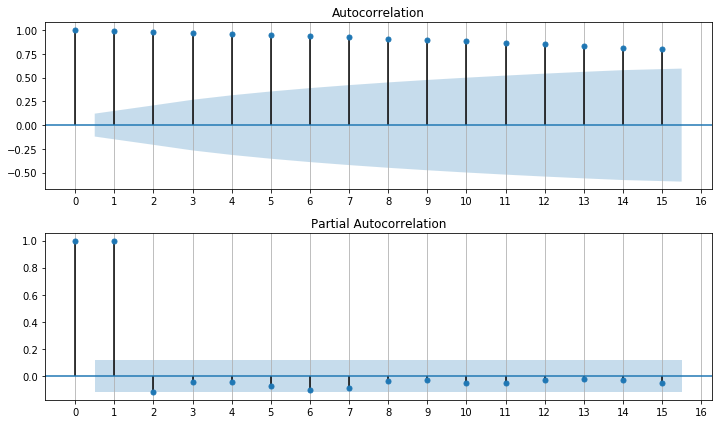

In [665]:
# plot_acf_pacf(ts, figsize=(10,6), lags=15)  # note that ts must only contain values and time as index

plot_acf_pacf(ts_96142_values, figsize=(10,6), lags=15)

### Plot seasonal decomposition for ts dataframe

(<Figure size 1296x432 with 1 Axes>,
 <matplotlib.axes._subplots.AxesSubplot at 0x1cc2beadd8>)

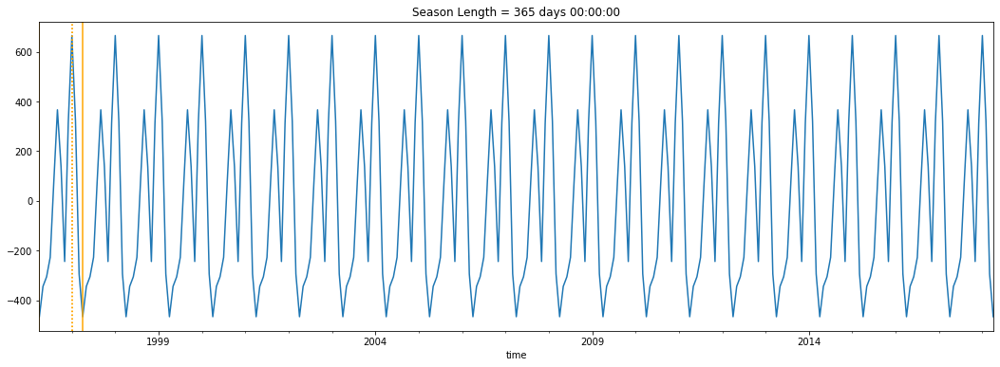

In [666]:
# plot_seasonal_decomp(ts)

plot_seasonal_decomp(ts_96142_values)

# Seasonality does not appear to be a significant factor in this zip code.

## ARIMA model parameters and optimization

### Generate list of (p,d,q) and (p,d,q,m) values

In [667]:
p_values = [0, 1, 2, 4, 6, 8]
d_values = range(0, 3)
q_values = range(0, 3)
warnings.filterwarnings("ignore")

### Run ARIMA model on ts dataframe with list of p,d,q values 

In [668]:
# eval_arima_models(ts, p_values, d_values, q_values)  # don't run this until you have some time, since it take time
# note that ts must only contain values and time as index

# eval_arima_models(ts_96142_values, p_values, d_values, q_values)  # don't run this until you have some time, since it takes time


### Generate model fit summary

In [1214]:
# model_fit = arima_zipcode(ts, order = None)   # change order = tuple to correspond to the best MSE produced by previous function

# Best ARIMA(6, 1, 2) MSE=10423029.066

model_fit_96142 = arima_zipcode(ts_96142_values, order = (6,1,2))


                             ARIMA Model Results                              
Dep. Variable:                    D.y   No. Observations:                  264
Model:                 ARIMA(6, 1, 2)   Log Likelihood               -2369.849
Method:                       css-mle   S.D. of innovations           1872.830
Date:                Tue, 10 Mar 2020   AIC                           4759.697
Time:                        22:22:18   BIC                           4795.457
Sample:                             1   HQIC                          4774.066
                                                                              
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const       1381.0622   1108.155      1.246      0.214    -790.881    3553.005
ar.L1.D.y      0.1086      0.062      1.752      0.081      -0.013       0.230
ar.L2.D.y      0.0833      0.063      1.331      0.1

## ARIMA modeling results:  predictions and visualization

### Produce forecasts from ARIMA model fit

In [1215]:
actual_forecast_96142, std_error_96142, forecast_confint_96142 = forecast(model_fit_96142)

In [1216]:
actual_forecast_96142, std_error_96142, forecast_confint_96142

(array([521967.79619792, 521049.13980544, 525838.43322981, 531857.97457127,
        536339.19704732, 538767.87490465, 540599.45657796, 543190.87559637,
        546256.04563214, 549007.56339827, 551257.91892579, 553270.10418003,
        555320.14756452, 557430.37892917, 559468.65103218, 561366.84396847,
        563167.45229217, 564933.14882976, 566682.6304696 , 568398.17460675,
        570065.37767339, 571690.52876941, 573288.39583597, 574866.84098686]),
 array([ 1872.83007801,  5554.63985296,  9431.84191668, 12519.47325432,
        15370.46358042, 18290.82863091, 21412.67357874, 24617.68497431,
        27761.76733089, 30805.24728348, 33796.47918644, 36759.54071413,
        39686.17692248, 42554.57737314, 45356.07300455, 48094.90031897,
        50777.47858473, 53404.71738336, 55974.88161868, 58487.38907644,
        60944.03627646, 63347.35514216, 65699.28826669, 68001.14417863]),
 array([[518297.11669586, 525638.47569998],
        [510162.24574656, 531936.03386433],
        [507352.3627

### Create dataframe to hold forecast results

In [1217]:
# df_forecast = forecast_df(col = 'time', daterange = pd.date_range(start='2018-05-01', end='2020-04-01', freq='MS'), 
#                 actual_forecast=actual_forecast, forecast_confint = forecast_confint)

df_forecast_96142 = forecast_df(actual_forecast_96142, forecast_confint_96142, col = 'time', daterange = pd.date_range(start='2018-05-01', end='2020-04-01', freq='MS'))


### Create new dataframe concatenating historic values and forecast results

In [1218]:
# df_new = concat_values_forecast(ts, df_forecast)

df_new_96142 = concat_values_forecast(ts_96142_values, df_forecast_96142)

In [1219]:
df_new_96142

,value,forecast,forecast_lower,forecast_upper
time,,,,
1996-04-01,159000.0,NaN,NaN,NaN
1996-05-01,158900.0,NaN,NaN,NaN
1996-06-01,158900.0,NaN,NaN,NaN
1996-07-01,158900.0,NaN,NaN,NaN
1996-08-01,158900.0,NaN,NaN,NaN
1996-09-01,158800.0,NaN,NaN,NaN
1996-10-01,158800.0,NaN,NaN,NaN
1996-11-01,158900.0,NaN,NaN,NaN
1996-12-01,159200.0,NaN,NaN,NaN


### Calculate predicted, lower bound, and upper bound forecasted prices

In [1220]:
forecasted_price_96142, forecasted_lower_96142, forecasted_upper_96142 = forecast_values(df_new_96142)

In [1221]:
forecasted_price_96142, forecasted_lower_96142, forecasted_upper_96142  # predicted, best-case, and worst-case prices in 2020


(574866.840986864, 441587.0474892397, 708146.6344844882)

In [1222]:
last_value_96142 = df_new_96142['value'].loc['2018-04-01']

In [1223]:
last_value_96142

523600.0

### Plot forecast with confidence intervals

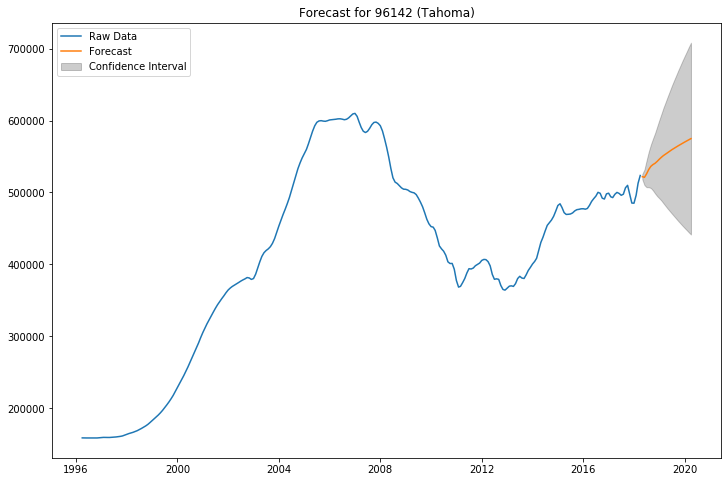

In [1224]:
# plot_forecast(df = df_new, figsize=(12,8), geog=None)

plot_forecast(df_new_96142, figsize=(12,8), geog='96142 (Tahoma)')

### Print summary of predicted, worst-case, and best-case scenarios

In [1225]:
tahoma_96142_pred, tahoma_96142_low, tahoma_96142_high = pred_best_worst(pred=forecasted_price_96142, low=forecasted_lower_96142, high=forecasted_upper_96142, last=last_value_96142, date='April 1, 2020')
tahoma_96142_pred, tahoma_96142_low, tahoma_96142_high

By the model prediction, I would expect to see a 9.791% change in price by April 1, 2020.
At the lower bound of the confidence interval, I would expect to see a -15.663% change in price by April 1, 2020.
At the upper bound of the confidence interval, I would expect to see a 35.246% change in price by April 1, 2020.


(9.791, -15.663, 35.246)

## Zip code 96142:  Potentially solid gains, with possibly large upside or downside

By the model prediction, I would expect to see a 9.791% change in price by April 1, 2020.
At the lower bound of the confidence interval, I would expect to see a -15.663% change in price by April 1, 2020.
At the upper bound of the confidence interval, I would expect to see a 35.246% change in price by April 1, 2020.


# SacMetro:  95811 (Sacramento) -- Mediocre predicted returns

In [1226]:
geog_area = '95811'

### Create dataframe containing values for just this geographic unit

In [1227]:
ts_95811 = df_sac.loc[df_sac['Zip'] == geog_area]  # ts for all of the following functions should have only one zipcode
ts_95811.head()


,Metro,MetroState,CountyName,City,Zip,SizeRank,value
time,,,,,,,
1996-04-01,Sacramento,Sacramento CA,Sacramento,Sacramento,95811,8105,119400.0
1996-05-01,Sacramento,Sacramento CA,Sacramento,Sacramento,95811,8105,119200.0
1996-06-01,Sacramento,Sacramento CA,Sacramento,Sacramento,95811,8105,119000.0
1996-07-01,Sacramento,Sacramento CA,Sacramento,Sacramento,95811,8105,118700.0
1996-08-01,Sacramento,Sacramento CA,Sacramento,Sacramento,95811,8105,118500.0


In [1228]:
# ts.head()

ts_95811.head()

,Metro,MetroState,CountyName,City,Zip,SizeRank,value
time,,,,,,,
1996-04-01,Sacramento,Sacramento CA,Sacramento,Sacramento,95811,8105,119400.0
1996-05-01,Sacramento,Sacramento CA,Sacramento,Sacramento,95811,8105,119200.0
1996-06-01,Sacramento,Sacramento CA,Sacramento,Sacramento,95811,8105,119000.0
1996-07-01,Sacramento,Sacramento CA,Sacramento,Sacramento,95811,8105,118700.0
1996-08-01,Sacramento,Sacramento CA,Sacramento,Sacramento,95811,8105,118500.0


In [1229]:
# ts = ts.value

ts_95811_values = ts_95811.value

In [1230]:
# ts.head()

ts_95811_values.head()

time
1996-04-01    119400.0
1996-05-01    119200.0
1996-06-01    119000.0
1996-07-01    118700.0
1996-08-01    118500.0
Name: value, dtype: float64

In [1231]:
ts_95811_values.tail()

time
2017-12-01    555000.0
2018-01-01    563000.0
2018-02-01    568400.0
2018-03-01    569400.0
2018-04-01    567500.0
Name: value, dtype: float64

### Visualizations

#### plot_ts:  Plot zip code(s) of interest over time, with market highs and lows

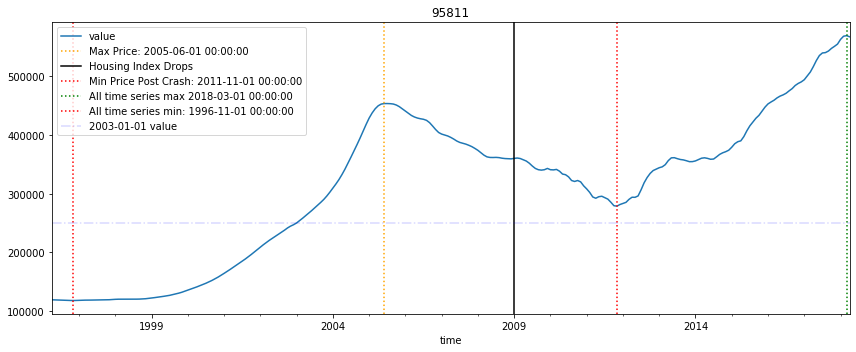

In [689]:
# fig, ax = plot_ts(df_melt, zipcodes=['95616', '92008', '90035', '90025', '60625', '57701'])  # enter desired zip code(s)

fig, ax = plot_ts_zips(df_melt, zipcodes=['95811'], figsize=(12,5))  # enter desired zip code(s)

#### Boxplot of zip code

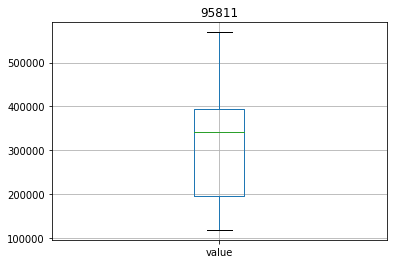

In [691]:
# # note--check for SizeRank column and drop if needed

ts_95811.boxplot(column = 'value')
plt.title('95811');


### Plot ACF and PACF for ts dataframe

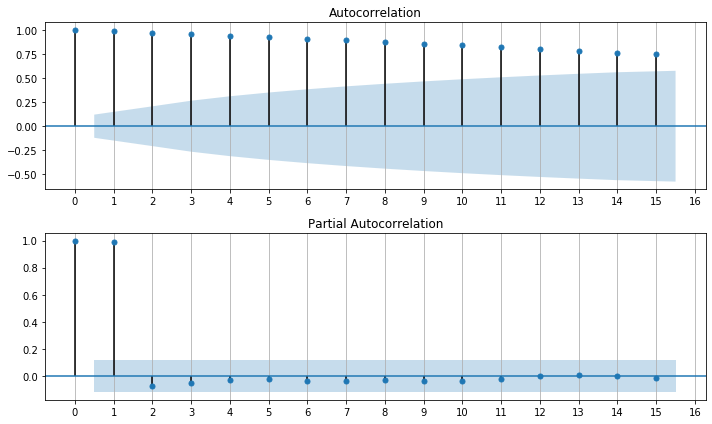

In [692]:
# plot_acf_pacf(ts, figsize=(10,6), lags=15)  # note that ts must only contain values and time as index

plot_acf_pacf(ts_95811_values, figsize=(10,6), lags=15)

### Plot seasonal decomposition for ts dataframe

(<Figure size 1296x432 with 1 Axes>,
 <matplotlib.axes._subplots.AxesSubplot at 0x1cc35411d0>)

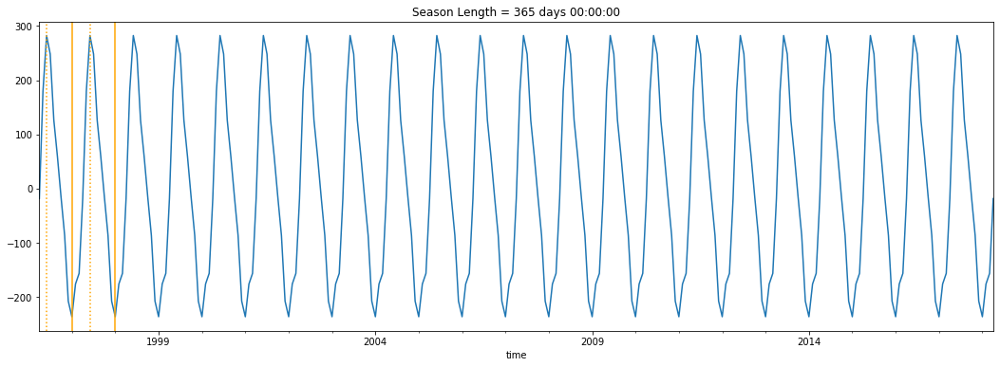

In [693]:
# plot_seasonal_decomp(ts)

plot_seasonal_decomp(ts_95811_values)

# Seasonality does not appear to be a significant factor in this zip code.

## ARIMA model parameters and optimization

### Generate list of (p,d,q) and (p,d,q,m) values

In [694]:
p_values = [0, 1, 2, 4, 6, 8]
d_values = range(0, 3)
q_values = range(0, 3)
warnings.filterwarnings("ignore")

### Run ARIMA model on ts dataframe with list of p,d,q values 

In [695]:
# eval_arima_models(ts, p_values, d_values, q_values)  # don't run this until you have some time, since it take time
# note that ts must only contain values and time as index

# eval_arima_models(ts_95811_values, p_values, d_values, q_values)  # don't run this until you have some time, since it takes time


### Generate model fit summary

In [1232]:
# model_fit = arima_zipcode(ts, order = None)   # change order = tuple to correspond to the best MSE produced by previous function

# Best ARIMA(4, 1, 2) MSE=3195605.437

model_fit_95811 = arima_zipcode(ts_95811_values, order = (4,1,2))


                             ARIMA Model Results                              
Dep. Variable:                    D.y   No. Observations:                  264
Model:                 ARIMA(4, 1, 2)   Log Likelihood               -2258.412
Method:                       css-mle   S.D. of innovations           1243.836
Date:                Tue, 10 Mar 2020   AIC                           4532.824
Time:                        22:24:49   BIC                           4561.431
Sample:                             1   HQIC                          4544.319
                                                                              
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const       1534.3385    980.138      1.565      0.119    -386.698    3455.375
ar.L1.D.y     -0.0204      0.070     -0.291      0.771      -0.158       0.117
ar.L2.D.y      0.2860      0.067      4.243      0.0

## ARIMA modeling results:  predictions and visualization

### Produce forecasts from ARIMA model fit

In [1233]:
# def forecast(model_fit, months=24, confint=2):
#     forecast = model_fit.forecast(months)
#     actual_forecast = forecast[0]
#     std_error = forecast[1]
#     forecast_confint = forecast[confint]
#     return actual_forecast, std_error, forecast_confint  

# actual_forecast, forecast_confint = forecast(model_fit, months=24, confint=2)

actual_forecast_95811, std_error_95811, forecast_confint_95811 = forecast(model_fit_95811)


In [1234]:
actual_forecast_95811, std_error_95811, forecast_confint_95811

(array([566190.07791305, 565435.53318258, 565118.32278612, 564589.29237342,
        564457.38062532, 564484.18626482, 564640.59167533, 564915.05468381,
        565342.53829026, 565866.982533  , 566490.88232482, 567206.08400664,
        568003.76407709, 568872.21698885, 569807.27223374, 570801.63757685,
        571849.28894453, 572944.92066931, 574084.05855988, 575262.2094117 ,
        576475.55701301, 577720.63642621, 578994.31604528, 580293.74898307]),
 array([ 1243.83633315,  3426.83049776,  5759.59611591,  7974.12625392,
        10412.35891005, 12946.94254623, 15504.02623841, 18079.23156073,
        20673.20810413, 23257.25889014, 25823.87331779, 28367.94182533,
        30883.09791409, 33363.97458096, 35808.20577435, 38213.46868526,
        40578.09095725, 42901.15012546, 45182.23411634, 47421.19133548,
        49618.20879737, 51773.71382179, 53888.30587307, 55962.72085597]),
 array([[563752.20349741, 568627.95232869],
        [558719.06882584, 572151.99753932],
        [553829.7218

### Create dataframe to hold forecast results

In [1235]:
# df_forecast = forecast_df(col = 'time', daterange = pd.date_range(start='2018-05-01', end='2020-04-01', freq='MS'), 
#                 actual_forecast=actual_forecast, forecast_confint = forecast_confint)

df_forecast_95811 = forecast_df(actual_forecast_95811, forecast_confint_95811, col = 'time', daterange = pd.date_range(start='2018-05-01', end='2020-04-01', freq='MS'))

### Create new dataframe concatenating historic values and forecast results

In [1236]:
# df_new = concat_values_forecast(ts, df_forecast)

df_new_95811 = concat_values_forecast(ts_95811_values, df_forecast_95811)

In [1237]:
df_new_95811

,value,forecast,forecast_lower,forecast_upper
time,,,,
1996-04-01,119400.0,NaN,NaN,NaN
1996-05-01,119200.0,NaN,NaN,NaN
1996-06-01,119000.0,NaN,NaN,NaN
1996-07-01,118700.0,NaN,NaN,NaN
1996-08-01,118500.0,NaN,NaN,NaN
1996-09-01,118300.0,NaN,NaN,NaN
1996-10-01,118200.0,NaN,NaN,NaN
1996-11-01,118100.0,NaN,NaN,NaN
1996-12-01,118300.0,NaN,NaN,NaN


### Calculate predicted, lower bound, and upper bound forecasted prices

In [1238]:
forecasted_price_95811, forecasted_lower_95811, forecasted_upper_95811 = forecast_values(df_new_95811)

In [1239]:
forecasted_price_95811, forecasted_lower_95811, forecasted_upper_95811  # predicted, best-case, and worst-case prices in 2020


(580293.7489830746, 470608.8316285142, 689978.6663376349)

In [1240]:
last_value_95811 = df_new_95811['value'].loc['2018-04-01']

In [1241]:
last_value_95811

567500.0

### Plot forecast with confidence intervals

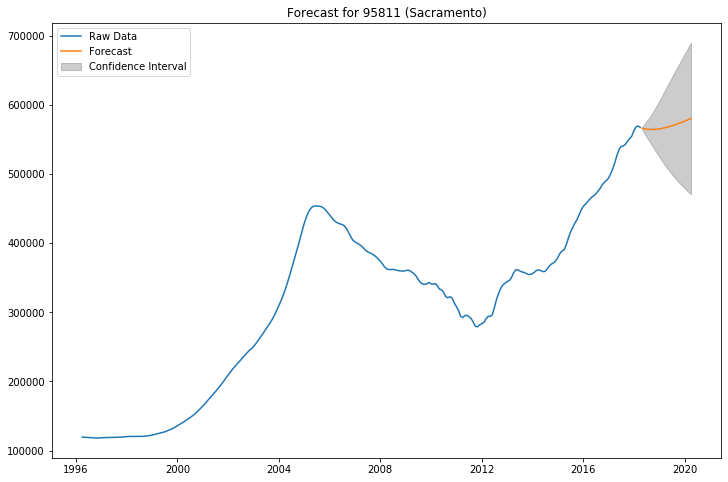

In [1242]:
# plot_forecast(df = df_new, figsize=(12,8), geog=None)

plot_forecast(df_new_95811, figsize=(12,8), geog='95811 (Sacramento)')

### Print summary of predicted, worst-case, and best-case scenarios

In [1243]:
sac_95811_pred, sac_95811_low, sac_95811_high = pred_best_worst(pred=forecasted_price_95811, low=forecasted_lower_95811, high=forecasted_upper_95811, last=last_value_95811, date='April 1, 2020')
sac_95811_pred, sac_95811_low, sac_95811_high

By the model prediction, I would expect to see a 2.254% change in price by April 1, 2020.
At the lower bound of the confidence interval, I would expect to see a -17.073% change in price by April 1, 2020.
At the upper bound of the confidence interval, I would expect to see a 21.582% change in price by April 1, 2020.


(2.254, -17.073, 21.582)

## Zip code 95811:  Don't invest--mediocre predicted returns with significant potential downside (but also significant potential upside)

By the model prediction, I would expect to see a 2.254% change in price by April 1, 2020.
At the lower bound of the confidence interval, I would expect to see a -17.073% change in price by April 1, 2020.
At the upper bound of the confidence interval, I would expect to see a 21.582% change in price by April 1, 2020.

# SacMetro:  95818 (Sacramento) -- Do not invest

In [1244]:
geog_area = '95818'

In [1245]:
ts_95818 = df_sac.loc[df_sac['Zip'] == geog_area]  # ts for all of the following functions should have only one zipcode
ts_95818.head()


,Metro,MetroState,CountyName,City,Zip,SizeRank,value
time,,,,,,,
1996-04-01,Sacramento,Sacramento CA,Sacramento,Sacramento,95818,3941,144000.0
1996-05-01,Sacramento,Sacramento CA,Sacramento,Sacramento,95818,3941,144300.0
1996-06-01,Sacramento,Sacramento CA,Sacramento,Sacramento,95818,3941,144500.0
1996-07-01,Sacramento,Sacramento CA,Sacramento,Sacramento,95818,3941,144500.0
1996-08-01,Sacramento,Sacramento CA,Sacramento,Sacramento,95818,3941,144600.0


In [1246]:
# ts.head()

ts_95818.head()

,Metro,MetroState,CountyName,City,Zip,SizeRank,value
time,,,,,,,
1996-04-01,Sacramento,Sacramento CA,Sacramento,Sacramento,95818,3941,144000.0
1996-05-01,Sacramento,Sacramento CA,Sacramento,Sacramento,95818,3941,144300.0
1996-06-01,Sacramento,Sacramento CA,Sacramento,Sacramento,95818,3941,144500.0
1996-07-01,Sacramento,Sacramento CA,Sacramento,Sacramento,95818,3941,144500.0
1996-08-01,Sacramento,Sacramento CA,Sacramento,Sacramento,95818,3941,144600.0


In [1247]:
# ts = ts.value

ts_95818_values = ts_95818.value

In [1248]:
# ts.head()

ts_95818_values.head()

time
1996-04-01    144000.0
1996-05-01    144300.0
1996-06-01    144500.0
1996-07-01    144500.0
1996-08-01    144600.0
Name: value, dtype: float64

In [1249]:
ts_95818_values.tail()

time
2017-12-01    559100.0
2018-01-01    564100.0
2018-02-01    566100.0
2018-03-01    565500.0
2018-04-01    563900.0
Name: value, dtype: float64

### Visualizations

#### plot_ts:  Plot zip code(s) of interest over time, with market highs and lows

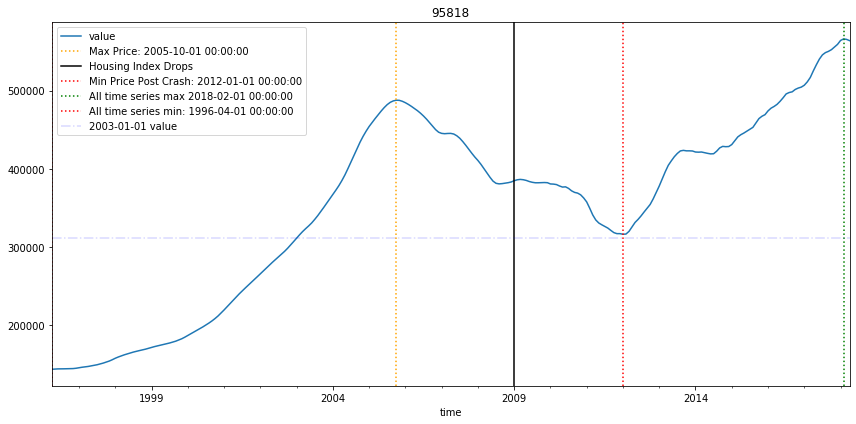

In [716]:
# fig, ax = plot_ts(df_melt, zipcodes=['95616', '92008', '90035', '90025', '60625', '57701'])  # enter desired zip code(s)

fig, ax = plot_ts_zips(df_melt, zipcodes=['95818'], figsize=(12,6))  # enter desired zip code(s)

#### Boxplot of zip code

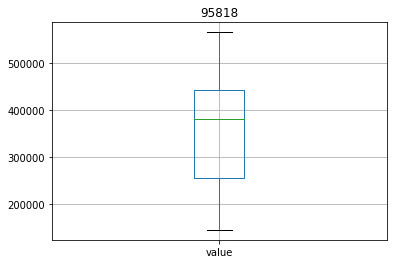

In [717]:
# # note--check for SizeRank column and drop if needed

# fig = plt.figure(figsize=(18, 30))

# for i, zc in enumerate(sac_metro_zips[:48], start=1):
#     ax = fig.add_subplot(8,6,i)
#     ts = df_sac.loc[df_sac['Zip'] == zc]
#     ts.boxplot(column = 'value', ax = ax)
#     ax.set_title(f'{zc}')
#     fig.tight_layout()

ts_95818.boxplot(column = 'value')
plt.title('95818');

### Plot ACF and PACF for ts dataframe

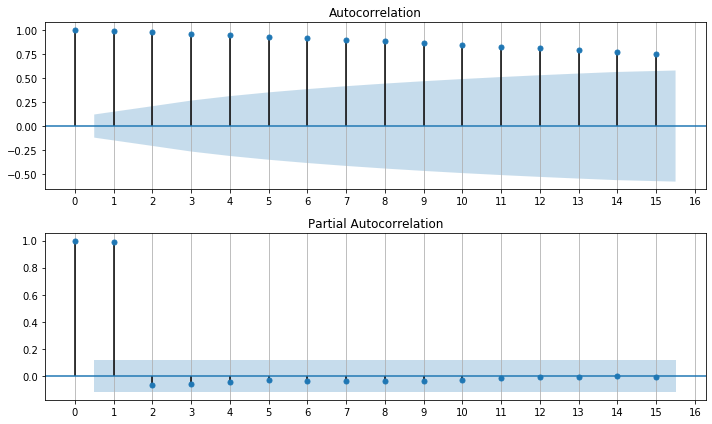

In [718]:
# plot_acf_pacf(ts, figsize=(10,6), lags=15)  # note that ts must only contain values and time as index

plot_acf_pacf(ts_95818_values, figsize=(10,6), lags=15)

### Plot seasonal decomposition for ts dataframe

(<Figure size 1296x432 with 1 Axes>,
 <matplotlib.axes._subplots.AxesSubplot at 0x1cc40c2048>)

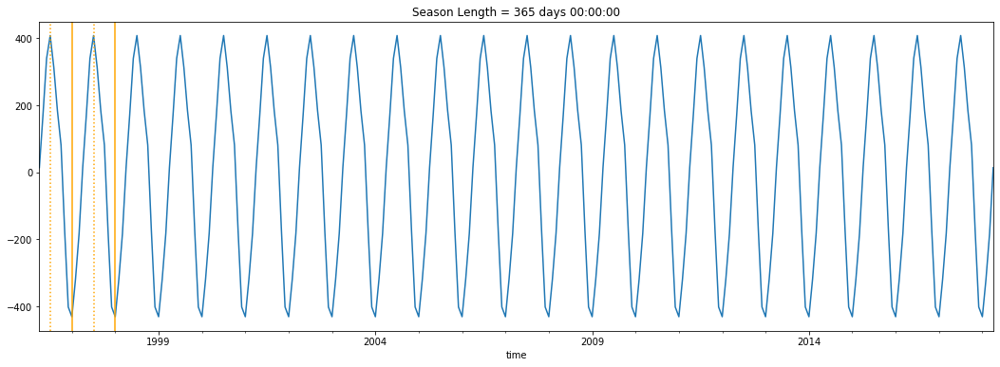

In [719]:
# plot_seasonal_decomp(ts)

plot_seasonal_decomp(ts_95818_values)

# Seasonality does not appear to be a significant factor in this zip code.

## ARIMA model parameters and optimization

### Generate list of (p,d,q) and (p,d,q,m) values

In [720]:
p_values = [0, 1, 2, 4, 6, 8]
d_values = range(0, 3)
q_values = range(0, 3)
warnings.filterwarnings("ignore")

### Run ARIMA model on ts dataframe with list of p,d,q values 

In [721]:
# eval_arima_models(ts, p_values, d_values, q_values)  # don't run this until you have some time, since it take time
# note that ts must only contain values and time as index

# eval_arima_models(ts_95818_values, p_values, d_values, q_values)  # don't run this until you have some time, since it takes time


### Generate model fit summary

In [1250]:
# model_fit = arima_zipcode(ts, order = None)   # change order = tuple to correspond to the best MSE produced by previous function

# Best ARIMA(6, 2, 2) MSE=2089095.204

model_fit_95818 = arima_zipcode(ts_95818_values, order = (6,2,2))


                             ARIMA Model Results                              
Dep. Variable:                   D2.y   No. Observations:                  263
Model:                 ARIMA(6, 2, 2)   Log Likelihood               -2135.127
Method:                       css-mle   S.D. of innovations            798.928
Date:                Tue, 10 Mar 2020   AIC                           4290.255
Time:                        22:27:30   BIC                           4325.976
Sample:                             2   HQIC                          4304.611
                                                                              
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const         -1.7133     60.933     -0.028      0.978    -121.140     117.713
ar.L1.D2.y    -1.0734      0.060    -17.791      0.000      -1.192      -0.955
ar.L2.D2.y    -0.3557      0.089     -4.008      0.0

## ARIMA modeling results:  predictions and visualization

### Produce forecasts from ARIMA model fit

In [1251]:
actual_forecast_95818, std_error_95818, forecast_confint_95818 = forecast(model_fit_95818)


In [1252]:
actual_forecast_95818, std_error_95818, forecast_confint_95818

(array([563382.30595232, 562301.60251996, 561904.3217046 , 562034.03664193,
        562046.20258916, 562052.88825408, 561792.65041341, 561802.56922834,
        561389.89581157, 561254.90778257, 560993.97039577, 560822.82330882,
        560633.49190598, 560407.9995849 , 560284.90064736, 560004.89080128,
        559874.35234603, 559607.82550606, 559445.06081214, 559208.02463597,
        559006.35529787, 558806.22941695, 558568.36659644, 558386.26823418]),
 array([  798.92751863,  2280.09997897,  4101.84191417,  6064.6172193 ,
         8273.10615941, 10573.83501693, 12958.2819509 , 15453.66698814,
        18088.32613556, 20856.25142323, 23746.07325217, 26780.19146086,
        29925.376759  , 33190.23225084, 36558.79511573, 40036.8786606 ,
        43614.94788498, 47291.90088301, 51069.53127467, 54939.01662139,
        58904.9927732 , 62958.62709326, 67103.95428575, 71334.08864087]),
 array([[561816.43678956, 564948.17511509],
        [557832.68868002, 566770.5163599 ],
        [553864.8592

### Create dataframe to hold forecast results

In [1253]:
# df_forecast = forecast_df(col = 'time', daterange = pd.date_range(start='2018-05-01', end='2020-04-01', freq='MS'), 
#                 actual_forecast=actual_forecast, forecast_confint = forecast_confint)

df_forecast_95818 = forecast_df(actual_forecast_95818, forecast_confint_95818, col = 'time', daterange = pd.date_range(start='2018-05-01', end='2020-04-01', freq='MS'))


### Create new dataframe concatenating historic values and forecast results

In [1254]:
# df_new = concat_values_forecast(ts, df_forecast)

df_new_95818 = concat_values_forecast(ts_95818_values, df_forecast_95818)

In [1255]:
df_new_95818

,value,forecast,forecast_lower,forecast_upper
time,,,,
1996-04-01,144000.0,NaN,NaN,NaN
1996-05-01,144300.0,NaN,NaN,NaN
1996-06-01,144500.0,NaN,NaN,NaN
1996-07-01,144500.0,NaN,NaN,NaN
1996-08-01,144600.0,NaN,NaN,NaN
1996-09-01,144700.0,NaN,NaN,NaN
1996-10-01,144800.0,NaN,NaN,NaN
1996-11-01,144900.0,NaN,NaN,NaN
1996-12-01,145300.0,NaN,NaN,NaN


### Calculate predicted, lower bound, and upper bound forecasted prices

In [1256]:
forecasted_price_95818, forecasted_lower_95818, forecasted_upper_95818 = forecast_values(df_new_95818)

In [1257]:
forecasted_price_95818, forecasted_lower_95818, forecasted_upper_95818  # predicted, best-case, and worst-case prices in 2020


(558386.2682341816, 418574.0236280792, 698198.5128402839)

In [1258]:
last_value_95818 = df_new_95818['value'].loc['2018-04-01']

In [1259]:
last_value_95818

563900.0

### Plot forecast with confidence intervals

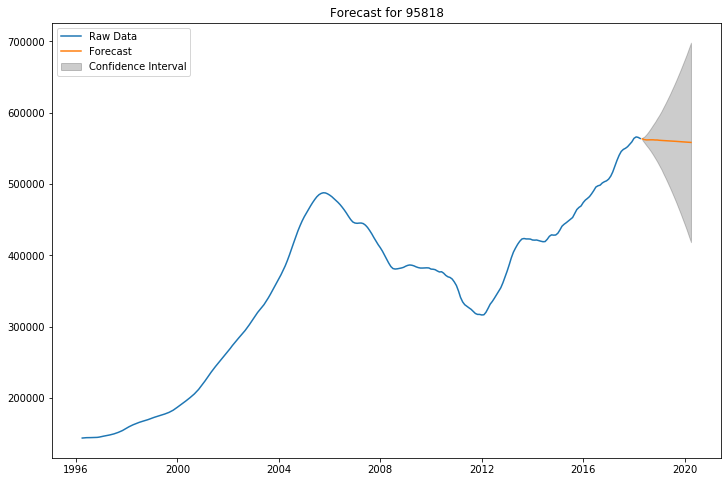

In [1260]:
# plot_forecast(df = df_new, figsize=(12,8), geog=None)

plot_forecast(df_new_95818, figsize=(12,8), geog='95818')

### Print summary of predicted, worst-case, and best-case scenarios

In [1261]:
sac_95818_pred, sac_95818_low, sac_95818_high = pred_best_worst(pred=forecasted_price_95818, low=forecasted_lower_95818, 
                                                                high=forecasted_upper_95818, last=last_value_95818, 
                                                                date='April 1, 2020')
sac_95818_pred, sac_95818_low, sac_95818_high

By the model prediction, I would expect to see a -0.978% change in price by April 1, 2020.
At the lower bound of the confidence interval, I would expect to see a -25.772% change in price by April 1, 2020.
At the upper bound of the confidence interval, I would expect to see a 23.816% change in price by April 1, 2020.


(-0.978, -25.772, 23.816)

## Zip code 95818:  Do not invest--negative predicted return

By the model prediction, I would expect to see a -0.978% change in price by April 1, 2020
At the lower bound of the confidence interval, I would expect to see a -25.772% change in price by April 1, 2020
At the upper bound of the confidence interval, I would expect to see a 23.816% change in price by April 1, 2020


# SacMetro:  95630 (Folsom)--Mediocre predicted returns 

In [1262]:
geog_area = '95630'

In [1264]:
ts_95630 = df_sac.loc[df_sac['Zip'] == geog_area]  # ts for all of the following functions should have only one zipcode
ts_95630.head()


,Metro,MetroState,CountyName,City,Zip,SizeRank,value
time,,,,,,,
1996-04-01,Sacramento,Sacramento CA,Sacramento,Folsom,95630,94,190000.0
1996-05-01,Sacramento,Sacramento CA,Sacramento,Folsom,95630,94,189300.0
1996-06-01,Sacramento,Sacramento CA,Sacramento,Folsom,95630,94,188500.0
1996-07-01,Sacramento,Sacramento CA,Sacramento,Folsom,95630,94,187800.0
1996-08-01,Sacramento,Sacramento CA,Sacramento,Folsom,95630,94,187300.0


In [1265]:
# ts.head()

ts_95630.head()

,Metro,MetroState,CountyName,City,Zip,SizeRank,value
time,,,,,,,
1996-04-01,Sacramento,Sacramento CA,Sacramento,Folsom,95630,94,190000.0
1996-05-01,Sacramento,Sacramento CA,Sacramento,Folsom,95630,94,189300.0
1996-06-01,Sacramento,Sacramento CA,Sacramento,Folsom,95630,94,188500.0
1996-07-01,Sacramento,Sacramento CA,Sacramento,Folsom,95630,94,187800.0
1996-08-01,Sacramento,Sacramento CA,Sacramento,Folsom,95630,94,187300.0


In [1266]:
# ts = ts.value

ts_95630_values = ts_95630.value

In [1267]:
# ts.head()

ts_95630_values.head()

time
1996-04-01    190000.0
1996-05-01    189300.0
1996-06-01    188500.0
1996-07-01    187800.0
1996-08-01    187300.0
Name: value, dtype: float64

In [1268]:
ts_95630_values.tail()

time
2017-12-01    537200.0
2018-01-01    542400.0
2018-02-01    544600.0
2018-03-01    544100.0
2018-04-01    542900.0
Name: value, dtype: float64

### Visualizations

#### plot_ts:  Plot zip code(s) of interest over time, with market highs and lows

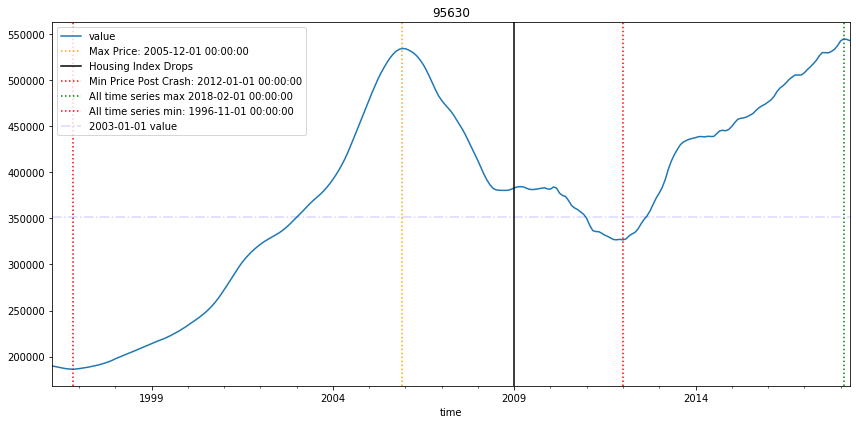

In [741]:
# fig, ax = plot_ts(df_melt, zipcodes=['95616', '92008', '90035', '90025', '60625', '57701'])  # enter desired zip code(s)

fig, ax = plot_ts_zips(df_melt, zipcodes=['95630'], figsize=(12,6))  # enter desired zip code(s)

In [743]:
ts_95630.head(3)

,Metro,MetroState,CountyName,City,Zip,SizeRank,value
time,,,,,,,
1996-04-01,Sacramento,Sacramento CA,Sacramento,Folsom,95630,94,190000.0
1996-05-01,Sacramento,Sacramento CA,Sacramento,Folsom,95630,94,189300.0
1996-06-01,Sacramento,Sacramento CA,Sacramento,Folsom,95630,94,188500.0


#### Boxplot of zip code

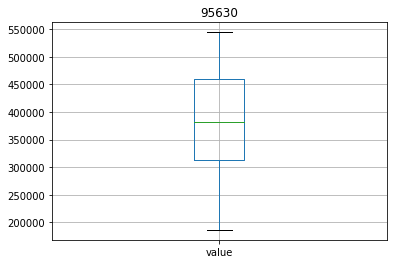

In [744]:
ts_95630.boxplot(column = 'value')
plt.title('95630');


### Plot ACF and PACF for ts dataframe

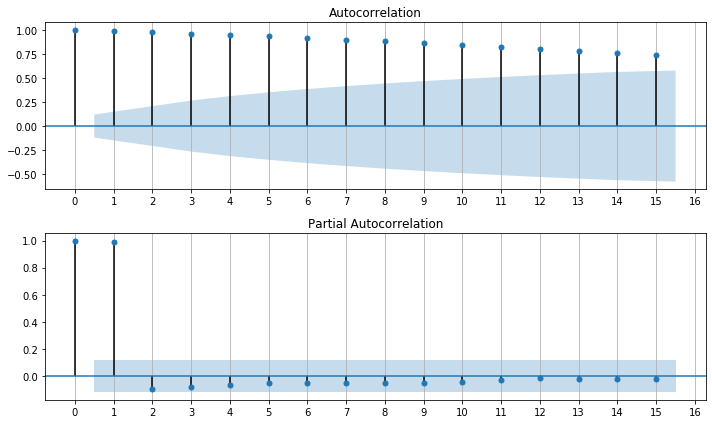

In [745]:
# plot_acf_pacf(ts, figsize=(10,6), lags=15)  # note that ts must only contain values and time as index

plot_acf_pacf(ts_95630_values, figsize=(10,6), lags=15)

### Plot seasonal decomposition for ts dataframe

(<Figure size 1296x432 with 1 Axes>,
 <matplotlib.axes._subplots.AxesSubplot at 0x1cc4a7d940>)

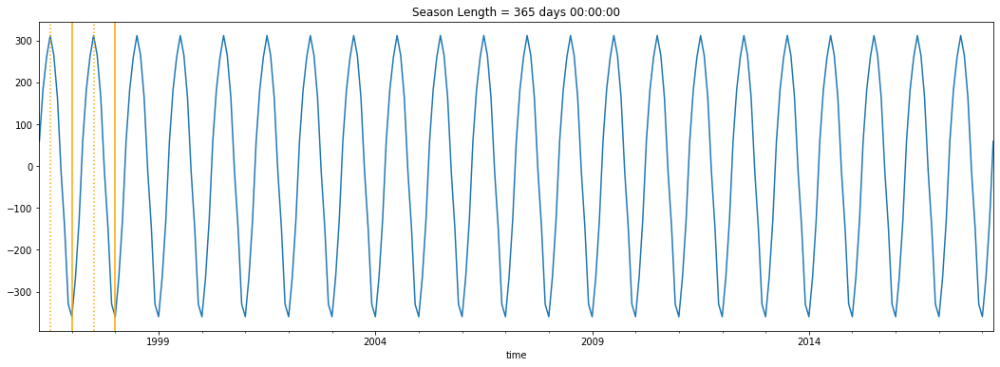

In [746]:
# plot_seasonal_decomp(ts)

plot_seasonal_decomp(ts_95630_values)

# Seasonality does not appear to be a significant factor in this zip code.

## ARIMA model parameters and optimization

### Generate list of (p,d,q) and (p,d,q,m) values

In [747]:
p_values = [0, 1, 2, 4, 6, 8]
d_values = range(0, 3)
q_values = range(0, 3)
warnings.filterwarnings("ignore")

### Run ARIMA model on ts dataframe with list of p,d,q values 

In [748]:
# eval_arima_models(ts, p_values, d_values, q_values)  # don't run this until you have some time, since it take time
# note that ts must only contain values and time as index

# eval_arima_models(ts_95630_values, p_values, d_values, q_values)  # don't run this until you have some time, since it takes time


### Generate model fit summary

In [1269]:
# model_fit = arima_zipcode(ts, order = None)   # change order = tuple to correspond to the best MSE produced by previous function

# Best ARIMA(2, 2, 0) MSE=1373937.757

model_fit_95630 = arima_zipcode(ts_95630_values, order = (2,2,0))


                             ARIMA Model Results                              
Dep. Variable:                   D2.y   No. Observations:                  263
Model:                 ARIMA(2, 2, 0)   Log Likelihood               -2168.670
Method:                       css-mle   S.D. of innovations            921.281
Date:                Tue, 10 Mar 2020   AIC                           4345.340
Time:                        22:29:58   BIC                           4359.628
Sample:                             2   HQIC                          4351.082
                                                                              
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const          2.8349     51.365      0.055      0.956     -97.839     103.508
ar.L1.D2.y     0.3846      0.054      7.165      0.000       0.279       0.490
ar.L2.D2.y    -0.4929      0.054     -9.124      0.0

## ARIMA modeling results:  predictions and visualization

### Produce forecasts from ARIMA model fit

In [1270]:
# actual_forecast, forecast_confint = forecast(model_fit, months=24, confint=2)

actual_forecast_95630, std_error_95630, forecast_confint_95630 = forecast(model_fit_95630)


In [1271]:
actual_forecast_95630, std_error_95630, forecast_confint_95630

(array([542764.67898457, 543386.92768855, 543778.90543505, 543712.09745596,
        543585.49563585, 543665.15936051, 543856.7550734 , 543992.87632339,
        544055.63980188, 544120.67649767, 544225.88449693, 544348.56206964,
        544461.30072461, 544564.74924187, 544672.66568037, 544790.0209815 ,
        544911.94592764, 545034.11806591, 545157.27503125, 545283.83085044,
        545414.35029289, 545547.86076322, 545683.70989455, 545822.12617146]),
 array([  921.28144523,  2382.20150553,  3953.00904559,  5494.01988909,
         7113.69551196,  8922.00666071, 10917.81674448, 13043.08295262,
        15266.82898892, 17595.01485682, 20037.44418278, 22590.00201141,
        25242.01863065, 27987.11998569, 30824.01018466, 33751.75415954,
        36767.53818404, 39867.93008531, 43050.3634855 , 46313.09176956,
        49654.4541814 , 53072.59529956, 56565.6836542 , 60132.11198161]),
 array([[540959.0005323 , 544570.35743684],
        [538717.8985338 , 548055.95684331],
        [536031.1500

### Create dataframe to hold forecast results

In [1272]:
# df_forecast = forecast_df(col = 'time', daterange = pd.date_range(start='2018-05-01', end='2020-04-01', freq='MS'), 
#                 actual_forecast=actual_forecast, forecast_confint = forecast_confint)

df_forecast_95630 = forecast_df(actual_forecast_95630, forecast_confint_95630, col = 'time', daterange = pd.date_range(start='2018-05-01', end='2020-04-01', freq='MS'))


### Create new dataframe concatenating historic values and forecast results

In [1273]:
# df_new = concat_values_forecast(ts, df_forecast)

df_new_95630 = concat_values_forecast(ts_95630_values, df_forecast_95630)

In [1274]:
df_new_95630

,value,forecast,forecast_lower,forecast_upper
time,,,,
1996-04-01,190000.0,NaN,NaN,NaN
1996-05-01,189300.0,NaN,NaN,NaN
1996-06-01,188500.0,NaN,NaN,NaN
1996-07-01,187800.0,NaN,NaN,NaN
1996-08-01,187300.0,NaN,NaN,NaN
1996-09-01,186800.0,NaN,NaN,NaN
1996-10-01,186500.0,NaN,NaN,NaN
1996-11-01,186300.0,NaN,NaN,NaN
1996-12-01,186600.0,NaN,NaN,NaN


### Calculate predicted, lower bound, and upper bound forecasted prices

In [1275]:
forecasted_price_95630, forecasted_lower_95630, forecasted_upper_95630 = forecast_values(df_new_95630)

In [1276]:
forecasted_price_95630, forecasted_lower_95630, forecasted_upper_95630  # predicted, best-case, and worst-case prices in 2020


(545822.1261714601, 427965.35237318143, 663678.8999697389)

In [1277]:
last_value_95630 = df_new_95630['value'].loc['2018-04-01']

In [1278]:
last_value_95630

542900.0

### Plot forecast with confidence intervals

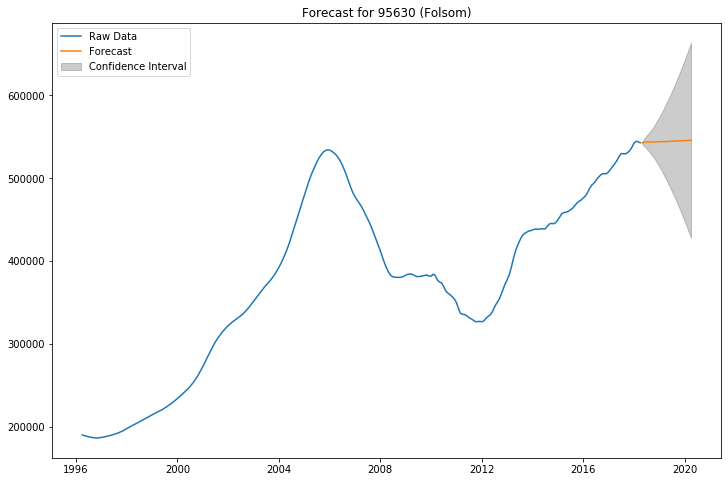

In [1279]:
# plot_forecast(df = df_new, figsize=(12,8), geog=None)

plot_forecast(df_new_95630, figsize=(12,8), geog='95630 (Folsom)')

### Print summary of predicted, worst-case, and best-case scenarios

In [1280]:
folsom_95630_pred, folsom_95630_low, folsom_95630_high = pred_best_worst(pred=forecasted_price_95630, low=forecasted_lower_95630, 
                                                                         high=forecasted_upper_95630, last=last_value_95630, date='April 1, 2020')
folsom_95630_pred, folsom_95630_low, folsom_95630_high

By the model prediction, I would expect to see a 0.538% change in price by April 1, 2020.
At the lower bound of the confidence interval, I would expect to see a -21.171% change in price by April 1, 2020.
At the upper bound of the confidence interval, I would expect to see a 22.247% change in price by April 1, 2020.


(0.538, -21.171, 22.247)

## Zip code 95630:  Mediocre earning potential, significant downside risk (but equally possible upside risk)

By the model prediction, I would expect to see a 0.538% change in price by April 1, 2020.
At the lower bound of the confidence interval, I would expect to see a -21.171% change in price by April 1, 2020. 
At the upper bound of the confidence interval, I would expect to see a 22.247% change in price by April 1, 2020. 


# SacMetro:  96140 (Carnelian Bay) -- Definite investment opportunity¶

In [1281]:
geog_area = '96140'

In [1283]:
ts_96140 = df_sac.loc[df_sac['Zip'] == geog_area]  # ts for all of the following functions should have only one zipcode
ts_96140.head()


,Metro,MetroState,CountyName,City,Zip,SizeRank,value
time,,,,,,,
1996-04-01,Sacramento,Sacramento CA,Placer,Carnelian Bay,96140,13960,179100.0
1996-05-01,Sacramento,Sacramento CA,Placer,Carnelian Bay,96140,13960,179000.0
1996-06-01,Sacramento,Sacramento CA,Placer,Carnelian Bay,96140,13960,179000.0
1996-07-01,Sacramento,Sacramento CA,Placer,Carnelian Bay,96140,13960,178900.0
1996-08-01,Sacramento,Sacramento CA,Placer,Carnelian Bay,96140,13960,178900.0


In [1284]:
# ts.head()

ts_96140.head()

,Metro,MetroState,CountyName,City,Zip,SizeRank,value
time,,,,,,,
1996-04-01,Sacramento,Sacramento CA,Placer,Carnelian Bay,96140,13960,179100.0
1996-05-01,Sacramento,Sacramento CA,Placer,Carnelian Bay,96140,13960,179000.0
1996-06-01,Sacramento,Sacramento CA,Placer,Carnelian Bay,96140,13960,179000.0
1996-07-01,Sacramento,Sacramento CA,Placer,Carnelian Bay,96140,13960,178900.0
1996-08-01,Sacramento,Sacramento CA,Placer,Carnelian Bay,96140,13960,178900.0


In [1285]:
# ts = ts.value

ts_96140_values = ts_96140.value

In [1286]:
# ts.head()

ts_96140_values.head()

time
1996-04-01    179100.0
1996-05-01    179000.0
1996-06-01    179000.0
1996-07-01    178900.0
1996-08-01    178900.0
Name: value, dtype: float64

In [1287]:
ts_96140_values.tail()

time
2017-12-01    622400.0
2018-01-01    625000.0
2018-02-01    631500.0
2018-03-01    639400.0
2018-04-01    644600.0
Name: value, dtype: float64

### Visualizations

#### plot_ts:  Plot zip code(s) of interest over time, with market highs and lows

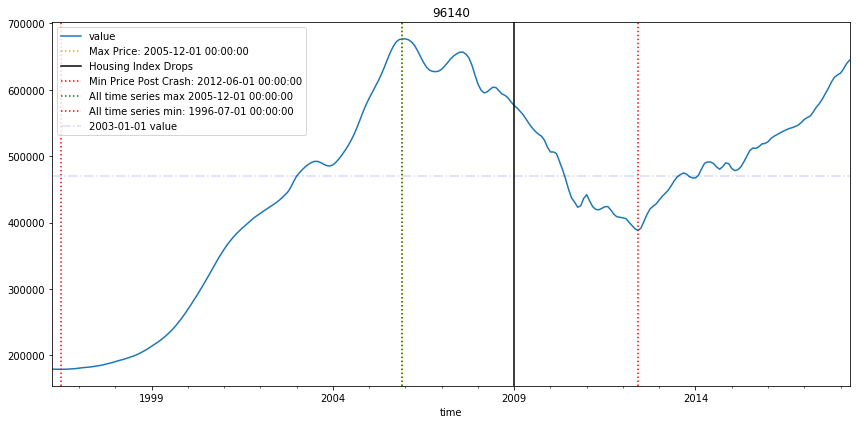

In [767]:
# fig, ax = plot_ts(df_melt, zipcodes=['95616', '92008', '90035', '90025', '60625', '57701'])  # enter desired zip code(s)

fig, ax = plot_ts_zips(df_melt, zipcodes=['96140'], figsize=(12,6))  # enter desired zip code(s)

In [769]:
ts_96140.head(3)

,Metro,MetroState,CountyName,City,Zip,SizeRank,value
time,,,,,,,
1996-04-01,Sacramento,Sacramento CA,Placer,Carnelian Bay,96140,13960,179100.0
1996-05-01,Sacramento,Sacramento CA,Placer,Carnelian Bay,96140,13960,179000.0
1996-06-01,Sacramento,Sacramento CA,Placer,Carnelian Bay,96140,13960,179000.0


#### Boxplot of zip code

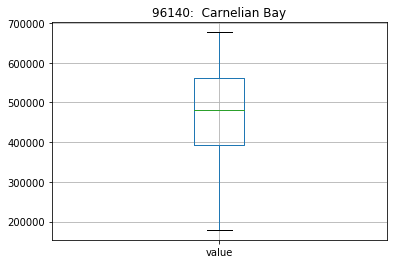

In [771]:
ts_96140.boxplot(column = 'value')
plt.title('96140:  Carnelian Bay');


### Plot ACF and PACF for ts dataframe

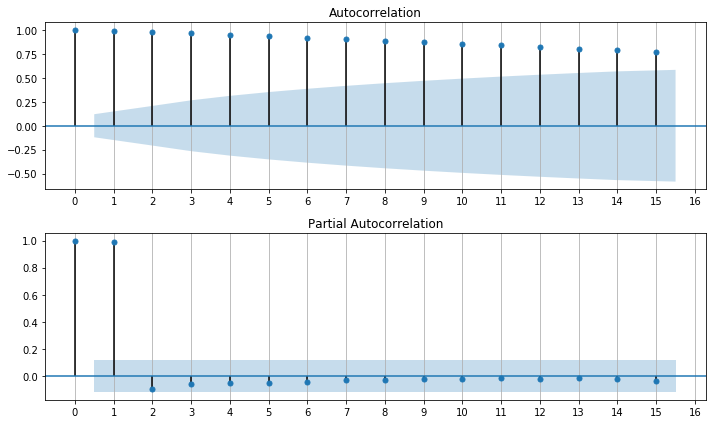

In [772]:
# plot_acf_pacf(ts, figsize=(10,6), lags=15)  # note that ts must only contain values and time as index

plot_acf_pacf(ts_96140_values, figsize=(10,6), lags=15)

### Plot seasonal decomposition for ts dataframe

(<Figure size 1296x432 with 1 Axes>,
 <matplotlib.axes._subplots.AxesSubplot at 0x1cc53ffeb8>)

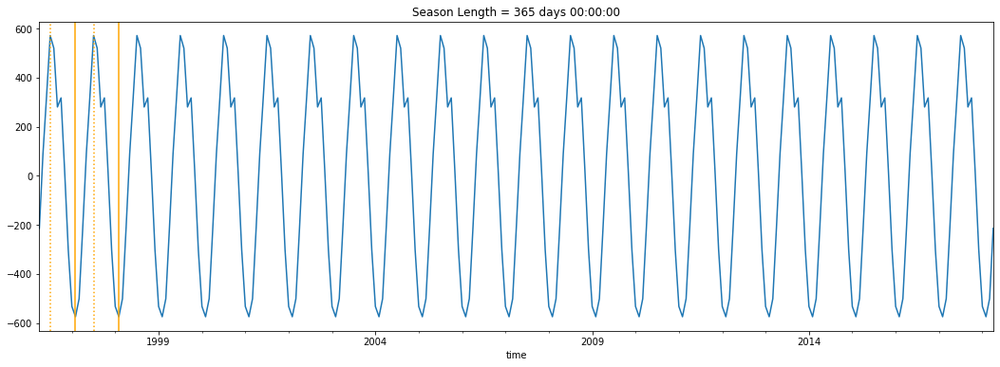

In [773]:
# plot_seasonal_decomp(ts)

plot_seasonal_decomp(ts_96140_values)

# Seasonality does not appear to be a significant factor in this zip code.

## ARIMA model parameters and optimization

### Generate list of (p,d,q) and (p,d,q,m) values

In [775]:
p_values = [0, 1, 2, 4, 6, 8]
d_values = range(0, 3)
q_values = range(0, 3)
warnings.filterwarnings("ignore")

### Run ARIMA model on ts dataframe with list of p,d,q values 

In [776]:
# eval_arima_models(ts, p_values, d_values, q_values)  # don't run this until you have some time, since it take time
# note that ts must only contain values and time as index

# eval_arima_models(ts_96140_values, p_values, d_values, q_values)  # don't run this until you have some time, since it takes time


### Generate model fit summary

In [1288]:
# model_fit = arima_zipcode(ts, order = None)   # change order = tuple to correspond to the best MSE produced by previous function

# Best ARIMA(4, 2, 1) MSE=3386317.647

model_fit_96140 = arima_zipcode(ts_96140_values, order = (4,2,1))


                             ARIMA Model Results                              
Dep. Variable:                   D2.y   No. Observations:                  263
Model:                 ARIMA(4, 2, 1)   Log Likelihood               -2375.535
Method:                       css-mle   S.D. of innovations           2021.246
Date:                Tue, 10 Mar 2020   AIC                           4765.071
Time:                        22:32:51   BIC                           4790.076
Sample:                             2   HQIC                          4775.120
                                                                              
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const         20.1520    104.724      0.192      0.848    -185.103     225.407
ar.L1.D2.y     0.9100      0.152      5.981      0.000       0.612       1.208
ar.L2.D2.y    -0.8496      0.108     -7.888      0.0

## ARIMA modeling results:  predictions and visualization

### Produce forecasts from ARIMA model fit

In [1289]:
actual_forecast_96140, std_error_96140, forecast_confint_96140 = forecast(model_fit_96140)

In [1290]:
actual_forecast_96140, std_error_96140, forecast_confint_96140

(array([648805.85825432, 653757.53047996, 658570.5323666 , 663085.9205481 ,
        668129.42124978, 673613.74237267, 678978.96063667, 684213.98234732,
        689471.96996441, 694678.55992772, 699816.1903089 , 705004.67382777,
        710283.81863351, 715604.75202823, 720948.92095822, 726319.24815545,
        731698.98739706, 737078.23269305, 742469.65046207, 747884.67828643,
        753324.0437325 , 758787.67018129, 764275.82806768, 769785.37238711]),
 array([  2021.24598845,   5622.17509084,   9655.22803129,  13738.77436637,
         17905.22528362,  22063.83320832,  26192.54172298,  30459.47931574,
         35013.71197477,  39877.62230576,  45024.70986922,  50423.95933807,
         56028.64400627,  61797.74762825,  67720.80777663,  73805.66990548,
         80059.7648204 ,  86487.01822255,  93087.70107906,  99856.33441153,
        106784.07083058, 113863.39953136, 121089.5971114 , 128459.83827426]),
 array([[ 644844.28891307,  652767.42759557],
        [ 642738.26978713,  664776.791

### Create dataframe to hold forecast results

In [1291]:
# df_forecast = forecast_df(col = 'time', daterange = pd.date_range(start='2018-05-01', end='2020-04-01', freq='MS'), 
#                 actual_forecast=actual_forecast, forecast_confint = forecast_confint)

df_forecast_96140 = forecast_df(actual_forecast_96140, forecast_confint_96140, col = 'time', daterange = pd.date_range(start='2018-05-01', end='2020-04-01', freq='MS'))


### Create new dataframe concatenating historic values and forecast results

In [1292]:
# df_new = concat_values_forecast(ts, df_forecast)

df_new_96140 = concat_values_forecast(ts_96140_values, df_forecast_96140)

In [1293]:
df_new_96140

,value,forecast,forecast_lower,forecast_upper
time,,,,
1996-04-01,179100.0,NaN,NaN,NaN
1996-05-01,179000.0,NaN,NaN,NaN
1996-06-01,179000.0,NaN,NaN,NaN
1996-07-01,178900.0,NaN,NaN,NaN
1996-08-01,178900.0,NaN,NaN,NaN
1996-09-01,179000.0,NaN,NaN,NaN
1996-10-01,179300.0,NaN,NaN,NaN
1996-11-01,179600.0,NaN,NaN,NaN
1996-12-01,180000.0,NaN,NaN,NaN


### Calculate predicted, lower bound, and upper bound forecasted prices

In [1294]:
forecasted_price_96140, forecasted_lower_96140, forecasted_upper_96140 = forecast_values(df_new_96140)

In [1295]:
forecasted_price_96140, forecasted_lower_96140, forecasted_upper_96140  # predicted, best-case, and worst-case prices in 2020


(769785.3723871063, 518008.71590971446, 1021562.0288644981)

In [1296]:
last_value_96140 = df_new_96140['value'].loc['2018-04-01']

In [1297]:
last_value_96140

644600.0

### Plot forecast with confidence intervals

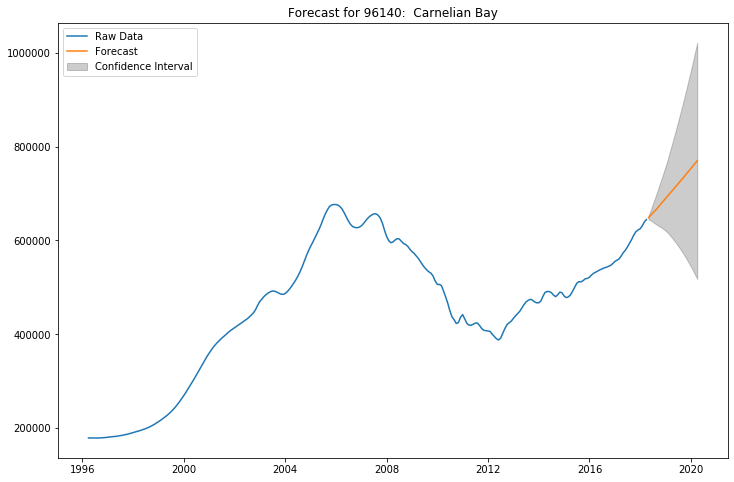

In [1298]:
# plot_forecast(df = df_new, figsize=(12,8), geog=None)

plot_forecast(df_new_96140, figsize=(12,8), geog='96140:  Carnelian Bay')

### Print summary of predicted, worst-case, and best-case scenarios

In [1299]:
cb_96140_pred, cb_96140_low, cb_96140_high = pred_best_worst(pred=forecasted_price_96140, low=forecasted_lower_96140, high=forecasted_upper_96140, last=last_value_96140, date='April 1, 2020')
cb_96140_pred, cb_96140_low, cb_96140_high

By the model prediction, I would expect to see a 19.421% change in price by April 1, 2020.
At the lower bound of the confidence interval, I would expect to see a -19.639% change in price by April 1, 2020.
At the upper bound of the confidence interval, I would expect to see a 58.48% change in price by April 1, 2020.


(19.421, -19.639, 58.48)

## Zip code 96140:  Definite investment opportunity with potentially large upside returns

By the model prediction, I would expect to see a 19.421% change in price by April 1, 2020
At the lower bound of the confidence interval, I would expect to see a -19.639% change in price by April 1, 2020
At the upper bound of the confidence interval, I would expect to see a 58.48% change in price by April 1, 2020


# SacMetro:  95672 (Rescue) -- Solid investment opportunity 

In [1300]:
geog_area = '95672'

In [1301]:
ts_95672 = df_sac.loc[df_sac['Zip'] == geog_area]  # ts for all of the following functions should have only one zipcode
ts_95672.head()


,Metro,MetroState,CountyName,City,Zip,SizeRank,value
time,,,,,,,
1996-04-01,Sacramento,Sacramento CA,El Dorado,Rescue,95672,11257,196500.0
1996-05-01,Sacramento,Sacramento CA,El Dorado,Rescue,95672,11257,196600.0
1996-06-01,Sacramento,Sacramento CA,El Dorado,Rescue,95672,11257,196700.0
1996-07-01,Sacramento,Sacramento CA,El Dorado,Rescue,95672,11257,196900.0
1996-08-01,Sacramento,Sacramento CA,El Dorado,Rescue,95672,11257,197000.0


In [1302]:
# ts.head()

ts_95672.head()

,Metro,MetroState,CountyName,City,Zip,SizeRank,value
time,,,,,,,
1996-04-01,Sacramento,Sacramento CA,El Dorado,Rescue,95672,11257,196500.0
1996-05-01,Sacramento,Sacramento CA,El Dorado,Rescue,95672,11257,196600.0
1996-06-01,Sacramento,Sacramento CA,El Dorado,Rescue,95672,11257,196700.0
1996-07-01,Sacramento,Sacramento CA,El Dorado,Rescue,95672,11257,196900.0
1996-08-01,Sacramento,Sacramento CA,El Dorado,Rescue,95672,11257,197000.0


In [1303]:
# ts = ts.value

ts_95672_values = ts_95672.value

In [1304]:
# ts.head()

ts_95672_values.head()

time
1996-04-01    196500.0
1996-05-01    196600.0
1996-06-01    196700.0
1996-07-01    196900.0
1996-08-01    197000.0
Name: value, dtype: float64

In [1305]:
ts_95672_values.tail()

time
2017-12-01    542100.0
2018-01-01    548700.0
2018-02-01    557900.0
2018-03-01    570200.0
2018-04-01    579300.0
Name: value, dtype: float64

### Visualizations

#### plot_ts:  Plot zip code(s) of interest over time, with market highs and lows

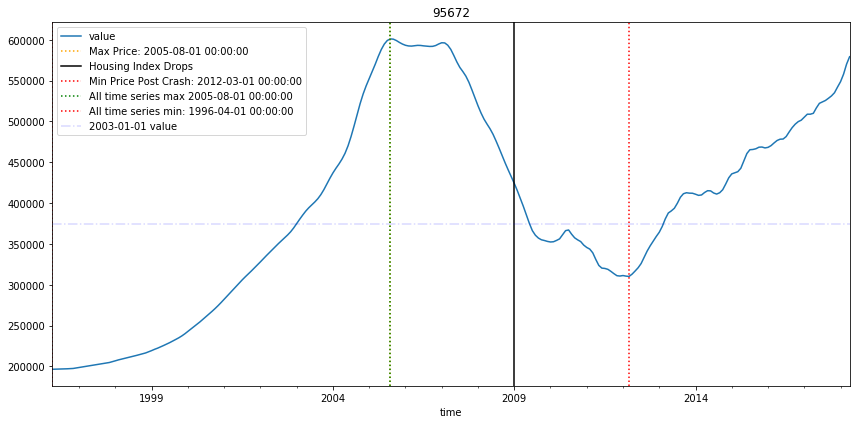

In [798]:
# fig, ax = plot_ts(df_melt, zipcodes=['95616', '92008', '90035', '90025', '60625', '57701'])  # enter desired zip code(s)

fig, ax = plot_ts_zips(df_melt, zipcodes=['95672'], figsize=(12,6))  # enter desired zip code(s)

In [799]:
ts_95672

,Metro,MetroState,CountyName,City,Zip,SizeRank,value
time,,,,,,,
1996-04-01,Sacramento,Sacramento CA,El Dorado,Rescue,95672,11257,196500.0
1996-05-01,Sacramento,Sacramento CA,El Dorado,Rescue,95672,11257,196600.0
1996-06-01,Sacramento,Sacramento CA,El Dorado,Rescue,95672,11257,196700.0
1996-07-01,Sacramento,Sacramento CA,El Dorado,Rescue,95672,11257,196900.0
1996-08-01,Sacramento,Sacramento CA,El Dorado,Rescue,95672,11257,197000.0
1996-09-01,Sacramento,Sacramento CA,El Dorado,Rescue,95672,11257,197100.0
1996-10-01,Sacramento,Sacramento CA,El Dorado,Rescue,95672,11257,197300.0
1996-11-01,Sacramento,Sacramento CA,El Dorado,Rescue,95672,11257,197500.0
1996-12-01,Sacramento,Sacramento CA,El Dorado,Rescue,95672,11257,198100.0


#### Boxplot of zip code

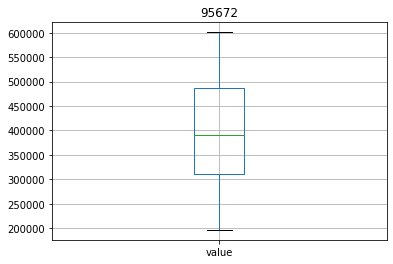

In [801]:
ts_95672.boxplot(column = 'value')
plt.title('95672');

### Plot ACF and PACF for ts dataframe

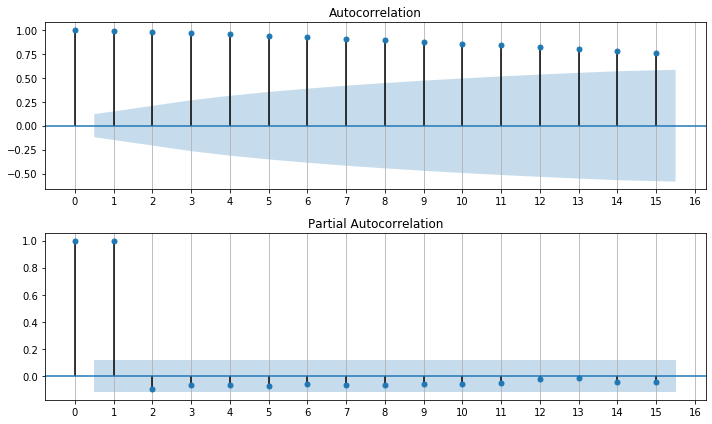

In [802]:
# plot_acf_pacf(ts, figsize=(10,6), lags=15)  # note that ts must only contain values and time as index

plot_acf_pacf(ts_95672_values, figsize=(10,6), lags=15)

### Plot seasonal decomposition for ts dataframe

(<Figure size 1296x432 with 1 Axes>,
 <matplotlib.axes._subplots.AxesSubplot at 0x1cc5f25860>)

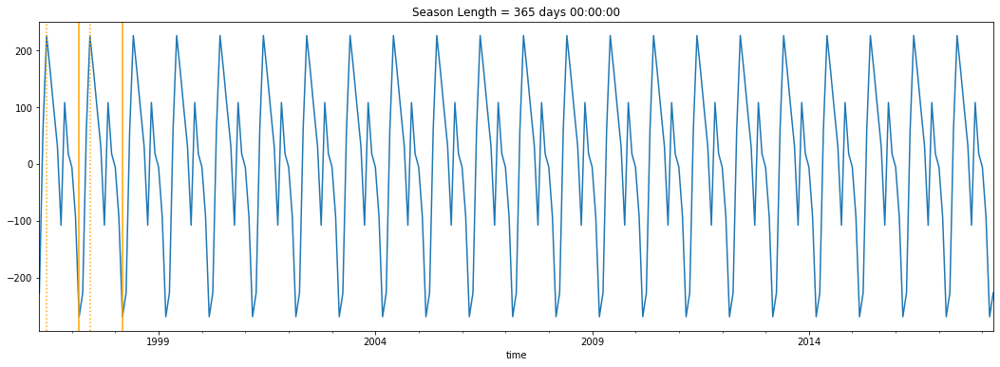

In [803]:
# plot_seasonal_decomp(ts)

plot_seasonal_decomp(ts_95672_values)

# Seasonality does not appear to be a significant factor in this zip code.

## ARIMA model parameters and optimization

### Generate list of (p,d,q) and (p,d,q,m) values

In [806]:
p_values = [0, 1, 2, 4, 6, 8]
d_values = range(0, 3)
q_values = range(0, 3)
warnings.filterwarnings("ignore")

### Run ARIMA model on ts dataframe with list of p,d,q values 

In [807]:
# eval_arima_models(ts, p_values, d_values, q_values)  # don't run this until you have some time, since it take time
# note that ts must only contain values and time as index

# eval_arima_models(ts_95672_values, p_values, d_values, q_values)  # don't run this until you have some time, since it takes time


### Generate model fit summary

In [1306]:
# model_fit = arima_zipcode(ts, order = None)   # change order = tuple to correspond to the best MSE produced by previous function

# Best ARIMA(8, 2, 0) MSE=3175806.269

model_fit_95672 = arima_zipcode(ts_95672_values, order = (8,2,0))


                             ARIMA Model Results                              
Dep. Variable:                   D2.y   No. Observations:                  263
Model:                 ARIMA(8, 2, 0)   Log Likelihood               -2196.091
Method:                       css-mle   S.D. of innovations           1017.706
Date:                Tue, 10 Mar 2020   AIC                           4412.182
Time:                        22:35:13   BIC                           4447.903
Sample:                             2   HQIC                          4426.537
                                                                              
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const         28.1576    101.416      0.278      0.782    -170.615     226.930
ar.L1.D2.y     0.8942      0.059     15.057      0.000       0.778       1.011
ar.L2.D2.y    -0.9619      0.076    -12.703      0.0

## ARIMA modeling results:  predictions and visualization

### Produce forecasts from ARIMA model fit

In [1307]:
# actual_forecast, forecast_confint = forecast(model_fit, months=24, confint=2)

actual_forecast_95672, std_error_95672, forecast_confint_95672 = forecast(model_fit_95672)


In [1308]:
actual_forecast_95672, std_error_95672, forecast_confint_95672

(array([582790.7675982 , 587613.08751392, 595303.77530663, 603316.53060376,
        611350.39876019, 620364.45232101, 628628.20954901, 636525.7612203 ,
        644421.19395456, 651691.58358223, 658523.69265324, 666769.9407738 ,
        675648.54967349, 684003.24202533, 692041.91956124, 700351.44522346,
        708323.89277147, 716266.49808647, 724442.91825023, 732739.52393212,
        741010.21634883, 749605.51916884, 758120.63058994, 766391.85957796]),
 array([  1017.70610625,   3116.32260144,   5646.03016993,   8106.00090335,
         10662.69921918,  13411.74655337,  16380.30368579,  19612.37062962,
         23186.00437599,  27075.81719217,  31306.25546802,  35822.11411788,
         40512.80266628,  45325.23253883,  50334.84438684,  55564.54283237,
         61006.16147122,  66652.6409397 ,  72506.64216351,  78536.38924793,
         84733.30502555,  91087.02856189,  97592.22290684, 104250.01894921]),
 array([[580796.10028311, 584785.43491329],
        [581505.20745088, 593720.9675769

### Create dataframe to hold forecast results

In [1309]:
# df_forecast = forecast_df(col = 'time', daterange = pd.date_range(start='2018-05-01', end='2020-04-01', freq='MS'), 
#                 actual_forecast=actual_forecast, forecast_confint = forecast_confint)

df_forecast_95672 = forecast_df(actual_forecast_95672, forecast_confint_95672, col = 'time', daterange = pd.date_range(start='2018-05-01', end='2020-04-01', freq='MS'))


### Create new dataframe concatenating historic values and forecast results

In [1310]:
# df_new = concat_values_forecast(ts, df_forecast)

df_new_95672 = concat_values_forecast(ts_95672_values, df_forecast_95672)

In [1311]:
df_new_95672

,value,forecast,forecast_lower,forecast_upper
time,,,,
1996-04-01,196500.0,NaN,NaN,NaN
1996-05-01,196600.0,NaN,NaN,NaN
1996-06-01,196700.0,NaN,NaN,NaN
1996-07-01,196900.0,NaN,NaN,NaN
1996-08-01,197000.0,NaN,NaN,NaN
1996-09-01,197100.0,NaN,NaN,NaN
1996-10-01,197300.0,NaN,NaN,NaN
1996-11-01,197500.0,NaN,NaN,NaN
1996-12-01,198100.0,NaN,NaN,NaN


### Calculate predicted, lower bound, and upper bound forecasted prices

In [1312]:
forecasted_price_95672, forecasted_lower_95672, forecasted_upper_95672 = forecast_values(df_new_95672)

In [1313]:
forecasted_price_95672, forecasted_lower_95672, forecasted_upper_95672  # predicted, best-case, and worst-case prices in 2020


(766391.8595779553, 562065.5770498811, 970718.1421060296)

In [1314]:
last_value_95672 = df_new_95672['value'].loc['2018-04-01']

In [1315]:
last_value_95672

579300.0

### Plot forecast with confidence intervals

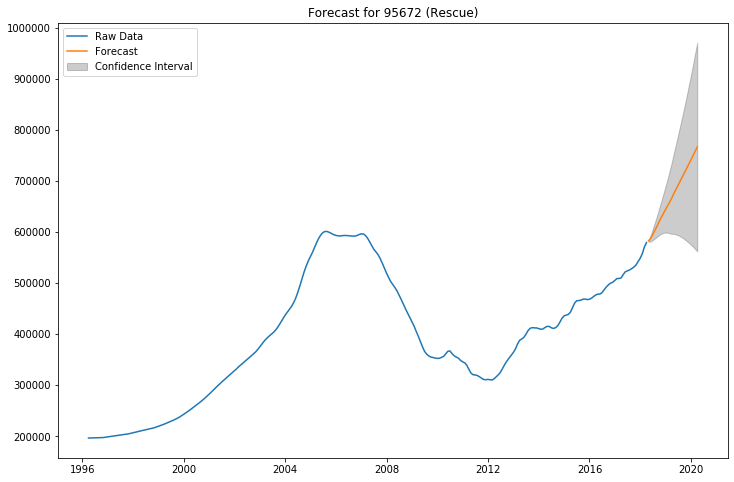

In [1316]:
# plot_forecast(df = df_new, figsize=(12,8), geog=None)

plot_forecast(df_new_95672, figsize=(12,8), geog='95672 (Rescue)')

### Print summary of predicted, worst-case, and best-case scenarios

In [1317]:
rescue_95672_pred, rescue_95672_low, rescue_95672_high = pred_best_worst(pred=forecasted_price_95672, low=forecasted_lower_95672, 
                                                                         high=forecasted_upper_95672, last=last_value_95672, date='April 1, 2020')
rescue_95672_pred, rescue_95672_low, rescue_95672_high

By the model prediction, I would expect to see a 32.296% change in price by April 1, 2020.
At the lower bound of the confidence interval, I would expect to see a -2.975% change in price by April 1, 2020.
At the upper bound of the confidence interval, I would expect to see a 67.567% change in price by April 1, 2020.


(32.296, -2.975, 67.567)

## Zip code 95672 (Rescue):  Good investment opportunity

By the model prediction, I would expect to see a 32.296% change in price by April 1, 2020
At the lower bound of the confidence interval, I would expect to see a -2.975% change in price by April 1, 2020
At the upper bound of the confidence interval, I would expect to see a 67.567% change in price by April 1, 2020



# SacMetro:  95636 (Somerset) -- Potential investment opportunity

In [1318]:
geog_area = '95636'

In [1319]:
ts_95636 = df_sac.loc[df_sac['Zip'] == geog_area]  # ts for all of the following functions should have only one zipcode
ts_95636.head()


,Metro,MetroState,CountyName,City,Zip,SizeRank,value
time,,,,,,,
1996-04-01,Sacramento,Sacramento CA,El Dorado,Somerset,95636,14632,95100.0
1996-05-01,Sacramento,Sacramento CA,El Dorado,Somerset,95636,14632,95400.0
1996-06-01,Sacramento,Sacramento CA,El Dorado,Somerset,95636,14632,95600.0
1996-07-01,Sacramento,Sacramento CA,El Dorado,Somerset,95636,14632,95900.0
1996-08-01,Sacramento,Sacramento CA,El Dorado,Somerset,95636,14632,96200.0


In [1320]:
# ts.head()

ts_95636.head()

,Metro,MetroState,CountyName,City,Zip,SizeRank,value
time,,,,,,,
1996-04-01,Sacramento,Sacramento CA,El Dorado,Somerset,95636,14632,95100.0
1996-05-01,Sacramento,Sacramento CA,El Dorado,Somerset,95636,14632,95400.0
1996-06-01,Sacramento,Sacramento CA,El Dorado,Somerset,95636,14632,95600.0
1996-07-01,Sacramento,Sacramento CA,El Dorado,Somerset,95636,14632,95900.0
1996-08-01,Sacramento,Sacramento CA,El Dorado,Somerset,95636,14632,96200.0


In [1321]:
# ts = ts.value

ts_95636_values = ts_95636.value

In [1322]:
# ts.head()

ts_95636_values.head()

time
1996-04-01    95100.0
1996-05-01    95400.0
1996-06-01    95600.0
1996-07-01    95900.0
1996-08-01    96200.0
Name: value, dtype: float64

In [1323]:
ts_95636_values.tail()

time
2017-12-01    229800.0
2018-01-01    233300.0
2018-02-01    237100.0
2018-03-01    240100.0
2018-04-01    241200.0
Name: value, dtype: float64

### Visualizations

#### plot_ts:  Plot zip code(s) of interest over time, with market highs and lows

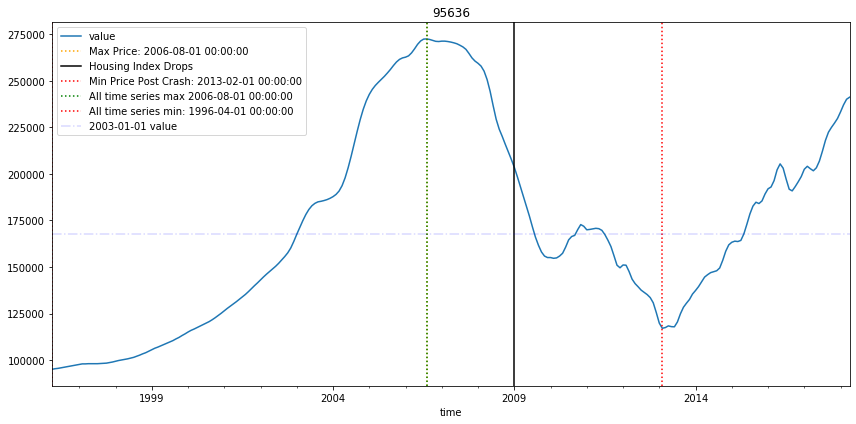

In [828]:
# fig, ax = plot_ts(df_melt, zipcodes=['95616', '92008', '90035', '90025', '60625', '57701'])  # enter desired zip code(s)

fig, ax = plot_ts_zips(df_melt, zipcodes=['95636'], figsize=(12,6))  # enter desired zip code(s)

#### Boxplot of zip code

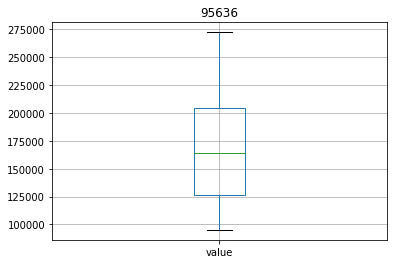

In [830]:
ts_95636.boxplot(column = 'value')
plt.title('95636');

### Plot ACF and PACF for ts dataframe

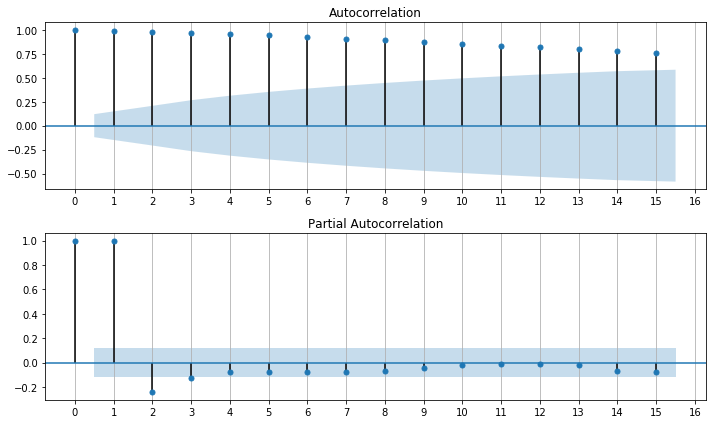

In [831]:
# plot_acf_pacf(ts, figsize=(10,6), lags=15)  # note that ts must only contain values and time as index

plot_acf_pacf(ts_95636_values, figsize=(10,6), lags=15)

### Plot seasonal decomposition for ts dataframe

(<Figure size 1296x432 with 1 Axes>,
 <matplotlib.axes._subplots.AxesSubplot at 0x1cc6d47518>)

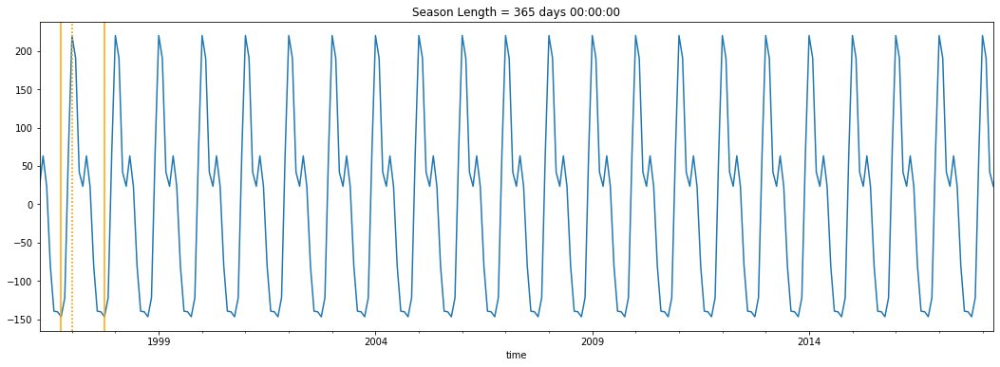

In [832]:
# plot_seasonal_decomp(ts)

plot_seasonal_decomp(ts_95636_values)

# Seasonality does not appear to be a significant factor in this zip code.

## ARIMA model parameters and optimization

### Generate list of (p,d,q) and (p,d,q,m) values

In [833]:
p_values = [0, 1, 2, 4, 6, 8]
d_values = range(0, 3)
q_values = range(0, 3)
warnings.filterwarnings("ignore")

### Run ARIMA model on ts dataframe with list of p,d,q values 

In [834]:
# eval_arima_models(ts, p_values, d_values, q_values)  # don't run this until you have some time, since it take time
# note that ts must only contain values and time as index

# eval_arima_models(ts_95636_values, p_values, d_values, q_values)  # don't run this until you have some time, since it takes time


### Generate model fit summary

In [1324]:
# model_fit = arima_zipcode(ts, order = None)   # change order = tuple to correspond to the best MSE produced by previous function

# Best ARIMA(8, 2, 1) MSE=1389280.792

model_fit_95636 = arima_zipcode(ts_95636_values, order = (8,2,1))

                             ARIMA Model Results                              
Dep. Variable:                   D2.y   No. Observations:                  263
Model:                 ARIMA(8, 2, 1)   Log Likelihood               -2096.633
Method:                       css-mle   S.D. of innovations            697.343
Date:                Tue, 10 Mar 2020   AIC                           4215.265
Time:                        22:37:29   BIC                           4254.559
Sample:                             2   HQIC                          4231.057
                                                                              
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const          2.3799     54.242      0.044      0.965    -103.932     108.692
ar.L1.D2.y     1.1070      0.131      8.455      0.000       0.850       1.364
ar.L2.D2.y    -1.1745      0.134     -8.796      0.0

## ARIMA modeling results:  predictions and visualization

### Produce forecasts from ARIMA model fit

In [1325]:
actual_forecast_95636, std_error_95636, forecast_confint_95636 = forecast(model_fit_95636)

# actual_forecast, forecast_confint = forecast(model_fit_dallas, months=24, confint=2)

In [1326]:
actual_forecast_95636, std_error_95636, forecast_confint_95636

(array([241691.04029314, 242484.45211006, 243673.16315282, 244790.16622748,
        246246.30181048, 247942.51107051, 249643.1874785 , 250928.24944852,
        251849.19705064, 252496.54019937, 253317.88814226, 254418.62646779,
        255711.31786725, 256969.65937555, 258247.98188548, 259463.82331079,
        260562.00520519, 261511.45907972, 262466.5786613 , 263492.98547622,
        264645.70756006, 265859.34059543, 267077.59047612, 268232.30618054]),
 array([  697.3433221 ,  2171.92356641,  3976.19184616,  5692.24024208,
         7372.3652499 ,  9101.12282576, 10901.51586393, 12789.10456177,
        14839.44878428, 17092.75900643, 19574.69704363, 22246.49807471,
        25020.80336809, 27827.21791523, 30684.91623192, 33629.68405932,
        36678.13284032, 39834.34895545, 43110.24682808, 46499.22484915,
        49982.99012626, 53539.93063761, 57159.28926563, 60841.01088159]),
 array([[240324.27249697, 243057.80808931],
        [238227.56014273, 246741.34407739],
        [235879.9703

### Create dataframe to hold forecast results

In [1327]:
# df_forecast = forecast_df(col = 'time', daterange = pd.date_range(start='2018-05-01', end='2020-04-01', freq='MS'), 
#                 actual_forecast=actual_forecast, forecast_confint = forecast_confint)

df_forecast_95636 = forecast_df(actual_forecast_95636, forecast_confint_95636, col = 'time', daterange = pd.date_range(start='2018-05-01', end='2020-04-01', freq='MS'))

### Create new dataframe concatenating historic values and forecast results

In [1329]:
# df_new = concat_values_forecast(ts, df_forecast)

df_new_95636 = concat_values_forecast(ts_95636_values, df_forecast_95636)

In [1330]:
df_new_95636

,value,forecast,forecast_lower,forecast_upper
time,,,,
1996-04-01,95100.0,NaN,NaN,NaN
1996-05-01,95400.0,NaN,NaN,NaN
1996-06-01,95600.0,NaN,NaN,NaN
1996-07-01,95900.0,NaN,NaN,NaN
1996-08-01,96200.0,NaN,NaN,NaN
1996-09-01,96500.0,NaN,NaN,NaN
1996-10-01,96800.0,NaN,NaN,NaN
1996-11-01,97100.0,NaN,NaN,NaN
1996-12-01,97400.0,NaN,NaN,NaN


### Calculate predicted, lower bound, and upper bound forecasted prices

In [1331]:
forecasted_price_95636, forecasted_lower_95636, forecasted_upper_95636 = forecast_values(df_new_95636)

In [1332]:
forecasted_price_95636, forecasted_lower_95636, forecasted_upper_95636  # predicted, best-case, and worst-case prices in 2020


(268232.3061805436, 148986.1160696196, 387478.4962914676)

In [1333]:
last_value_95636 = df_new_95636['value'].loc['2018-04-01']

In [1334]:
last_value_95636

241200.0

### Plot forecast with confidence intervals

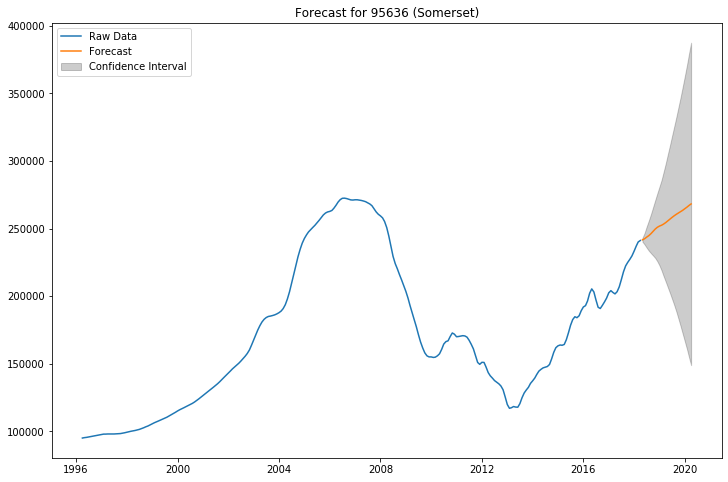

In [1335]:
# plot_forecast(df = df_new, figsize=(12,8), geog=None)

plot_forecast(df_new_95636, figsize=(12,8), geog='95636 (Somerset)')

### Print summary of predicted, worst-case, and best-case scenarios

In [1336]:
somerset_95636_pred, somerset_95636_low, somerset_95636_high = pred_best_worst(pred=forecasted_price_95636, low=forecasted_lower_95636, 
                                                                               high=forecasted_upper_95636, last=last_value_95636, date='April 1, 2020')
somerset_95636_pred, somerset_95636_low, somerset_95636_high 

By the model prediction, I would expect to see a 11.207% change in price by April 1, 2020.
At the lower bound of the confidence interval, I would expect to see a -38.231% change in price by April 1, 2020.
At the upper bound of the confidence interval, I would expect to see a 60.646% change in price by April 1, 2020.


(11.207, -38.231, 60.646)

## Zip code 95636:  Good return predicted, but has very large potential downside (as well as large potential upside)

By the model prediction, I would expect to see a 11.207% change in price by April 1, 2020
At the lower bound of the confidence interval, I would expect to see a -38.231% change in price by April 1, 2020
At the upper bound of the confidence interval, I would expect to see a 60.646% change in price by April 1, 2020




# SacMetro:  95709 (Camino) -- Don't invest

In [1337]:
geog_area = '95709'

In [1338]:
ts_95709 = df_sac.loc[df_sac['Zip'] == geog_area]  # ts for all of the following functions should have only one zipcode
ts_95709.head()


,Metro,MetroState,CountyName,City,Zip,SizeRank,value
time,,,,,,,
1996-04-01,Sacramento,Sacramento CA,El Dorado,Camino,95709,10422,141500.0
1996-05-01,Sacramento,Sacramento CA,El Dorado,Camino,95709,10422,141500.0
1996-06-01,Sacramento,Sacramento CA,El Dorado,Camino,95709,10422,141500.0
1996-07-01,Sacramento,Sacramento CA,El Dorado,Camino,95709,10422,141500.0
1996-08-01,Sacramento,Sacramento CA,El Dorado,Camino,95709,10422,141600.0


In [1342]:
# ts.head()

ts_95709.tail()

,Metro,MetroState,CountyName,City,Zip,SizeRank,value
time,,,,,,,
2017-12-01,Sacramento,Sacramento CA,El Dorado,Camino,95709,10422,372500.0
2018-01-01,Sacramento,Sacramento CA,El Dorado,Camino,95709,10422,377000.0
2018-02-01,Sacramento,Sacramento CA,El Dorado,Camino,95709,10422,381200.0
2018-03-01,Sacramento,Sacramento CA,El Dorado,Camino,95709,10422,384200.0
2018-04-01,Sacramento,Sacramento CA,El Dorado,Camino,95709,10422,386000.0


In [1343]:
# ts = ts.value

ts_95709_values = ts_95709.value

In [1344]:
# ts.head()

ts_95709_values.head()

time
1996-04-01    141500.0
1996-05-01    141500.0
1996-06-01    141500.0
1996-07-01    141500.0
1996-08-01    141600.0
Name: value, dtype: float64

In [1345]:
ts_95709_values.tail()

time
2017-12-01    372500.0
2018-01-01    377000.0
2018-02-01    381200.0
2018-03-01    384200.0
2018-04-01    386000.0
Name: value, dtype: float64

### Visualizations

#### plot_ts:  Plot zip code(s) of interest over time, with market highs and lows

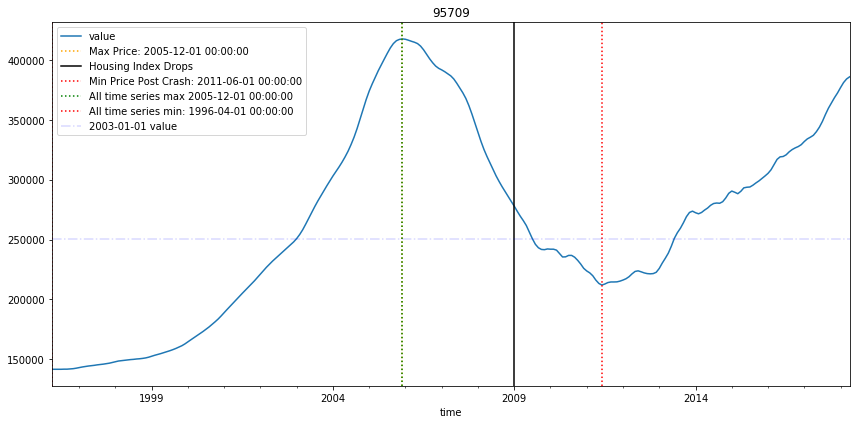

In [853]:
# fig, ax = plot_ts(df_melt, zipcodes=['95616', '92008', '90035', '90025', '60625', '57701'])  # enter desired zip code(s)

fig, ax = plot_ts_zips(df_melt, zipcodes=['95709'], figsize=(12,6))  # enter desired zip code(s)

#### Boxplot of zip code

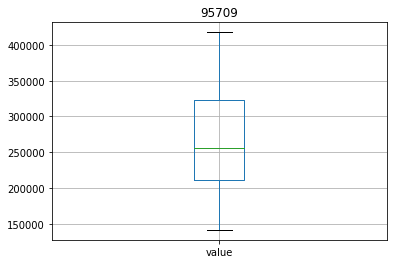

In [854]:
ts_95709.boxplot(column = 'value')
plt.title('95709');


### Plot ACF and PACF for ts dataframe

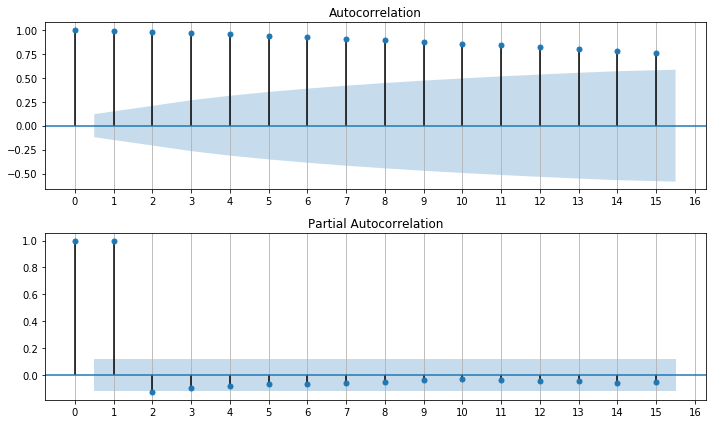

In [855]:
# plot_acf_pacf(ts, figsize=(10,6), lags=15)  # note that ts must only contain values and time as index

plot_acf_pacf(ts_95709_values, figsize=(10,6), lags=15)

### Plot seasonal decomposition for ts dataframe

(<Figure size 1296x432 with 1 Axes>,
 <matplotlib.axes._subplots.AxesSubplot at 0x1cc68dc2e8>)

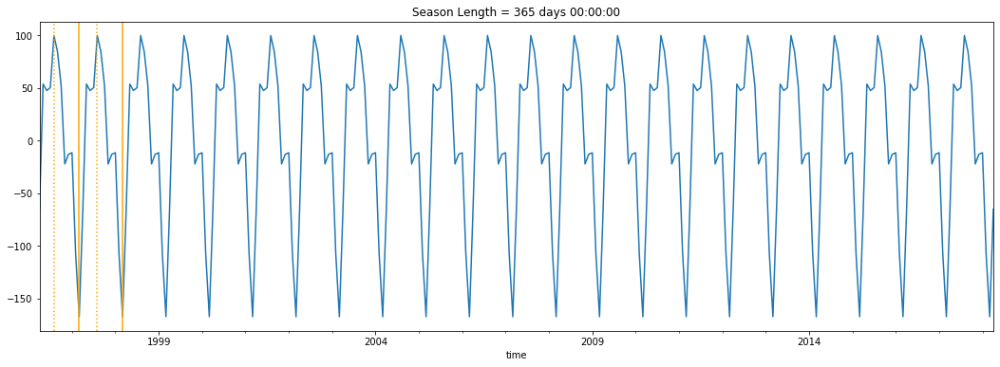

In [856]:
# plot_seasonal_decomp(ts)

plot_seasonal_decomp(ts_95709_values)

# Seasonality does not appear to be a significant factor in this zip code.

## ARIMA model parameters and optimization

### Generate list of (p,d,q) and (p,d,q,m) values

In [857]:
p_values = [0, 1, 2, 4, 6, 8]
d_values = range(0, 3)
q_values = range(0, 3)
warnings.filterwarnings("ignore")

### Run ARIMA model on ts dataframe with list of p,d,q values 

In [858]:
# eval_arima_models(ts, p_values, d_values, q_values)  # don't run this until you have some time, since it take time
# note that ts must only contain values and time as index

# eval_arima_models(ts_95709_values, p_values, d_values, q_values)  # don't run this until you have some time, since it takes time


### Generate model fit summary

In [1346]:
# model_fit = arima_zipcode(ts, order = None)   # change order = tuple to correspond to the best MSE produced by previous function

# Best ARIMA(8, 0, 2) MSE=717546.010
model_fit_95709 = arima_zipcode(ts_95709_values, order = (8, 0, 2))

                              ARMA Model Results                              
Dep. Variable:                      y   No. Observations:                  265
Model:                     ARMA(8, 2)   Log Likelihood               -2059.947
Method:                       css-mle   S.D. of innovations            558.079
Date:                Tue, 10 Mar 2020   AIC                           4143.893
Time:                        22:39:31   BIC                           4186.850
Sample:                             0   HQIC                          4161.153
                                                                              
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const       2.634e+05   3.86e+04      6.832      0.000    1.88e+05    3.39e+05
ar.L1.y        1.1579        nan        nan        nan         nan         nan
ar.L2.y        0.4021        nan        nan        n

## ARIMA modeling results:  predictions and visualization

### Produce forecasts from ARIMA model fit

In [1347]:
actual_forecast_95709, std_error_95709, forecast_confint_95709 = forecast(model_fit_95709)

In [1348]:
actual_forecast_95709, std_error_95709, forecast_confint_95709

(array([387587.02798097, 389183.86322317, 390860.20296759, 392171.67650521,
        393276.76676792, 394166.53007683, 394927.98909434, 395520.38004576,
        395910.3061555 , 396151.21549716, 396209.76279306, 396137.74477409,
        395893.54486675, 395513.33000554, 394983.25587279, 394319.04398294,
        393523.79256005, 392597.00517871, 391552.59009293, 390385.45412106,
        389110.52766437, 387724.19560703, 386237.61037259, 384651.77218719]),
 array([  558.07932896,  1688.58344788,  3070.41143071,  4457.43047471,
         5884.42304277,  7396.96246891,  9021.89119396, 10717.32130053,
        12464.21589616, 14255.00374785, 16086.87078045, 17954.76955724,
        19847.01621576, 21759.69749061, 23685.58843878, 25621.89556074,
        27562.59234865, 29503.82649799, 31441.48870073, 33371.86657297,
        35291.9507823 , 37198.17145324, 39088.05616794, 40958.59726887]),
 array([[386493.21259569, 388680.84336624],
        [385874.30048043, 392493.42596591],
        [384842.3071

### Create dataframe to hold forecast results

In [1349]:
# df_forecast = forecast_df(col = 'time', daterange = pd.date_range(start='2018-05-01', end='2020-04-01', freq='MS'), 
#                 actual_forecast=actual_forecast, forecast_confint = forecast_confint)

df_forecast_95709 = forecast_df(actual_forecast_95709, forecast_confint_95709, col = 'time', daterange = pd.date_range(start='2018-05-01', end='2020-04-01', freq='MS'))


### Create new dataframe concatenating historic values and forecast results

In [1350]:
# df_new = concat_values_forecast(ts, df_forecast)

df_new_95709 = concat_values_forecast(ts_95709_values, df_forecast_95709)

In [1351]:
df_new_95709

,value,forecast,forecast_lower,forecast_upper
time,,,,
1996-04-01,141500.0,NaN,NaN,NaN
1996-05-01,141500.0,NaN,NaN,NaN
1996-06-01,141500.0,NaN,NaN,NaN
1996-07-01,141500.0,NaN,NaN,NaN
1996-08-01,141600.0,NaN,NaN,NaN
1996-09-01,141600.0,NaN,NaN,NaN
1996-10-01,141800.0,NaN,NaN,NaN
1996-11-01,142000.0,NaN,NaN,NaN
1996-12-01,142400.0,NaN,NaN,NaN


### Calculate predicted, lower bound, and upper bound forecasted prices

In [1352]:
forecasted_price_95709, forecasted_lower_95709, forecasted_upper_95709 = forecast_values(df_new_95709)

In [1353]:
forecasted_price_95709, forecasted_lower_95709, forecasted_upper_95709  # predicted, best-case, and worst-case prices in 2020


(384651.7721871882, 304374.39668292203, 464929.1476914544)

In [1354]:
last_value_95709 = df_new_95709['value'].loc['2018-04-01']

In [1355]:
last_value_95709

386000.0

### Plot forecast with confidence intervals

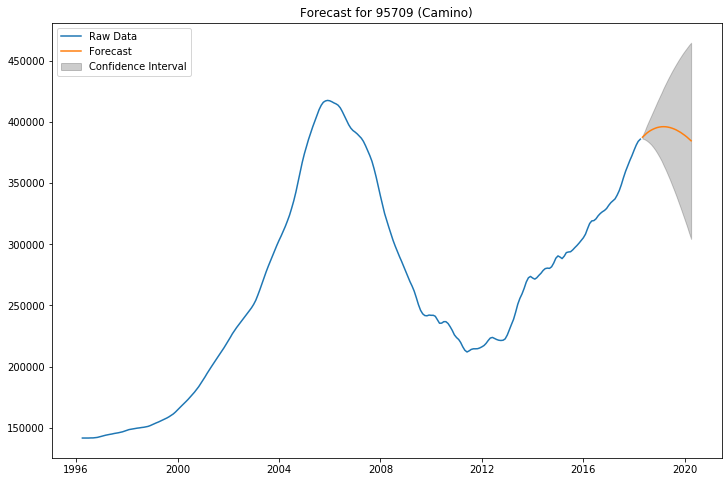

In [1356]:
# plot_forecast(df = df_new, figsize=(12,8), geog=None)

plot_forecast(df_new_95709, figsize=(12,8), geog='95709 (Camino)')

### Print summary of predicted, worst-case, and best-case scenarios

In [1357]:
camino_95709_pred, camino_95709_low, camino_95709_high  = pred_best_worst(pred=forecasted_price_95709, low=forecasted_lower_95709, 
                                                                          high=forecasted_upper_95709, last=last_value_95709, date='April 1, 2020')
camino_95709_pred, camino_95709_low, camino_95709_high

By the model prediction, I would expect to see a -0.349% change in price by April 1, 2020.
At the lower bound of the confidence interval, I would expect to see a -21.147% change in price by April 1, 2020.
At the upper bound of the confidence interval, I would expect to see a 20.448% change in price by April 1, 2020.


(-0.349, -21.147, 20.448)

## Zip code 95709 (Camino):  Don't invest

By the model prediction, I would expect to see a -0.349% change in price by April 1, 2020
At the lower bound of the confidence interval, I would expect to see a -21.147% change in price by April 1, 2020
At the upper bound of the confidence interval, I would expect to see a 20.448% change in price by April 1, 2020


# SacMetro:  95746 (Granite Bay) -- Solid investment opportunity

In [1358]:
geog_area = '95746'

In [1359]:
ts_95746 = df_sac.loc[df_sac['Zip'] == geog_area]  # ts for all of the following functions should have only one zipcode
ts_95746.head()


,Metro,MetroState,CountyName,City,Zip,SizeRank,value
time,,,,,,,
1996-04-01,Sacramento,Sacramento CA,Placer,Granite Bay,95746,5608,292000.0
1996-05-01,Sacramento,Sacramento CA,Placer,Granite Bay,95746,5608,289600.0
1996-06-01,Sacramento,Sacramento CA,Placer,Granite Bay,95746,5608,287300.0
1996-07-01,Sacramento,Sacramento CA,Placer,Granite Bay,95746,5608,285400.0
1996-08-01,Sacramento,Sacramento CA,Placer,Granite Bay,95746,5608,283900.0


In [1360]:
# ts.head()

ts_95746.tail()

,Metro,MetroState,CountyName,City,Zip,SizeRank,value
time,,,,,,,
2017-12-01,Sacramento,Sacramento CA,Placer,Granite Bay,95746,5608,757500.0
2018-01-01,Sacramento,Sacramento CA,Placer,Granite Bay,95746,5608,757000.0
2018-02-01,Sacramento,Sacramento CA,Placer,Granite Bay,95746,5608,761500.0
2018-03-01,Sacramento,Sacramento CA,Placer,Granite Bay,95746,5608,771300.0
2018-04-01,Sacramento,Sacramento CA,Placer,Granite Bay,95746,5608,778500.0


In [1361]:
# ts = ts.value

ts_95746_values = ts_95746.value

In [1362]:
# ts.head()

ts_95746_values.head()

time
1996-04-01    292000.0
1996-05-01    289600.0
1996-06-01    287300.0
1996-07-01    285400.0
1996-08-01    283900.0
Name: value, dtype: float64

In [1363]:
ts_95746_values.tail()

time
2017-12-01    757500.0
2018-01-01    757000.0
2018-02-01    761500.0
2018-03-01    771300.0
2018-04-01    778500.0
Name: value, dtype: float64

### Visualizations

#### plot_ts:  Plot zip code(s) of interest over time, with market highs and lows

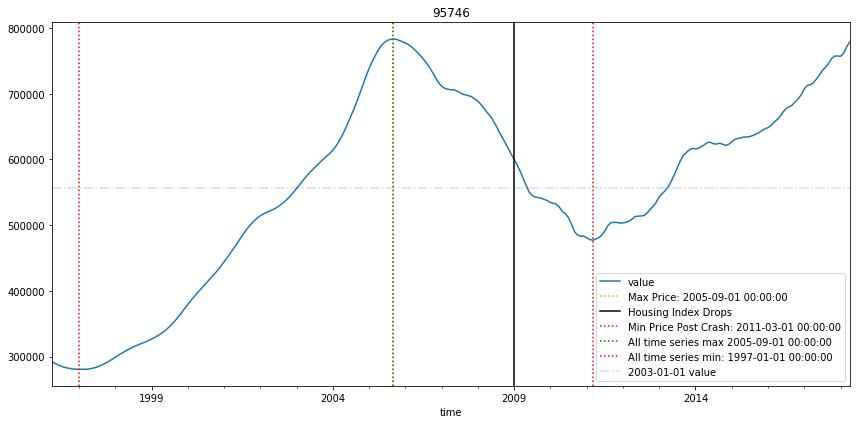

In [877]:
# fig, ax = plot_ts(df_melt, zipcodes=['95616', '92008', '90035', '90025', '60625', '57701'])  # enter desired zip code(s)

fig, ax = plot_ts_zips(df_melt, zipcodes=['95746'], figsize=(12,6))  # enter desired zip code(s)

In [878]:
ts_95746

,Metro,MetroState,CountyName,City,Zip,SizeRank,value
time,,,,,,,
1996-04-01,Sacramento,Sacramento CA,Placer,Granite Bay,95746,5608,292000.0
1996-05-01,Sacramento,Sacramento CA,Placer,Granite Bay,95746,5608,289600.0
1996-06-01,Sacramento,Sacramento CA,Placer,Granite Bay,95746,5608,287300.0
1996-07-01,Sacramento,Sacramento CA,Placer,Granite Bay,95746,5608,285400.0
1996-08-01,Sacramento,Sacramento CA,Placer,Granite Bay,95746,5608,283900.0
1996-09-01,Sacramento,Sacramento CA,Placer,Granite Bay,95746,5608,282700.0
1996-10-01,Sacramento,Sacramento CA,Placer,Granite Bay,95746,5608,281800.0
1996-11-01,Sacramento,Sacramento CA,Placer,Granite Bay,95746,5608,281100.0
1996-12-01,Sacramento,Sacramento CA,Placer,Granite Bay,95746,5608,280700.0


#### Boxplot of zip code

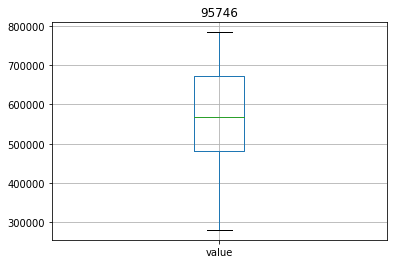

In [879]:
ts_95746.boxplot(column = 'value')
plt.title('95746');

### Plot ACF and PACF for ts dataframe

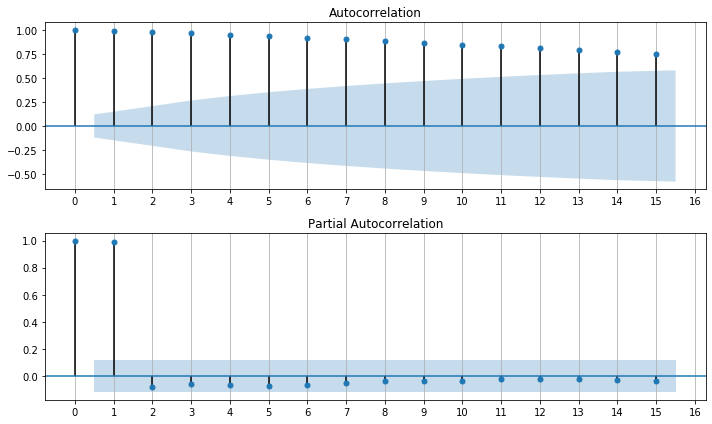

In [880]:
# plot_acf_pacf(ts, figsize=(10,6), lags=15)  # note that ts must only contain values and time as index

plot_acf_pacf(ts_95746_values, figsize=(10,6), lags=15)

### Plot seasonal decomposition for ts dataframe

(<Figure size 1296x432 with 1 Axes>,
 <matplotlib.axes._subplots.AxesSubplot at 0x1cc49f7b70>)

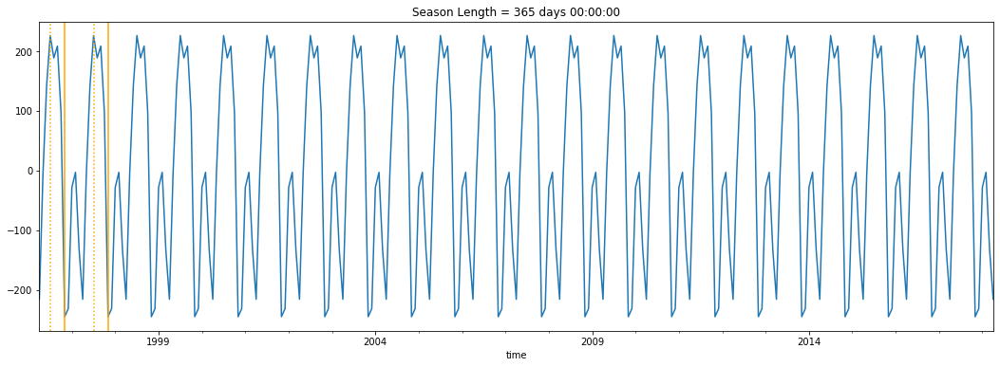

In [881]:
# plot_seasonal_decomp(ts)

plot_seasonal_decomp(ts_95746_values)

# Seasonality does not appear to be a significant factor in this zip code.

## ARIMA model parameters and optimization

### Generate list of (p,d,q) and (p,d,q,m) values

In [ ]:
p_values = [0, 1, 2, 4, 6, 8]
d_values = range(0, 3)
q_values = range(0, 3)
warnings.filterwarnings("ignore")

### Run ARIMA model on ts dataframe with list of p,d,q values 

In [883]:
# eval_arima_models(ts, p_values, d_values, q_values)  # don't run this until you have some time, since it take time
# note that ts must only contain values and time as index

# eval_arima_models(ts_95746_values, p_values, d_values, q_values)  # don't run this until you have some time, since it takes time


### Generate model fit summary

In [1364]:
# model_fit = arima_zipcode(ts, order = None)   # change order = tuple to correspond to the best MSE produced by previous function

# Best ARIMA(6, 1, 2) MSE=3329403.484

model_fit_95746 = arima_zipcode(ts_95746_values, order = (6, 1, 2))


                             ARIMA Model Results                              
Dep. Variable:                    D.y   No. Observations:                  264
Model:                 ARIMA(6, 1, 2)   Log Likelihood               -2240.772
Method:                       css-mle   S.D. of innovations           1155.648
Date:                Tue, 10 Mar 2020   AIC                           4501.543
Time:                        22:41:43   BIC                           4537.303
Sample:                             1   HQIC                          4515.912
                                                                              
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const       1842.7681   1706.789      1.080      0.281   -1502.478    5188.014
ar.L1.D.y     -0.0528      0.066     -0.805      0.422      -0.181       0.076
ar.L2.D.y      0.4918      0.067      7.387      0.0

## ARIMA modeling results:  predictions and visualization

### Produce forecasts from ARIMA model fit

In [1365]:
actual_forecast_95746, std_error_95746, forecast_confint_95746 = forecast(model_fit_95746)

In [1366]:
actual_forecast_95746, std_error_95746, forecast_confint_95746

(array([779689.89641013, 781645.71920252, 784885.02225555, 787798.17479647,
        791164.57049155, 794152.49240195, 796971.40581568, 799778.56307213,
        802590.38116435, 805315.51870355, 808049.93612355, 810699.40763312,
        813328.11732239, 815907.04186128, 818461.55831249, 820972.3828726 ,
        823459.73913459, 825908.54213706, 828333.57298213, 830726.42039563,
        833095.93598896, 835437.49472278, 837757.07583668, 840051.95031416]),
 array([ 1155.64836158,  3284.7791784 ,  5711.82030756,  8089.64342236,
        10643.15472006, 13262.9120552 , 16025.21943227, 18885.23444422,
        21837.68762421, 24844.87972972, 27913.03938685, 31017.91951982,
        34162.16630101, 37330.67428051, 40521.86844457, 43725.69888749,
        46940.27981378, 50158.5152634 , 53378.45329703, 56595.05332417,
        59806.38420415, 63008.83176766, 66200.69235819, 69379.32170763]),
 array([[777424.86724264, 781954.92557762],
        [775207.6703157 , 788083.76808934],
        [773690.0601

### Create dataframe to hold forecast results

In [1367]:
# df_forecast = forecast_df(col = 'time', daterange = pd.date_range(start='2018-05-01', end='2020-04-01', freq='MS'), 
#                 actual_forecast=actual_forecast, forecast_confint = forecast_confint)

df_forecast_95746 = forecast_df(actual_forecast_95746, forecast_confint_95746, col = 'time', daterange = pd.date_range(start='2018-05-01', end='2020-04-01', freq='MS'))


### Create new dataframe concatenating historic values and forecast results

In [1368]:
# df_new = concat_values_forecast(ts, df_forecast)

df_new_95746 = concat_values_forecast(ts_95746_values, df_forecast_95746)

In [1369]:
df_new_95746

,value,forecast,forecast_lower,forecast_upper
time,,,,
1996-04-01,292000.0,NaN,NaN,NaN
1996-05-01,289600.0,NaN,NaN,NaN
1996-06-01,287300.0,NaN,NaN,NaN
1996-07-01,285400.0,NaN,NaN,NaN
1996-08-01,283900.0,NaN,NaN,NaN
1996-09-01,282700.0,NaN,NaN,NaN
1996-10-01,281800.0,NaN,NaN,NaN
1996-11-01,281100.0,NaN,NaN,NaN
1996-12-01,280700.0,NaN,NaN,NaN


### Calculate predicted, lower bound, and upper bound forecasted prices

In [1370]:
forecasted_price_95746, forecasted_lower_95746, forecasted_upper_95746 = forecast_values(df_new_95746)

In [1371]:
forecasted_price_95746, forecasted_lower_95746, forecasted_upper_95746  # predicted, best-case, and worst-case prices in 2020


(840051.9503141623, 704070.97849538, 976032.9221329446)

In [1372]:
last_value_95746 = df_new_95746['value'].loc['2018-04-01']

In [1373]:
last_value_95746

778500.0

### Plot forecast with confidence intervals

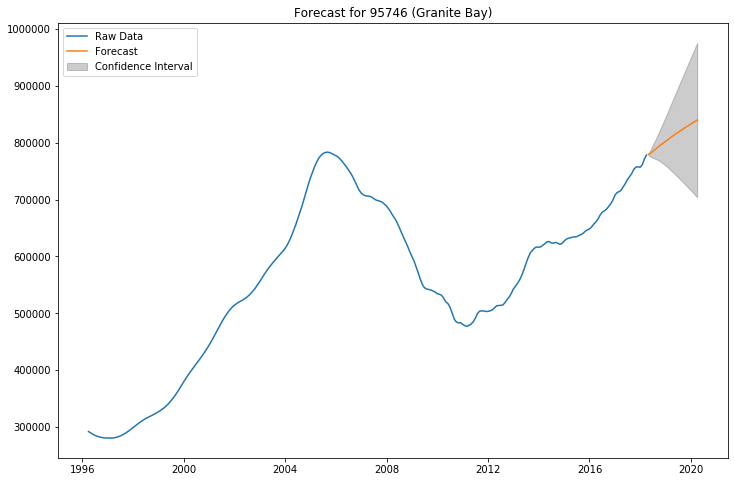

In [1374]:
# plot_forecast(df = df_new, figsize=(12,8), geog=None)

plot_forecast(df_new_95746, figsize=(12,8), geog='95746 (Granite Bay)')

### Print summary of predicted, worst-case, and best-case scenarios

In [1375]:
gb_95746_pred, gb_95746_low, gb_95746_high = pred_best_worst(pred=forecasted_price_95746, low=forecasted_lower_95746, 
                                                             high=forecasted_upper_95746, last=last_value_95746, date='April 1, 2020')
gb_95746_pred, gb_95746_low, gb_95746_high

By the model prediction, I would expect to see a 7.906% change in price by April 1, 2020.
At the lower bound of the confidence interval, I would expect to see a -9.561% change in price by April 1, 2020.
At the upper bound of the confidence interval, I would expect to see a 25.374% change in price by April 1, 2020.


(7.906, -9.561, 25.374)

## Zip code 95746 (Granite Bay):  Solid investment opportunity

By the model prediction, I would expect to see a 7.906% change in price by April 1, 2020.
At the lower bound of the confidence interval, I would expect to see a -9.561% change in price by April 1, 2020.
At the upper bound of the confidence interval, I would expect to see a 25.374% change in price by April 1, 2020.

# SacMetro:  95614 (Cool) -- Not a great investment opportunity

In [1376]:
geog_area = '95614'

In [1377]:
ts_95614 = df_sac.loc[df_sac['Zip'] == geog_area]  # ts for all of the following functions should have only one zipcode
ts_95614.head()


,Metro,MetroState,CountyName,City,Zip,SizeRank,value
time,,,,,,,
1996-04-01,Sacramento,Sacramento CA,El Dorado,Cool,95614,11436,157500.0
1996-05-01,Sacramento,Sacramento CA,El Dorado,Cool,95614,11436,157200.0
1996-06-01,Sacramento,Sacramento CA,El Dorado,Cool,95614,11436,156900.0
1996-07-01,Sacramento,Sacramento CA,El Dorado,Cool,95614,11436,156700.0
1996-08-01,Sacramento,Sacramento CA,El Dorado,Cool,95614,11436,156400.0


In [1378]:
# ts.head()

ts_95614.tail()

,Metro,MetroState,CountyName,City,Zip,SizeRank,value
time,,,,,,,
2017-12-01,Sacramento,Sacramento CA,El Dorado,Cool,95614,11436,403300.0
2018-01-01,Sacramento,Sacramento CA,El Dorado,Cool,95614,11436,412200.0
2018-02-01,Sacramento,Sacramento CA,El Dorado,Cool,95614,11436,419200.0
2018-03-01,Sacramento,Sacramento CA,El Dorado,Cool,95614,11436,422600.0
2018-04-01,Sacramento,Sacramento CA,El Dorado,Cool,95614,11436,423300.0


In [1379]:
# ts = ts.value

ts_95614_values = ts_95614.value

In [1380]:
# ts.head()

ts_95614_values.head()

time
1996-04-01    157500.0
1996-05-01    157200.0
1996-06-01    156900.0
1996-07-01    156700.0
1996-08-01    156400.0
Name: value, dtype: float64

In [1381]:
ts_95614_values.tail()

time
2017-12-01    403300.0
2018-01-01    412200.0
2018-02-01    419200.0
2018-03-01    422600.0
2018-04-01    423300.0
Name: value, dtype: float64

### Visualizations

#### plot_ts:  Plot zip code(s) of interest over time, with market highs and lows

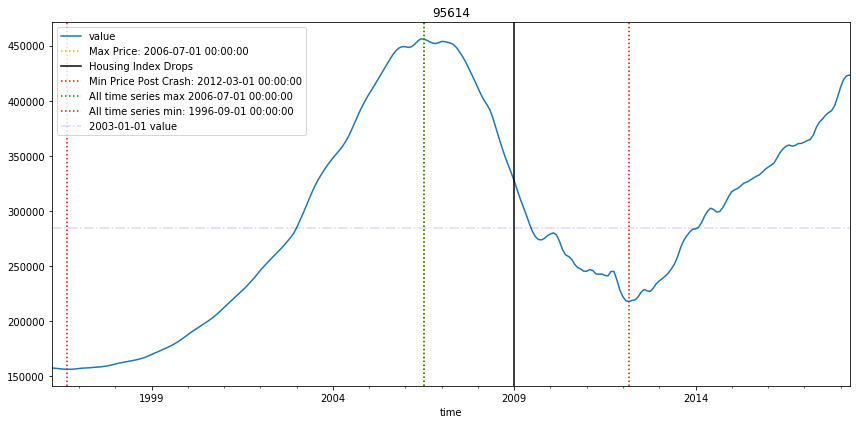

In [904]:
# fig, ax = plot_ts(df_melt, zipcodes=['95616', '92008', '90035', '90025', '60625', '57701'])  # enter desired zip code(s)

fig, ax = plot_ts_zips(df_melt, zipcodes=['95614'], figsize=(12,6))  # enter desired zip code(s)

#### Boxplot of zip code

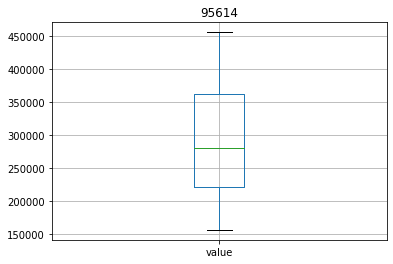

In [907]:
ts_95614.boxplot(column = 'value')
plt.title('95614');


### Plot ACF and PACF for ts dataframe

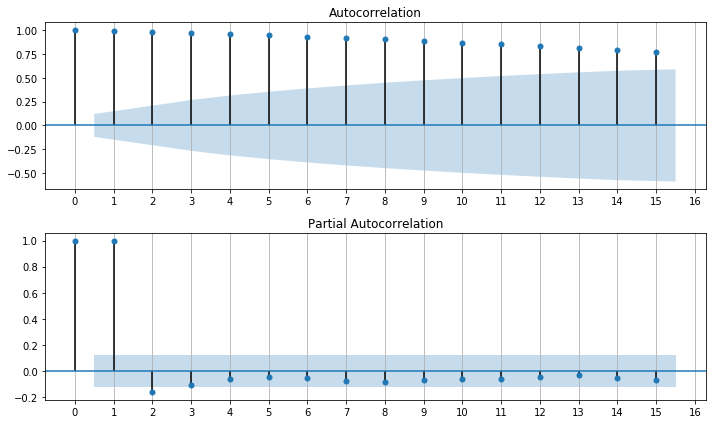

In [908]:
# plot_acf_pacf(ts, figsize=(10,6), lags=15)  # note that ts must only contain values and time as index

plot_acf_pacf(ts_95614_values, figsize=(10,6), lags=15)

### Plot seasonal decomposition for ts dataframe

(<Figure size 1296x432 with 1 Axes>,
 <matplotlib.axes._subplots.AxesSubplot at 0x1cc2b81390>)

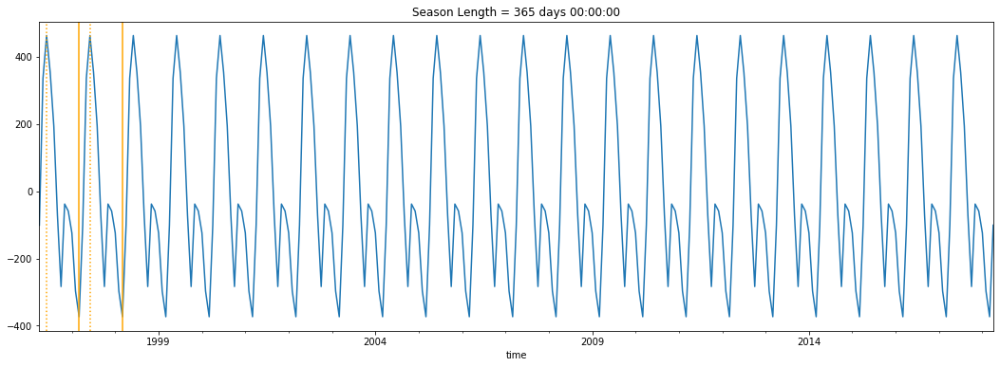

In [909]:
# plot_seasonal_decomp(ts)

plot_seasonal_decomp(ts_95614_values)

# Seasonality does not appear to be a significant factor in this zip code.

## ARIMA model parameters and optimization

### Generate list of (p,d,q) and (p,d,q,m) values

In [ ]:
p_values = [0, 1, 2, 4, 6, 8]
d_values = range(0, 3)
q_values = range(0, 3)
warnings.filterwarnings("ignore")

### Run ARIMA model on ts dataframe with list of p,d,q values 

In [910]:
# eval_arima_models(ts, p_values, d_values, q_values)  # don't run this until you have some time, since it take time
# note that ts must only contain values and time as index

# eval_arima_models(ts_95614_values, p_values, d_values, q_values)  # don't run this until you have some time, since it takes time


### Generate model fit summary

In [1382]:
# model_fit = arima_zipcode(ts, order = None)   # change order = tuple to correspond to the best MSE produced by previous function

# Best ARIMA(8, 0, 2) MSE=1365126.920

model_fit_95614 = arima_zipcode(ts_95614_values, order = (8,0,2))


                              ARMA Model Results                              
Dep. Variable:                      y   No. Observations:                  265
Model:                     ARMA(8, 2)   Log Likelihood               -2177.118
Method:                       css-mle   S.D. of innovations            868.099
Date:                Tue, 10 Mar 2020   AIC                           4378.236
Time:                        22:43:49   BIC                           4421.193
Sample:                             0   HQIC                          4395.495
                                                                              
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const       2.931e+05   4.14e+04      7.072      0.000    2.12e+05    3.74e+05
ar.L1.y        1.1742      0.093     12.596      0.000       0.991       1.357
ar.L2.y        0.1467      0.186      0.789      0.4

## ARIMA modeling results:  predictions and visualization

### Produce forecasts from ARIMA model fit

In [1383]:
actual_forecast_95614, std_error_95614, forecast_confint_95614 = forecast(model_fit_95614)


In [913]:
actual_forecast, std_error, forecast_confint

(array([423399.70281782, 424467.95084396, 426899.49376637, 430109.81314804,
        433349.40385365, 435714.91243505, 437052.70023733, 437690.51559244,
        438160.93791756, 438743.81431108, 439509.48012876, 440344.31966783,
        440970.36473228, 441237.60378459, 441135.55844216, 440787.26578493,
        440284.24343833, 439712.94201967, 439088.05668545, 438358.44471217,
        437466.90747898, 436388.11014963, 435138.73146106, 433739.13100737]),
 array([  868.09932156,  2608.33642105,  4598.87003156,  6444.25859104,
         8259.58797771,  9998.19396343, 11631.88094395, 13284.55257954,
        15097.74409944, 17046.27381783, 19055.66283677, 21115.46054924,
        23188.80295951, 25238.05820289, 27270.11148018, 29320.15253971,
        31387.79142669, 33462.76953541, 35544.29232516, 37623.17404655,
        39683.92500391, 41721.53498213, 43741.54504473, 45742.5733327 ]),
 array([[421698.25941256, 425101.14622308],
        [419355.70539914, 429580.19628878],
        [417885.8741

### Create dataframe to hold forecast results

In [1385]:
# df_forecast = forecast_df(col = 'time', daterange = pd.date_range(start='2018-05-01', end='2020-04-01', freq='MS'), 
#                 actual_forecast=actual_forecast, forecast_confint = forecast_confint)

df_forecast_95614 = forecast_df(actual_forecast_95614, forecast_confint_95614, 
                                col = 'time', daterange = pd.date_range(start='2018-05-01', end='2020-04-01', freq='MS'))

### Create new dataframe concatenating historic values and forecast results

In [1386]:
# df_new = concat_values_forecast(ts, df_forecast)

df_new_95614 = concat_values_forecast(ts_95614_values, df_forecast_95614)

In [1388]:
df_new_95614

,value,forecast,forecast_lower,forecast_upper
time,,,,
1996-04-01,157500.0,NaN,NaN,NaN
1996-05-01,157200.0,NaN,NaN,NaN
1996-06-01,156900.0,NaN,NaN,NaN
1996-07-01,156700.0,NaN,NaN,NaN
1996-08-01,156400.0,NaN,NaN,NaN
1996-09-01,156300.0,NaN,NaN,NaN
1996-10-01,156300.0,NaN,NaN,NaN
1996-11-01,156400.0,NaN,NaN,NaN
1996-12-01,156700.0,NaN,NaN,NaN


### Calculate predicted, lower bound, and upper bound forecasted prices

In [1389]:
forecasted_price_95614, forecasted_lower_95614, forecasted_upper_95614 = forecast_values(df_new_95614)

In [1390]:
forecasted_price_95614, forecasted_lower_95614, forecasted_upper_95614  # predicted, best-case, and worst-case prices in 2020

(433739.1310073696, 344085.3347150978, 523392.9272996414)

In [1391]:
last_value_95614 = df_new_95614['value'].loc['2018-04-01']

In [1392]:
last_value_95614

423300.0

### Plot forecast with confidence intervals

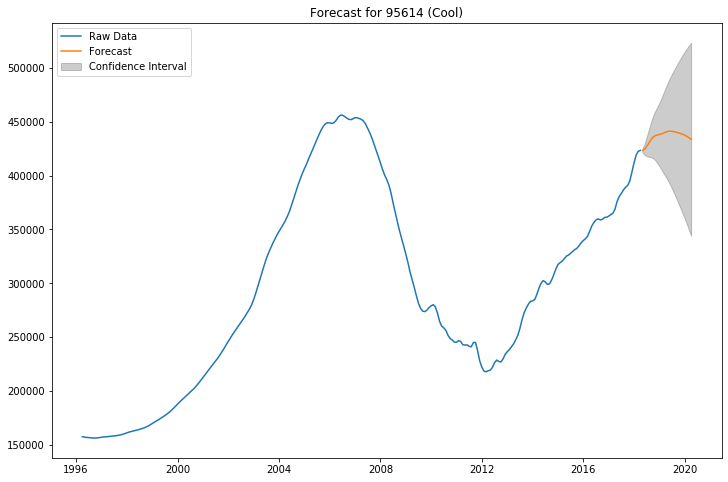

In [1393]:
# plot_forecast(df = df_new, figsize=(12,8), geog=None)

plot_forecast(df_new_95614, figsize=(12,8), geog='95614 (Cool)')

### Print summary of predicted, worst-case, and best-case scenarios

In [1394]:
cool_95614_pred, cool_95614_low, cool_95614_high = pred_best_worst(pred=forecasted_price_95614, low=forecasted_lower_95614, 
                                                                   high=forecasted_upper_95614, last=last_value_95614, date='April 1, 2020')
cool_95614_pred, cool_95614_low, cool_95614_high 

By the model prediction, I would expect to see a 2.466% change in price by April 1, 2020.
At the lower bound of the confidence interval, I would expect to see a -18.714% change in price by April 1, 2020.
At the upper bound of the confidence interval, I would expect to see a 23.646% change in price by April 1, 2020.


(2.466, -18.714, 23.646)

## Zip code 95614 (Cool):  Not a great investment opportunity

By the model prediction, I would expect to see a 2.466% change in price by April 1, 2020.
At the lower bound of the confidence interval, I would expect to see a -18.714% change in price by April 1, 2020.
At the upper bound of the confidence interval, I would expect to see a 23.646% change in price by April 1, 2020.


# SacMetro:  95663 (Penryn) -- Excellent investment opportunity

In [1395]:
geog_area = '95663'

In [1397]:
ts_95663 = df_sac.loc[df_sac['Zip'] == geog_area]  # ts for all of the following functions should have only one zipcode
ts_95663.head()


,Metro,MetroState,CountyName,City,Zip,SizeRank,value
time,,,,,,,
1996-04-01,Sacramento,Sacramento CA,Placer,Penryn,95663,12491,195400.0
1996-05-01,Sacramento,Sacramento CA,Placer,Penryn,95663,12491,195300.0
1996-06-01,Sacramento,Sacramento CA,Placer,Penryn,95663,12491,195300.0
1996-07-01,Sacramento,Sacramento CA,Placer,Penryn,95663,12491,195300.0
1996-08-01,Sacramento,Sacramento CA,Placer,Penryn,95663,12491,195400.0


In [1398]:
# ts.head()

ts_95663.tail()

,Metro,MetroState,CountyName,City,Zip,SizeRank,value
time,,,,,,,
2017-12-01,Sacramento,Sacramento CA,Placer,Penryn,95663,12491,572700.0
2018-01-01,Sacramento,Sacramento CA,Placer,Penryn,95663,12491,572900.0
2018-02-01,Sacramento,Sacramento CA,Placer,Penryn,95663,12491,577200.0
2018-03-01,Sacramento,Sacramento CA,Placer,Penryn,95663,12491,589300.0
2018-04-01,Sacramento,Sacramento CA,Placer,Penryn,95663,12491,600700.0


In [1399]:
# ts = ts.value

ts_95663_values = ts_95663.value

In [1400]:
# ts.head()

ts_95663_values.head()

time
1996-04-01    195400.0
1996-05-01    195300.0
1996-06-01    195300.0
1996-07-01    195300.0
1996-08-01    195400.0
Name: value, dtype: float64

In [1401]:
ts_95663_values.tail()

time
2017-12-01    572700.0
2018-01-01    572900.0
2018-02-01    577200.0
2018-03-01    589300.0
2018-04-01    600700.0
Name: value, dtype: float64

### Visualizations

#### plot_ts:  Plot zip code(s) of interest over time, with market highs and lows

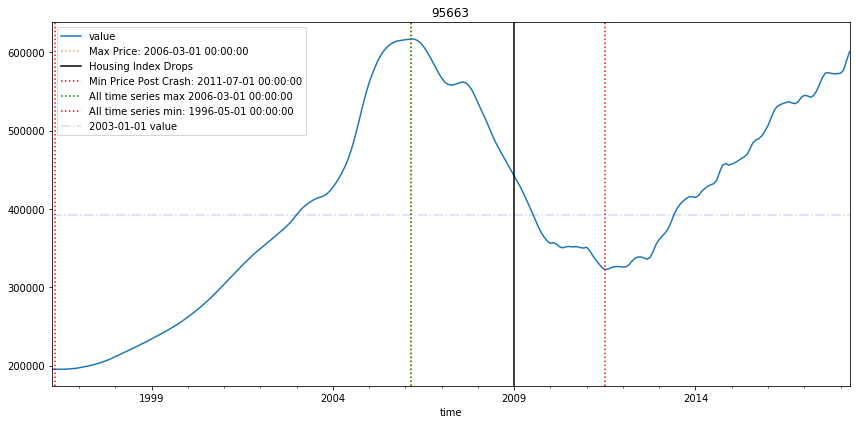

In [929]:
# fig, ax = plot_ts(df_melt, zipcodes=['95616', '92008', '90035', '90025', '60625', '57701'])  # enter desired zip code(s)

fig, ax = plot_ts_zips(df_melt, zipcodes=['95663'], figsize=(12,6))  # enter desired zip code(s)

In [931]:
ts_95663.head()

,Metro,MetroState,CountyName,City,Zip,SizeRank,value
time,,,,,,,
1996-04-01,Sacramento,Sacramento CA,Placer,Penryn,95663,12491,195400.0
1996-05-01,Sacramento,Sacramento CA,Placer,Penryn,95663,12491,195300.0
1996-06-01,Sacramento,Sacramento CA,Placer,Penryn,95663,12491,195300.0
1996-07-01,Sacramento,Sacramento CA,Placer,Penryn,95663,12491,195300.0
1996-08-01,Sacramento,Sacramento CA,Placer,Penryn,95663,12491,195400.0


#### Boxplot of zip code

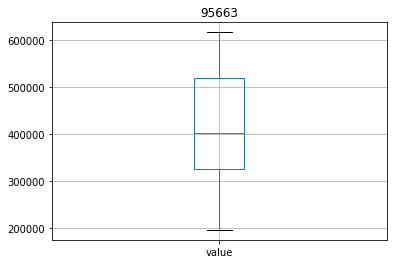

In [932]:
ts_95663.boxplot(column = 'value')
plt.title('95663');

### Plot ACF and PACF for ts dataframe

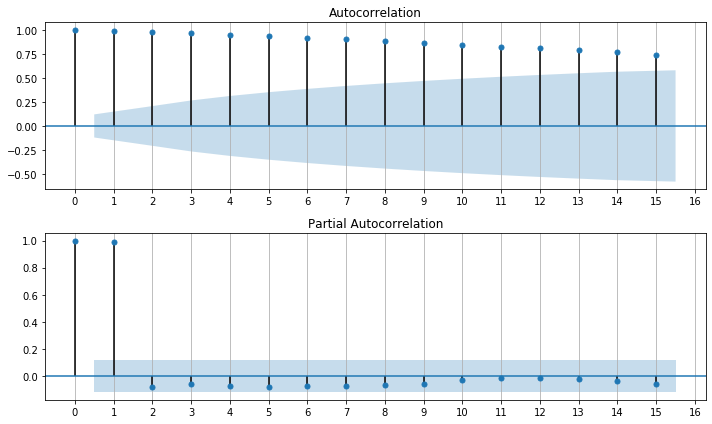

In [933]:
# plot_acf_pacf(ts, figsize=(10,6), lags=15)  # note that ts must only contain values and time as index

plot_acf_pacf(ts_95663_values, figsize=(10,6), lags=15)

### Plot seasonal decomposition for ts dataframe

(<Figure size 1296x432 with 1 Axes>,
 <matplotlib.axes._subplots.AxesSubplot at 0x1cbf8272e8>)

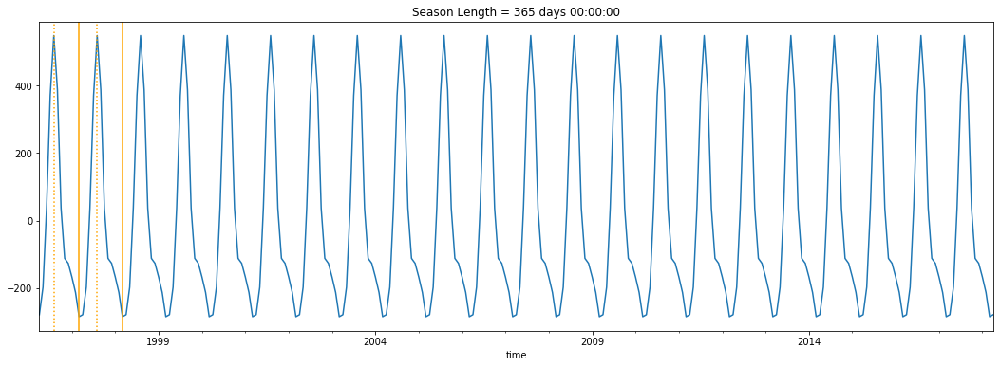

In [934]:
# plot_seasonal_decomp(ts)

plot_seasonal_decomp(ts_95663_values)

# Seasonality does not appear to be a significant factor in this zip code.

## ARIMA model parameters and optimization

### Generate list of (p,d,q) and (p,d,q,m) values

In [936]:
p_values = [0, 1, 2, 4, 6, 8]
d_values = range(0, 3)
q_values = range(0, 3)
warnings.filterwarnings("ignore")

### Run ARIMA model on ts dataframe with list of p,d,q values 

In [937]:
# eval_arima_models(ts, p_values, d_values, q_values)  # don't run this until you have some time, since it take time
# note that ts must only contain values and time as index

# eval_arima_models(ts_95663_values, p_values, d_values, q_values)  # don't run this until you have some time, since it takes time


### Generate model fit summary

In [1402]:
# model_fit = arima_zipcode(ts, order = None)   # change order = tuple to correspond to the best MSE produced by previous function

# Best ARIMA(6, 1, 1) MSE=4616814.652

model_fit_95663 = arima_zipcode(ts_95663_values, order = (6, 1, 1))


                             ARIMA Model Results                              
Dep. Variable:                    D.y   No. Observations:                  264
Model:                 ARIMA(6, 1, 1)   Log Likelihood               -2259.231
Method:                       css-mle   S.D. of innovations           1250.189
Date:                Tue, 10 Mar 2020   AIC                           4536.461
Time:                        22:45:55   BIC                           4568.645
Sample:                             1   HQIC                          4549.393
                                                                              
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const       1535.2274   1631.034      0.941      0.347   -1661.541    4731.996
ar.L1.D.y      1.0556      0.095     11.060      0.000       0.869       1.243
ar.L2.D.y     -0.2835      0.148     -1.915      0.0

## ARIMA modeling results:  predictions and visualization

### Produce forecasts from ARIMA model fit

In [1403]:
actual_forecast_95663, std_error_95663, forecast_confint_95663 = forecast(model_fit_95663)


In [1404]:
actual_forecast_95663, std_error_95663, forecast_confint_95663

(array([605988.242167  , 608811.02055993, 612621.38391769, 616164.56350552,
        619187.1188419 , 623147.82257389, 628141.40601381, 632682.30194886,
        636482.63909043, 640111.54483644, 643731.72973429, 647056.29378989,
        650263.31131551, 653572.60295866, 656924.37641323, 660116.59843115,
        663196.88639898, 666216.91698445, 669164.62642536, 672001.14905821,
        674785.35045957, 677533.70589997, 680235.85125874, 682869.62048371]),
 array([ 1250.18933566,  3603.90284082,  6387.7235785 ,  9100.58992495,
        11804.25650029, 14502.2851819 , 17161.54876918, 19796.21632205,
        22521.17046366, 25357.32797404, 28273.87679741, 31230.77647125,
        34226.32789499, 37238.86285823, 40256.78691238, 43275.13690554,
        46303.61976434, 49337.60199451, 52374.15955601, 55407.85121063,
        58438.18091914, 61459.32302095, 64469.40828943, 67465.98609582]),
 array([[603537.91609525, 608438.56823876],
        [601747.50078814, 615874.54033172],
        [600101.6757

### Create dataframe to hold forecast results

In [1405]:
# df_forecast = forecast_df(col = 'time', daterange = pd.date_range(start='2018-05-01', end='2020-04-01', freq='MS'), 
#                 actual_forecast=actual_forecast, forecast_confint = forecast_confint)

df_forecast_95663 = forecast_df(actual_forecast_95663, forecast_confint_95663, col = 'time', daterange = pd.date_range(start='2018-05-01', end='2020-04-01', freq='MS'))


### Create new dataframe concatenating historic values and forecast results

In [1406]:
# df_new = concat_values_forecast(ts, df_forecast)

df_new_95663 = concat_values_forecast(ts_95663_values, df_forecast_95663)

In [1407]:
df_new_95663

,value,forecast,forecast_lower,forecast_upper
time,,,,
1996-04-01,195400.0,NaN,NaN,NaN
1996-05-01,195300.0,NaN,NaN,NaN
1996-06-01,195300.0,NaN,NaN,NaN
1996-07-01,195300.0,NaN,NaN,NaN
1996-08-01,195400.0,NaN,NaN,NaN
1996-09-01,195500.0,NaN,NaN,NaN
1996-10-01,195800.0,NaN,NaN,NaN
1996-11-01,196000.0,NaN,NaN,NaN
1996-12-01,196500.0,NaN,NaN,NaN


### Calculate predicted, lower bound, and upper bound forecasted prices

In [1408]:
forecasted_price_95663, forecasted_lower_95663, forecasted_upper_95663 = forecast_values(df_new_95663)

In [1409]:
forecasted_price_95663, forecasted_lower_95663, forecasted_upper_95663  # predicted, best-case, and worst-case prices in 2020


(682869.6204837124, 550638.71755442, 815100.5234130048)

In [1410]:
last_value_95663 = df_new_95663['value'].loc['2018-04-01']

In [1411]:
last_value_95663

600700.0

### Plot forecast with confidence intervals

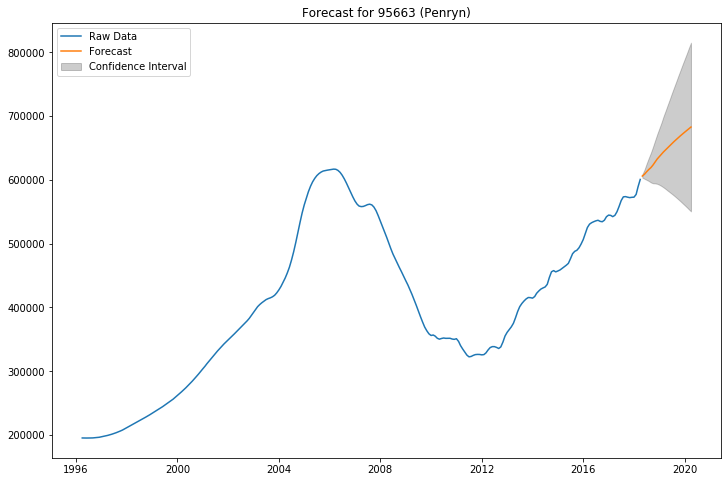

In [1412]:
# plot_forecast(df = df_new, figsize=(12,8), geog=None)

plot_forecast(df_new_95663, figsize=(12,8), geog='95663 (Penryn)')

### Print summary of predicted, worst-case, and best-case scenarios

In [1413]:
penryn_95663_pred, penryn_95663_low, penryn_95663_high = pred_best_worst(pred=forecasted_price_95663, low=forecasted_lower_95663, 
                                                                         high=forecasted_upper_95663, last=last_value_95663, date='April 1, 2020')
penryn_95663_pred, penryn_95663_low, penryn_95663_high

By the model prediction, I would expect to see a 13.679% change in price by April 1, 2020.
At the lower bound of the confidence interval, I would expect to see a -8.334% change in price by April 1, 2020.
At the upper bound of the confidence interval, I would expect to see a 35.692% change in price by April 1, 2020.


(13.679, -8.334, 35.692)

## Zip code 95663 (Penryn):  Excellent investment opportunity

By the model prediction, I would expect to see a 13.679% change in price by April 1, 2020.
At the lower bound of the confidence interval, I would expect to see a -8.334% change in price by April 1, 2020.
At the upper bound of the confidence interval, I would expect to see a 35.692% change in price by April 1, 2020.

# SacMetro:  95623 (El Dorado) -- Good investment opportunity

In [1414]:
geog_area = '95623'

In [1415]:
ts_95623 = df_sac.loc[df_sac['Zip'] == geog_area]  # ts for all of the following functions should have only one zipcode
ts_95623.head()


,Metro,MetroState,CountyName,City,Zip,SizeRank,value
time,,,,,,,
1996-04-01,Sacramento,Sacramento CA,El Dorado,El Dorado,95623,10503,165300.0
1996-05-01,Sacramento,Sacramento CA,El Dorado,El Dorado,95623,10503,164900.0
1996-06-01,Sacramento,Sacramento CA,El Dorado,El Dorado,95623,10503,164400.0
1996-07-01,Sacramento,Sacramento CA,El Dorado,El Dorado,95623,10503,164000.0
1996-08-01,Sacramento,Sacramento CA,El Dorado,El Dorado,95623,10503,163700.0


In [1416]:
ts_95623.tail()

,Metro,MetroState,CountyName,City,Zip,SizeRank,value
time,,,,,,,
2017-12-01,Sacramento,Sacramento CA,El Dorado,El Dorado,95623,10503,436800.0
2018-01-01,Sacramento,Sacramento CA,El Dorado,El Dorado,95623,10503,442200.0
2018-02-01,Sacramento,Sacramento CA,El Dorado,El Dorado,95623,10503,447700.0
2018-03-01,Sacramento,Sacramento CA,El Dorado,El Dorado,95623,10503,452300.0
2018-04-01,Sacramento,Sacramento CA,El Dorado,El Dorado,95623,10503,455700.0


In [1417]:
# ts = ts.value

ts_95623_values = ts_95623.value

In [1418]:
# ts.head()

ts_95623_values.head()

time
1996-04-01    165300.0
1996-05-01    164900.0
1996-06-01    164400.0
1996-07-01    164000.0
1996-08-01    163700.0
Name: value, dtype: float64

In [1419]:
ts_95623_values.tail()

time
2017-12-01    436800.0
2018-01-01    442200.0
2018-02-01    447700.0
2018-03-01    452300.0
2018-04-01    455700.0
Name: value, dtype: float64

### Visualizations

#### plot_ts:  Plot zip code(s) of interest over time, with market highs and lows

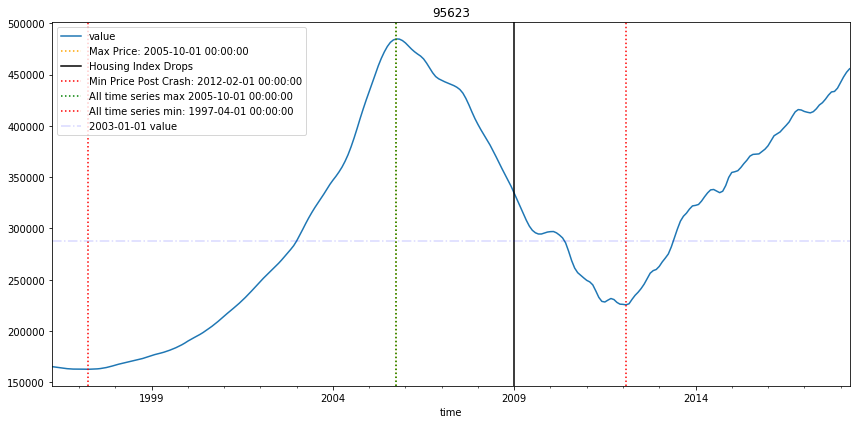

In [956]:
# fig, ax = plot_ts(df_melt, zipcodes=['95616', '92008', '90035', '90025', '60625', '57701'])  # enter desired zip code(s)

fig, ax = plot_ts_zips(df_melt, zipcodes=['95623'], figsize=(12,6))  # enter desired zip code(s)

In [ ]:
ts_95623

#### Boxplot of zip code

In [ ]:
ts_95623.boxplot(column = 'value')
plt.title('95623');


### Plot ACF and PACF for ts dataframe

In [ ]:
# plot_acf_pacf(ts, figsize=(10,6), lags=15)  # note that ts must only contain values and time as index

plot_acf_pacf(ts_95623_values, figsize=(10,6), lags=15)

### Plot seasonal decomposition for ts dataframe

In [ ]:
# plot_seasonal_decomp(ts)

plot_seasonal_decomp(ts_95623_values)

# Seasonality does not appear to be a significant factor in this zip code.

## ARIMA model parameters and optimization

### Generate list of (p,d,q) and (p,d,q,m) values

### Run ARIMA model on ts dataframe with list of p,d,q values 

In [ ]:
p_values = [0, 1, 2, 4, 6, 8]
d_values = range(0, 3)
q_values = range(0, 3)
warnings.filterwarnings("ignore")

In [ ]:
# eval_arima_models(ts, p_values, d_values, q_values)  # don't run this until you have some time, since it take time
# note that ts must only contain values and time as index

# eval_arima_models(ts_95623_values, p_values, d_values, q_values)  # don't run this until you have some time, since it takes time


### Generate model fit summary

In [1420]:
# model_fit = arima_zipcode(ts, order = None)   # change order = tuple to correspond to the best MSE produced by previous function

# Best ARIMA(6, 1, 2) MSE=2032900.464

model_fit_95623 = arima_zipcode(ts_95623_values, order = (6,1,2))


                             ARIMA Model Results                              
Dep. Variable:                    D.y   No. Observations:                  264
Model:                 ARIMA(6, 1, 2)   Log Likelihood               -2137.809
Method:                       css-mle   S.D. of innovations            785.964
Date:                Tue, 10 Mar 2020   AIC                           4295.619
Time:                        22:48:07   BIC                           4331.378
Sample:                             1   HQIC                          4309.988
                                                                              
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const       1100.0000   1234.743      0.891      0.374   -1320.052    3520.052
ar.L1.D.y      0.3530      0.073      4.804      0.000       0.209       0.497
ar.L2.D.y      0.3069      0.078      3.931      0.0

## ARIMA modeling results:  predictions and visualization

### Produce forecasts from ARIMA model fit

In [1422]:
actual_forecast_95623, std_error_95623, forecast_confint_95623 = forecast(model_fit_95623)


In [1423]:
actual_forecast_95623, std_error_95623, forecast_confint_95623

(array([456756.02888816, 457654.02736622, 459445.40556369, 461395.0064333 ,
        463412.40775467, 465485.89198931, 467305.86097438, 468982.5316643 ,
        470673.83638782, 472342.59029414, 473989.15143166, 475636.234293  ,
        477245.27850066, 478813.95339955, 480358.84309074, 481879.36903426,
        483375.71386639, 484854.53212876, 486313.40521529, 487751.97572817,
        489172.39322229, 490575.64912651, 491962.12167025, 493333.55332487]),
 array([  785.96392963,  2408.17801785,  4429.97694366,  6469.13252574,
         8575.04716936, 10687.73649131, 12835.13058727, 15048.51210912,
        17339.8523838 , 19677.19927726, 22055.74752781, 24457.90013174,
        26876.91710716, 29306.78959251, 31746.67535043, 34190.23949698,
        36635.32522144, 39077.54458685, 41514.3520261 , 43942.69360995,
        46361.0518104 , 48767.19055004, 51159.84116383, 53537.43960251]),
 array([[455215.56789294, 458296.48988337],
        [452934.08518287, 462373.96954957],
        [450762.8103

### Create dataframe to hold forecast results

In [1424]:
# df_forecast = forecast_df(col = 'time', daterange = pd.date_range(start='2018-05-01', end='2020-04-01', freq='MS'), 
#                 actual_forecast=actual_forecast, forecast_confint = forecast_confint)

df_forecast_95623 = forecast_df(actual_forecast_95623, forecast_confint_95623, col = 'time', daterange = pd.date_range(start='2018-05-01', end='2020-04-01', freq='MS'))

### Create new dataframe concatenating historic values and forecast results

In [1425]:
# df_new = concat_values_forecast(ts, df_forecast)

df_new_95623 = concat_values_forecast(ts_95623_values, df_forecast_95623)

In [1426]:
df_new_95623

,value,forecast,forecast_lower,forecast_upper
time,,,,
1996-04-01,165300.0,NaN,NaN,NaN
1996-05-01,164900.0,NaN,NaN,NaN
1996-06-01,164400.0,NaN,NaN,NaN
1996-07-01,164000.0,NaN,NaN,NaN
1996-08-01,163700.0,NaN,NaN,NaN
1996-09-01,163300.0,NaN,NaN,NaN
1996-10-01,163100.0,NaN,NaN,NaN
1996-11-01,162900.0,NaN,NaN,NaN
1996-12-01,162900.0,NaN,NaN,NaN


### Calculate predicted, lower bound, and upper bound forecasted prices

In [1427]:
forecasted_price_95623, forecasted_lower_95623, forecasted_upper_95623 = forecast_values(df_new_95623)

In [1428]:
forecasted_price_95623, forecasted_lower_95623, forecasted_upper_95623  # predicted, best-case, and worst-case prices in 2020


(493333.55332487123, 388402.0998794694, 598265.0067702731)

In [1429]:
last_value_95623 = df_new_95623['value'].loc['2018-04-01']

In [1430]:
last_value_95623

455700.0

### Plot forecast with confidence intervals

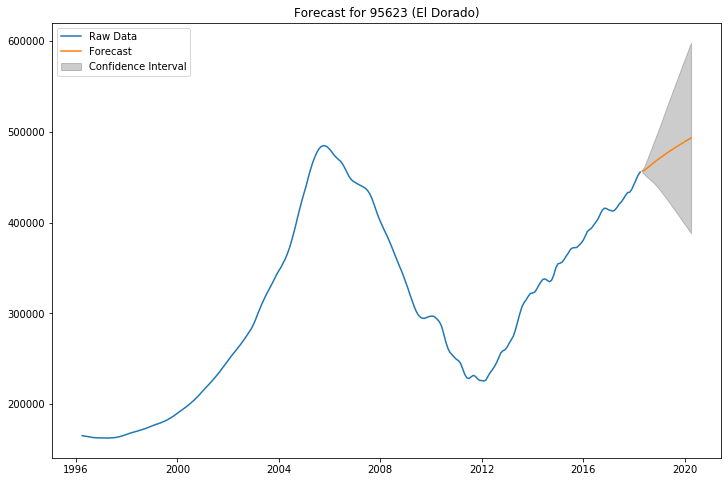

In [1431]:
# plot_forecast(df = df_new, figsize=(12,8), geog=None)

plot_forecast(df_new_95623, figsize=(12,8), geog='95623 (El Dorado)')

### Print summary of predicted, worst-case, and best-case scenarios

In [1432]:
eldorado_95623_pred, eldorado_95623_low, eldorado_95623_high = pred_best_worst(pred=forecasted_price_95623, low=forecasted_lower_95623, 
                                                                               high=forecasted_upper_95623, last=last_value_95623, date='April 1, 2020')
eldorado_95623_pred, eldorado_95623_low, eldorado_95623_high 

By the model prediction, I would expect to see a 8.258% change in price by April 1, 2020.
At the lower bound of the confidence interval, I would expect to see a -14.768% change in price by April 1, 2020.
At the upper bound of the confidence interval, I would expect to see a 31.285% change in price by April 1, 2020.


(8.258, -14.768, 31.285)

## Zip code 95623 (El Dorado):   Good investment opportunity

By the model prediction, I would expect to see a 8.258% change in price by April 1, 2020.
At the lower bound of the confidence interval, I would expect to see a -14.768% change in price by April 1, 2020.
At the upper bound of the confidence interval, I would expect to see a 31.285% change in price by April 1, 2020.

# SacMetro:  95747 (Roseville) -- Potential investment opportunity with more upside than downside potential

In [1433]:
geog_area = '95747'

In [1434]:
ts_95747 = df_sac.loc[df_sac['Zip'] == geog_area]  # ts for all of the following functions should have only one zipcode
ts_95747.head()


,Metro,MetroState,CountyName,City,Zip,SizeRank,value
time,,,,,,,
1996-04-01,Sacramento,Sacramento CA,Placer,Roseville,95747,243,192700.0
1996-05-01,Sacramento,Sacramento CA,Placer,Roseville,95747,243,193700.0
1996-06-01,Sacramento,Sacramento CA,Placer,Roseville,95747,243,195000.0
1996-07-01,Sacramento,Sacramento CA,Placer,Roseville,95747,243,196500.0
1996-08-01,Sacramento,Sacramento CA,Placer,Roseville,95747,243,198100.0


In [1435]:
ts_95747.tail()

,Metro,MetroState,CountyName,City,Zip,SizeRank,value
time,,,,,,,
2017-12-01,Sacramento,Sacramento CA,Placer,Roseville,95747,243,467200.0
2018-01-01,Sacramento,Sacramento CA,Placer,Roseville,95747,243,468100.0
2018-02-01,Sacramento,Sacramento CA,Placer,Roseville,95747,243,472400.0
2018-03-01,Sacramento,Sacramento CA,Placer,Roseville,95747,243,479300.0
2018-04-01,Sacramento,Sacramento CA,Placer,Roseville,95747,243,483800.0


In [1436]:
# ts = ts.value

ts_95747_values = ts_95747.value

In [1437]:
# ts.head()

ts_95747_values.head()

time
1996-04-01    192700.0
1996-05-01    193700.0
1996-06-01    195000.0
1996-07-01    196500.0
1996-08-01    198100.0
Name: value, dtype: float64

In [1438]:
ts_95747_values.tail()

time
2017-12-01    467200.0
2018-01-01    468100.0
2018-02-01    472400.0
2018-03-01    479300.0
2018-04-01    483800.0
Name: value, dtype: float64

### Visualizations

#### plot_ts:  Plot zip code(s) of interest over time, with market highs and lows

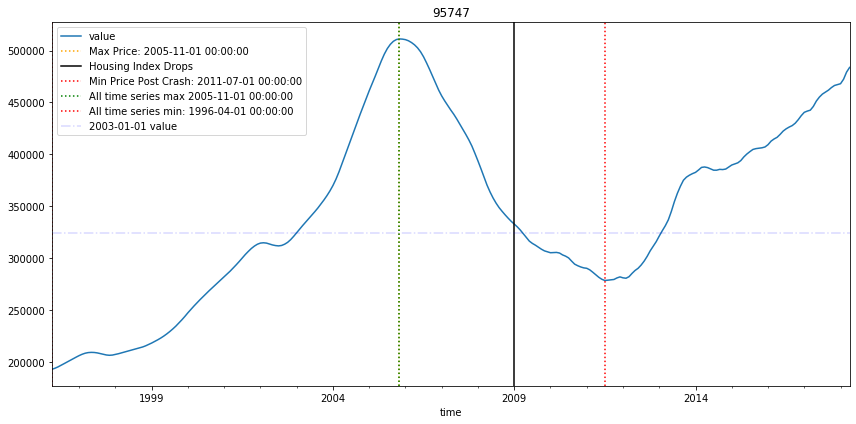

In [1439]:
# fig, ax = plot_ts(df_melt, zipcodes=['95616', '92008', '90035', '90025', '60625', '57701'])  # enter desired zip code(s)

fig, ax = plot_ts_zips(df_melt, zipcodes=['95747'], figsize=(12,6))  # enter desired zip code(s)

#### Boxplot of zip code

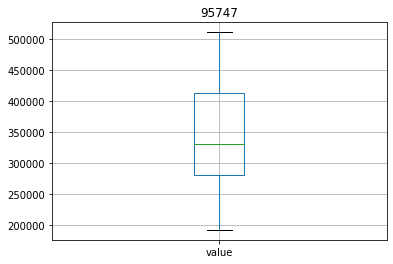

In [1440]:
ts_95747.boxplot(column = 'value')
plt.title('95747');


### Plot ACF and PACF for ts dataframe

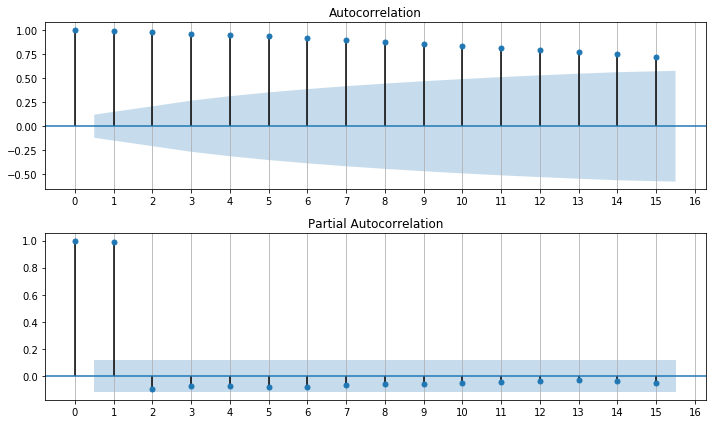

In [1441]:
# plot_acf_pacf(ts, figsize=(10,6), lags=15)  # note that ts must only contain values and time as index

plot_acf_pacf(ts_95747_values, figsize=(10,6), lags=15)

### Plot seasonal decomposition for ts dataframe

(<Figure size 1296x432 with 1 Axes>,
 <matplotlib.axes._subplots.AxesSubplot at 0x1cc33fabe0>)

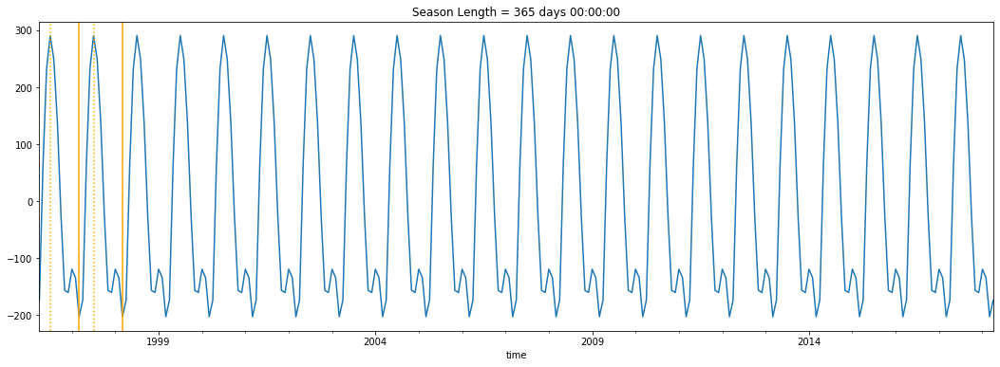

In [1442]:
# plot_seasonal_decomp(ts)

plot_seasonal_decomp(ts_95747_values)

# Seasonality does not appear to be a significant factor in this zip code.

## ARIMA model parameters and optimization

### Generate list of (p,d,q) and (p,d,q,m) values

In [1443]:
p_values = [0, 1, 2, 4, 6, 8]
d_values = range(0, 3)
q_values = range(0, 3)
warnings.filterwarnings("ignore")

### Run ARIMA model on ts dataframe with list of p,d,q values 

In [1444]:
# eval_arima_models(ts, p_values, d_values, q_values)  # don't run this until you have some time, since it take time
# note that ts must only contain values and time as index

# eval_arima_models(ts_95747_values, p_values, d_values, q_values)  # don't run this until you have some time, since it takes time


### Generate model fit summary

In [1445]:
# model_fit = arima_zipcode(ts, order = None)   # change order = tuple to correspond to the best MSE produced by previous function

# Best ARIMA(4, 1, 2) MSE=956941.458

model_fit_95747 = arima_zipcode(ts_95747_values, order = (4,1,2))


                             ARIMA Model Results                              
Dep. Variable:                    D.y   No. Observations:                  264
Model:                 ARIMA(4, 1, 2)   Log Likelihood               -2072.554
Method:                       css-mle   S.D. of innovations            613.648
Date:                Tue, 10 Mar 2020   AIC                           4161.108
Time:                        22:51:56   BIC                           4189.715
Sample:                             1   HQIC                          4172.603
                                                                              
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const        694.9195    282.164      2.463      0.014     141.889    1247.950
ar.L1.D.y      2.1792      0.097     22.416      0.000       1.989       2.370
ar.L2.D.y     -1.6973      0.243     -6.983      0.0

## ARIMA modeling results:  predictions and visualization

### Produce forecasts from ARIMA model fit

In [1446]:
actual_forecast_95747, std_error_95747, forecast_confint_95747 = forecast(model_fit_95747)


In [1447]:
actual_forecast_95747, std_error_95747, forecast_confint_95747

(array([485788.47886707, 487803.60041371, 490424.69855712, 492992.38635013,
        495188.0536989 , 497149.48859031, 499007.14402694, 500749.03027275,
        502335.17597917, 503763.91613752, 505050.67765103, 506202.91953545,
        507221.3109836 , 508107.71909395, 508866.54088292, 509502.50370563,
        510019.76771395, 510422.39959308, 510714.73755415, 510901.30915968,
        510986.68723202, 510975.47105242, 510872.31382675, 510681.92161165]),
 array([  613.64755285,  1751.72078376,  3080.50316699,  4468.75538562,
         5936.11460667,  7506.43677654,  9166.18164681, 10890.71047349,
        12664.09523346, 14477.07219438, 16320.97433968, 18186.61800165,
        20065.5087245 , 21950.27503764, 23834.32238968, 25711.5537101 ,
        27576.34040156, 29423.54199697, 31248.475334  , 33046.86654622,
        34814.81947508, 36548.79690556, 38245.60327413, 39902.36672457]),
 array([[484585.75176428, 486991.20596986],
        [484370.29076657, 491236.91006085],
        [484387.0232

### Create dataframe to hold forecast results

In [1448]:
# df_forecast = forecast_df(col = 'time', daterange = pd.date_range(start='2018-05-01', end='2020-04-01', freq='MS'), 
#                 actual_forecast=actual_forecast, forecast_confint = forecast_confint)

df_forecast_95747 = forecast_df(actual_forecast_95747, forecast_confint_95747, col = 'time', daterange = pd.date_range(start='2018-05-01', end='2020-04-01', freq='MS'))


### Create new dataframe concatenating historic values and forecast results

In [1449]:
# df_new = concat_values_forecast(ts, df_forecast)

df_new_95747 = concat_values_forecast(ts_95747_values, df_forecast_95747)

In [1450]:
df_new_95747

,value,forecast,forecast_lower,forecast_upper
time,,,,
1996-04-01,192700.0,NaN,NaN,NaN
1996-05-01,193700.0,NaN,NaN,NaN
1996-06-01,195000.0,NaN,NaN,NaN
1996-07-01,196500.0,NaN,NaN,NaN
1996-08-01,198100.0,NaN,NaN,NaN
1996-09-01,199700.0,NaN,NaN,NaN
1996-10-01,201300.0,NaN,NaN,NaN
1996-11-01,202800.0,NaN,NaN,NaN
1996-12-01,204400.0,NaN,NaN,NaN


### Calculate predicted, lower bound, and upper bound forecasted prices

In [1451]:
forecasted_price_95747, forecasted_lower_95747, forecasted_upper_95747 = forecast_values(df_new_95747)

In [1452]:
forecasted_price_95747, forecasted_lower_95747, forecasted_upper_95747  # predicted, best-case, and worst-case prices in 2020


(510681.9216116455, 432474.71993358084, 588889.1232897101)

In [1453]:
last_value_95747 = df_new_95747['value'].loc['2018-04-01']

In [1454]:
last_value_95747

483800.0

### Plot forecast with confidence intervals

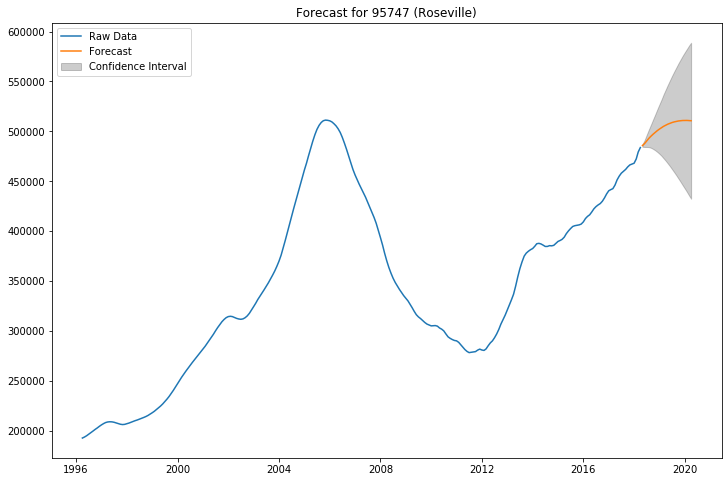

In [1455]:
# plot_forecast(df = df_new, figsize=(12,8), geog=None)

plot_forecast(df_new_95747, figsize=(12,8), geog='95747 (Roseville)')

### Print summary of predicted, worst-case, and best-case scenarios

In [1456]:
roseville_95747_pred, roseville_95747_low, roseville_95747_high = pred_best_worst(pred=forecasted_price_95747, low=forecasted_lower_95747, 
                                                                                  high=forecasted_upper_95747, last=last_value_95747, date='April 1, 2020')
roseville_95747_pred, roseville_95747_low, roseville_95747_high 

By the model prediction, I would expect to see a 5.556% change in price by April 1, 2020.
At the lower bound of the confidence interval, I would expect to see a -10.609% change in price by April 1, 2020.
At the upper bound of the confidence interval, I would expect to see a 21.722% change in price by April 1, 2020.


(5.556, -10.609, 21.722)

## Zip code 95747 (Roseville):  Potential opportunity, with mediocre predicted returns but more upside than downside

By the model prediction, I would expect to see a 5.556% change in price by April 1, 2020.
At the lower bound of the confidence interval, I would expect to see a -10.609% change in price by April 1, 2020.
At the upper bound of the confidence interval, I would expect to see a 21.722% change in price by April 1, 2020.

# SacMetro:  95765 (Rocklin) -- Solid investment opportunity with minimal downside risk

In [1457]:
geog_area = '95765'

In [1458]:
ts_95765 = df_sac.loc[df_sac['Zip'] == geog_area]  # ts for all of the following functions should have only one zipcode
ts_95765.head()


,Metro,MetroState,CountyName,City,Zip,SizeRank,value
time,,,,,,,
1996-04-01,Sacramento,Sacramento CA,Placer,Rocklin,95765,2550,192600.0
1996-05-01,Sacramento,Sacramento CA,Placer,Rocklin,95765,2550,192300.0
1996-06-01,Sacramento,Sacramento CA,Placer,Rocklin,95765,2550,191900.0
1996-07-01,Sacramento,Sacramento CA,Placer,Rocklin,95765,2550,191400.0
1996-08-01,Sacramento,Sacramento CA,Placer,Rocklin,95765,2550,190900.0


In [1462]:
ts_95765.tail()

,Metro,MetroState,CountyName,City,Zip,SizeRank,value
time,,,,,,,
2017-12-01,Sacramento,Sacramento CA,Placer,Rocklin,95765,2550,493200.0
2018-01-01,Sacramento,Sacramento CA,Placer,Rocklin,95765,2550,494000.0
2018-02-01,Sacramento,Sacramento CA,Placer,Rocklin,95765,2550,497600.0
2018-03-01,Sacramento,Sacramento CA,Placer,Rocklin,95765,2550,504000.0
2018-04-01,Sacramento,Sacramento CA,Placer,Rocklin,95765,2550,509200.0


In [1463]:
# ts = ts.value

ts_95765_values = ts_95765.value

In [1464]:
ts_95765_values.head()

time
1996-04-01    192600.0
1996-05-01    192300.0
1996-06-01    191900.0
1996-07-01    191400.0
1996-08-01    190900.0
Name: value, dtype: float64

In [1465]:
ts_95765_values.tail()

time
2017-12-01    493200.0
2018-01-01    494000.0
2018-02-01    497600.0
2018-03-01    504000.0
2018-04-01    509200.0
Name: value, dtype: float64

### Visualizations

#### plot_ts:  Plot zip code(s) of interest over time, with market highs and lows

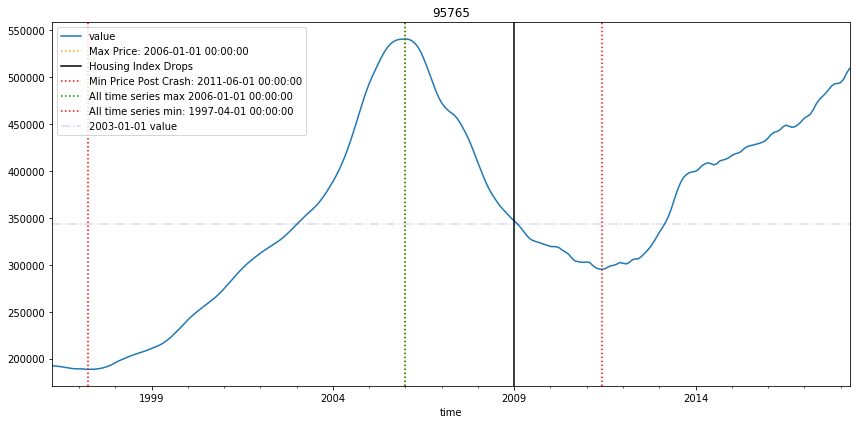

In [1466]:
# fig, ax = plot_ts(df_melt, zipcodes=['95616', '92008', '90035', '90025', '60625', '57701'])  # enter desired zip code(s)

fig, ax = plot_ts_zips(df_melt, zipcodes=['95765'], figsize=(12,6))  # enter desired zip code(s)

In [1467]:
ts_95765.head(3)

,Metro,MetroState,CountyName,City,Zip,SizeRank,value
time,,,,,,,
1996-04-01,Sacramento,Sacramento CA,Placer,Rocklin,95765,2550,192600.0
1996-05-01,Sacramento,Sacramento CA,Placer,Rocklin,95765,2550,192300.0
1996-06-01,Sacramento,Sacramento CA,Placer,Rocklin,95765,2550,191900.0


#### Boxplot of zip code

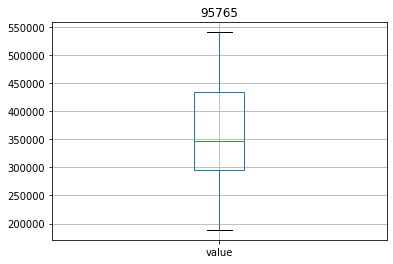

In [1468]:
ts_95765.boxplot(column = 'value')
plt.title('95765');


### Plot ACF and PACF for ts dataframe

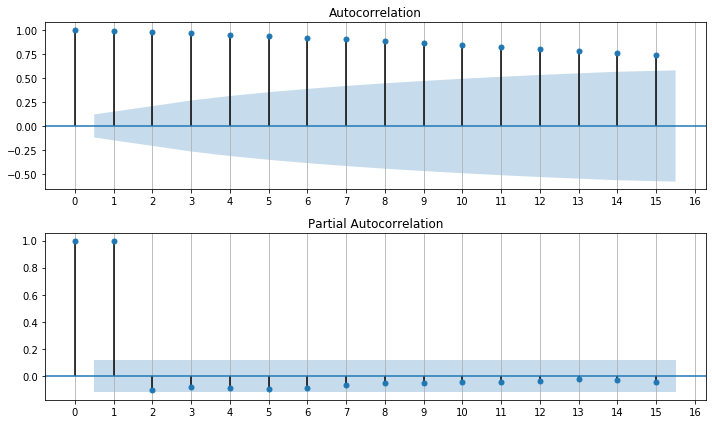

In [1469]:
# plot_acf_pacf(ts, figsize=(10,6), lags=15)  # note that ts must only contain values and time as index

plot_acf_pacf(ts_95765_values, figsize=(10,6), lags=15)

### Plot seasonal decomposition for ts dataframe

(<Figure size 1296x432 with 1 Axes>,
 <matplotlib.axes._subplots.AxesSubplot at 0x1aab74b4a8>)

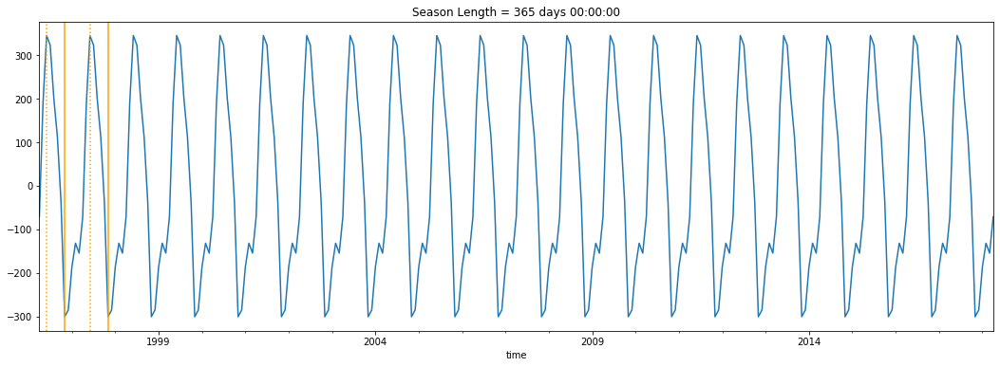

In [1470]:
# plot_seasonal_decomp(ts)

plot_seasonal_decomp(ts_95765_values)

# Seasonality does not appear to be a significant factor in this zip code.

## ARIMA model parameters and optimization

### Generate list of (p,d,q) and (p,d,q,m) values

In [1471]:
p_values = [0, 1, 2, 4, 6, 8]
d_values = range(0, 3)
q_values = range(0, 3)
warnings.filterwarnings("ignore")

### Run ARIMA model on ts dataframe with list of p,d,q values 

In [1472]:
# eval_arima_models(ts, p_values, d_values, q_values)  # don't run this until you have some time, since it take time
# note that ts must only contain values and time as index

# eval_arima_models(ts_95765_values, p_values, d_values, q_values)  # don't run this until you have some time, since it takes time


### Generate model fit summary

In [1473]:
# model_fit = arima_zipcode(ts, order = None)   # change order = tuple to correspond to the best MSE produced by previous function

# Best ARIMA(4, 1, 2) MSE=958549.703

model_fit_95765 = arima_zipcode(ts_95765_values, order = (4,1,2))


                             ARIMA Model Results                              
Dep. Variable:                    D.y   No. Observations:                  264
Model:                 ARIMA(4, 1, 2)   Log Likelihood               -2097.489
Method:                       css-mle   S.D. of innovations            676.112
Date:                Tue, 10 Mar 2020   AIC                           4210.978
Time:                        22:54:45   BIC                           4239.586
Sample:                             1   HQIC                          4222.474
                                                                              
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const       1199.2430   1403.669      0.854      0.394   -1551.898    3950.384
ar.L1.D.y      0.3081      0.082      3.752      0.000       0.147       0.469
ar.L2.D.y      0.3689      0.111      3.327      0.0

## ARIMA modeling results:  predictions and visualization

### Produce forecasts from ARIMA model fit

In [1474]:
actual_forecast_95765, std_error_95765, forecast_confint_95765 = forecast(model_fit_95765)


In [1475]:
actual_forecast_95765, std_error_95765, forecast_confint_95765

(array([512007.82209569, 514645.9423443 , 518005.14663979, 521153.68306293,
        524112.88391448, 526963.75925139, 529809.3173371 , 532565.71533697,
        535254.60988239, 537872.31842107, 540435.61722701, 542936.71906849,
        545382.55320667, 547773.06866239, 550112.8652202 , 552402.63574923,
        554645.38034614, 556842.61849099, 558996.70338891, 561109.25664141,
        563182.2342693 , 565217.25476067, 567216.03227637, 569180.09574197]),
 array([  676.11247351,  2021.74479184,  3654.93249615,  5345.27397848,
         7173.46267951,  9132.53968065, 11203.62140683, 13355.65358137,
        15580.9229946 , 17867.28867012, 20206.12772527, 22587.75780721,
        25005.57664935, 27453.0000226 , 29924.68830679, 32415.60413411,
        34921.52695317, 37438.58855048, 39963.43046522, 42493.01297454,
        45024.66217975, 47555.97353492, 50084.81469356, 52609.27478067]),
 array([[510682.6659981 , 513332.97819327],
        [510683.39536637, 518608.48932223],
        [510841.6105

### Create dataframe to hold forecast results

In [1477]:
# df_forecast = forecast_df(col = 'time', daterange = pd.date_range(start='2018-05-01', end='2020-04-01', freq='MS'), 
#                 actual_forecast=actual_forecast, forecast_confint = forecast_confint)

df_forecast_95765 = forecast_df(actual_forecast_95765, forecast_confint_95765, col = 'time', 
                                daterange = pd.date_range(start='2018-05-01', end='2020-04-01', freq='MS'))

### Create new dataframe concatenating historic values and forecast results

In [1478]:
# df_new = concat_values_forecast(ts, df_forecast)

df_new_95765 = concat_values_forecast(ts_95765_values, df_forecast_95765)

In [1479]:
df_new_95765

,value,forecast,forecast_lower,forecast_upper
time,,,,
1996-04-01,192600.0,NaN,NaN,NaN
1996-05-01,192300.0,NaN,NaN,NaN
1996-06-01,191900.0,NaN,NaN,NaN
1996-07-01,191400.0,NaN,NaN,NaN
1996-08-01,190900.0,NaN,NaN,NaN
1996-09-01,190400.0,NaN,NaN,NaN
1996-10-01,189900.0,NaN,NaN,NaN
1996-11-01,189400.0,NaN,NaN,NaN
1996-12-01,189200.0,NaN,NaN,NaN


### Calculate predicted, lower bound, and upper bound forecasted prices

In [1480]:
forecasted_price_95765, forecasted_lower_95765, forecasted_upper_95765 = forecast_values(df_new_95765)

In [1481]:
forecasted_price_95765, forecasted_lower_95765, forecasted_upper_95765  # predicted, best-case, and worst-case prices in 2020

(569180.0957419735, 466067.81191909756, 672292.3795648494)

In [1482]:
last_value_95765 = df_new_95765['value'].loc['2018-04-01']

In [1483]:
last_value_95765

509200.0

### Plot forecast with confidence intervals

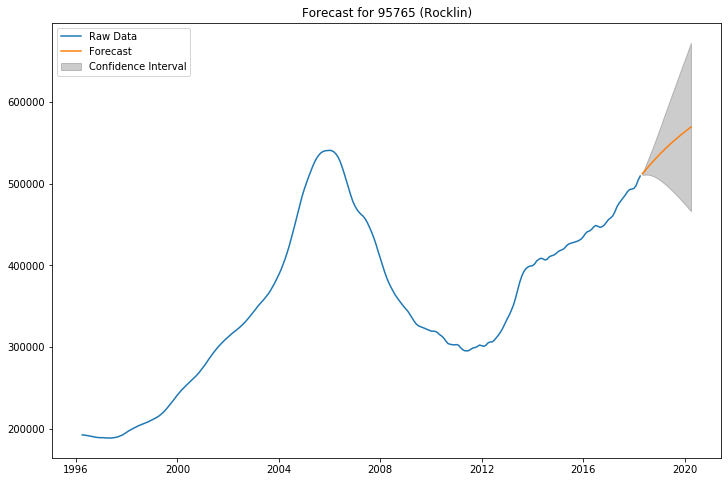

In [1484]:
# plot_forecast(df = df_new, figsize=(12,8), geog=None)

plot_forecast(df_new_95765, figsize=(12,8), geog='95765 (Rocklin)')

### Print summary of predicted, worst-case, and best-case scenarios

In [1485]:
rocklin_95765_pred, rocklin_95765_low, rocklin_95765_high = pred_best_worst(pred=forecasted_price_95765, low=forecasted_lower_95765, 
                                                                            high=forecasted_upper_95765, last=last_value_95765, date='April 1, 2020')
rocklin_95765_pred, rocklin_95765_low, rocklin_95765_high 

By the model prediction, I would expect to see a 11.779% change in price by April 1, 2020.
At the lower bound of the confidence interval, I would expect to see a -8.471% change in price by April 1, 2020.
At the upper bound of the confidence interval, I would expect to see a 32.029% change in price by April 1, 2020.


(11.779, -8.471, 32.029)

## Zip code 95765 (Rocklin):  Solid investment opportunity with minimal downside

By the model prediction, I would expect to see a 11.779% change in price by April 1, 2020.
At the lower bound of the confidence interval, I would expect to see a -8.471% change in price by April 1, 2020.
At the upper bound of the confidence interval, I would expect to see a 32.029% change in price by April 1, 2020.


# SacMetro:  95602 (Auburn) -- Strong investment opportunity with minimal downside

In [1486]:
geog_area = '95602'

In [1487]:
ts_95602 = df_sac.loc[df_sac['Zip'] == geog_area]  # ts for all of the following functions should have only one zipcode
ts_95602.head()


,Metro,MetroState,CountyName,City,Zip,SizeRank,value
time,,,,,,,
1996-04-01,Sacramento,Sacramento CA,Placer,Auburn,95602,6185,184300.0
1996-05-01,Sacramento,Sacramento CA,Placer,Auburn,95602,6185,184000.0
1996-06-01,Sacramento,Sacramento CA,Placer,Auburn,95602,6185,183700.0
1996-07-01,Sacramento,Sacramento CA,Placer,Auburn,95602,6185,183500.0
1996-08-01,Sacramento,Sacramento CA,Placer,Auburn,95602,6185,183300.0


In [1488]:
ts_95602.tail()

,Metro,MetroState,CountyName,City,Zip,SizeRank,value
time,,,,,,,
2017-12-01,Sacramento,Sacramento CA,Placer,Auburn,95602,6185,470800.0
2018-01-01,Sacramento,Sacramento CA,Placer,Auburn,95602,6185,474100.0
2018-02-01,Sacramento,Sacramento CA,Placer,Auburn,95602,6185,478600.0
2018-03-01,Sacramento,Sacramento CA,Placer,Auburn,95602,6185,484300.0
2018-04-01,Sacramento,Sacramento CA,Placer,Auburn,95602,6185,488700.0


In [1492]:
# ts = ts.value

ts_95602_values = ts_95602.value

In [1493]:
# ts.head()

ts_95602_values.head()

time
1996-04-01    184300.0
1996-05-01    184000.0
1996-06-01    183700.0
1996-07-01    183500.0
1996-08-01    183300.0
Name: value, dtype: float64

In [1494]:
ts_95602_values.tail()

time
2017-12-01    470800.0
2018-01-01    474100.0
2018-02-01    478600.0
2018-03-01    484300.0
2018-04-01    488700.0
Name: value, dtype: float64

### Visualizations

#### plot_ts:  Plot zip code(s) of interest over time, with market highs and lows

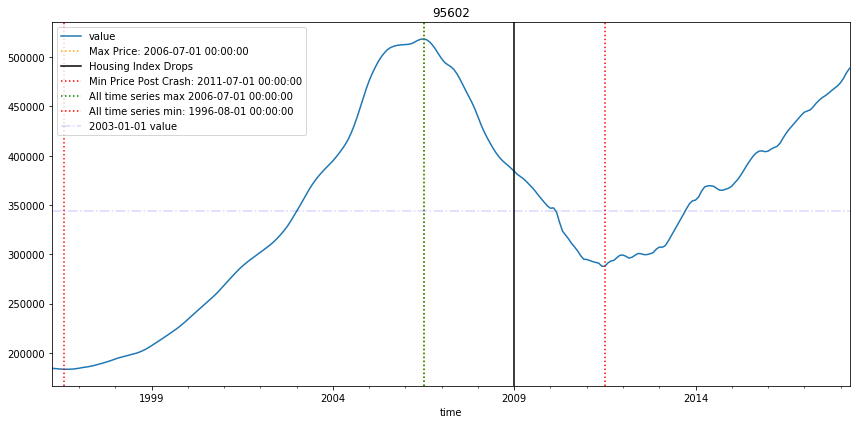

In [1495]:
# fig, ax = plot_ts(df_melt, zipcodes=['95616', '92008', '90035', '90025', '60625', '57701'])  # enter desired zip code(s)

fig, ax = plot_ts_zips(df_melt, zipcodes=['95602'], figsize=(12,6))  # enter desired zip code(s)

In [1496]:
ts_95602.head(3)

,Metro,MetroState,CountyName,City,Zip,SizeRank,value
time,,,,,,,
1996-04-01,Sacramento,Sacramento CA,Placer,Auburn,95602,6185,184300.0
1996-05-01,Sacramento,Sacramento CA,Placer,Auburn,95602,6185,184000.0
1996-06-01,Sacramento,Sacramento CA,Placer,Auburn,95602,6185,183700.0


#### Boxplot of zip code

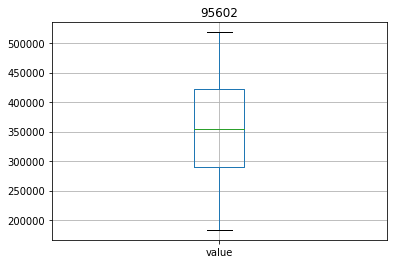

In [1497]:
ts_95602.boxplot(column = 'value')
plt.title('95602');


### Plot ACF and PACF for ts dataframe

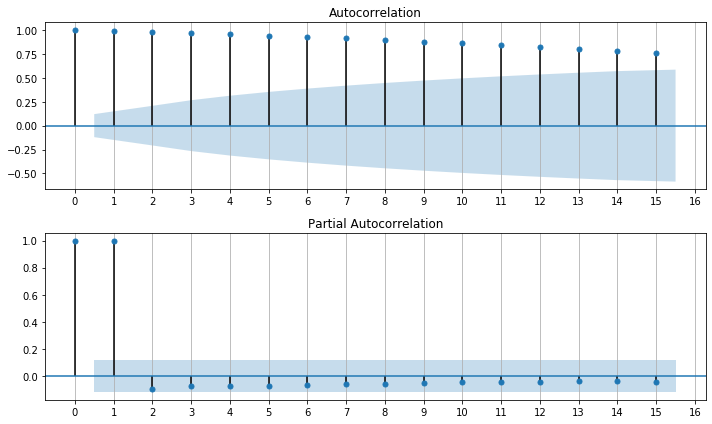

In [1498]:
# plot_acf_pacf(ts, figsize=(10,6), lags=15)  # note that ts must only contain values and time as index

plot_acf_pacf(ts_95602_values, figsize=(10,6), lags=15)

### Plot seasonal decomposition for ts dataframe

(<Figure size 1296x432 with 1 Axes>,
 <matplotlib.axes._subplots.AxesSubplot at 0x1aab6f58d0>)

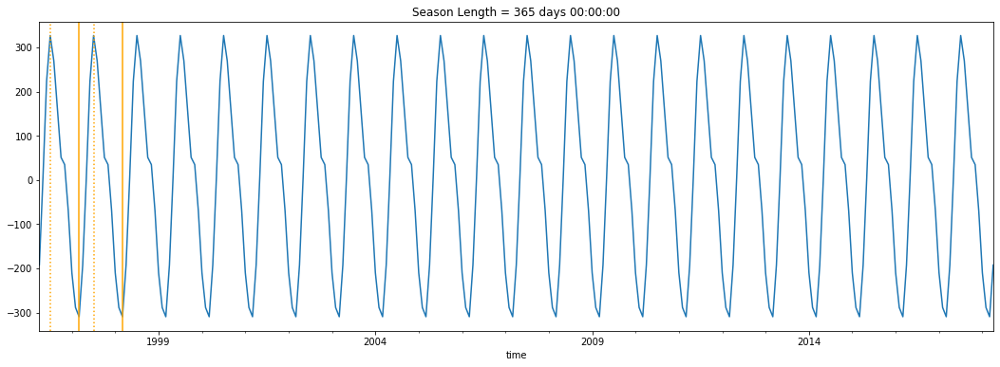

In [1499]:
# plot_seasonal_decomp(ts)

plot_seasonal_decomp(ts_95602_values)

# Seasonality does not appear to be a significant factor in this zip code.

## ARIMA model parameters and optimization

### Generate list of (p,d,q) and (p,d,q,m) values

In [1500]:
p_values = [0, 1, 2, 4, 6, 8]
d_values = range(0, 3)
q_values = range(0, 3)
warnings.filterwarnings("ignore")

### Run ARIMA model on ts dataframe with list of p,d,q values 

In [1501]:
# eval_arima_models(ts, p_values, d_values, q_values)  # don't run this until you have some time, since it take time
# note that ts must only contain values and time as index

# eval_arima_models(ts_95602_values, p_values, d_values, q_values)  # don't run this until you have some time, since it takes time


### Generate model fit summary

In [1502]:
# model_fit = arima_zipcode(ts, order = None)   # change order = tuple to correspond to the best MSE produced by previous function

# Best ARIMA(4, 0, 2) MSE=584168.034

model_fit_95602 = arima_zipcode(ts_95602_values, order = (4,1,2))


                             ARIMA Model Results                              
Dep. Variable:                    D.y   No. Observations:                  264
Model:                 ARIMA(4, 1, 2)   Log Likelihood               -2141.289
Method:                       css-mle   S.D. of innovations            797.991
Date:                Tue, 10 Mar 2020   AIC                           4298.578
Time:                        22:57:10   BIC                           4327.185
Sample:                             1   HQIC                          4310.073
                                                                              
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const       1197.1905   1154.299      1.037      0.301   -1065.195    3459.576
ar.L1.D.y      0.1396      0.076      1.835      0.068      -0.010       0.289
ar.L2.D.y      0.2666      0.076      3.491      0.0

## ARIMA modeling results:  predictions and visualization

### Produce forecasts from ARIMA model fit

In [1504]:
actual_forecast_95602, std_error_95602, forecast_confint_95602 = forecast(model_fit_95602)


In [1505]:
actual_forecast_95602, std_error_95602, forecast_confint_95602

(array([491440.29052556, 494314.53287759, 497891.96474734, 500916.07789598,
        503744.26189492, 506603.28735082, 509418.22510595, 512072.16357087,
        514659.54110644, 517189.84726598, 519644.59202188, 522023.70491649,
        524344.00663971, 526605.08350708, 528807.55526963, 530955.64779549,
        533053.45856594, 535102.75848479, 537106.08548381, 539066.17073443,
        540985.36077654, 542865.71761363, 544709.36717265, 546518.31053564]),
 array([  797.9913192 ,  2288.52884549,  3945.93125293,  5565.74166521,
         7359.16813669,  9293.38164709, 11302.09543762, 13367.54618994,
        15496.48467147, 17671.37370136, 19879.36253193, 22114.34055499,
        24370.89163778, 26642.05815934, 28922.80813553, 31209.13806025,
        33497.32162811, 35783.98722584, 38066.3707441 , 40342.06407742,
        42608.9399555 , 44865.15990349, 47109.15266799, 49339.55696724]),
 array([[489876.25627995, 493004.32477117],
        [489829.09876285, 498799.96699234],
        [490158.0816

### Create dataframe to hold forecast results

In [1507]:
# df_forecast = forecast_df(col = 'time', daterange = pd.date_range(start='2018-05-01', end='2020-04-01', freq='MS'), 
#                 actual_forecast=actual_forecast, forecast_confint = forecast_confint)

df_forecast_95602 = forecast_df(actual_forecast_95602, forecast_confint_95602, col = 'time', 
                                daterange = pd.date_range(start='2018-05-01', end='2020-04-01', freq='MS'))

### Create new dataframe concatenating historic values and forecast results

In [1508]:
# df_new = concat_values_forecast(ts, df_forecast)

df_new_95602 = concat_values_forecast(ts_95602_values, df_forecast_95602)

In [1509]:
df_new_95602

,value,forecast,forecast_lower,forecast_upper
time,,,,
1996-04-01,184300.0,NaN,NaN,NaN
1996-05-01,184000.0,NaN,NaN,NaN
1996-06-01,183700.0,NaN,NaN,NaN
1996-07-01,183500.0,NaN,NaN,NaN
1996-08-01,183300.0,NaN,NaN,NaN
1996-09-01,183300.0,NaN,NaN,NaN
1996-10-01,183400.0,NaN,NaN,NaN
1996-11-01,183500.0,NaN,NaN,NaN
1996-12-01,183900.0,NaN,NaN,NaN


### Calculate predicted, lower bound, and upper bound forecasted prices

In [1511]:
forecasted_price_95602, forecasted_lower_95602, forecasted_upper_95602 = forecast_values(df_new_95602)

In [1512]:
forecasted_price_95602, forecasted_lower_95602, forecasted_upper_95602  # predicted, best-case, and worst-case prices in 2020


(546518.3105356371, 449814.5558666845, 643222.0652045896)

In [1513]:
last_value_95602 = df_new_95602['value'].loc['2018-04-01']

In [1514]:
last_value_95602

488700.0

### Plot forecast with confidence intervals

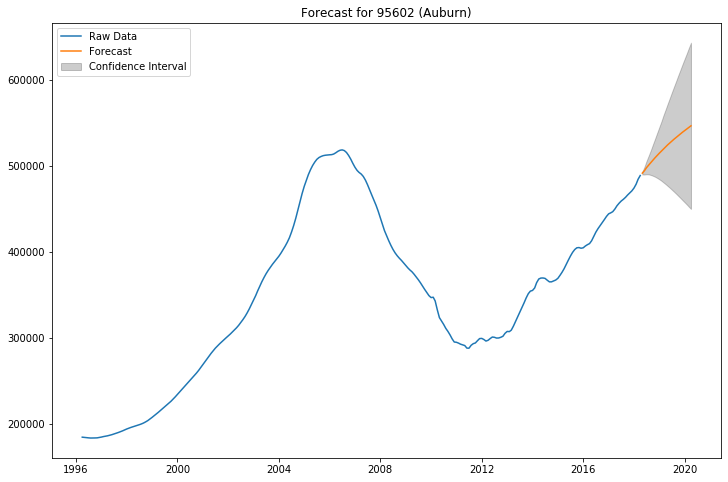

In [1515]:
# plot_forecast(df = df_new, figsize=(12,8), geog=None)

plot_forecast(df_new_95602, figsize=(12,8), geog='95602 (Auburn)')

### Print summary of predicted, worst-case, and best-case scenarios

In [1516]:
auburn_95602_pred, auburn_95602_low, auburn_95602_high = pred_best_worst(pred=forecasted_price_95602, low=forecasted_lower_95602, 
                                                                         high=forecasted_upper_95602, last=last_value_95602, date='April 1, 2020')
auburn_95602_pred, auburn_95602_low, auburn_95602_high 

By the model prediction, I would expect to see a 11.831% change in price by April 1, 2020.
At the lower bound of the confidence interval, I would expect to see a -7.957% change in price by April 1, 2020.
At the upper bound of the confidence interval, I would expect to see a 31.619% change in price by April 1, 2020.


(11.831, -7.957, 31.619)

## Zip code 95602 (Auburn):  Strong investment opportunity with minimal downside

By the model prediction, I would expect to see a 11.831% change in price by April 1, 2020.
At the lower bound of the confidence interval, I would expect to see a -7.957% change in price by April 1, 2020.
At the upper bound of the confidence interval, I would expect to see a 31.619% change in price by April 1, 2020.

# SacMetro:  96150 (South Lake Tahoe) -- 

In [374]:
geog_area = '96150'

In [375]:
ts_96150 = df_sac.loc[df_sac['Zip'] == geog_area]  # ts for all of the following functions should have only one zipcode
ts_96150.head()


,Metro,MetroState,CountyName,City,Zip,SizeRank,value
time,,,,,,,
1996-04-01,Sacramento,Sacramento CA,El Dorado,South Lake Tahoe,96150,5493,132800.0
1996-05-01,Sacramento,Sacramento CA,El Dorado,South Lake Tahoe,96150,5493,132500.0
1996-06-01,Sacramento,Sacramento CA,El Dorado,South Lake Tahoe,96150,5493,132400.0
1996-07-01,Sacramento,Sacramento CA,El Dorado,South Lake Tahoe,96150,5493,132400.0
1996-08-01,Sacramento,Sacramento CA,El Dorado,South Lake Tahoe,96150,5493,132600.0


In [376]:
ts_96150.tail()

,Metro,MetroState,CountyName,City,Zip,SizeRank,value
time,,,,,,,
2017-12-01,Sacramento,Sacramento CA,El Dorado,South Lake Tahoe,96150,5493,412900.0
2018-01-01,Sacramento,Sacramento CA,El Dorado,South Lake Tahoe,96150,5493,417500.0
2018-02-01,Sacramento,Sacramento CA,El Dorado,South Lake Tahoe,96150,5493,422700.0
2018-03-01,Sacramento,Sacramento CA,El Dorado,South Lake Tahoe,96150,5493,428200.0
2018-04-01,Sacramento,Sacramento CA,El Dorado,South Lake Tahoe,96150,5493,432500.0


In [377]:
# ts = ts.value

ts_96150_values = ts_96150.value

In [378]:
# ts.head()

ts_96150_values.head()

time
1996-04-01    132800.0
1996-05-01    132500.0
1996-06-01    132400.0
1996-07-01    132400.0
1996-08-01    132600.0
Name: value, dtype: float64

In [379]:
ts_96150_values.tail()

time
2017-12-01    412900.0
2018-01-01    417500.0
2018-02-01    422700.0
2018-03-01    428200.0
2018-04-01    432500.0
Name: value, dtype: float64

### Visualizations

#### plot_ts:  Plot zip code(s) of interest over time, with market highs and lows

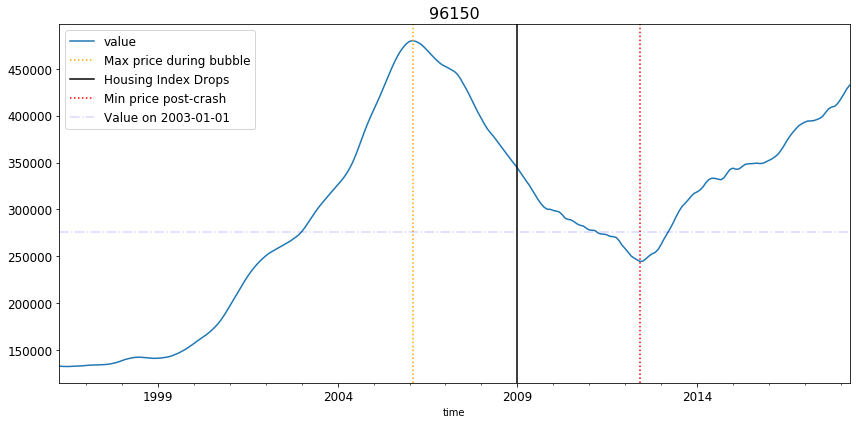

In [380]:
# fig, ax = plot_ts(df_melt, zipcodes=['95616', '92008', '90035', '90025', '60625', '57701'])  # enter desired zip code(s)

fig, ax = plot_ts_zips(df_melt, zipcodes=['96150'], figsize=(12,6))  # enter desired zip code(s)

In [381]:
ts_96150.head(3)

,Metro,MetroState,CountyName,City,Zip,SizeRank,value
time,,,,,,,
1996-04-01,Sacramento,Sacramento CA,El Dorado,South Lake Tahoe,96150,5493,132800.0
1996-05-01,Sacramento,Sacramento CA,El Dorado,South Lake Tahoe,96150,5493,132500.0
1996-06-01,Sacramento,Sacramento CA,El Dorado,South Lake Tahoe,96150,5493,132400.0


#### Boxplot of zip code

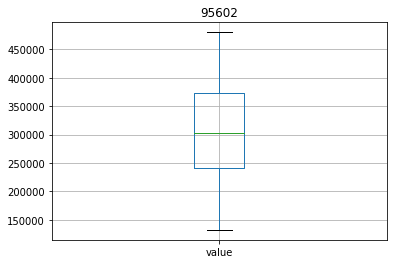

In [382]:
ts_96150.boxplot(column = 'value')
plt.title('95602');


### Plot ACF and PACF for ts dataframe

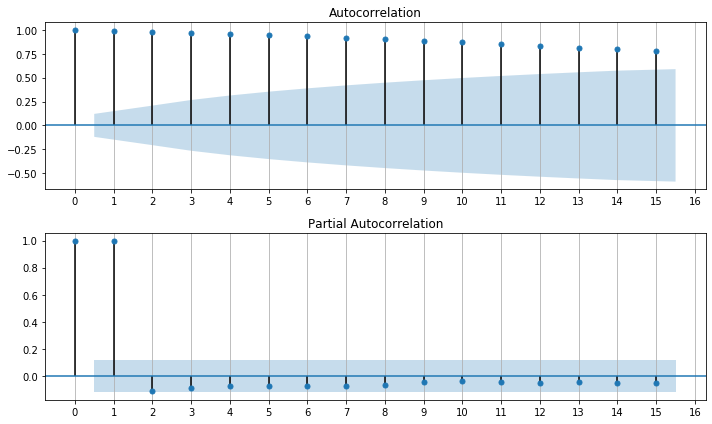

In [401]:
# plot_acf_pacf(ts, figsize=(10,6), lags=15)  # note that ts must only contain values and time as index

plot_acf_pacf(ts_96150_values, figsize=(10,6), lags=15)

### Plot seasonal decomposition for ts dataframe

(<Figure size 1296x432 with 1 Axes>,
 <matplotlib.axes._subplots.AxesSubplot at 0x1ae1b0f2e8>)

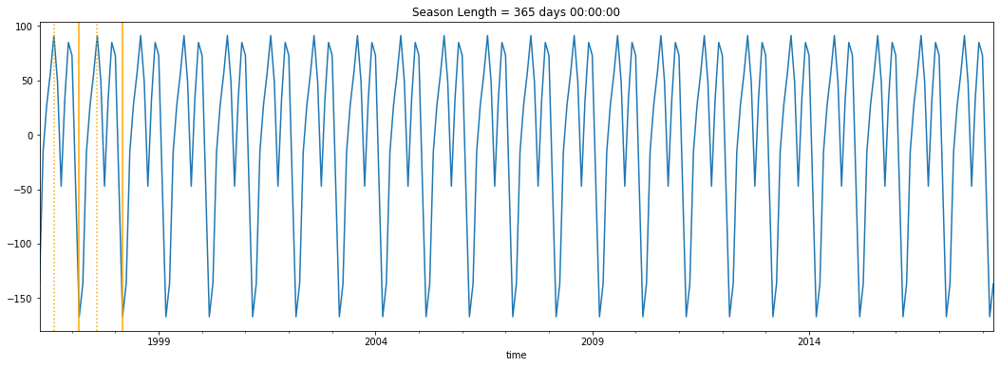

In [403]:
# plot_seasonal_decomp(ts)

plot_seasonal_decomp(ts_96150_values)

# Seasonality does not appear to be a significant factor in this zip code.

## ARIMA model parameters and optimization

### Generate list of (p,d,q) and (p,d,q,m) values

In [404]:
p_values = [0, 1, 2, 4, 6, 8]
d_values = range(0, 3)
q_values = range(0, 3)
warnings.filterwarnings("ignore")

### Run ARIMA model on ts dataframe with list of p,d,q values 

In [405]:
# eval_arima_models(ts, p_values, d_values, q_values)  # don't run this until you have some time, since it take time
# note that ts must only contain values and time as index

# eval_arima_models(ts_96150_values, p_values, d_values, q_values)  # don't run this until you have some time, since it takes time


ARIMA(0, 0, 0) MSE=8446541841.004
ARIMA(0, 0, 1) MSE=2173894948.223
ARIMA(0, 1, 0) MSE=4685401.589
ARIMA(0, 1, 1) MSE=1808356.686
ARIMA(0, 2, 0) MSE=1390664.479
ARIMA(0, 2, 1) MSE=972086.288
ARIMA(0, 2, 2) MSE=986327.067
ARIMA(1, 0, 0) MSE=8252202.676
ARIMA(1, 1, 0) MSE=1353593.894
ARIMA(1, 1, 1) MSE=925082.456
ARIMA(1, 1, 2) MSE=917220.727
ARIMA(1, 2, 0) MSE=1222852.802
ARIMA(1, 2, 1) MSE=977210.676
ARIMA(1, 2, 2) MSE=753254.590
ARIMA(2, 0, 0) MSE=1386046.611
ARIMA(2, 0, 1) MSE=947470.640
ARIMA(2, 0, 2) MSE=951213.719
ARIMA(2, 1, 0) MSE=1151377.762
ARIMA(2, 1, 1) MSE=923555.223
ARIMA(2, 1, 2) MSE=700451.029
ARIMA(2, 2, 0) MSE=799254.337
ARIMA(2, 2, 1) MSE=817548.634
ARIMA(2, 2, 2) MSE=730432.238
ARIMA(4, 0, 0) MSE=807966.950
ARIMA(4, 0, 1) MSE=818053.771
ARIMA(4, 0, 2) MSE=715703.339
ARIMA(4, 1, 0) MSE=885476.704
ARIMA(4, 1, 1) MSE=890665.481
ARIMA(4, 1, 2) MSE=835976.304
ARIMA(4, 2, 0) MSE=912331.029
ARIMA(4, 2, 1) MSE=908261.266
ARIMA(4, 2, 2) MSE=732602.867
ARIMA(6, 0, 0) MSE=90477

### Generate model fit summary

In [407]:
# model_fit = arima_zipcode(ts, order = None)   # change order = tuple to correspond to the best MSE produced by previous function

# Best ARIMA(2, 1, 2) MSE=700451.029

model_fit_96150 = arima_zipcode(ts_96150_values, order = (2,1,2))


                             ARIMA Model Results                              
Dep. Variable:                    D.y   No. Observations:                  264
Model:                 ARIMA(2, 1, 2)   Log Likelihood               -2087.931
Method:                       css-mle   S.D. of innovations            649.755
Date:                Wed, 11 Mar 2020   AIC                           4187.862
Time:                        23:49:57   BIC                           4209.317
Sample:                             1   HQIC                          4196.483
                                                                              
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const       1105.7117    969.898      1.140      0.255    -795.254    3006.678
ar.L1.D.y      0.2575      0.054      4.770      0.000       0.152       0.363
ar.L2.D.y      0.6000      0.054     11.027      0.0

## ARIMA modeling results:  predictions and visualization

### Produce forecasts from ARIMA model fit

In [408]:
actual_forecast_96150, std_error_96150, forecast_confint_96150 = forecast(model_fit_96150)


In [409]:
actual_forecast_96150, std_error_96150, forecast_confint_96150

(array([434831.00606871, 436698.40288354, 438735.4454007 , 440538.00296219,
        442381.96753379, 444095.90139623, 445801.19571045, 447426.24547294,
        449025.44765495, 450569.8462619 , 452084.62359109, 453558.89043268,
        455004.95234933, 456419.44450489, 457808.883887  , 459172.92974727,
        460515.40460026, 461837.08832847, 463140.47530798, 464426.6758028 ,
        465697.4723685 , 466953.9902007 , 468197.58860028, 469429.29272971]),
 array([  649.75469718,  2005.53523054,  3791.01122117,  5736.64254993,
         7863.06797982, 10079.83520403, 12381.00315306, 14726.67726893,
        17107.42746939, 19502.98584357, 21905.27782904, 24303.05385359,
        26690.38719071, 29060.71928897, 31410.02757058, 33734.43807948,
        36031.39642267, 38298.67503918, 40534.79059261, 42738.57210693,
        44909.29600874, 47046.48699924, 49149.95033959, 51219.67319391]),
 array([[433557.51026345, 436104.50187398],
        [432767.62606197, 440629.17970512],
        [431305.1999

### Create dataframe to hold forecast results

In [410]:
# df_forecast = forecast_df(col = 'time', daterange = pd.date_range(start='2018-05-01', end='2020-04-01', freq='MS'), 
#                 actual_forecast=actual_forecast, forecast_confint = forecast_confint)

df_forecast_96150 = forecast_df(actual_forecast_96150, forecast_confint_96150, col = 'time', 
                                daterange = pd.date_range(start='2018-05-01', end='2020-04-01', freq='MS'))

### Create new dataframe concatenating historic values and forecast results

In [411]:
# df_new = concat_values_forecast(ts, df_forecast)

df_new_96150 = concat_values_forecast(ts_96150_values, df_forecast_96150)

In [412]:
df_new_96150

,value,forecast,forecast_lower,forecast_upper
time,,,,
1996-04-01,132800.0,NaN,NaN,NaN
1996-05-01,132500.0,NaN,NaN,NaN
1996-06-01,132400.0,NaN,NaN,NaN
1996-07-01,132400.0,NaN,NaN,NaN
1996-08-01,132600.0,NaN,NaN,NaN
1996-09-01,132700.0,NaN,NaN,NaN
1996-10-01,132800.0,NaN,NaN,NaN
1996-11-01,133000.0,NaN,NaN,NaN
1996-12-01,133200.0,NaN,NaN,NaN


### Calculate predicted, lower bound, and upper bound forecasted prices

In [413]:
forecasted_price_96150, forecasted_lower_96150, forecasted_upper_96150 = forecast_values(df_new_96150)

In [414]:
forecasted_price_96150, forecasted_lower_96150, forecasted_upper_96150  # predicted, best-case, and worst-case prices in 2020


(469429.2927297056, 369040.57796972955, 569818.0074896816)

In [415]:
last_value_96150 = df_new_96150['value'].loc['2018-04-01']

In [416]:
last_value_96150

432500.0

### Plot forecast with confidence intervals

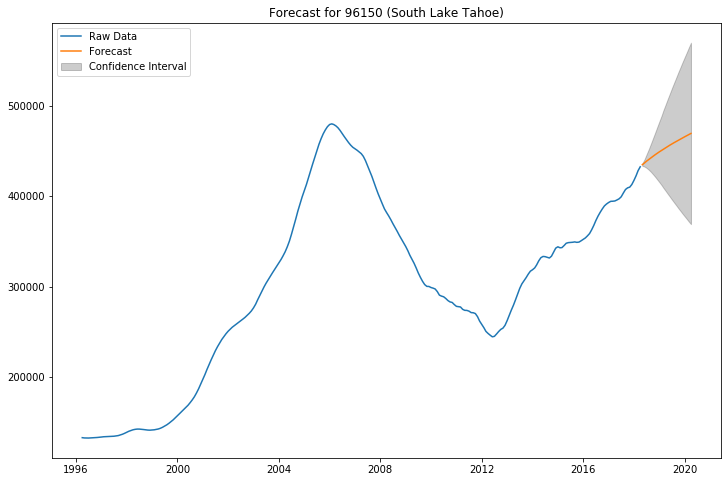

In [417]:
# plot_forecast(df = df_new, figsize=(12,8), geog=None)

plot_forecast(df_new_96150, figsize=(12,8), geog='96150 (South Lake Tahoe)')

### Print summary of predicted, worst-case, and best-case scenarios

In [418]:
slt_96150_pred, slt_96150_low, slt_96150_high = pred_best_worst(pred=forecasted_price_96150, low=forecasted_lower_96150, 
                                                                         high=forecasted_upper_96150, last=last_value_96150, date='April 1, 2020')
slt_96150_pred, slt_96150_low, slt_96150_high

By the model prediction, I would expect to see a 8.539% change in price by April 1, 2020.
At the lower bound of the confidence interval, I would expect to see a -14.673% change in price by April 1, 2020.
At the upper bound of the confidence interval, I would expect to see a 31.75% change in price by April 1, 2020.


(8.539, -14.673, 31.75)

## Zip code  (South Lake Tahoe):  Good potential investment opportunity, with some downside but significant potential upside

By the model prediction, I would expect to see a 8.539% change in price by April 1, 2020.
At the lower bound of the confidence interval, I would expect to see a -14.673% change in price by April 1, 2020.
At the upper bound of the confidence interval, I would expect to see a 31.75% change.

# SacMetro:  95650 (Loomis) -- 

In [419]:
geog_area = '95650'

In [420]:
ts_95650 = df_sac.loc[df_sac['Zip'] == geog_area]  # ts for all of the following functions should have only one zipcode
ts_95650.head()


,Metro,MetroState,CountyName,City,Zip,SizeRank,value
time,,,,,,,
1996-04-01,Sacramento,Sacramento CA,Placer,Loomis,95650,7446,192900.0
1996-05-01,Sacramento,Sacramento CA,Placer,Loomis,95650,7446,193200.0
1996-06-01,Sacramento,Sacramento CA,Placer,Loomis,95650,7446,193400.0
1996-07-01,Sacramento,Sacramento CA,Placer,Loomis,95650,7446,193500.0
1996-08-01,Sacramento,Sacramento CA,Placer,Loomis,95650,7446,193700.0


In [421]:
ts_95650.tail()

,Metro,MetroState,CountyName,City,Zip,SizeRank,value
time,,,,,,,
2017-12-01,Sacramento,Sacramento CA,Placer,Loomis,95650,7446,592000.0
2018-01-01,Sacramento,Sacramento CA,Placer,Loomis,95650,7446,595700.0
2018-02-01,Sacramento,Sacramento CA,Placer,Loomis,95650,7446,604900.0
2018-03-01,Sacramento,Sacramento CA,Placer,Loomis,95650,7446,620100.0
2018-04-01,Sacramento,Sacramento CA,Placer,Loomis,95650,7446,631000.0


In [422]:
# ts = ts.value

ts_95650_values = ts_95650.value

In [423]:
# ts.head()

ts_95650_values.head()

time
1996-04-01    192900.0
1996-05-01    193200.0
1996-06-01    193400.0
1996-07-01    193500.0
1996-08-01    193700.0
Name: value, dtype: float64

In [424]:
ts_95650_values.tail()

time
2017-12-01    592000.0
2018-01-01    595700.0
2018-02-01    604900.0
2018-03-01    620100.0
2018-04-01    631000.0
Name: value, dtype: float64

### Visualizations

#### plot_ts:  Plot zip code(s) of interest over time, with market highs and lows

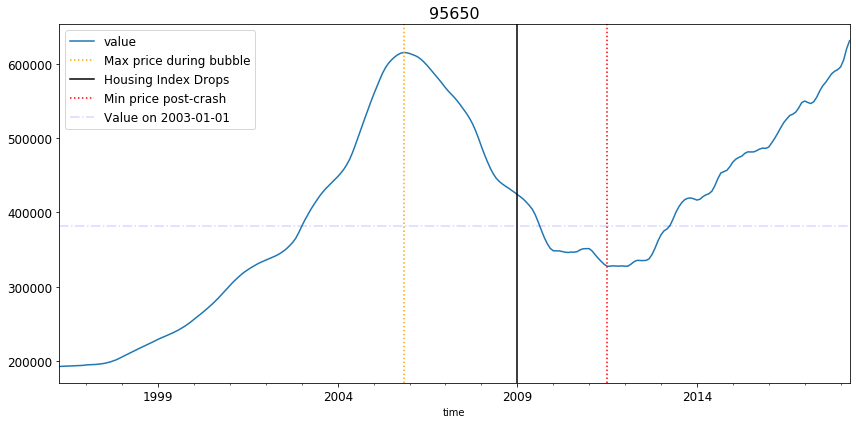

In [425]:
# fig, ax = plot_ts(df_melt, zipcodes=['95616', '92008', '90035', '90025', '60625', '57701'])  # enter desired zip code(s)

fig, ax = plot_ts_zips(df_melt, zipcodes=['95650'], figsize=(12,6))  # enter desired zip code(s)

In [426]:
ts_95650.head(3)

,Metro,MetroState,CountyName,City,Zip,SizeRank,value
time,,,,,,,
1996-04-01,Sacramento,Sacramento CA,Placer,Loomis,95650,7446,192900.0
1996-05-01,Sacramento,Sacramento CA,Placer,Loomis,95650,7446,193200.0
1996-06-01,Sacramento,Sacramento CA,Placer,Loomis,95650,7446,193400.0


#### Boxplot of zip code

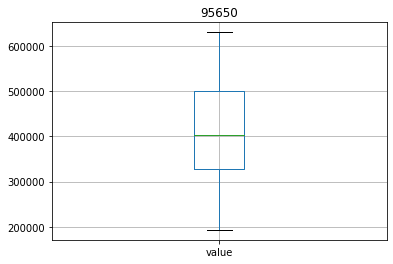

In [427]:
ts_95650.boxplot(column = 'value')
plt.title('95650');


### Plot ACF and PACF for ts dataframe

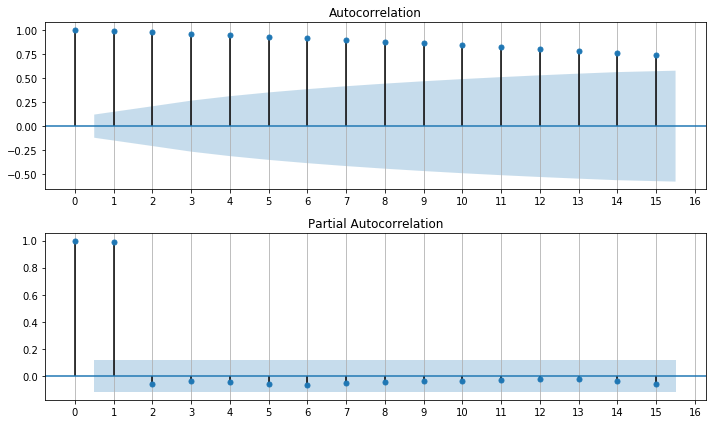

In [428]:
# plot_acf_pacf(ts, figsize=(10,6), lags=15)  # note that ts must only contain values and time as index

plot_acf_pacf(ts_95650_values, figsize=(10,6), lags=15)

### Plot seasonal decomposition for ts dataframe

(<Figure size 1296x432 with 1 Axes>,
 <matplotlib.axes._subplots.AxesSubplot at 0x1a88c9ff98>)

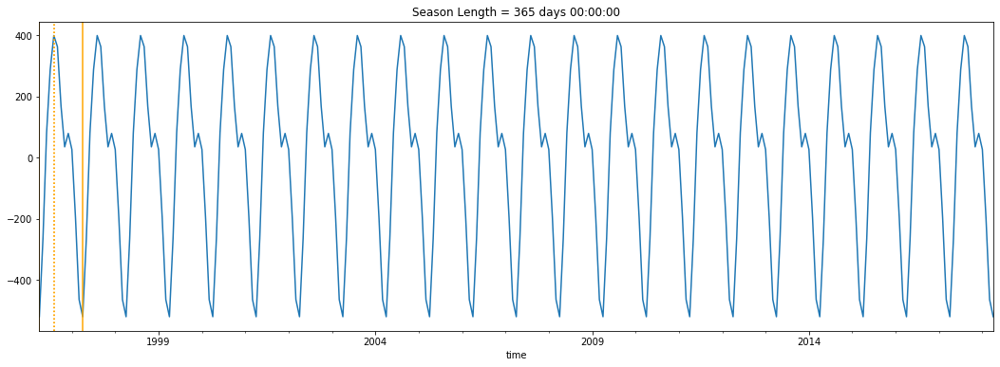

In [429]:
# plot_seasonal_decomp(ts)

plot_seasonal_decomp(ts_95650_values)

# Seasonality does not appear to be a significant factor in this zip code.

## ARIMA model parameters and optimization

### Generate list of (p,d,q) and (p,d,q,m) values

In [430]:
p_values = [0, 1, 2, 4, 6, 8]
d_values = range(0, 3)
q_values = range(0, 3)
warnings.filterwarnings("ignore")

### Run ARIMA model on ts dataframe with list of p,d,q values 

In [431]:
# eval_arima_models(ts, p_values, d_values, q_values)  # don't run this until you have some time, since it take time
# note that ts must only contain values and time as index

# eval_arima_models(ts_95650_values, p_values, d_values, q_values)  # don't run this until you have some time, since it takes time


ARIMA(0, 0, 0) MSE=22120636542.970
ARIMA(0, 0, 1) MSE=5720524905.741
ARIMA(0, 1, 0) MSE=19302568.556
ARIMA(0, 1, 1) MSE=7315425.573
ARIMA(0, 2, 0) MSE=6231114.531
ARIMA(0, 2, 1) MSE=5130711.987
ARIMA(1, 0, 0) MSE=29598471.987
ARIMA(1, 1, 0) MSE=6111535.578
ARIMA(1, 1, 1) MSE=4880477.798
ARIMA(1, 1, 2) MSE=4383811.976
ARIMA(1, 2, 0) MSE=6076844.036
ARIMA(1, 2, 1) MSE=5264886.514
ARIMA(1, 2, 2) MSE=3903317.790
ARIMA(2, 0, 0) MSE=6325514.620
ARIMA(2, 0, 1) MSE=4997859.759
ARIMA(2, 0, 2) MSE=4498506.964
ARIMA(2, 1, 0) MSE=5621984.376
ARIMA(2, 1, 1) MSE=4896575.530
ARIMA(2, 1, 2) MSE=3576577.554
ARIMA(2, 2, 0) MSE=4140583.603
ARIMA(2, 2, 1) MSE=4238380.786
ARIMA(2, 2, 2) MSE=4017283.880
ARIMA(4, 0, 0) MSE=4111207.101
ARIMA(4, 0, 1) MSE=4216562.967
ARIMA(4, 0, 2) MSE=3883289.430
ARIMA(4, 1, 1) MSE=4156833.974
ARIMA(4, 1, 2) MSE=3680089.922
ARIMA(4, 2, 0) MSE=4294747.881
ARIMA(4, 2, 1) MSE=4191771.566
ARIMA(6, 0, 0) MSE=4256945.106
ARIMA(6, 0, 1) MSE=4123238.605
ARIMA(6, 0, 2) MSE=3515704.094

### Generate model fit summary

In [445]:
# model_fit = arima_zipcode(ts, order = None)   # change order = tuple to correspond to the best MSE produced by previous function

# Best ARIMA(8, 1, 2) MSE=3366956.253

model_fit_95650 = arima_zipcode(ts_95650_values, order = (8, 1, 2))


                             ARIMA Model Results                              
Dep. Variable:                    D.y   No. Observations:                  264
Model:                 ARIMA(8, 1, 2)   Log Likelihood               -2201.328
Method:                       css-mle   S.D. of innovations           1000.078
Date:                Thu, 12 Mar 2020   AIC                           4426.656
Time:                        11:51:34   BIC                           4469.568
Sample:                             1   HQIC                          4443.899
                                                                              
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const       1659.4699   1494.999      1.110      0.268   -1270.675    4589.615
ar.L1.D.y      0.4151      0.082      5.034      0.000       0.253       0.577
ar.L2.D.y      0.2131      0.092      2.324      0.0

## ARIMA modeling results:  predictions and visualization

### Produce forecasts from ARIMA model fit

In [446]:
actual_forecast_95650, std_error_95650, forecast_confint_95650 = forecast(model_fit_95650)


In [447]:
actual_forecast_95650, std_error_95650, forecast_confint_95650

(array([634277.69109838, 635625.08535961, 639716.92007986, 645584.90875841,
        651437.71881756, 654828.23073506, 657747.84599825, 661682.09598216,
        666060.29361133, 670116.36252866, 673564.71861334, 676515.25606108,
        679897.77246092, 683357.78571243, 686590.31842162, 689621.15617014,
        692475.31580759, 695343.68292305, 698297.17914123, 701068.91856723,
        703750.55790437, 706366.63714583, 708929.0972989 , 711493.45531034]),
 array([ 1000.07762263,  3075.44248739,  5671.45733922,  8252.77805401,
        10812.47799412, 13411.96489841, 16209.79652753, 19150.15463648,
        22114.45338581, 25076.43479378, 28066.32451172, 31095.14762422,
        34168.05652351, 37242.35194208, 40307.54480579, 43371.32214506,
        46433.79396079, 49491.18355035, 52536.56708364, 55560.27084523,
        58566.53777541, 61554.27431883, 64520.61382691, 67463.89188508]),
 array([[632317.57497628, 636237.80722047],
        [629597.3288478 , 641652.84187142],
        [628601.0679

### Create dataframe to hold forecast results

In [448]:
# df_forecast = forecast_df(col = 'time', daterange = pd.date_range(start='2018-05-01', end='2020-04-01', freq='MS'), 
#                 actual_forecast=actual_forecast, forecast_confint = forecast_confint)

df_forecast_95650 = forecast_df(actual_forecast_95650, forecast_confint_95650, col = 'time', 
                                daterange = pd.date_range(start='2018-05-01', end='2020-04-01', freq='MS'))

### Create new dataframe concatenating historic values and forecast results

In [449]:
# df_new = concat_values_forecast(ts, df_forecast)

df_new_95650 = concat_values_forecast(ts_95650_values, df_forecast_95650)

In [450]:
df_new_95650

,value,forecast,forecast_lower,forecast_upper
time,,,,
1996-04-01,192900.0,NaN,NaN,NaN
1996-05-01,193200.0,NaN,NaN,NaN
1996-06-01,193400.0,NaN,NaN,NaN
1996-07-01,193500.0,NaN,NaN,NaN
1996-08-01,193700.0,NaN,NaN,NaN
1996-09-01,193800.0,NaN,NaN,NaN
1996-10-01,194100.0,NaN,NaN,NaN
1996-11-01,194200.0,NaN,NaN,NaN
1996-12-01,194500.0,NaN,NaN,NaN


### Calculate predicted, lower bound, and upper bound forecasted prices

In [451]:
forecasted_price_95650, forecasted_lower_95650, forecasted_upper_95650 = forecast_values(df_new_95650)

In [452]:
forecasted_price_95650, forecasted_lower_95650, forecasted_upper_95650  # predicted, best-case, and worst-case prices in 2020


(711493.4553103431, 579266.6569586811, 843720.2536620051)

In [453]:
last_value_95650 = df_new_95650['value'].loc['2018-04-01']

In [454]:
last_value_95650

631000.0

### Plot forecast with confidence intervals

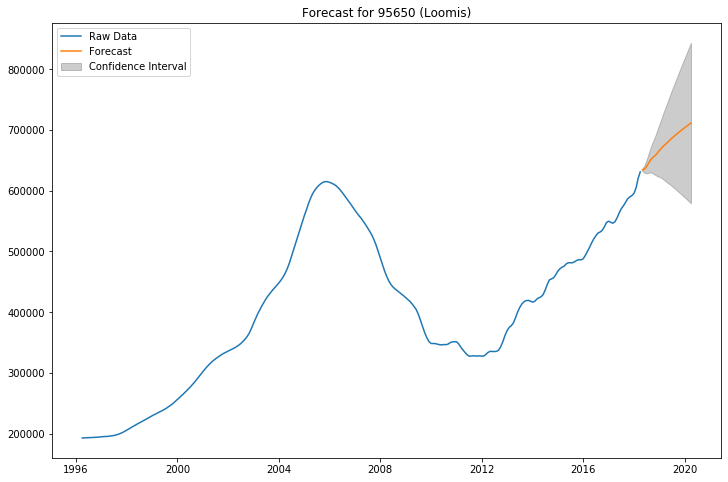

In [455]:
# plot_forecast(df = df_new, figsize=(12,8), geog=None)

plot_forecast(df_new_95650, figsize=(12,8), geog='95650 (Loomis)')

### Print summary of predicted, worst-case, and best-case scenarios

In [456]:
loomis_95650_pred, loomis_95650_low, loomis_95650_high = pred_best_worst(pred=forecasted_price_95650, low=forecasted_lower_95650, 
                                                                         high=forecasted_upper_95650, last=last_value_95650, date='April 1, 2020')
loomis_95650_pred, loomis_95650_low, loomis_95650_high

By the model prediction, I would expect to see a 12.756% change in price by April 1, 2020.
At the lower bound of the confidence interval, I would expect to see a -8.199% change in price by April 1, 2020.
At the upper bound of the confidence interval, I would expect to see a 33.712% change in price by April 1, 2020.


(12.756, -8.199, 33.712)

## Zip code 95650 (Loomis):  Strong investment opportunity

By the model prediction, I would expect to see a 12.756% change in price by April 1, 2020.
At the lower bound of the confidence interval, I would expect to see a -8.199% change in price by April 1, 2020.
At the upper bound of the confidence interval, I would expect to see a 33.712% change in price by April 1, 2020.


# Dataframe summarizing findings

In [457]:
zipcodes = ['95616', '95619', '95864', '95831', '96142', '95811', '95818', '95630', '96140', '95672', '95636', 
            '95709','95746', '95614', '95663', '95623', '95747', '95765', '95602', '96150' , '95650']
len(zipcodes)

21

In [458]:
last_value_2018 = [last_value_95616, last_value_95619, last_value_95864, last_value_95831, last_value_96142, last_value_95811,
                  last_value_95818, last_value_95630, last_value_96140, last_value_95672, last_value_95636, last_value_95709,
                  last_value_95746, last_value_95614, last_value_95663, last_value_95623, last_value_95747, last_value_95765, 
                   last_value_95602, last_value_96150, last_value_95650]

NameError: name 'last_value_95616' is not defined

In [326]:
len(last_value_2018)
# last_value_2018

NameError: name 'last_value_2018' is not defined

In [327]:
cities = ['Davis', 'Diamond Springs', 'Arden-Arcade', 'Sacramento', 'Tahoma', 'Sacramento', 'Sacramento', 'Folsom', 
          'Carnelian Bay', 'Rescue', 'Somerset', 'Camino', 'Granite Bay', 'Cool', 'Penryn', 'El Dorado', 
         'Roseville', 'Rocklin', 'Auburn', 'South Lake Tahoe', 'Loomis']
len(cities)

19

In [328]:
population = [45500, 4359, 92186, 42952, 1037, 7630, 21825, 74111, 1170, 4592, 1000, 4354, 22482, 3882, 2468, 3986,
             72437, 41810, 18290, 30000, 12600]
len(population)

19

In [329]:
county = ['Yolo', 'El Dorado', 'Sacramento', 'Sacramento', 'El Dorado', 'Sacramento', 'Sacramento', 'Sacramento', 
          'Placer', 'El Dorado', 'El Dorado', 'El Dorado', 'Placer', 'El Dorado', 'Placer', 'El Dorado', 
          'Placer', 'Placer', 'Placer', 'El Dorado', 'Placer']
print(len(county))

19


In [330]:
invest_rec = ['no','maybe', 'no', 'no', 'maybe', 'no', 'no', 'no', 'maybe', 'yes', 'maybe', 'no', 'yes', 
              'no', 'yes', 'maybe', 'maybe', 'yes', 'yes', '?', '?']
len(invest_rec)

19

In [1617]:
pred_value_pct_change = [davis_95616_pred, diamond_springs_95619_pred, arden_95864_pred, sac_pocket_95831_pred, tahoma_96142_pred, 
              sac_95811_pred, sac_95818_pred, folsom_95630_pred, cb_96140_pred, rescue_95672_pred, 
              somerset_95636_pred, camino_95709_pred, gb_95746_pred, cool_95614_pred, penryn_95663_pred, 
             eldorado_95623_pred, roseville_95747_pred, rocklin_95765_pred, auburn_95602_pred, slt_96150_pred, loomis_95650_pred]


In [1618]:
len(pred_value_pct_change)

19

In [1619]:
worst_case_pct_change = [davis_95616_lower, diamond_springs_95619_low, arden_95864_low, sac_pocket_95831_low, tahoma_96142_low, 
              sac_95811_low, sac_95818_low, folsom_95630_low, cb_96140_low, rescue_95672_low, 
              somerset_95636_low, camino_95709_low, gb_95746_low, cool_95614_low, penryn_95663_low, eldorado_95623_low, 
             roseville_95747_low, rocklin_95765_low, auburn_95602_low, slt_96150_low, loomis_95650_low]

In [1620]:
len(worst_case_pct_change)

19

In [1621]:
best_case_pct_change = [davis_95616_upper, diamond_springs_95619_high, arden_95864_high, sac_pocket_95831_high, tahoma_96142_high, 
             sac_95811_high, sac_95818_high, folsom_95630_high, cb_96140_high, rescue_95672_high, 
             somerset_95636_high, camino_95709_high, gb_95746_high, cool_95614_high, penryn_95663_high, eldorado_95623_high, 
            roseville_95747_high, rocklin_95765_high, auburn_95602_high, slt_96150_high, loomis_95650_high]

In [1622]:
len(best_case_pct_change)

19

In [1623]:
df_findings = pd.DataFrame({'ZIP code': zipcodes, '2018 value': last_value_2018, 'City': cities, 'Pop': population, 'County': county, 
                            'Invest?': invest_rec, 'Predicted':pred_value_pct_change, 'Worst Case':worst_case_pct_change, 
                            'Best Case':best_case_pct_change})

In [1624]:
df_findings

,ZIP code,2018 value,City,Pop,County,Invest?,Predicted,Worst Case,Best Case
0,95616,692300.0,Davis,45500,Yolo,no,1.756,-14.007,17.518
1,95619,321100.0,Diamond Springs,4359,El Dorado,maybe,10.799,-14.266,35.863
2,95864,552700.0,Arden-Arcade,92186,Sacramento,no,-4.669,-26.572,17.233
3,95831,449300.0,Sacramento,42952,Sacramento,no,-13.413,-32.770,5.945
4,96142,523600.0,Tahoma,1037,El Dorado,maybe,9.791,-15.663,35.246
5,95811,567500.0,Sacramento,7630,Sacramento,no,2.254,-17.073,21.582
6,95818,563900.0,Sacramento,21825,Sacramento,no,-0.978,-25.772,23.816
7,95630,542900.0,Folsom,74111,Sacramento,no,0.538,-21.171,22.247
8,96140,644600.0,Carnelian Bay,1170,Placer,maybe,19.421,-19.639,58.480
9,95672,579300.0,Rescue,4592,El Dorado,yes,32.296,-2.975,67.567


In [1625]:
df_findings.set_index('ZIP code', inplace=True)

In [1627]:
df_findings.sort_values(by='Predicted', ascending=False, inplace=True)

In [1633]:
df_findings

,2018 value,City,Pop,County,Invest?,Predicted,Worst Case,Best Case
ZIP code,,,,,,,,
95672,579300.0,Rescue,4592,El Dorado,yes,32.296,-2.975,67.567
96140,644600.0,Carnelian Bay,1170,Placer,maybe,19.421,-19.639,58.480
95663,600700.0,Penryn,2468,Placer,yes,13.679,-8.334,35.692
95602,488700.0,Auburn,18290,Placer,yes,11.831,-7.957,31.619
95765,509200.0,Rocklin,41810,Placer,yes,11.779,-8.471,32.029
95636,241200.0,Somerset,1000,El Dorado,maybe,11.207,-38.231,60.646
95619,321100.0,Diamond Springs,4359,El Dorado,maybe,10.799,-14.266,35.863
96142,523600.0,Tahoma,1037,El Dorado,maybe,9.791,-15.663,35.246
95623,455700.0,El Dorado,3986,El Dorado,maybe,8.258,-14.768,31.285


## Visualization of semi-finalist ZIP codes

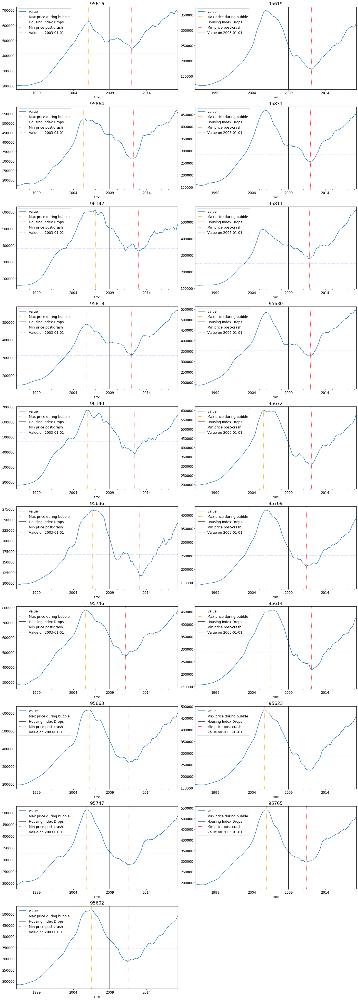

In [336]:
fig, ax = plot_ts_zips(df_sac, zipcodes, nrows=10, ncols=2, figsize=(18, 50), legend=True)


## Visualization of semi-finalist ZIP codes, labeled with ZIP and city


### Create function to automate plotting of semifinalist ZIP codes with city and ZIP labels

In [364]:
def zip_semifinalists(df, dict_zip_city, col = 'value', nrows=10, ncols=2, figsize=(18, 40), legend=True):

    fig = plt.figure(figsize=figsize)

    for i, key in enumerate(dict_zip_city.keys(), start=1):
        ax = fig.add_subplot(nrows, ncols, i)   
        ts = df[col].loc[df['Zip'] == key]
        try: 
            max_ = ts.loc['2004':'2011'].idxmax()  
        except:
            continue

        crash = '01-2009'
        min_ = ts.loc[crash:].idxmin()
        ts.plot(ax=ax, fontsize=12)   
        plt.title(f'{dict_zip_city[key]} ({key})', fontsize=16)

        ax.axvline(max_, label = 'Maximum value during bubble', color = 'orange', ls=':')               
        ax.axvline(crash, label = 'Housing market declines', color='black')                         
        ax.axvline(min_, label = 'Minimum value after crash', color = 'red', ls=':')
        ax.axvline('2003-01-01', label='Value on 2003-01-01', color = 'blue', ls='-.', alpha=0.15)   # for label, insert the following:  label='2003-01-01'
        ax.legend(loc='upper right')

        fig.tight_layout()
        
    return fig, ax


### Create dictionary of each ZIP code and the city to which it belongs



In [368]:
dict_semifinal_zips_city = dict(zip(zipcodes, cities))
dict_semifinal_zips_city

{'95616': 'Davis',
 '95619': 'Diamond Springs',
 '95864': 'Arden-Arcade',
 '95831': 'Sacramento',
 '96142': 'Tahoma',
 '95811': 'Sacramento',
 '95818': 'Sacramento',
 '95630': 'Folsom',
 '96140': 'Carnelian Bay',
 '95672': 'Rescue',
 '95636': 'Somerset',
 '95709': 'Camino',
 '95746': 'Granite Bay',
 '95614': 'Cool',
 '95663': 'Penryn',
 '95623': 'El Dorado',
 '95747': 'Roseville',
 '95765': 'Rocklin',
 '95602': 'Auburn'}

### Run function to generate plots for all ZIP codes

(<Figure size 1296x2880 with 19 Axes>,
 <matplotlib.axes._subplots.AxesSubplot at 0x1ae6945128>)

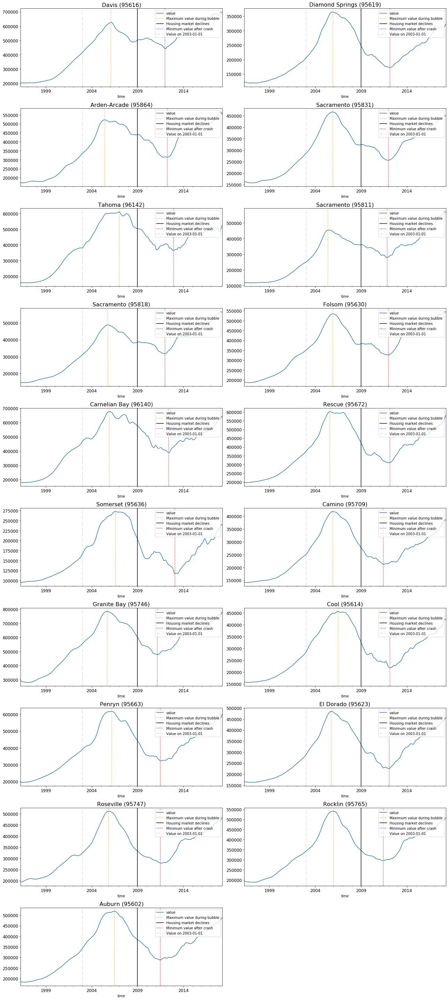

In [367]:
zip_semifinalists(df_sac, dict_semifinal_zips_city, col = 'value', nrows=10, ncols=2, figsize=(18, 40), legend=True)

## Create 6 ZIP plots at one time (PowerPoint-friendlier format)

### Need to first create subset dictionaries to plot over

In [ ]:
def return_slice(dictionary, m, n):
    slice = {k: dictionary[k] for k in list(dictionary)[m:n]}
    return slice


In [359]:
dict_semi_0_6 = return_slice(dict_semifinal_zips_city, 0, 6)
dict_semi_0_6

{'95616': 'Davis',
 '95619': 'Diamond Springs',
 '95864': 'Arden-Arcade',
 '95831': 'Sacramento',
 '96142': 'Tahoma',
 '95811': 'Sacramento'}

In [360]:
dict_semi_6_12 = return_slice(dict_semifinal_zips_city, 6, 12)
dict_semi_6_12

{'95818': 'Sacramento',
 '95630': 'Folsom',
 '96140': 'Carnelian Bay',
 '95672': 'Rescue',
 '95636': 'Somerset',
 '95709': 'Camino'}

In [361]:
dict_semi_12_18 = return_slice(dict_semifinal_zips_city, 12, 18)
dict_semi_12_18

{'95746': 'Granite Bay',
 '95614': 'Cool',
 '95663': 'Penryn',
 '95623': 'El Dorado',
 '95747': 'Roseville',
 '95765': 'Rocklin'}

In [362]:
dict_semi_18_19 = return_slice(dict_semifinal_zips_city, 18, 19)
dict_semi_18_19

{'95602': 'Auburn'}

### Run function on subset dictionaries

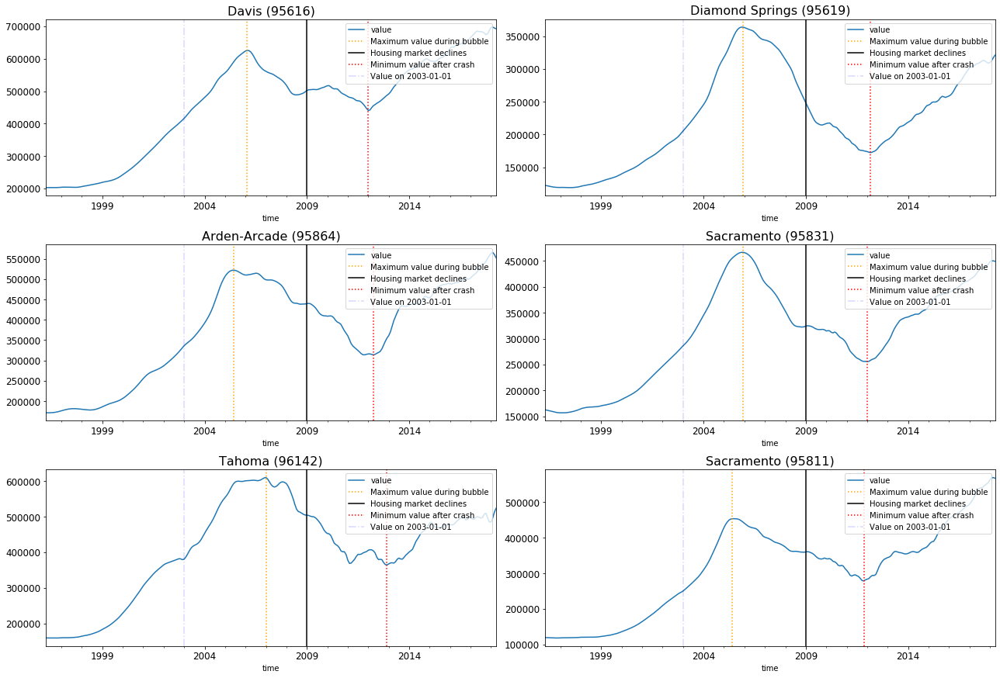

In [370]:
zip_semifinalists(df_sac, dict_semi_0_6, col = 'value', nrows=10, ncols=2, figsize=(18, 40), legend=True);

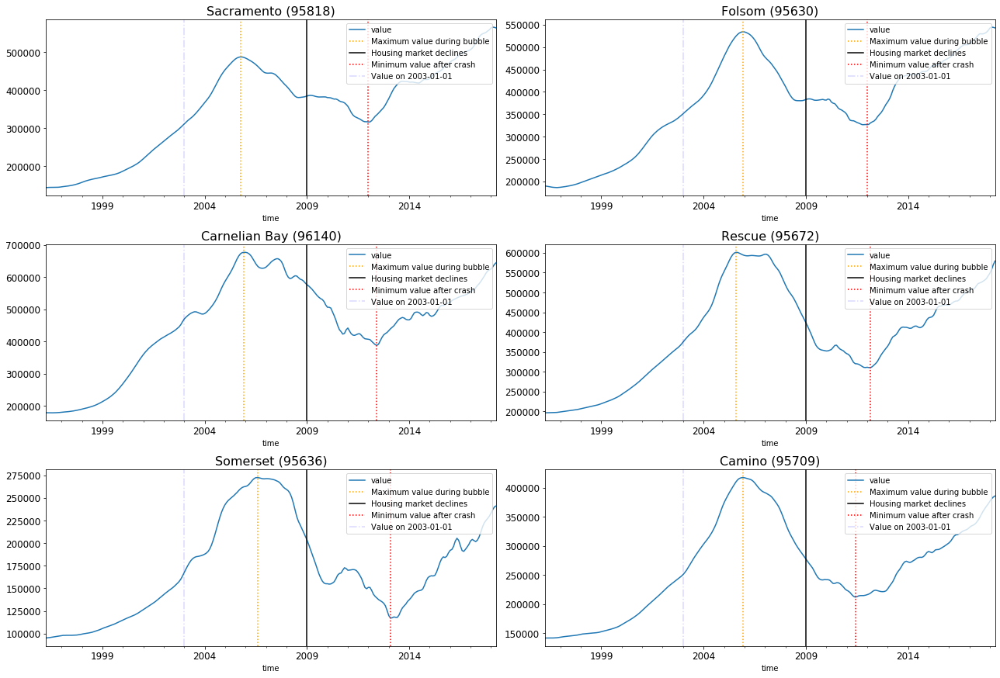

In [371]:
zip_semifinalists(df_sac, dict_semi_6_12, col = 'value', nrows=10, ncols=2, figsize=(18, 40), legend=True);

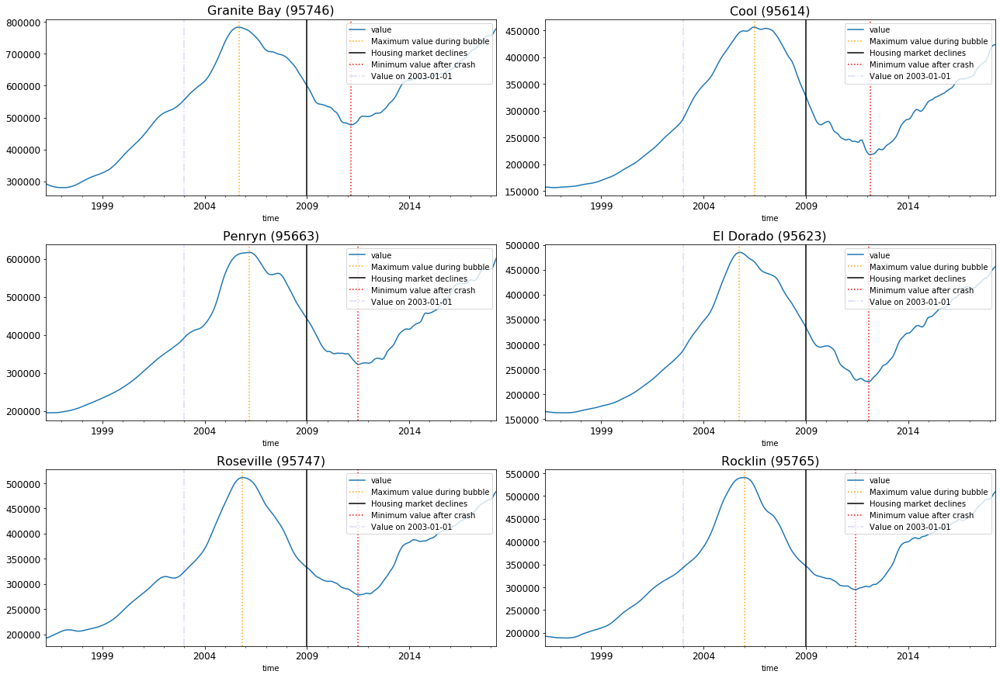

In [372]:
zip_semifinalists(df_sac, dict_semi_12_18, col = 'value', nrows=10, ncols=2, figsize=(18, 40), legend=True);

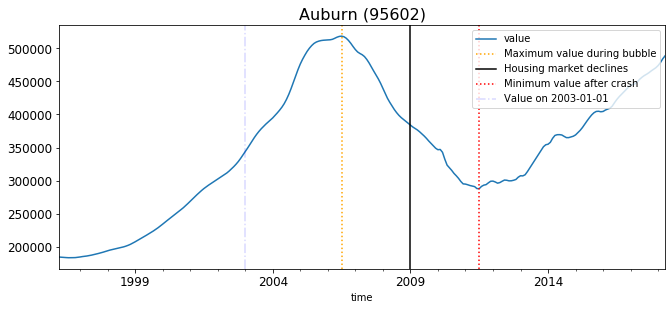

In [373]:
zip_semifinalists(df_sac, dict_semi_18_19, col = 'value', nrows=10, ncols=2, figsize=(18, 40), legend=True);

# Recommended ZIP Codes

## Decision-making process

*First,* I sorted ZIP codes based on __predicted return__.  This is how the summary table is sorted.  

*Second,* I considered the potential __worst-case valuation scenario__.  
- There are a few ZIP codes that have relatively good predicted valuations over the two-year time horizon, but also have substantial potential downside.  Examples include Carnelian Bay, Somerset, Diamond Springs, Tahoma, El Dorado, and Roseville.  
- Because of the significant possible downsides of these ZIP codes, I put them in the 'maybe' column.  I subsequently removed them after the considerations below.

*Third,* I reviewed the potential __best-case valuation scenario,__ just to see how much potential upside the ZIP code could yield.  
- Since time series predictions are so uncertain--as illustrated by the large differences between the upper bound and lower bound values--I don't put much weight on the upper end of potential yields.  
- Predicted values as well as downside risk are more important, but looking at the best-case scenario can suggest whether a higher return is more likely.  

*Finally,* I looked at the __population__ in each ZIP code, as well as the __geographic location__ of the ZIP code.  Doing this caused me to modify my initial assessment (and prompted me to analyze more ZIP codes).  
- Several of the "maybe"s on the chart are for very small towns clustered around Lake Tahoe.  I would recommend against selecting more than one of these ZIP codes for the top 5.  
   - For one thing, the towns are very small, so the pool of potential investment opportunities in each is small. 
   - For another thing, many of the homes in these towns are vacation homes, so a significant economic downturn could cause a significant drop in prices.  
   - Third, the region's economy is based almost entirely on tourism (especially skiing in the winter and water sports in the summer).  Economic downturns could depress housing values in the near term, while larger trends such as climate change may have a significant long-term effect (e.g., less natural snowpack in the winter). 


## Top 5 ZIP codes the Sacramento Metro region:

1.  *Rescue, CA (95672).*  While the population is fairly small, average home values are high.  Home values for the ZIP code in 4/1/2020 are forecasted to be ___32% higher___ than they are now.  Furthermore, the downside is very limited (~3%) and the upside is potentially large (68%).

2.  *Penryn, CA (95663).*  The population here is small, but average home values are even higher than Rescue.  While Rescue is in El Dorado County, Penryn is in Placer County, offering a bit of geographic diversity.  Penryn's home values are predicted to rise ___almost 14% higher___ by 4/1/2020.  Downside is limited (8.3% at the lower bound) and upside is potentially substantial (over 35%).  

3.  *Auburn, CA (95602).* Auburn's population is significantly larger than the first two, offering additional investment opportunities and stablity within one ZIP code.  Its location in the foothills of the Sierra Nevada is desireable for many homebuyers, as evidenced by the average home value.  Home values are predicted to ___increase 11.8%___ over 24 months, with minimal downside (-8% at the lower bound) and substantial potential upside (31.6%).

4.  *Rocklin, CA (95765).*  This ZIP code's population (almost 42,000) is larger than Auburn, Rescue, and Penryn put together, and so offers a wider range of opportunities, both expensive and affordable.  The model predicts an ___11.8% increase___ in home values, with a potential lower-bound downside of -8.5% and a large potential upside at 32%.  

5.  *Granite Bay, CA (95746).*  This ZIP code represents an affluent community on the west-northwest side of Folsom Lake.  Home values in this very desireable location are expected to ___increase 7.9%___, with a potential downside of -9.6% and significant possible upside of 25.4%



## Maps

### Sacramento metro area county map

<center><img src='images/Sac_metro_counties_map.png' height=80% width=80%>

### El Dorado County

<center><img src='images/ElDorado_Cty_map.png' height=80% width=80%>

### Placer County

<center><img src='images/Placer_cty_map.png' height=80% width=80%>

### Rescue, CA (95672) ZIP code map (El Dorado County)

<center><img src='images/Rescue_95672_map.png' height=50% width=50%>

### Penryn, CA (95663) ZIP code map (Placer County)

<center><img src='images/Penryn_95663_map.png' height=50% width=50%>

### Auburn, CA (95602) ZIP code map (Placer County)

<center><img src='images/Auburn_95602_map.png' height=50% width=50%>

### Rocklin, CA (95765) ZIP code map (Placer County)

<center><img src='images/Rocklin_95765_map.png' height=50% width=50%>

### Granite Bay, CA (95746) ZIP code map (Placer County)

<center><img src='images/GraniteBay_95746_map.png' height=50% width=50%>

# Ancillary functions

In [ ]:
fig = plt.figure(figsize=(16,40))

for i, key in enumerate(dict_semifinal_zips_city.keys(), start=1):
    ax = fig.add_subplot(10, 2, i)   
    ts = df_sac['value'].loc[df_sac['Zip'] == key]
    try: 
        max_ = ts.loc['2004':'2011'].idxmax()  
    except:
        continue

    crash = '01-2009'
    min_ = ts.loc[crash:].idxmin()
    ts.plot(ax=ax, fontsize=12)   
    plt.title(f'{dict_semifinal_zips_city[key]} ({key})', fontsize=16)

    ax.axvline(max_, label = 'Maximum value during bubble', color = 'orange', ls=':')               
    ax.axvline(crash, label = 'Housing market declines', color='black')                         
    ax.axvline(min_, label = 'Minimum value after crash', color = 'red', ls=':')
    ax.axvline('2003-01-01', label='Value on 2003-01-01', color = 'blue', ls='-.', alpha=0.15)   # for label, insert the following:  label='2003-01-01'

    fig.tight_layout()
